<a target="_blank" href="https://colab.research.google.com/github/cboettig/rl-minicourse/blob/main/challenge.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

#  RL4Salmon Parameter Tests

In this example, we set up a generic three species, two action problem, and illustrate how to provide a custom population dynamics function, action function, and utility function to represent a caribou conservation objective.  

In [ ]:
# we'll need these packages to begin
!pip install stable-baselines3 plotnine polars sb3_contrib tensorboard


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 183.9/183.9 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.8/92.8 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 16.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 15.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 9.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 53.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
 

In [ ]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1" # change to -1 if you want to use CPU

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
# pop = seals, lamprey, salmon
# Salmon Scenario
def dynamics(pop, effort, population_parameters, harvest_fn, p, timestep=1):

    pop = harvest_fn(pop, effort)
    X, Y, Z = pop[0], pop[1], pop[2]

    K_x = p["K_x"] + population_parameters[0]
    K_y = p["K_y"] + population_parameters[1]
    K_z = p["K_z"]
    v_x = p["v_x"]
    v_y = p["v_y"]
    h_x = p["h_x"]
    h_y = p["h_y"]
    D = p["D"]

    X += (p["r_x"] * X * (1 - X / K_x )
            - (Z * p["beta"] * (X**2)) / (v_x**2 + h_x * X**2 + h_y * Y**2)
            + p["sigma_x"] * X * np.random.normal()
            )

    Y += (p["r_y"] * Y * (1 - Y  / K_y )
            - (Z * p["beta"] * (Y**2)) / (v_y**2 + h_x * X**2 + h_y * Y**2)
            + p["sigma_y"] * Y * np.random.normal()
            )

    Z += p["alpha"] * p["beta"] * Z * (
            (X**2) / (v_x**2 + h_x * X**2 + h_y * Y**2)
            + (Y**2) / (v_y**2 + h_x * X**2 + h_y * Y**2)
            ) - p["dH"] * Z +  p["sigma_z"] * Z  * np.random.normal()

    pop = np.array([X, Y, Z], dtype=np.float32)
    pop = np.clip(pop, [0,0,0], [np.Inf, np.Inf, np.Inf])
    return(pop)


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


Here, we change the sigma values to be negligible at 0.001 so that we can better visualize the underlying patterns in our environment. We also change the alpha value (seal growth rate) to be 0.05 to more accurately decrease the large timescale of the seal population.

In [ ]:
initial_pop = [0.5, 0.5, 0.2]


parameters = {
"r_x": np.float32(0.13),
"r_y": np.float32(0.2),
"r_z": np.float32(0.05),
"K_x": np.float32(0.5),
"K_y": np.float32(0.5),
"K_z": np.float32(1),
"h_x": np.float32(0.5),
"h_y": np.float32(0.5),
"v_x": np.float32(0.5),
"v_y": np.float32(0.5),
"beta": np.float32(.1),
"v0":  np.float32(0.1),
"D": np.float32(0.5),
"tau_yx": 0,
"tau_xy": 0,
"alpha": np.float32(.4),
"dH": np.float32(0.001),
"sigma_x": np.float32(0.001),
"sigma_y": np.float32(0.001),
"sigma_z": np.float32(0.001)
}


We must also define the dynamics of the action, a 'harvest' or culling function.  In this scenario, we imagine that we can cull either the salmon or pinniped population (or both).  We assume our control action introduces a percent mortality equal to the control effort applied times a catachability coefficient:

In [ ]:
def harvest(pop, effort):
    q0 = 0.5 # catchability coefficients -- erradication is impossible
    q2 = 0.5
    pop[0] = pop[0] * (1 - effort[0] * q0) # pop 0, seals
    pop[2] = pop[2] * (1 - effort[1] * q2) # pop 2, salmon
    return pop


Lastly, we need to define the utility or reward derived from taking these actions under this population state.  In this scenario, our population control actions are costly, while we acrue a benefit proportional to the size of the current salmon population:

In [ ]:
def utility(pop, effort):
    benefits = 0.5 * pop[1] # benefit from Salmon
    costs = .00001 * (effort[0] + effort[1]) # cost to culling
    if np.any(pop <= 0.01):
        benefits -= 1
    return benefits - costs




To simulate our environment and allow RL algorithms to train on this environment, we define a simple python class using the gym module.  This class defines the possible action space as two continuously-valued action variables (culling effort of salmon and pinnipeds respectively), and three continuously valued state variables (population of salmon, lamprey and pinnipeds).  To improve performance of RL training, it is necessary to transform the continuous space to -1, 1

In [ ]:
import gymnasium as gym

class s3a2(gym.Env):
    """A 3-species ecosystem model with two control actions"""
    def __init__(self, config=None):
        config = config or {}

        ## these parameters may be specified in config
        self.Tmax = config.get("Tmax", 10000)
        self.threshold = config.get("threshold", np.float32(1e-4))
        self.init_sigma = config.get("init_sigma", np.float32(1e-3))
        self.training = config.get("training", True)
        self.initial_pop = config.get("initial_pop", initial_pop)
        self.parameters = config.get("parameters", parameters)
        self.dynamics = config.get("dynamics", dynamics)
        self.harvest = config.get("harvest", harvest)
        self.utility = config.get("utility", utility)
        self.observe = config.get("observe", lambda state: state) # default to perfectly observed case
        self.bound = 2 * self.parameters["K_x"]

        self.action_space = gym.spaces.Box(
            np.array([-1, -1, 0, 0], dtype=np.float32),
            np.array([1, 1, 0.1, 0.1], dtype=np.float32),
            dtype = np.float32
        )
        self.observation_space = gym.spaces.Box(
            np.array([-1, -1, -1], dtype=np.float32),
            np.array([1, 1, 1], dtype=np.float32),
            dtype=np.float32,
        )
        self.reset(seed=config.get("seed", None))


    def reset(self, *, seed=None, options=None):
        self.timestep = 0
        self.initial_pop += np.multiply(self.initial_pop, np.float32(self.init_sigma * np.random.normal(size=3)))
        self.state = self.state_units(self.initial_pop)
        info = {}
        return self.observe(self.state), info


    def step(self, action):
        action = np.clip(action, self.action_space.low, self.action_space.high)
        pop = self.population_units(self.state) # current state in natural units
        human_actions = action[:2]
        pop_params = action[2:]
        effort = (human_actions + 1.) / 2

        # harvest and recruitment
        reward = self.utility(pop, effort)
        nextpop = self.dynamics(pop, effort, pop_params, self.harvest, self.parameters, self.timestep)

        self.timestep += 1
        terminated = bool(self.timestep > self.Tmax)

        # in training mode only: punish for population collapse
        if any(pop <= self.threshold) and self.training:
            terminated = True
            reward -= 50/self.timestep

        self.state = self.state_units(nextpop) # transform into [-1, 1] space
        observation = self.observe(self.state) # same as self.state
        return observation, reward, terminated, False, {}

    def state_units(self, pop):
        self.state = 2 * pop / self.bound - 1
        self.state = np.clip(self.state,
                             np.repeat(-1, self.state.__len__()),
                             np.repeat(1, self.state.__len__()))
        return np.float32(self.state)

    def population_units(self, state):
        pop = (state + 1) * self.bound /2
        return np.clip(pop,
                       np.repeat(0, pop.__len__()),
                       np.repeat(np.Inf, pop.__len__()))

# verify that the environment is defined correctly
from stable_baselines3.common.env_checker import check_env
env = s3a2()
check_env(env, warn=True)


Here, we create a function to run a simulation of an episode by inputting an action, plotting the graph of the population proportions over time, and printing the population summary statistics including end population, mean, max, min, variance, and standard deviation. We also create a function to plot a phase plane of an episode which better visualizes the end behavior through limit cycles which are highlighted in yellow on the plot as yellow represents the end of the episode.

In [ ]:
from scipy.optimize import minimize
import polars as pl
from plotnine import ggplot, aes, geom_line, geom_path, labs

def get_last(col):
  return col.iloc[-1]

def get_func_pop(df, func):
  pd_df = df.to_pandas()
  func_pops = pd_df[["X", "Y", "Z"]].apply(func, axis=0)
  return func_pops

def obtain_simulated_data(action, timesteps=env.Tmax, env=env):
  df = []
  episode_reward = 0
  observation, _ = env.reset()
  for t in range(timesteps):
    obs = env.population_units(observation) # natural units
    df.append([t, episode_reward, *obs])
    observation, reward, terminated, done, info = env.step(action)
    episode_reward += reward

  df = pl.DataFrame(df, schema=["t", "reward", "X", "Y", "Z"])
  return df

def plot_simulation(df):
  cols = ["t", "reward", "X", "Y", "Z"]

  dfl = (pl.DataFrame(df, schema=cols).
          select(["t", "X", "Y", "Z"]).
          melt("t")
        )
  p = ggplot(dfl, aes("t", "value", color="variable")) + geom_path() + labs(title = "Environment Change Simulation")
  display(p)

def plot_phase_plane(df, X = "X", Y = "Y"):
  cols = ["t", "reward", "X", "Y", "Z"]

  dfl = (pl.DataFrame(df, schema=cols).
          select(["t", "X", "Y", "Z"])
        )
  p = ggplot(dfl, aes(X, Y, color="t")) + geom_path() + labs(title = "Environment Phase Plane Plot")
  display(p)


def run_simulation(action, timesteps=env.Tmax, env=env, focus=("X", "Y"), plot_funcs=(True, True)):
  df = obtain_simulated_data(action, timesteps, env)
  plot_simulation(df) if plot_funcs[0] else None
  X, Y = focus
  plot_phase_plane(df, X, Y) if plot_funcs[1] else None
  func_list = [get_last, np.mean, np.max, np.min, np.var, np.std]
  for func in func_list:
    display_final_pop(df, func)

def display_final_pop(df, func):
  info_dict = {get_last: "Final Population", np.mean: "Mean Population", np.max: "Max Population",
               np.min: "Min Population", np.var: "Population Variance", np.std: "Population SD"}
  func_pops = get_func_pop(df, func)
  func_suffix = info_dict[func]

  salmon_str = f"Salmon {func_suffix}: {func_pops[0]:.2f}"
  lamprey_str = f"Lamprey {func_suffix}: {func_pops[1]:.2f}"
  pinniped_str = f"Pinniped {func_suffix}: {func_pops[2]:.2f}"
  print(salmon_str + "\n" + lamprey_str + "\n" + pinniped_str + "\n")

zero_action = [-1, -1, 0, 0]

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Now, we wish to test the zero action but on environments with different carrying capacity parameters and different growth rate parameters. We create a function to accomplish this task. We also want to consider the case with the higher non-changed alpha of 0.4 to better visualize the limit cycles, so that is added as a separate parameter. We use a default of 3200 timesteps and plot carrying capacities from 0.5 to 1.5 with increments of 0.2, and plot growth rates from the original rate up to 0.5 plus the original rate, with increments of 0.1.

The reason for the large increments is because we wish to vary two parameters at a time, and thus it is necessary to create n^2 plots if we have n different possible parameter changes. To ensure we don't output a super large number of plots like 50 or more, we limit the increments to n = 5 so 25 plots are created. Although this is still quite a large number of plots, there must be a compromise made between avoiding mass cluttering but also desiring to capture as much information as possible.

In [ ]:
def simulate_param_changes(timesteps, increment_range, param_choice, high_alpha=False, plot_funcs=(True, True), focus=("X", "Y")):
  display_dict = {"x": "Salmon", "y": "Lamprey", "z": "Pinniped", "K": "Carrying Capacity", "r": "Population Increase Rate", "h": "Handling Time", "v": "Velocity"}
  p1, p2 = (param_choice + "_x", param_choice + "_y")
  curr_alpha = 0.4 if high_alpha else 0.05
  desc_1, desc_2 = (display_dict[p1[-1]] + " " + display_dict[p1[0]], display_dict[p2[-1]] + " " + display_dict[p2[0]])
  for i1 in increment_range:
    for i2 in increment_range:
      curr_parameters = parameters.copy()
      curr_parameters[p1] += i1
      curr_parameters[p2] += i2
      curr_parameters["alpha"] = curr_alpha
      curr_env = s3a2(config={"parameters": curr_parameters})
      print(f"{desc_1}: {curr_parameters[p1]}, {desc_2}: {curr_parameters[p2]}")
      run_simulation(zero_action, timesteps, curr_env, plot_funcs=plot_funcs, focus=focus)
      print("\n")

K_increment_range = np.arange(-0.5, 0.51, 0.2)
r_increment_range = np.arange(0, 0.51, 0.1)
hv_increment_range = np.arange(-0.49, 0.51, 0.25)
n_timesteps = 3200

We now test this function varying the carrying capacities and growth rates of salmon and lamprey. Observe that the phase plane plots are not plotted because the diminishing of the alpha value leads to negligible limit cycles (very small and impossible to see any sort of pattern, if any exists). We will explore limit cycles with the alpha value of 0.4 later.

First, we vary the carrying capacities of lamprey and salmon. From the 25 plots displayed below, there is a clear direct correlation between the carrying capacity of a species and its final population (in fact the relationship is well estimated by y = x where y is the final population and x is the carrying capacity). We see how the diminishing of the seal growth rate has led to quick population decline in all 25 scenarios.

Not much is told from other summary statistics due to the clear logarithmic trend displayed by all three species, hitting their asymptotic behavior quite quickly in the episode.

More importantly, however, is that the carrying capacities of the species seem to be independent. Changing one does not affect the other, and this could be a key conclusion in determining how to deal with lamprey and salmon as coexisting species.

Salmon Handling Time: 0.010000000000000009, Lamprey Handling Time: 0.010000000000000009


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


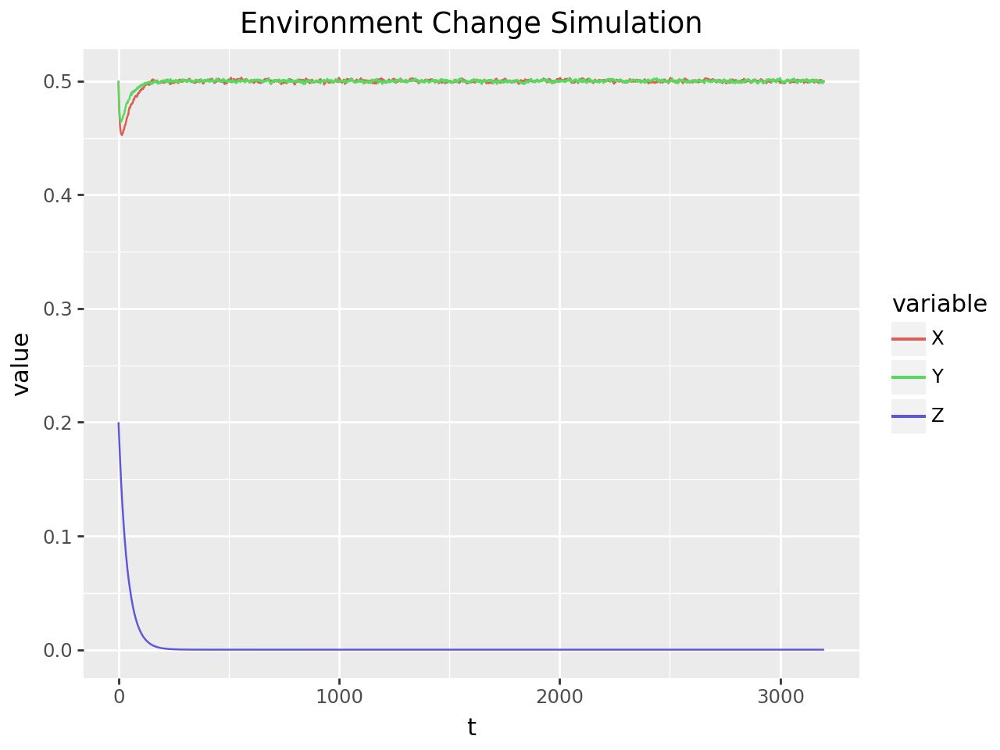

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.45
Lamprey Min Population: 0.46
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.01
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Handling Time: 0.010000000000000009, Lamprey Handling Time: 0.26


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


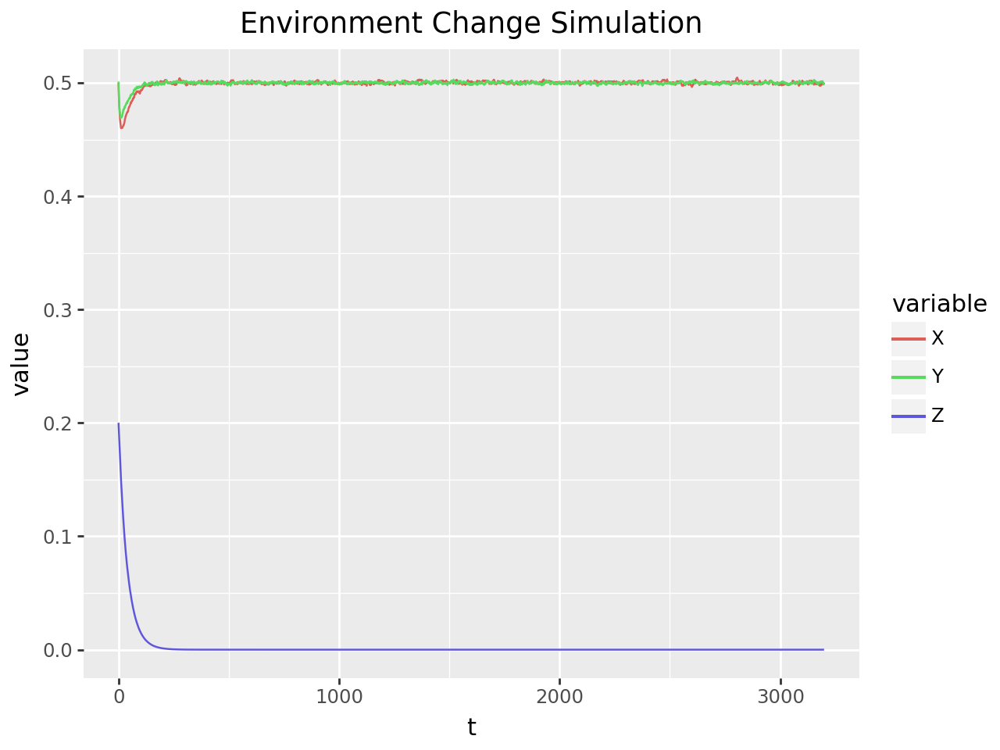

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.46
Lamprey Min Population: 0.47
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Handling Time: 0.010000000000000009, Lamprey Handling Time: 0.51


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


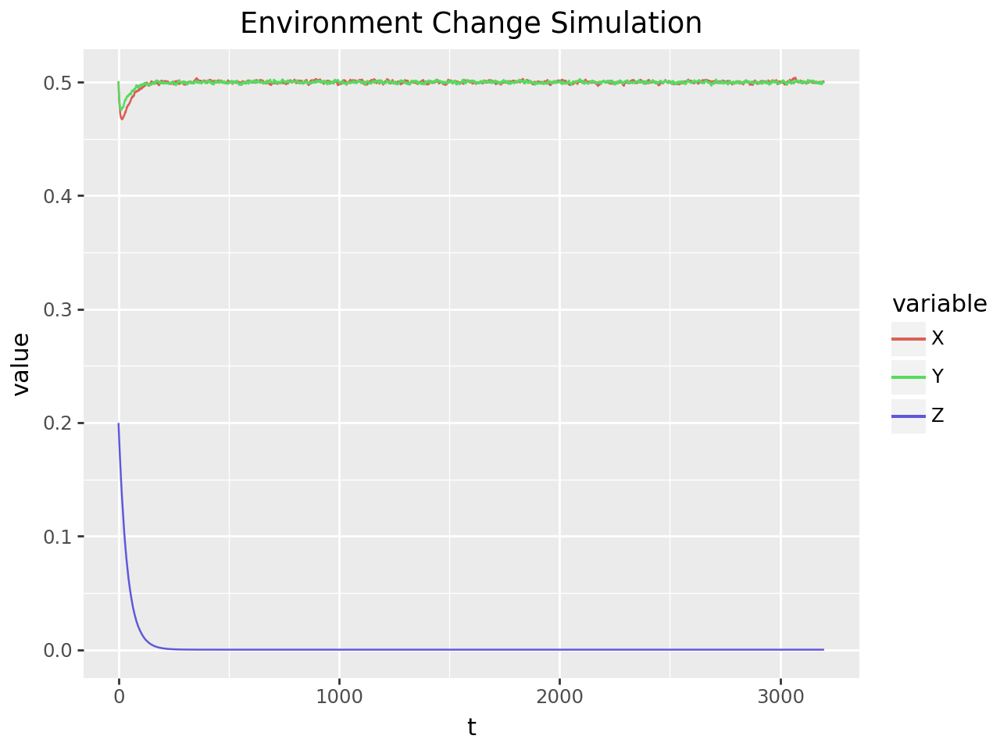

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.47
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Handling Time: 0.010000000000000009, Lamprey Handling Time: 0.76


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


KeyboardInterrupt: 

In [ ]:
simulate_param_changes(n_timesteps, hv_increment_range, "h", plot_funcs=(True, False))

Now, we try changing the growth rates of lamprey and salmon to examine the behavior. The results unfortunately do not give a lot of information, as all 25 plots are pretty much the same, with the salmon and lamprey hitting asymptotic behavior at a complete population immediately in all cases.

Salmon Velocity: 0.09999999999999998, Lamprey Velocity: 0.09999999999999998


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


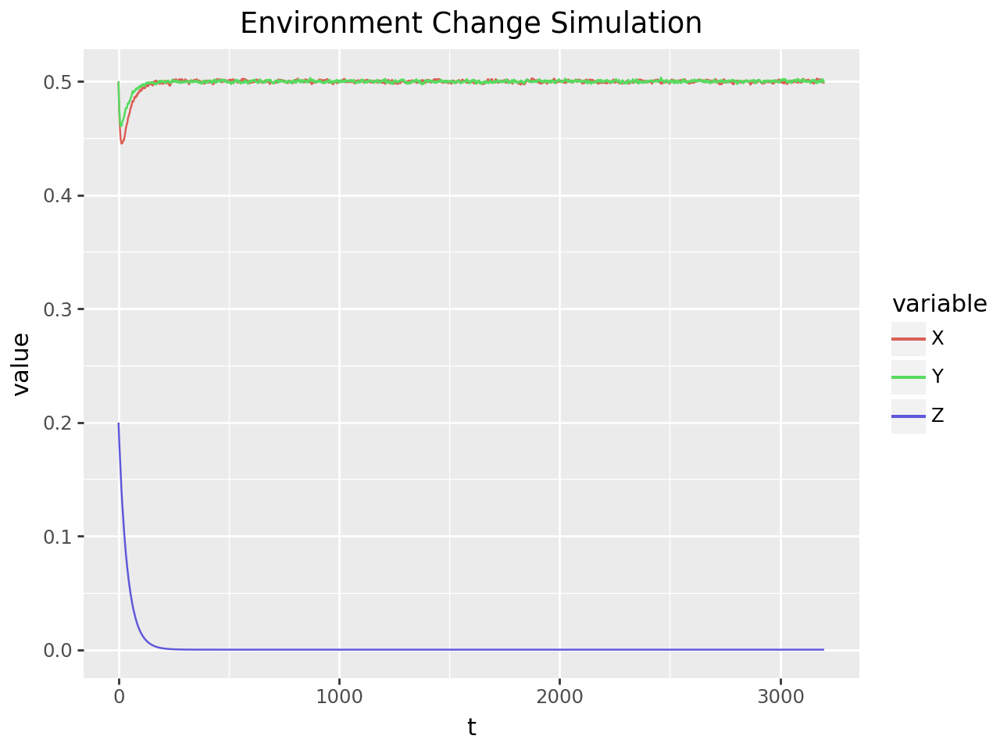

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.45
Lamprey Min Population: 0.46
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.01
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.09999999999999998, Lamprey Velocity: 0.19999999999999996


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


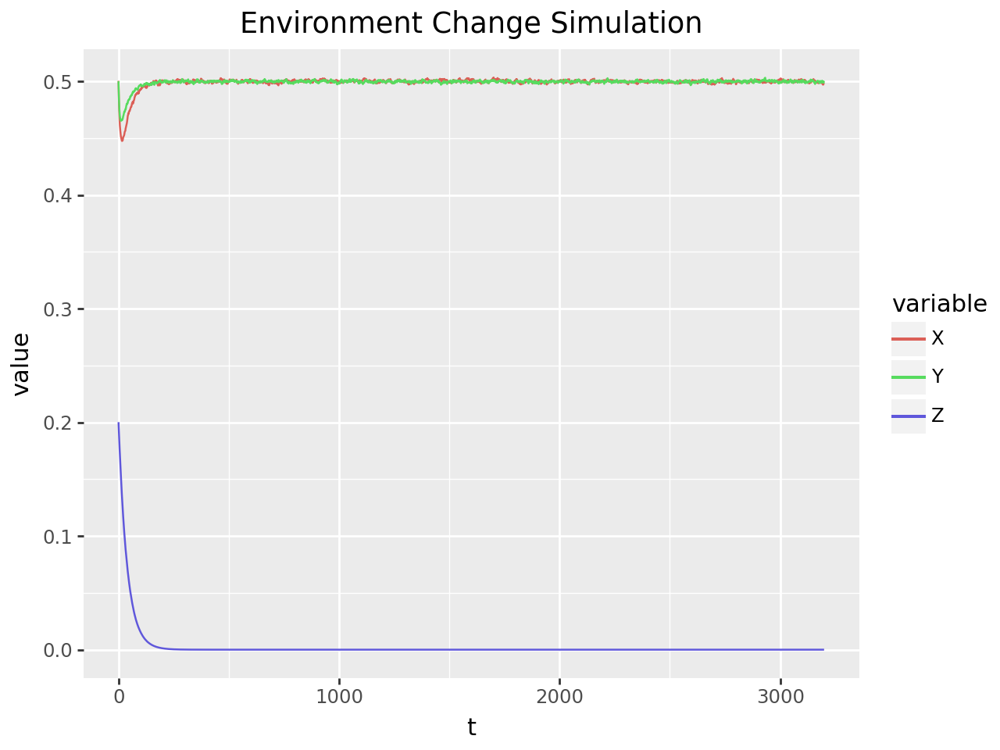

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.45
Lamprey Min Population: 0.47
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.01
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.09999999999999998, Lamprey Velocity: 0.29999999999999993


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


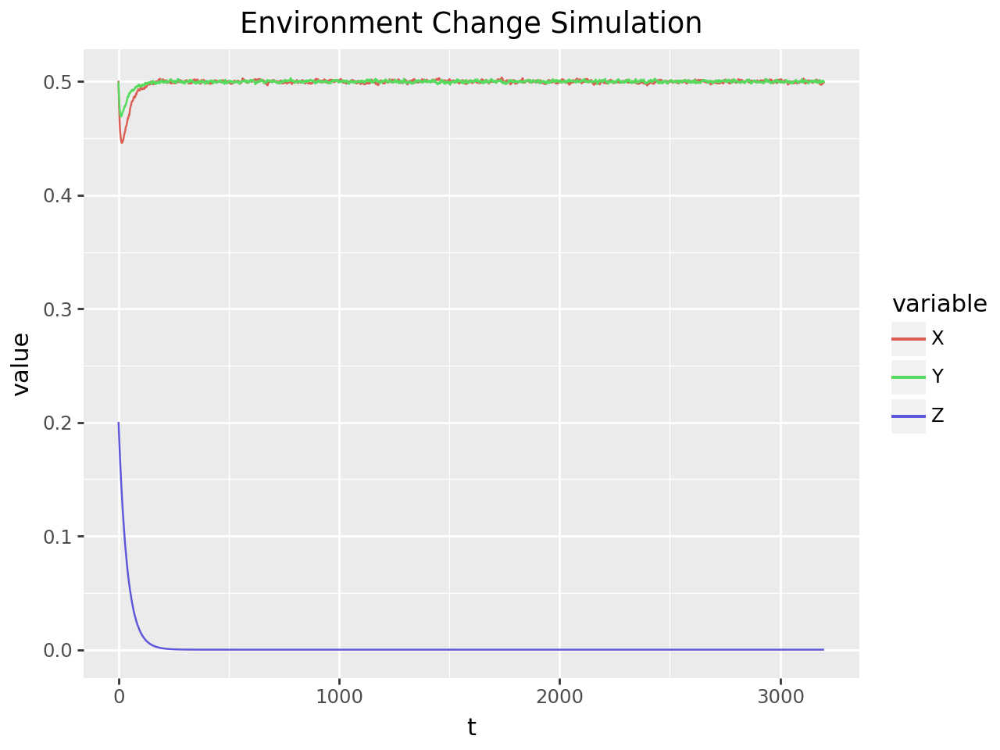

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.45
Lamprey Min Population: 0.47
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.01
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.09999999999999998, Lamprey Velocity: 0.3999999999999999


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


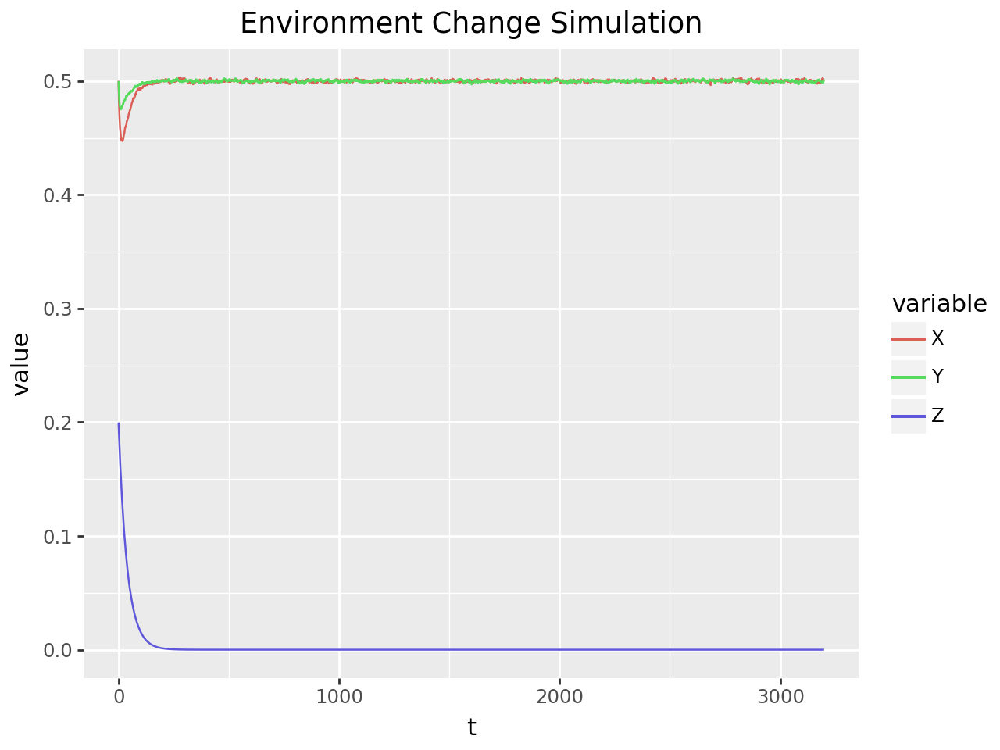

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.45
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.01
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.09999999999999998, Lamprey Velocity: 0.4999999999999999


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


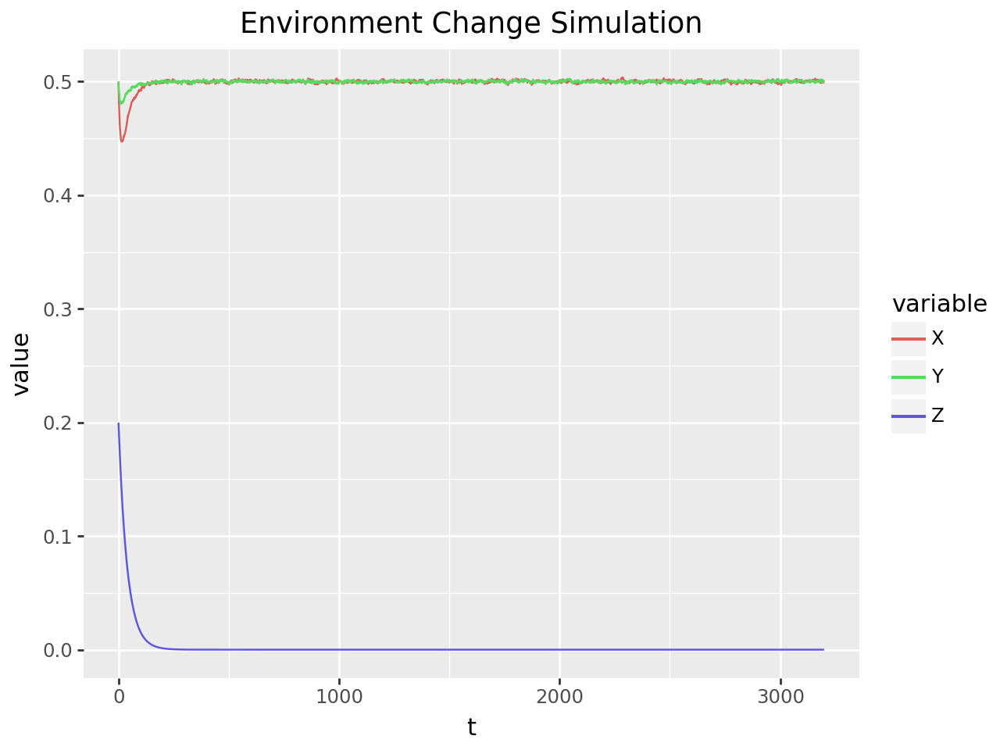

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.45
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.01
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.09999999999999998, Lamprey Velocity: 0.5999999999999999


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


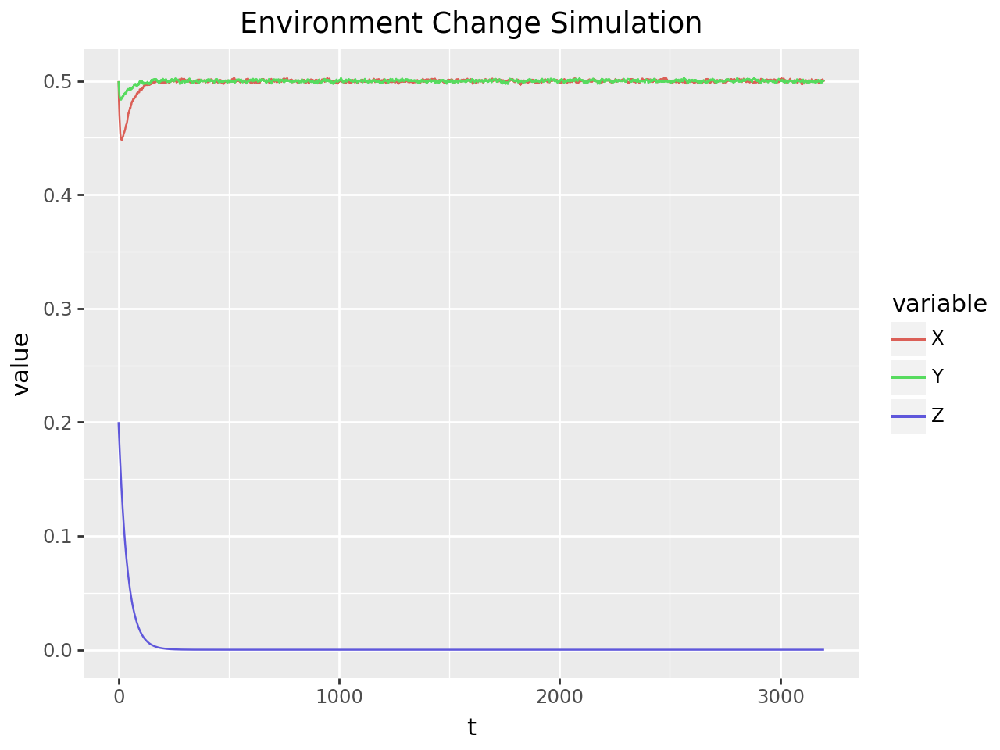

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.45
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.01
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.09999999999999998, Lamprey Velocity: 0.6999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


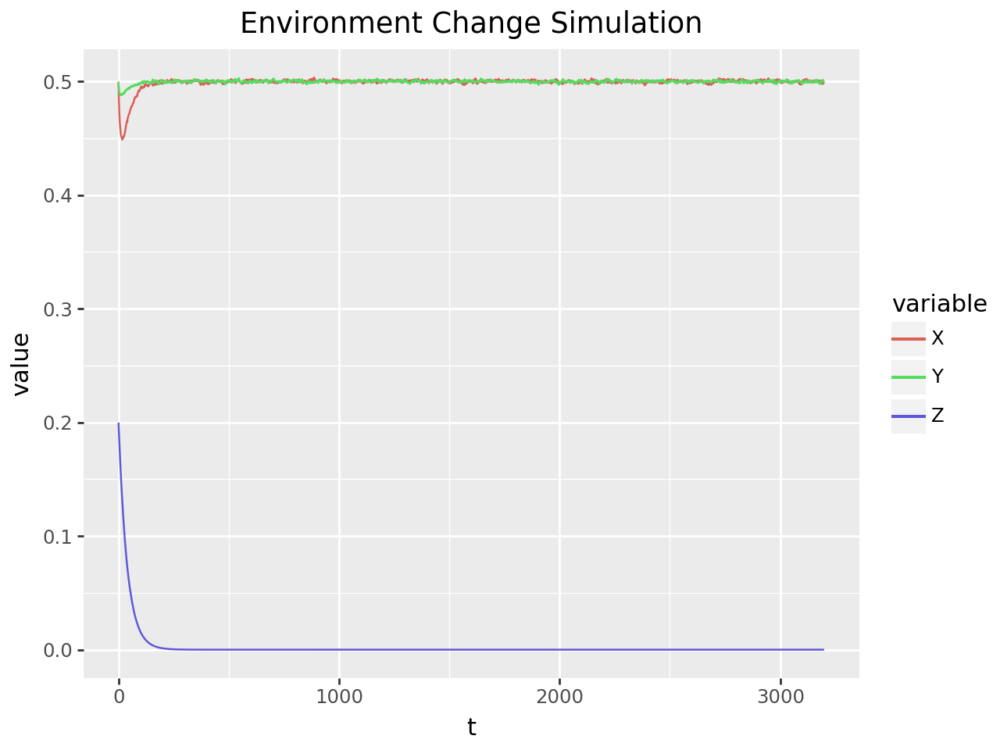

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.45
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.01
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.09999999999999998, Lamprey Velocity: 0.7999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


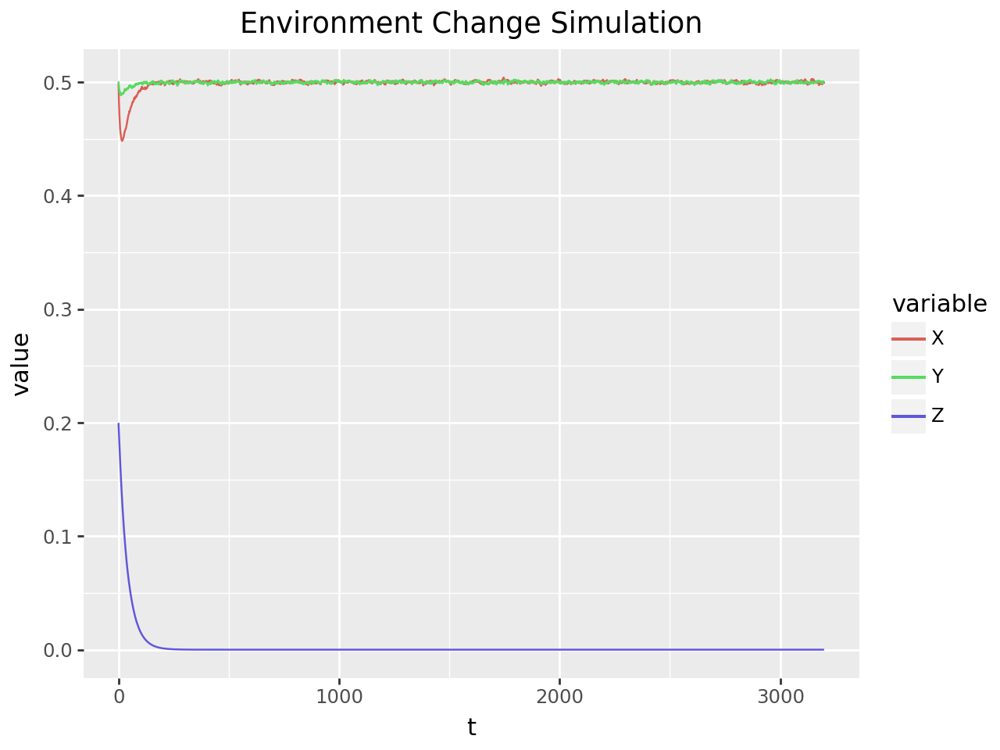

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.45
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.01
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.09999999999999998, Lamprey Velocity: 0.8999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


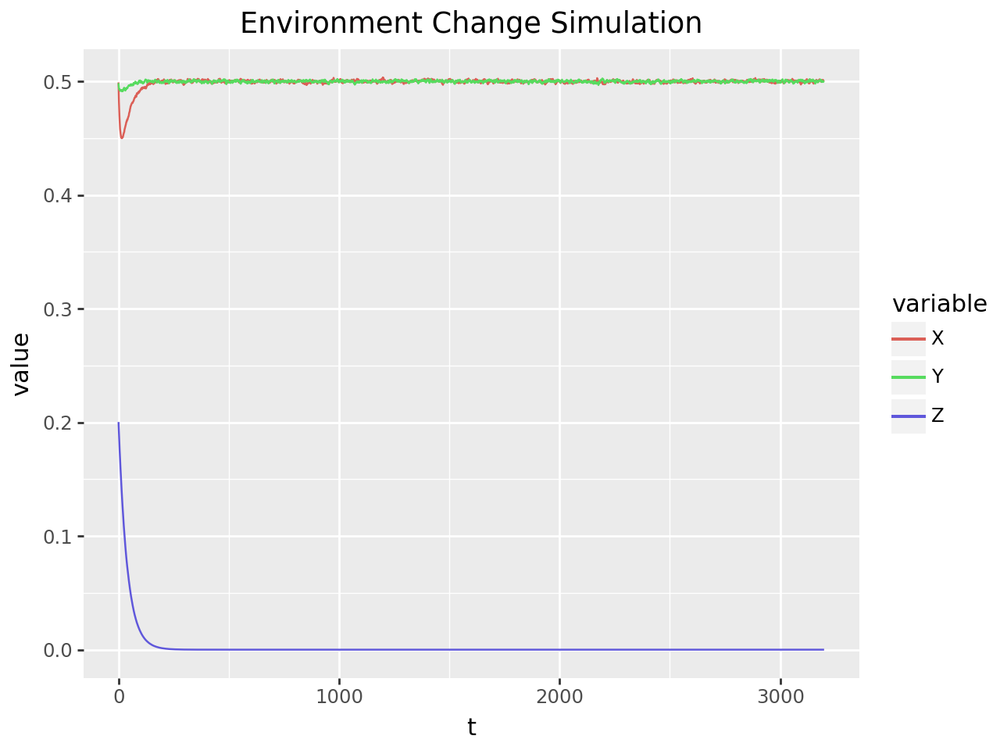

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.45
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.01
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.09999999999999998, Lamprey Velocity: 0.9999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


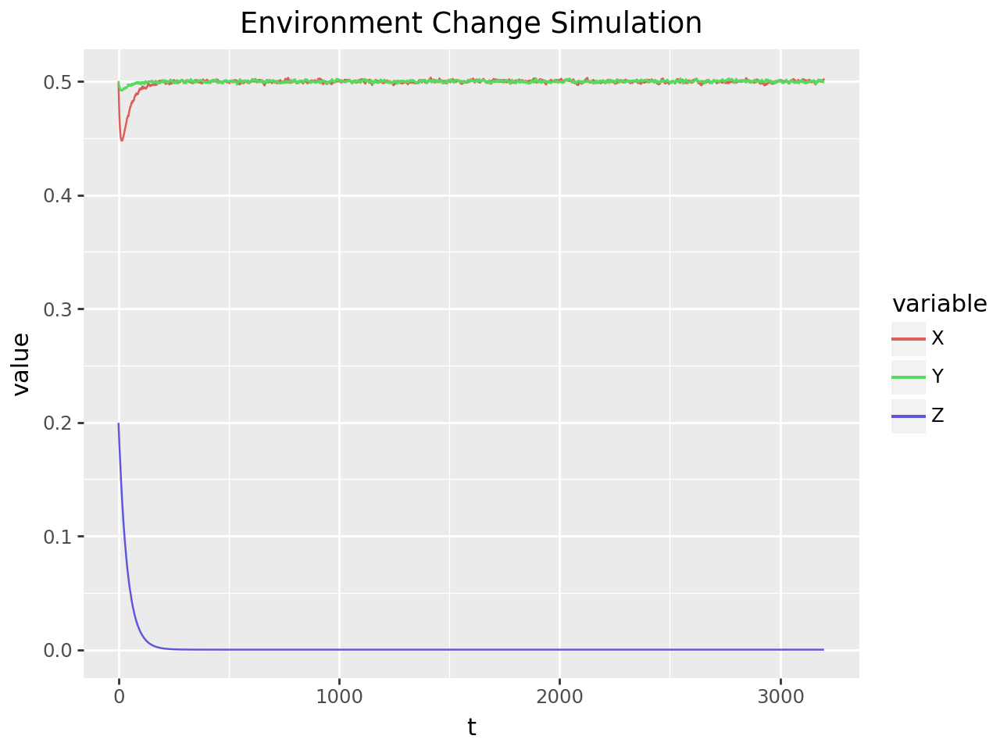

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.45
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.01
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.19999999999999996, Lamprey Velocity: 0.09999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


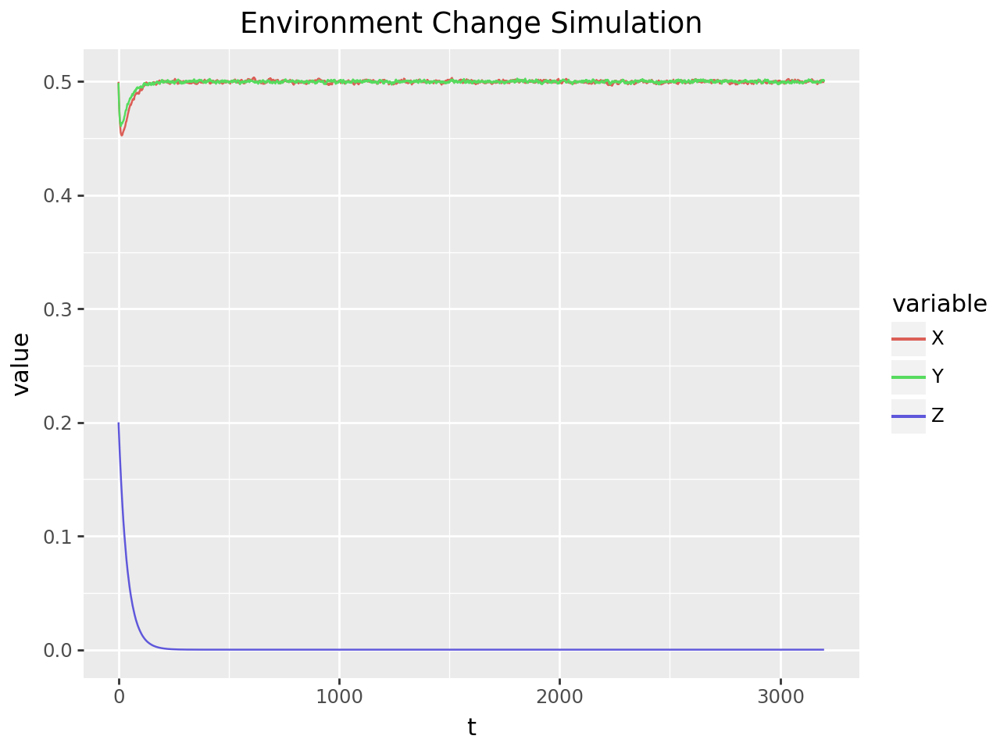

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.45
Lamprey Min Population: 0.46
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.01
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.19999999999999996, Lamprey Velocity: 0.19999999999999996


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


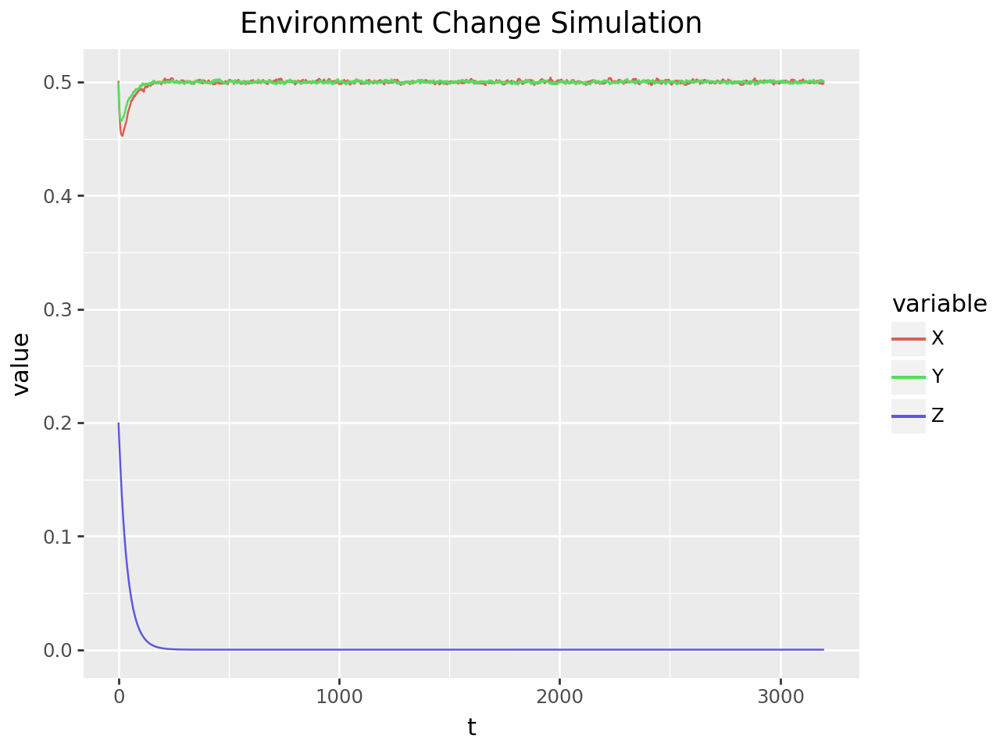

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.45
Lamprey Min Population: 0.47
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.19999999999999996, Lamprey Velocity: 0.29999999999999993


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


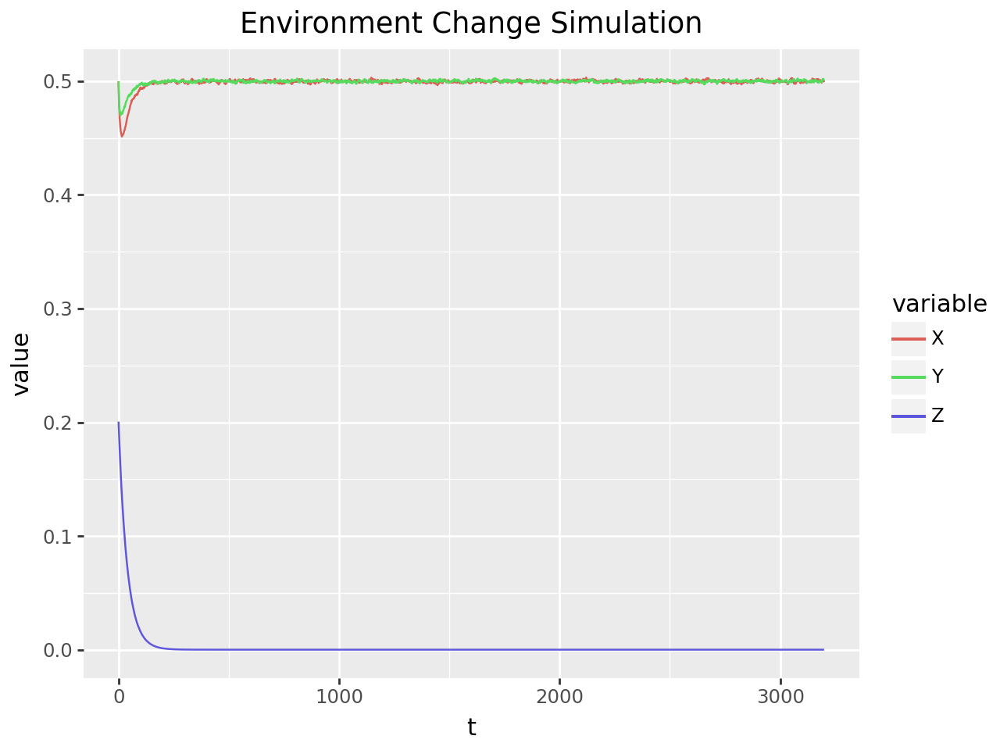

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.45
Lamprey Min Population: 0.47
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.01
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.19999999999999996, Lamprey Velocity: 0.3999999999999999


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


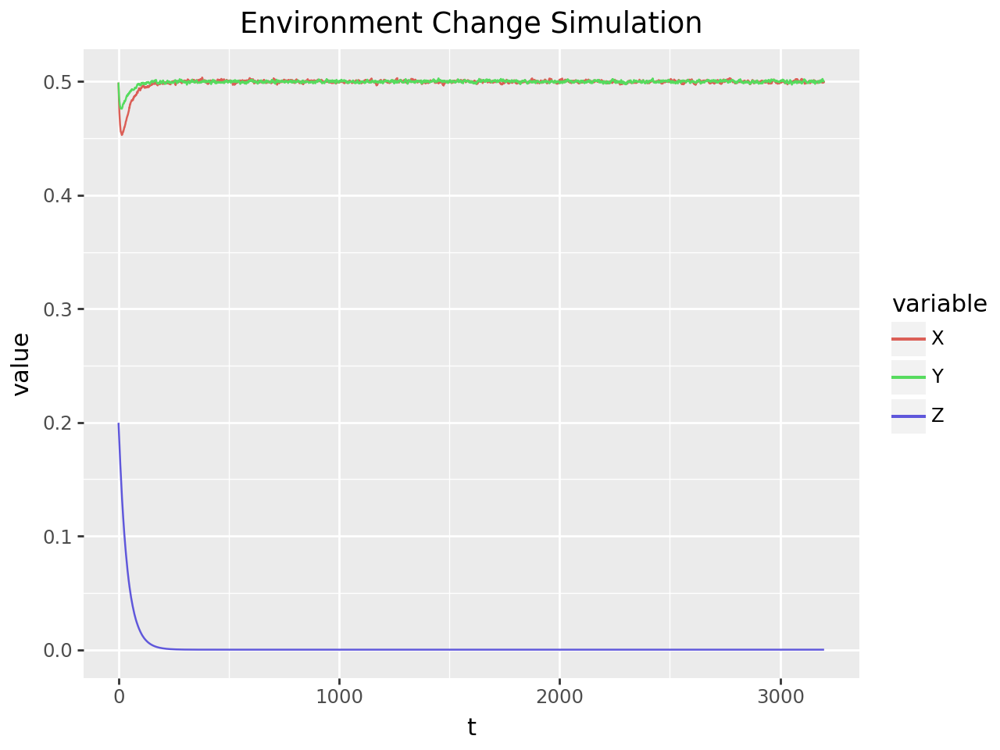

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.45
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.19999999999999996, Lamprey Velocity: 0.4999999999999999


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


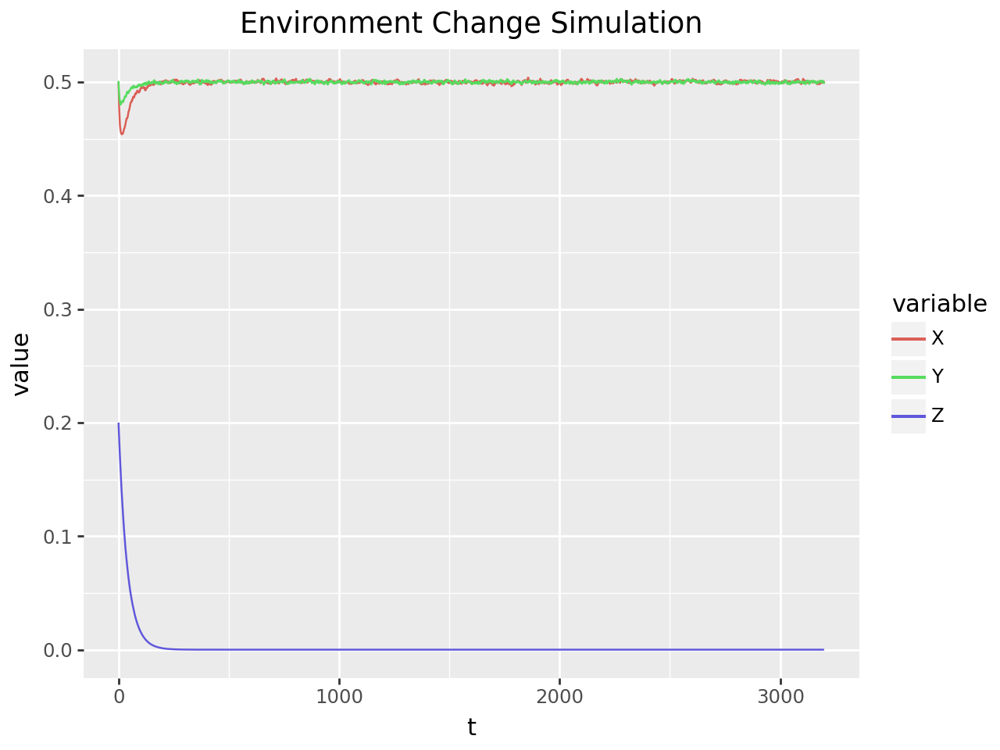

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.45
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.19999999999999996, Lamprey Velocity: 0.5999999999999999


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


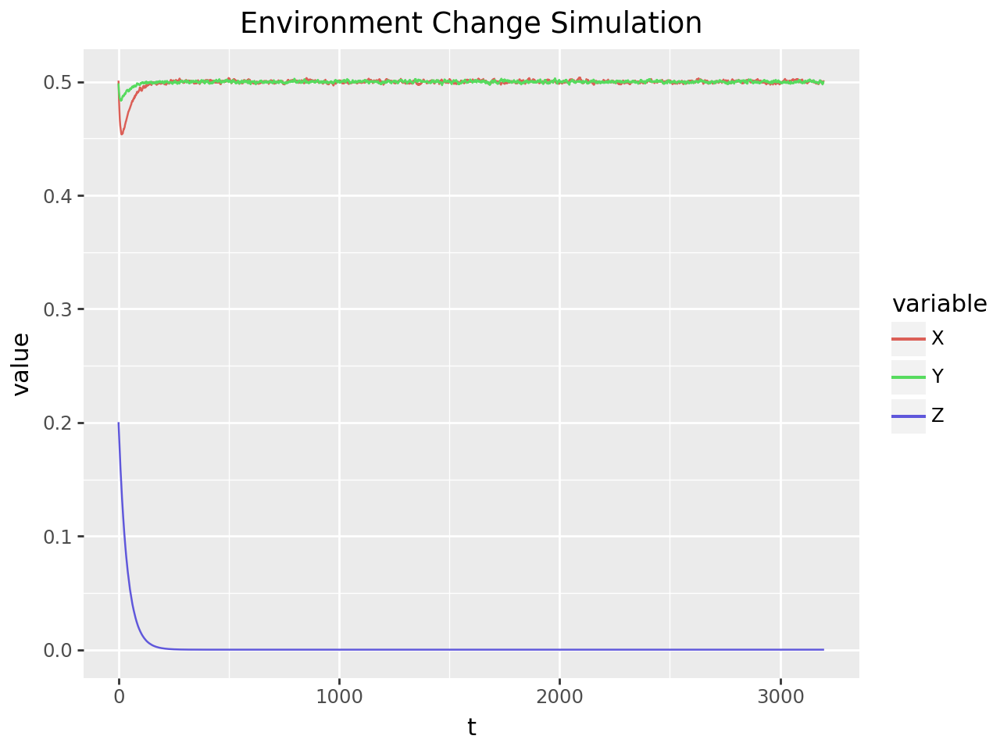

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.45
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.19999999999999996, Lamprey Velocity: 0.6999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


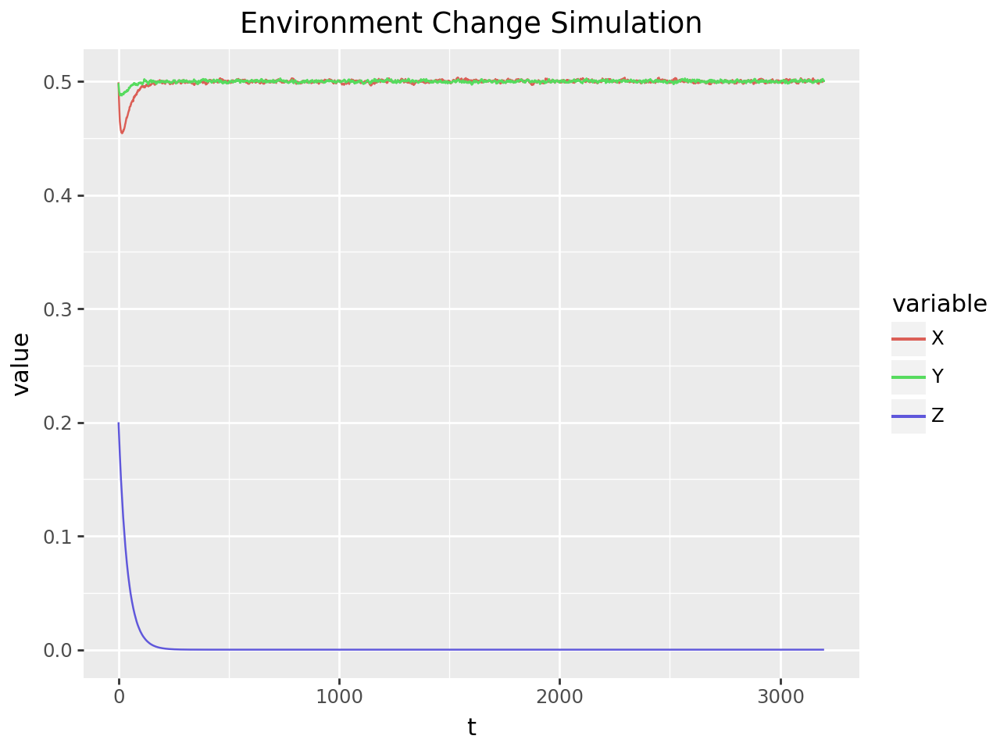

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.45
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.19999999999999996, Lamprey Velocity: 0.7999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


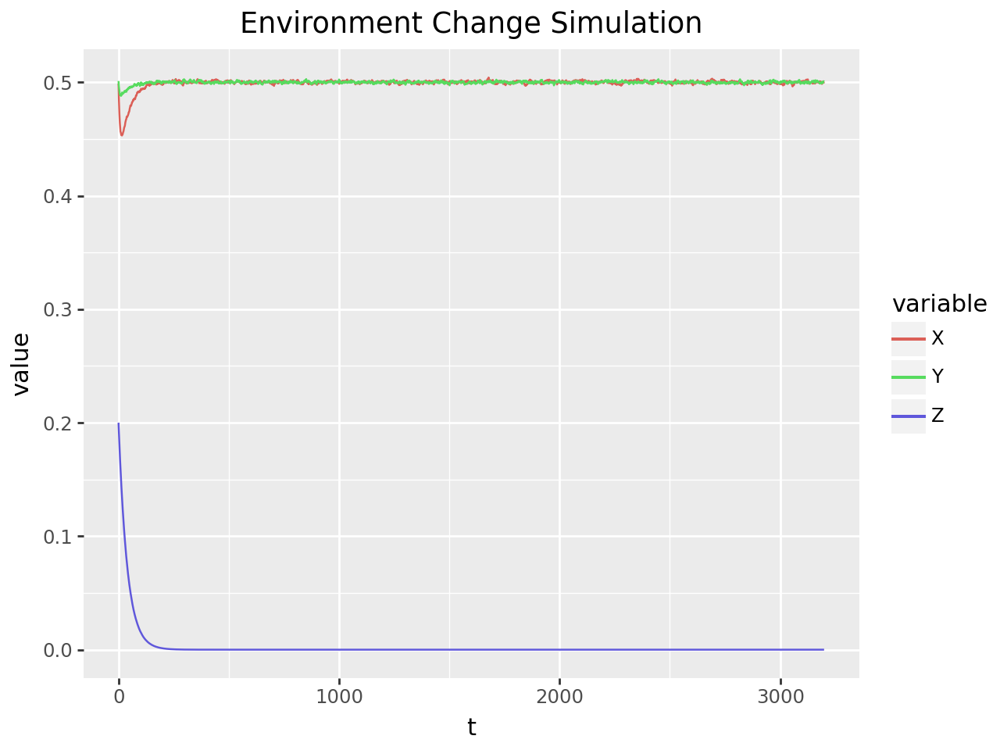

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.45
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.19999999999999996, Lamprey Velocity: 0.8999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


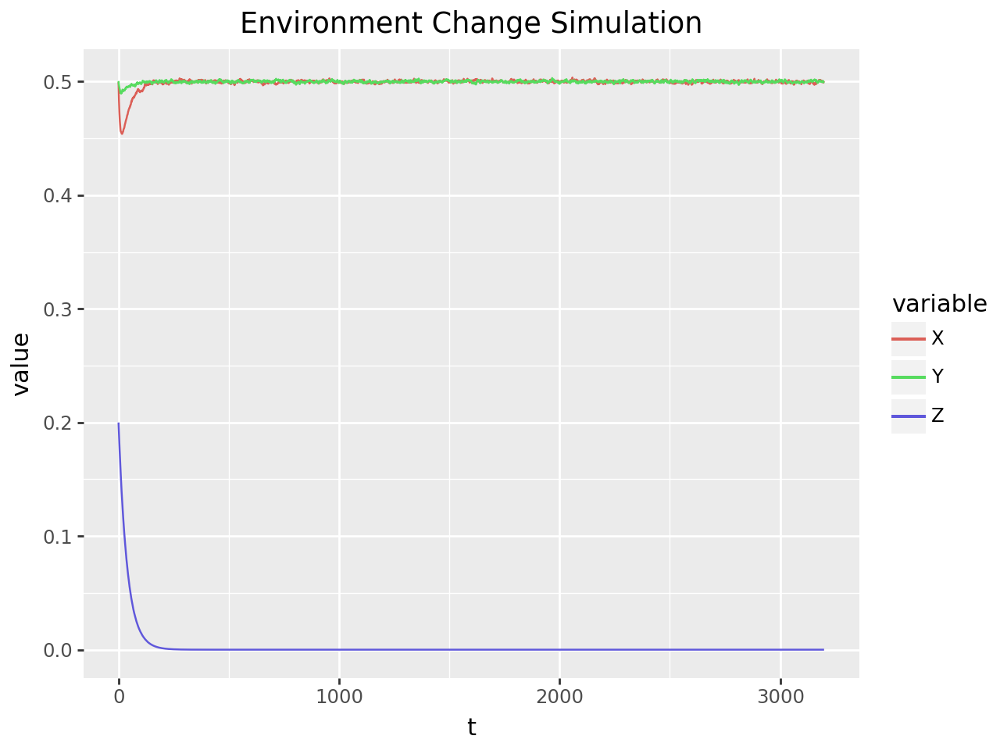

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.45
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.19999999999999996, Lamprey Velocity: 0.9999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


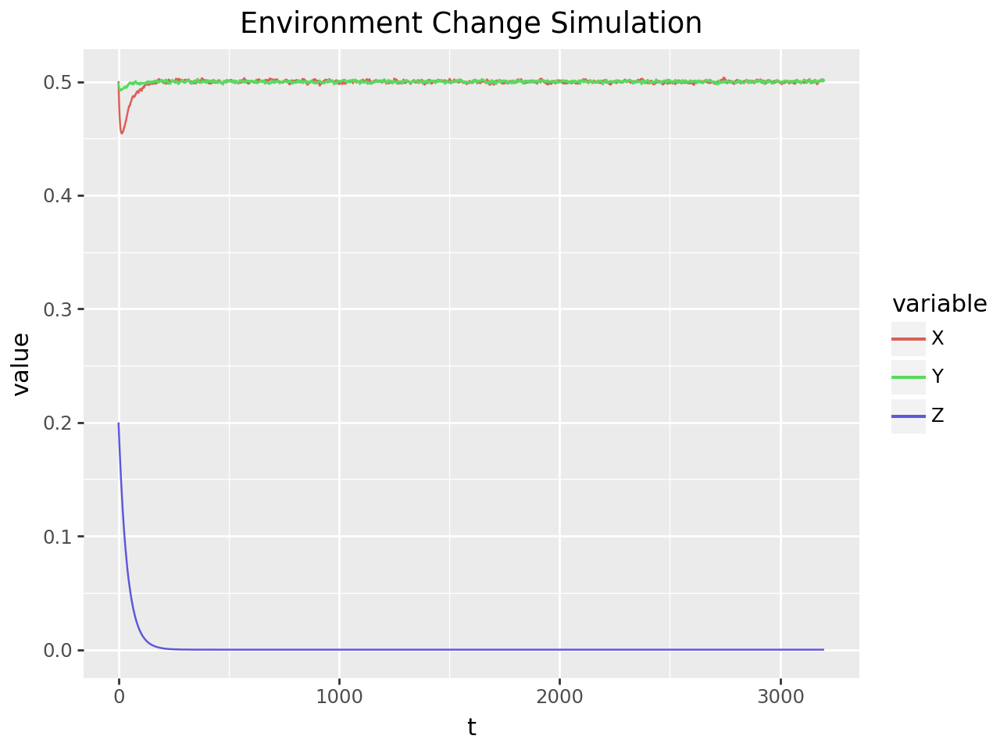

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.45
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.29999999999999993, Lamprey Velocity: 0.09999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


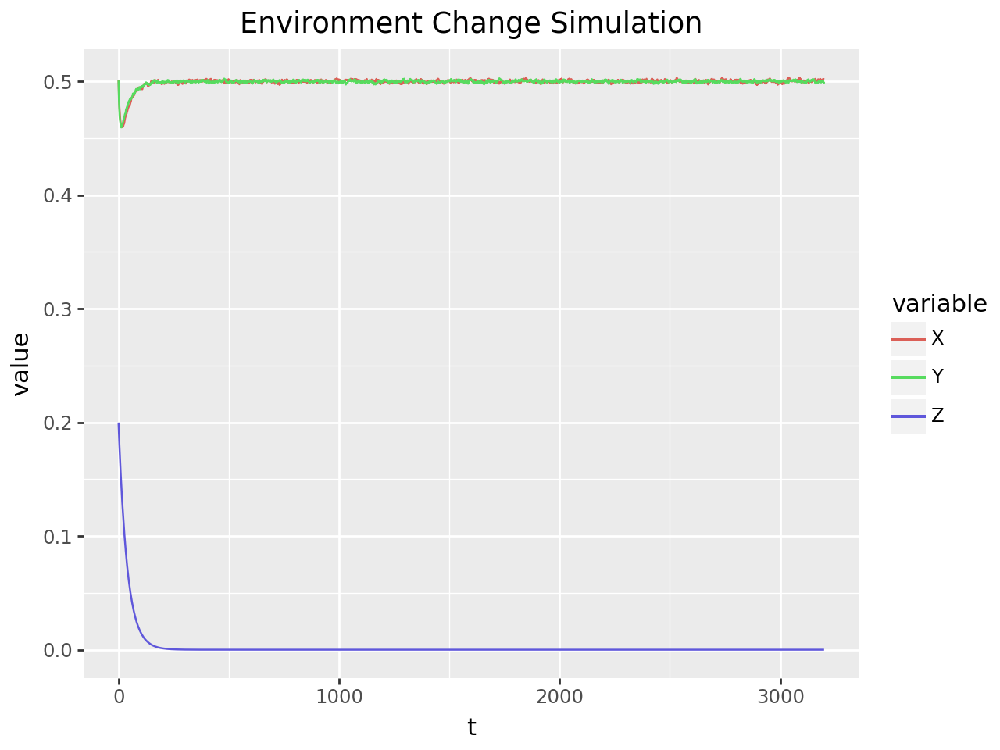

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.46
Lamprey Min Population: 0.46
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.29999999999999993, Lamprey Velocity: 0.19999999999999996


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


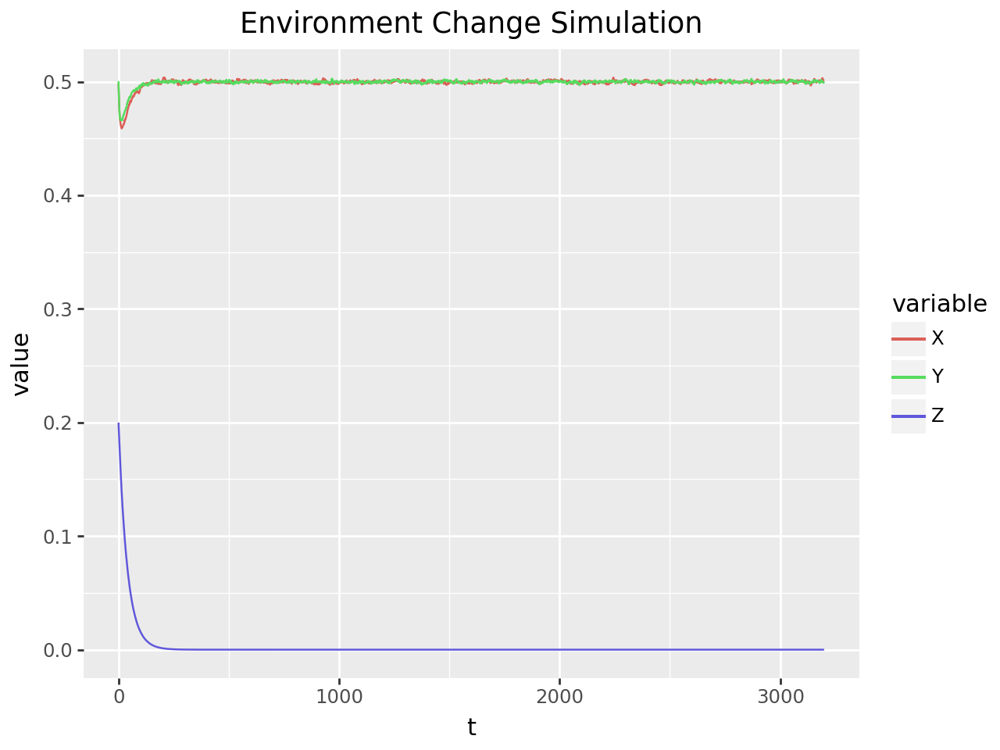

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.46
Lamprey Min Population: 0.47
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.29999999999999993, Lamprey Velocity: 0.29999999999999993


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


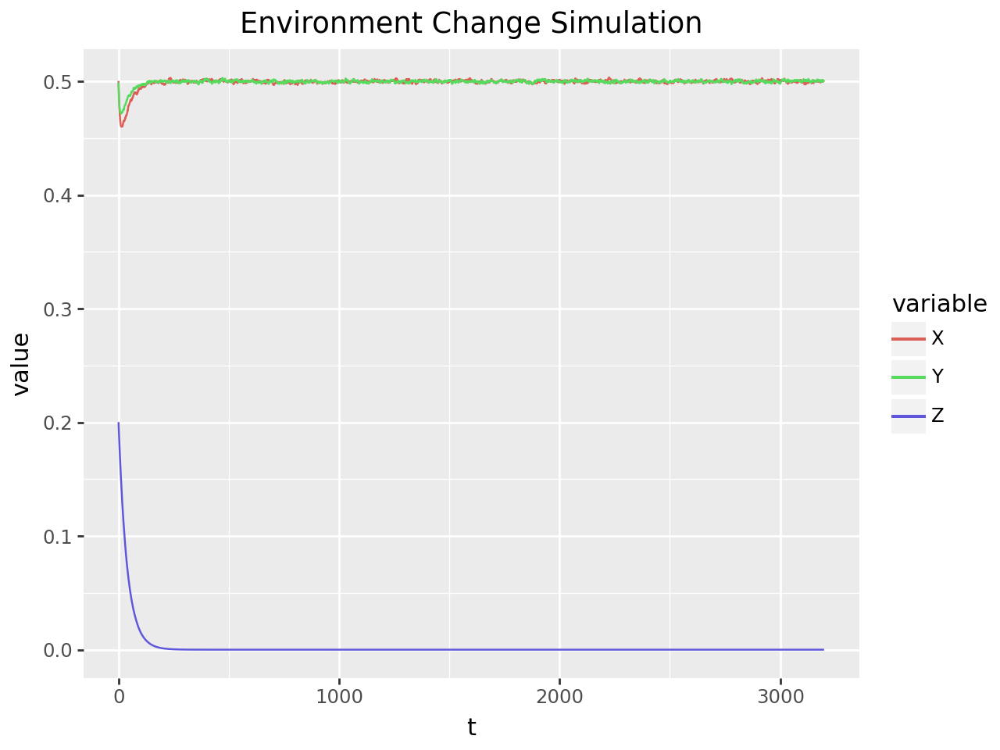

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.46
Lamprey Min Population: 0.47
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.29999999999999993, Lamprey Velocity: 0.3999999999999999


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


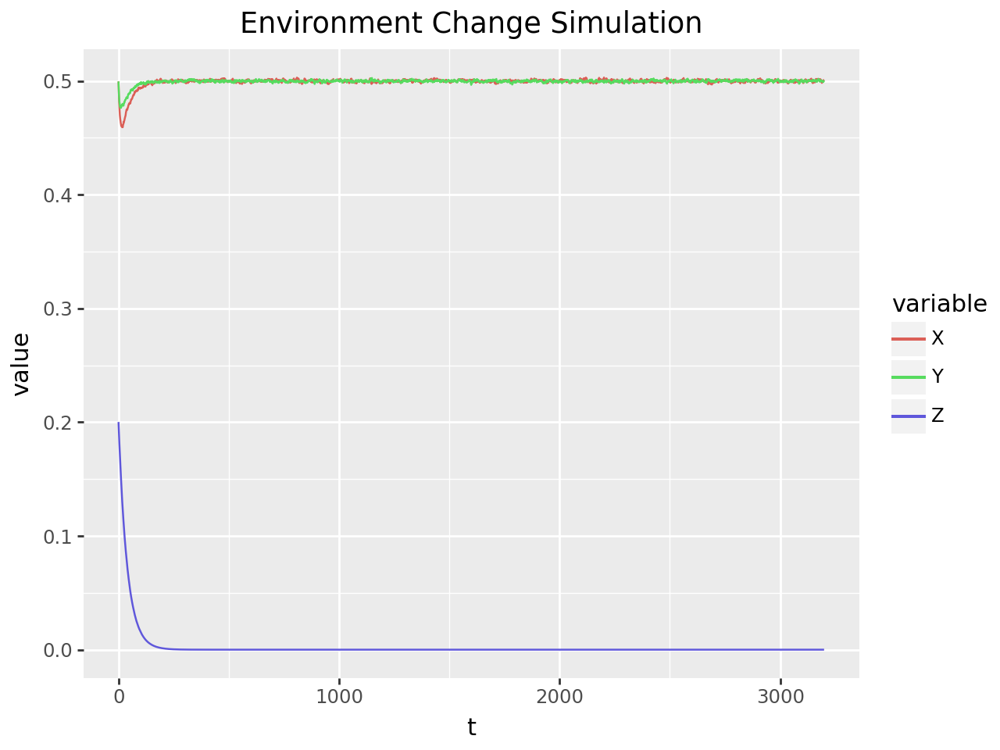

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.46
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.29999999999999993, Lamprey Velocity: 0.4999999999999999


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


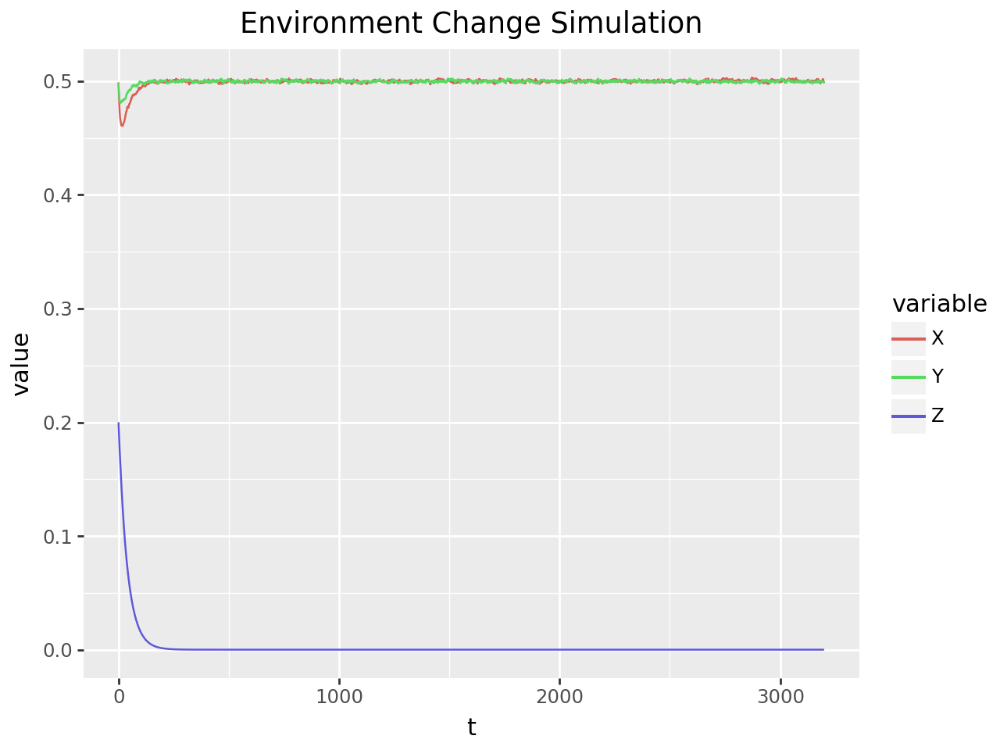

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.46
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.29999999999999993, Lamprey Velocity: 0.5999999999999999


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


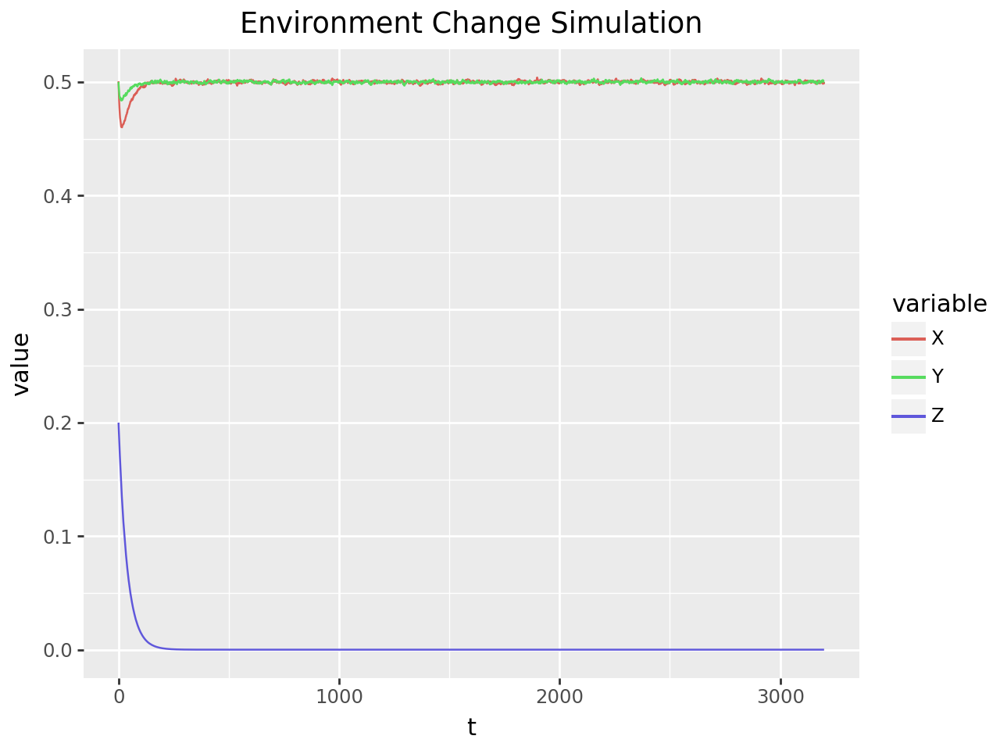

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.46
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.29999999999999993, Lamprey Velocity: 0.6999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


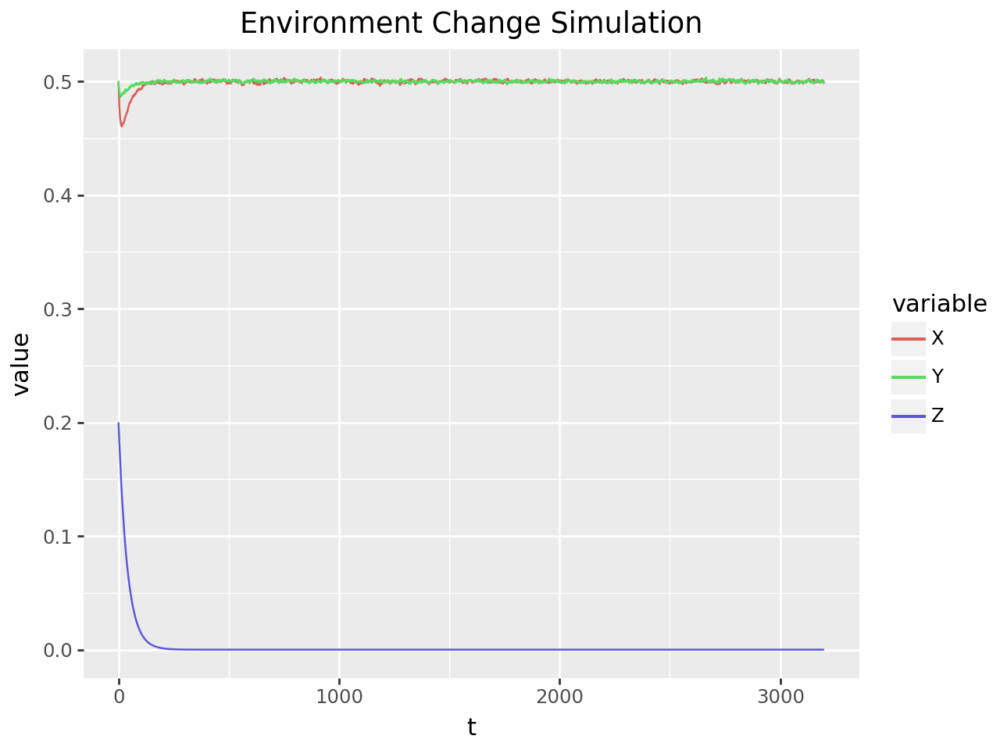

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.46
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.29999999999999993, Lamprey Velocity: 0.7999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


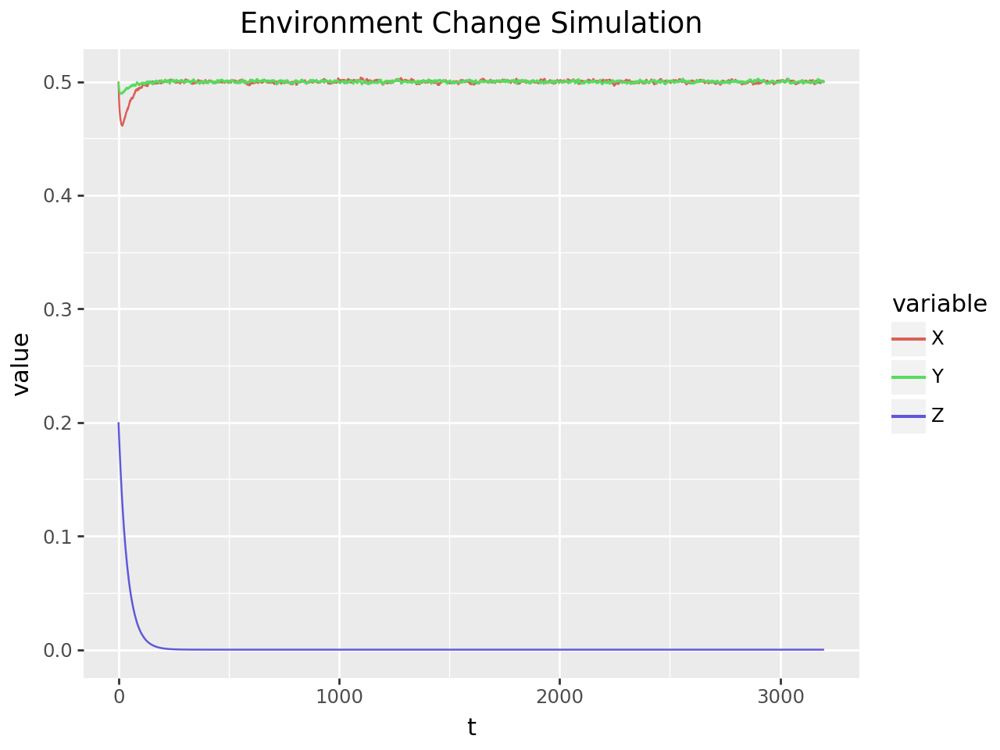

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.46
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.29999999999999993, Lamprey Velocity: 0.8999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


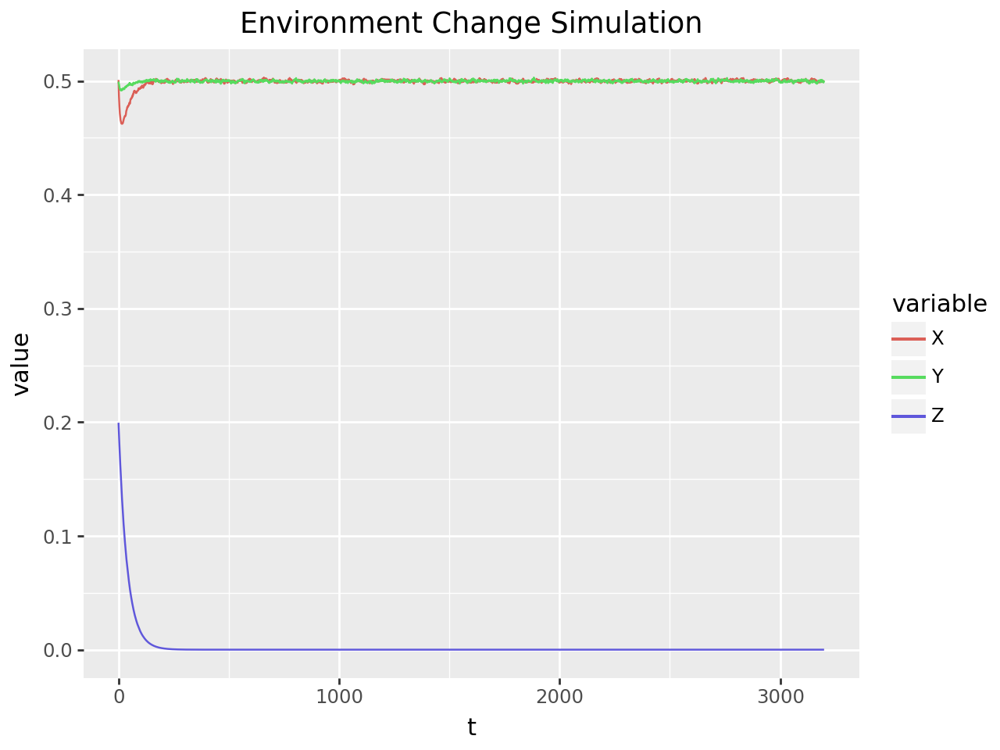

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.46
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.29999999999999993, Lamprey Velocity: 0.9999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


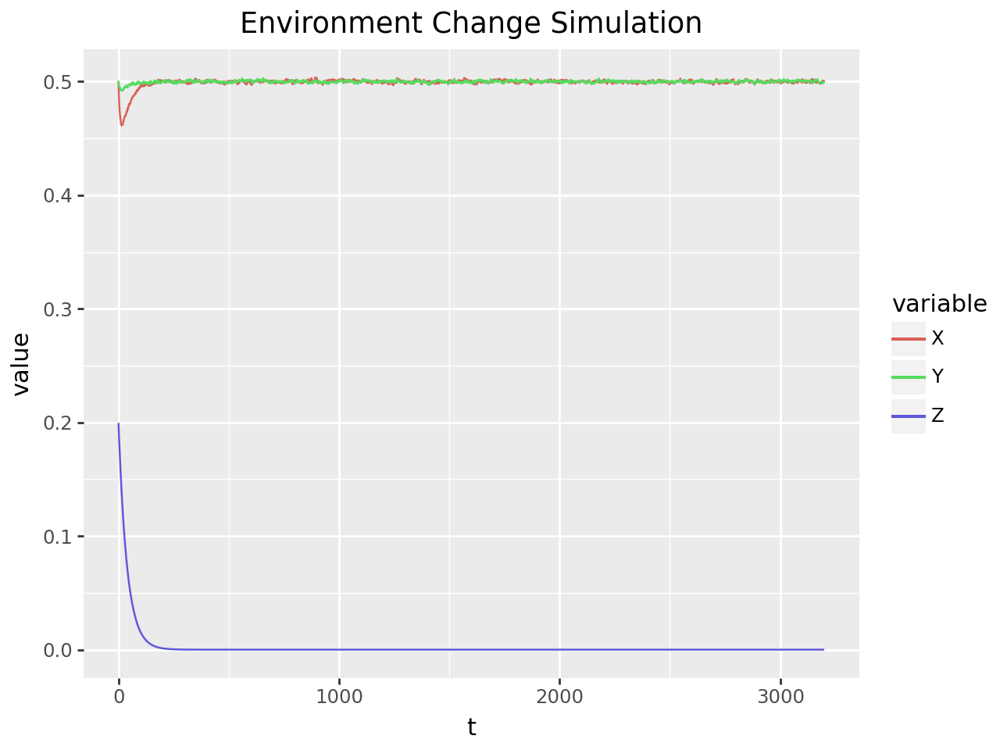

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.46
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.3999999999999999, Lamprey Velocity: 0.09999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


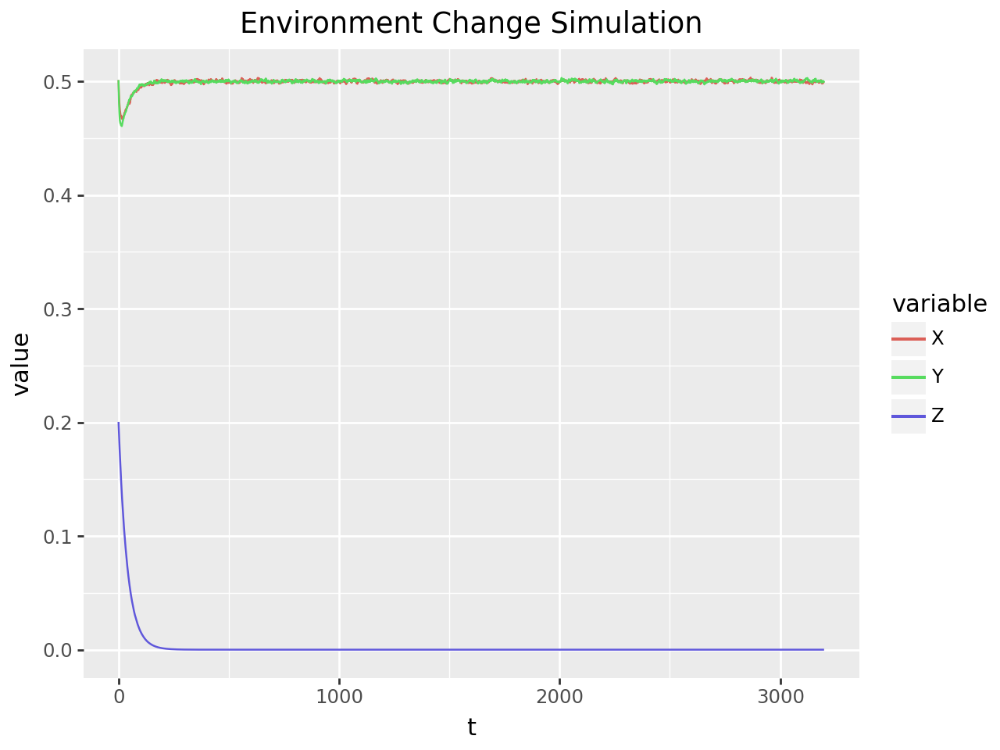

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.47
Lamprey Min Population: 0.46
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.3999999999999999, Lamprey Velocity: 0.19999999999999996


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


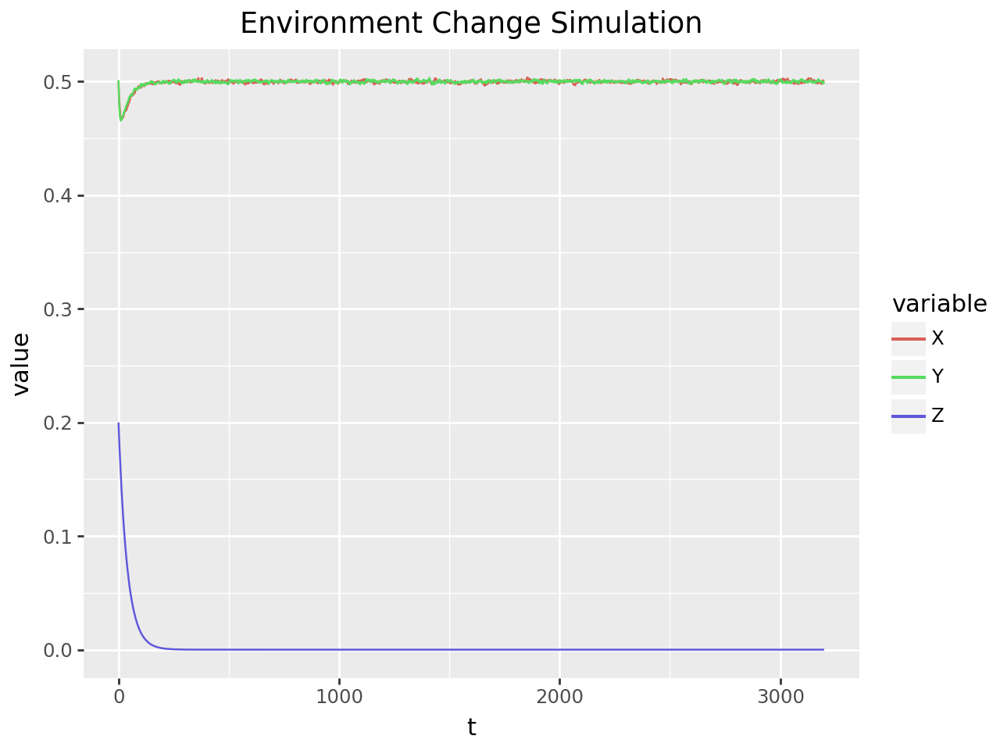

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.47
Lamprey Min Population: 0.47
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.3999999999999999, Lamprey Velocity: 0.29999999999999993


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


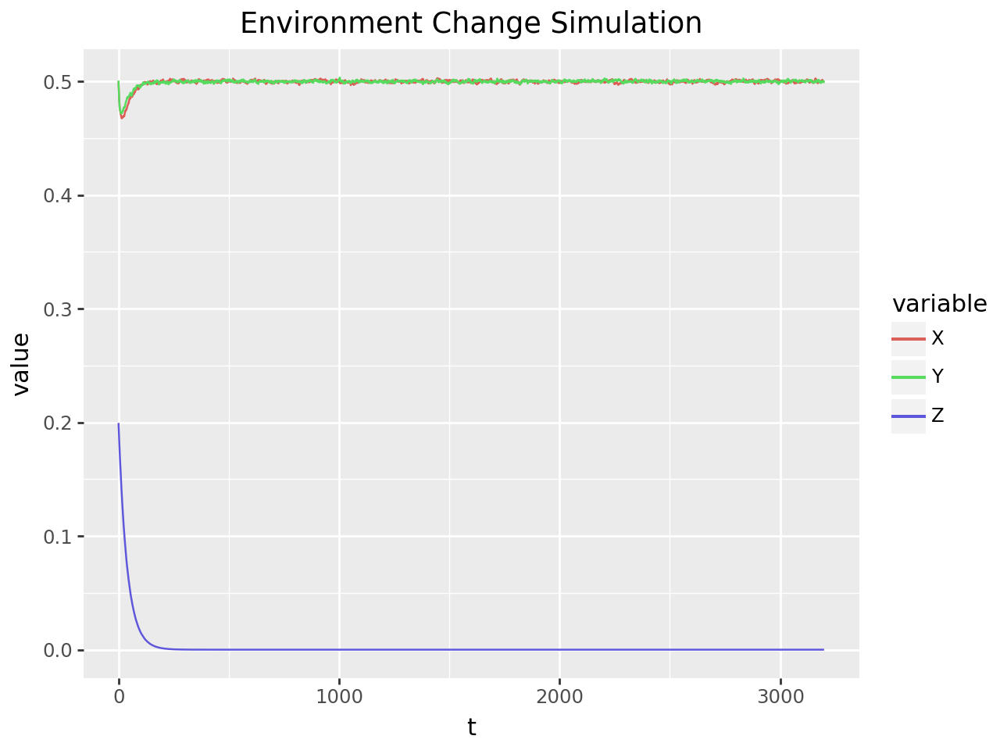

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.47
Lamprey Min Population: 0.47
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.3999999999999999, Lamprey Velocity: 0.3999999999999999


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


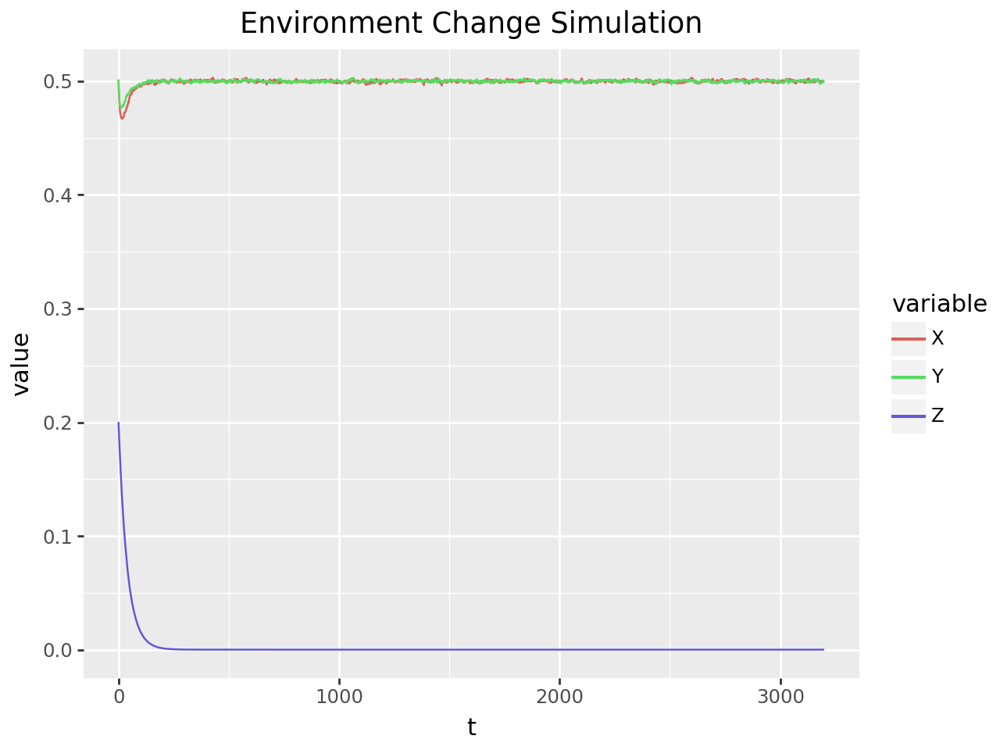

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.47
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.3999999999999999, Lamprey Velocity: 0.4999999999999999


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


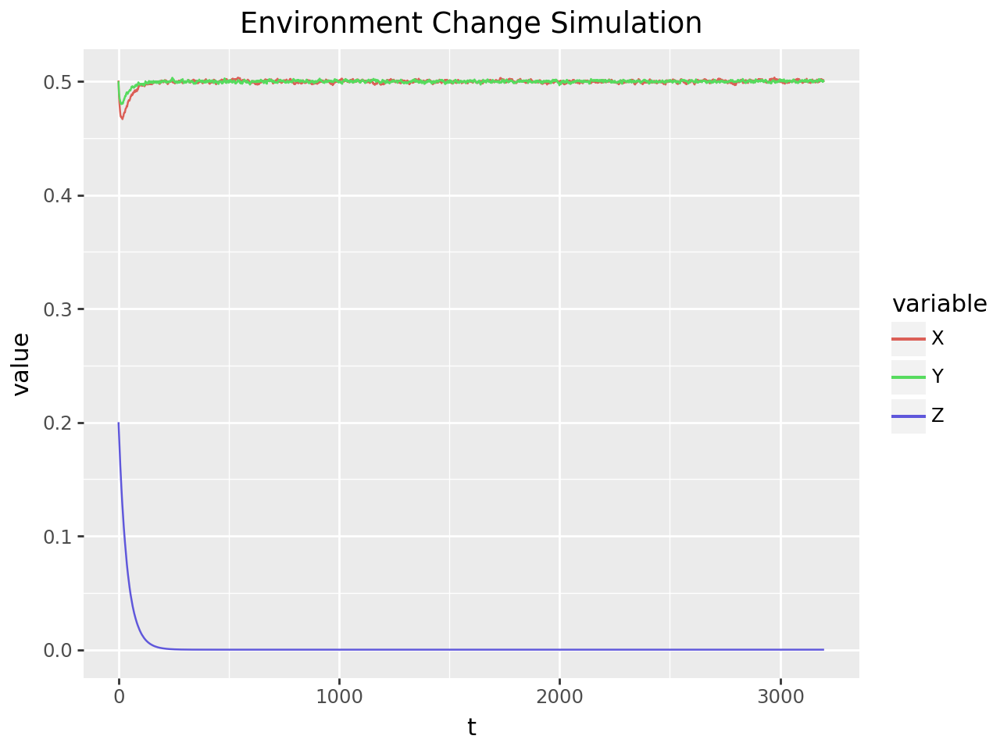

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.47
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.3999999999999999, Lamprey Velocity: 0.5999999999999999


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


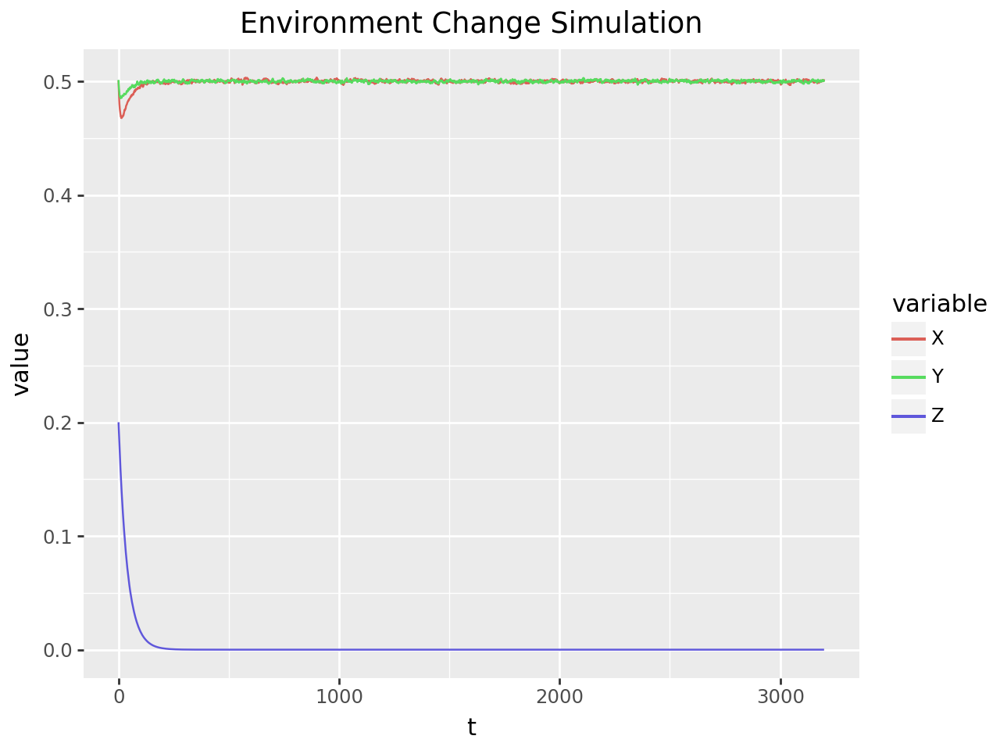

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.47
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.3999999999999999, Lamprey Velocity: 0.6999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


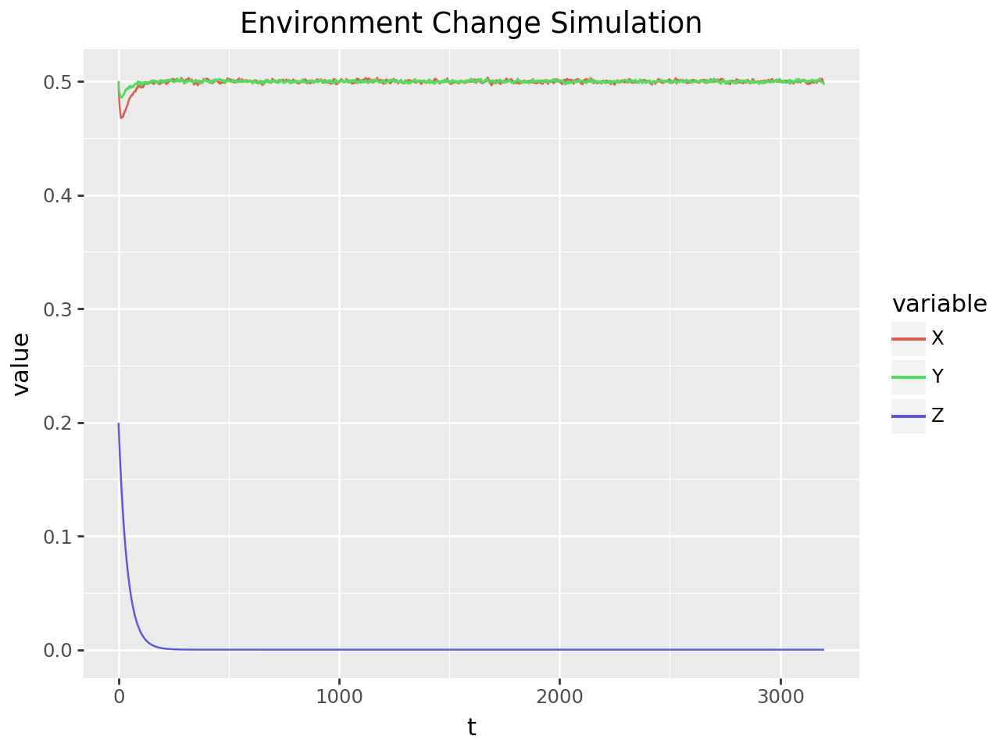

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.47
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.3999999999999999, Lamprey Velocity: 0.7999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


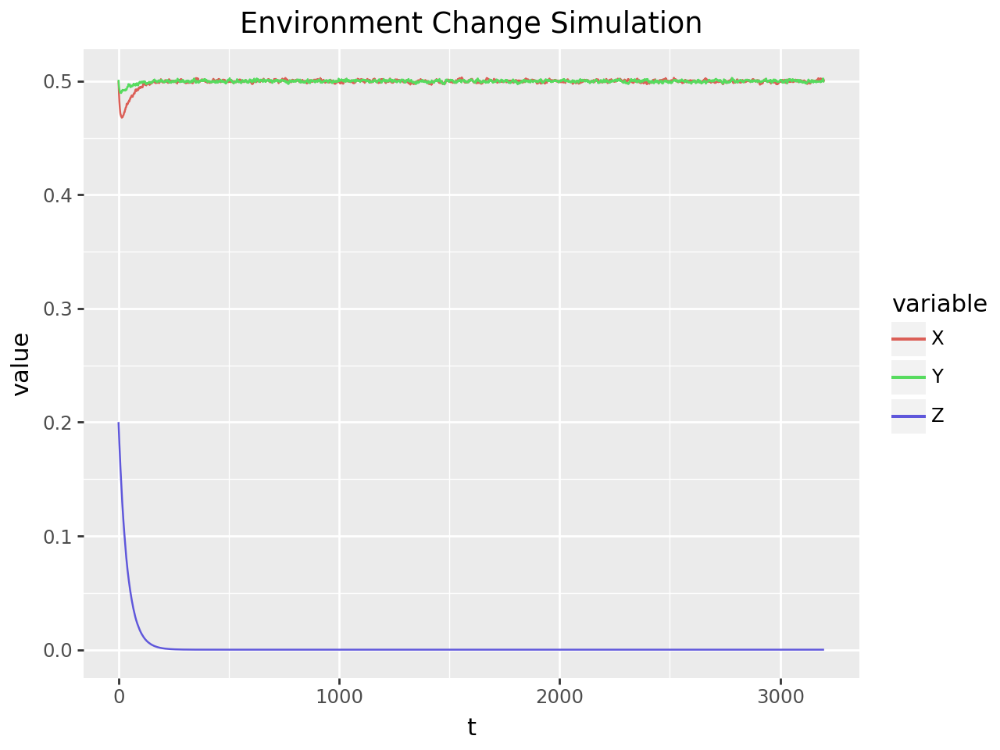

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.47
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.3999999999999999, Lamprey Velocity: 0.8999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


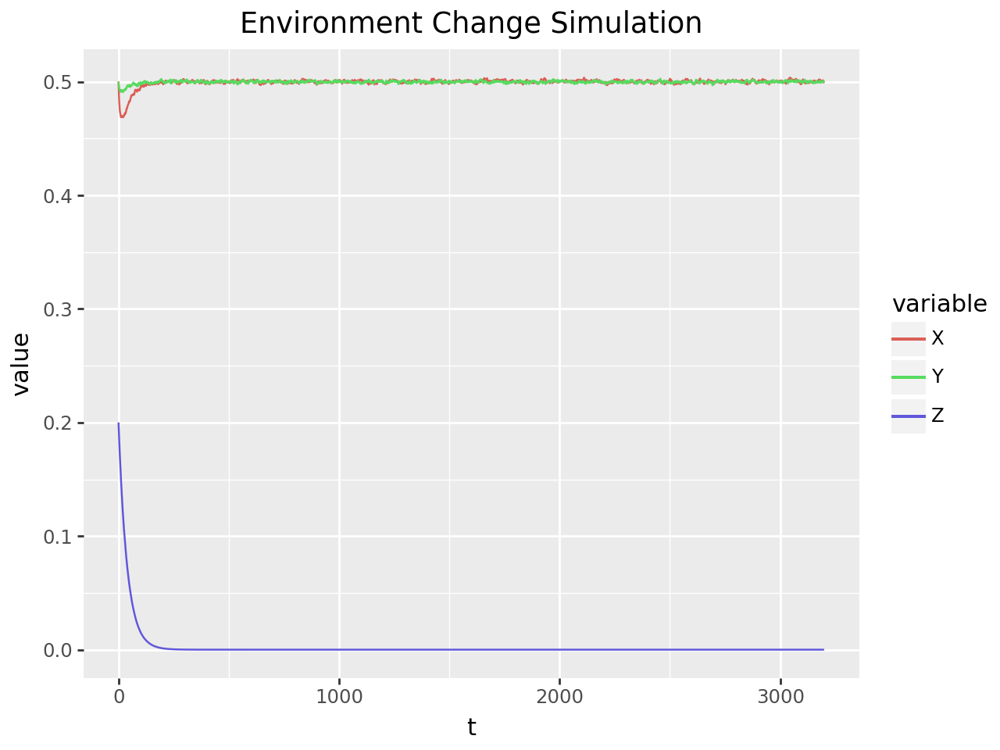

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.47
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.3999999999999999, Lamprey Velocity: 0.9999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


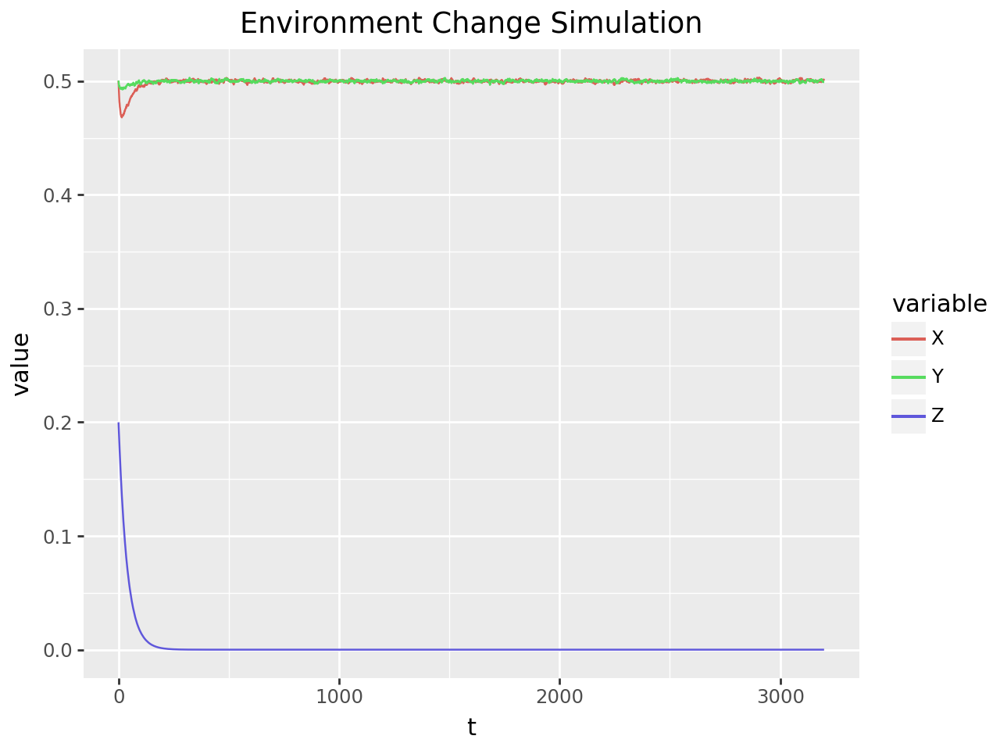

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.47
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.4999999999999999, Lamprey Velocity: 0.09999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


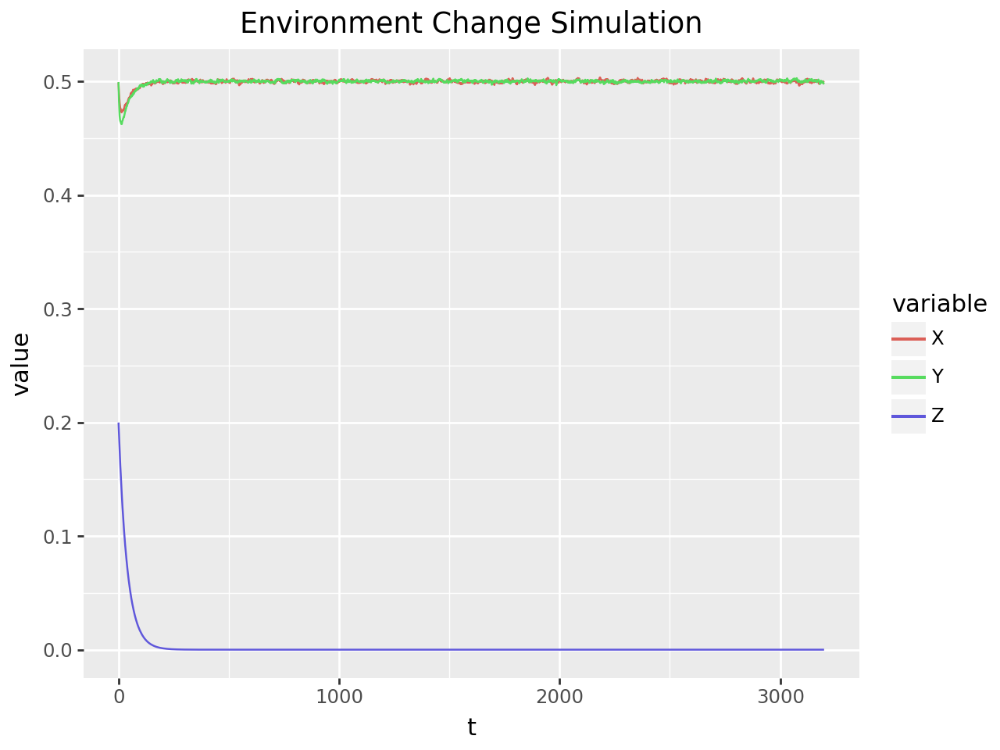

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.47
Lamprey Min Population: 0.46
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.4999999999999999, Lamprey Velocity: 0.19999999999999996


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


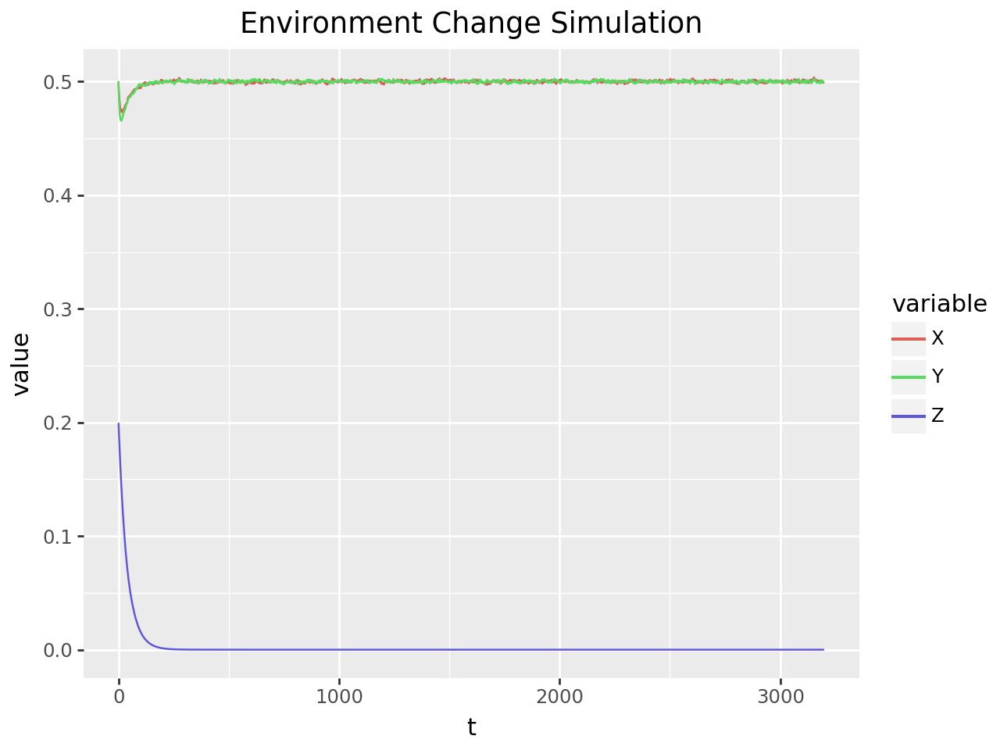

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.47
Lamprey Min Population: 0.47
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.4999999999999999, Lamprey Velocity: 0.29999999999999993


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


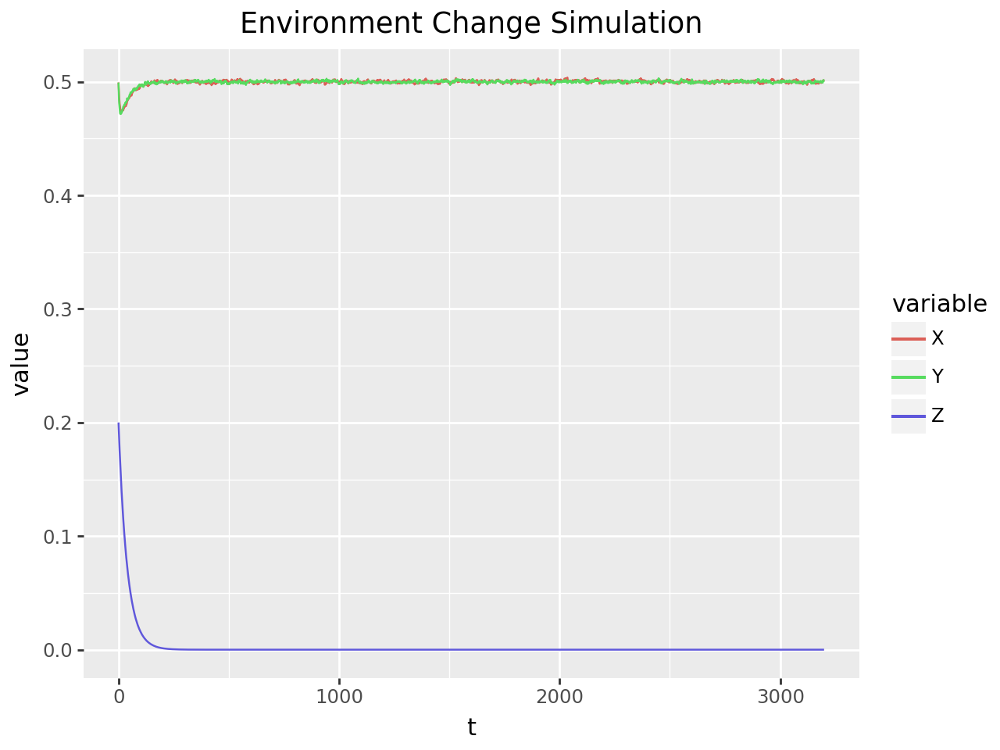

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.47
Lamprey Min Population: 0.47
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.4999999999999999, Lamprey Velocity: 0.3999999999999999


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


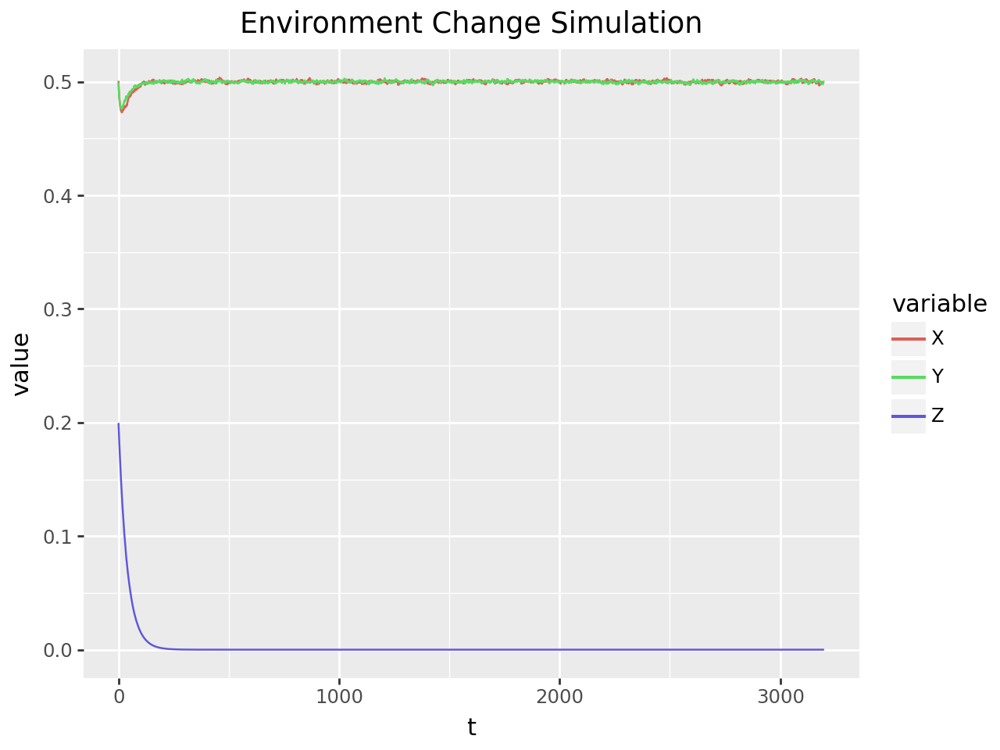

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.47
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.4999999999999999, Lamprey Velocity: 0.4999999999999999


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


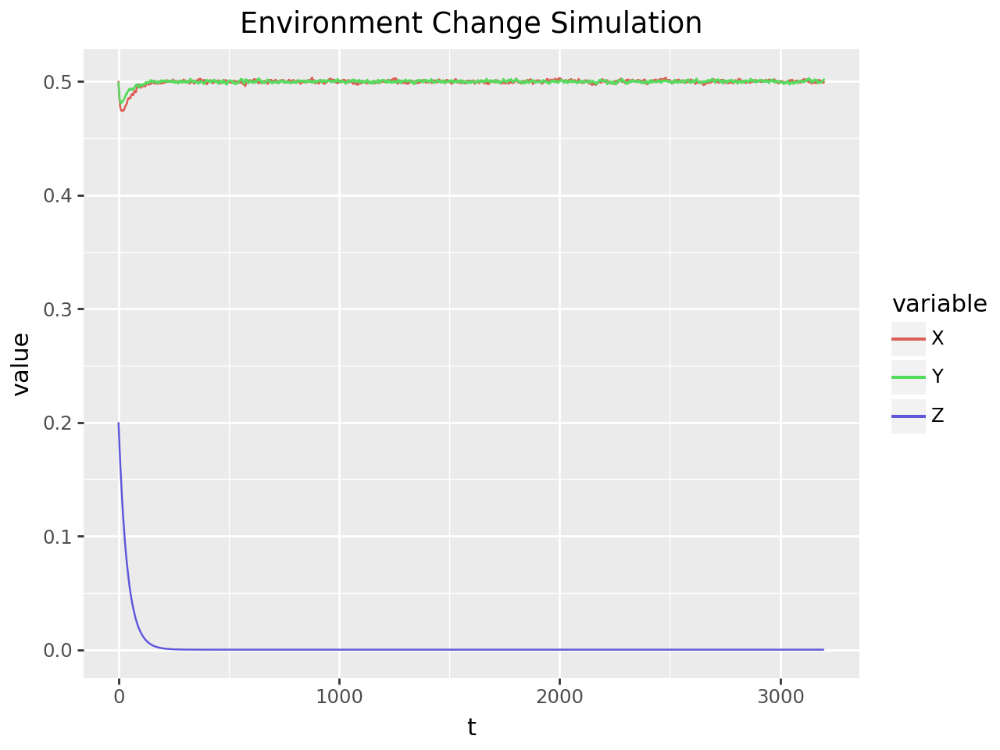

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.47
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.4999999999999999, Lamprey Velocity: 0.5999999999999999


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


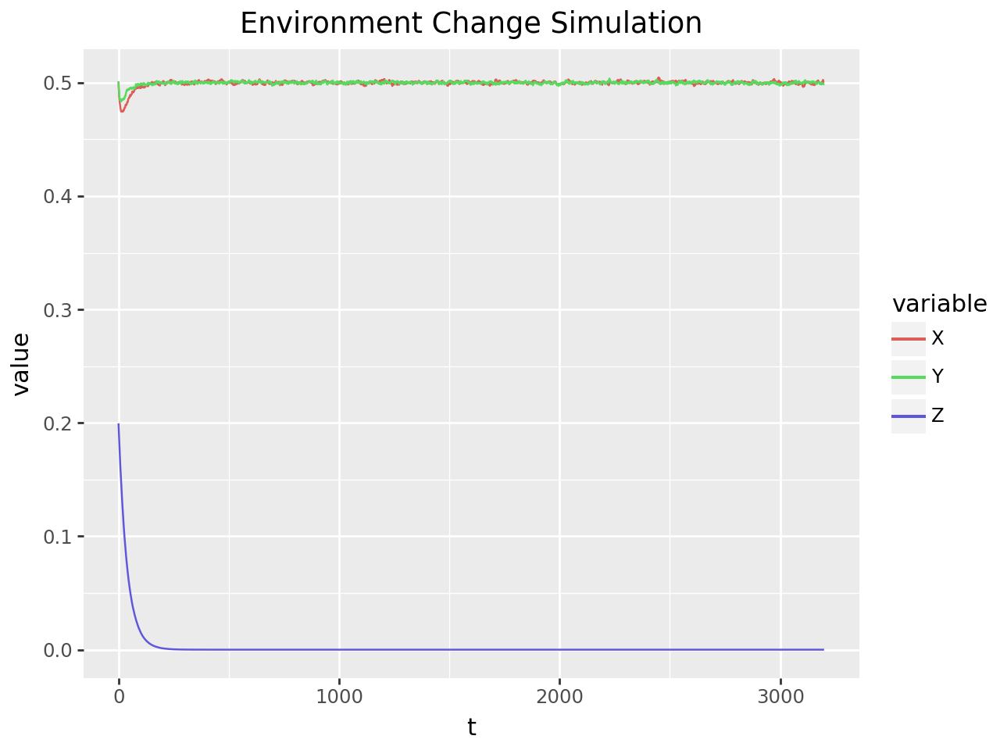

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.47
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.4999999999999999, Lamprey Velocity: 0.6999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


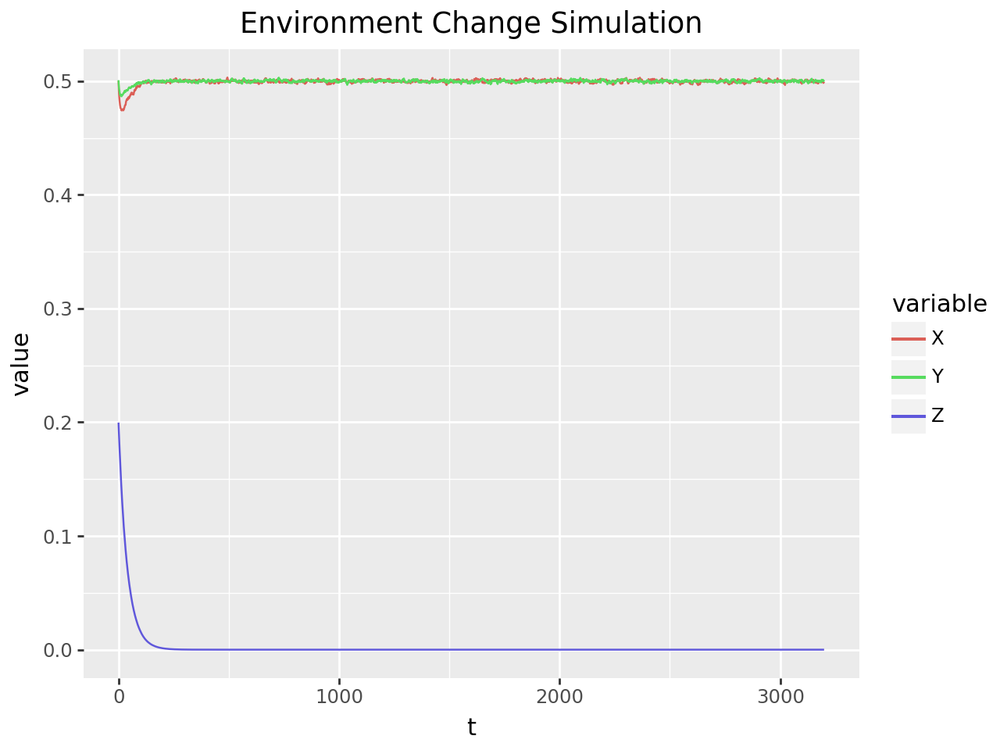

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.47
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.4999999999999999, Lamprey Velocity: 0.7999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


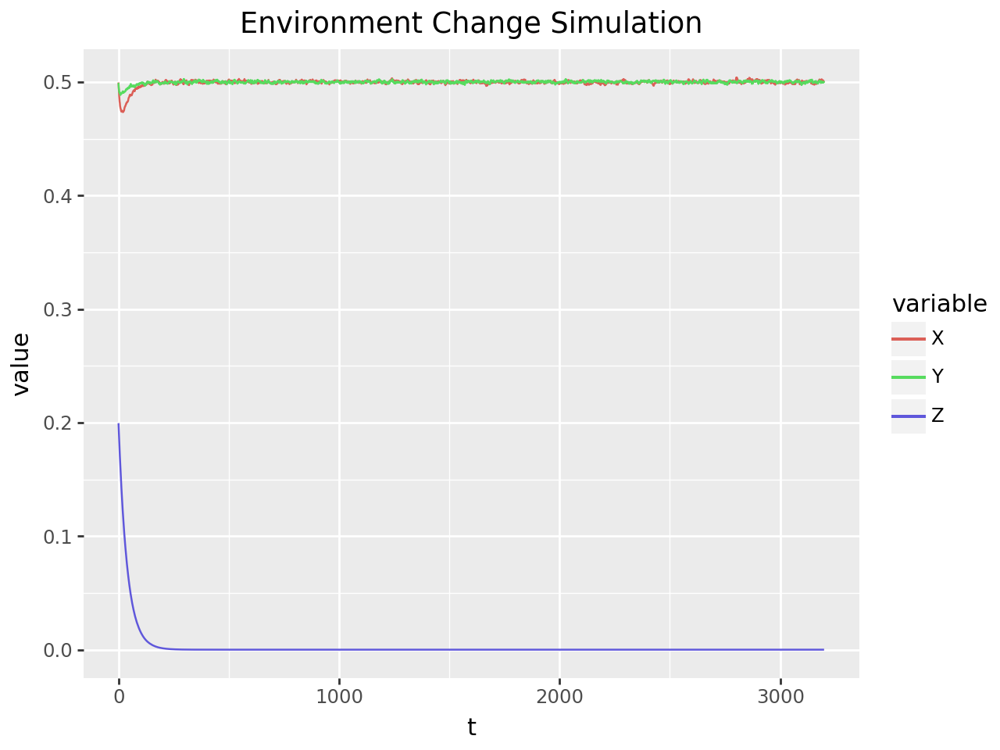

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.47
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.4999999999999999, Lamprey Velocity: 0.8999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


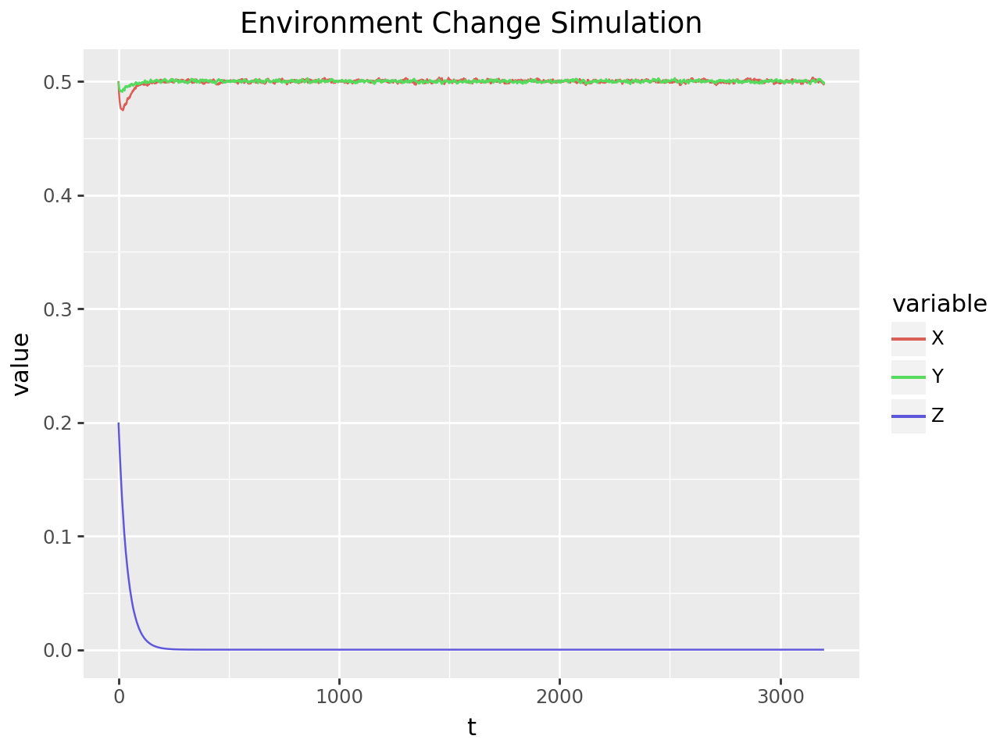

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.47
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.4999999999999999, Lamprey Velocity: 0.9999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


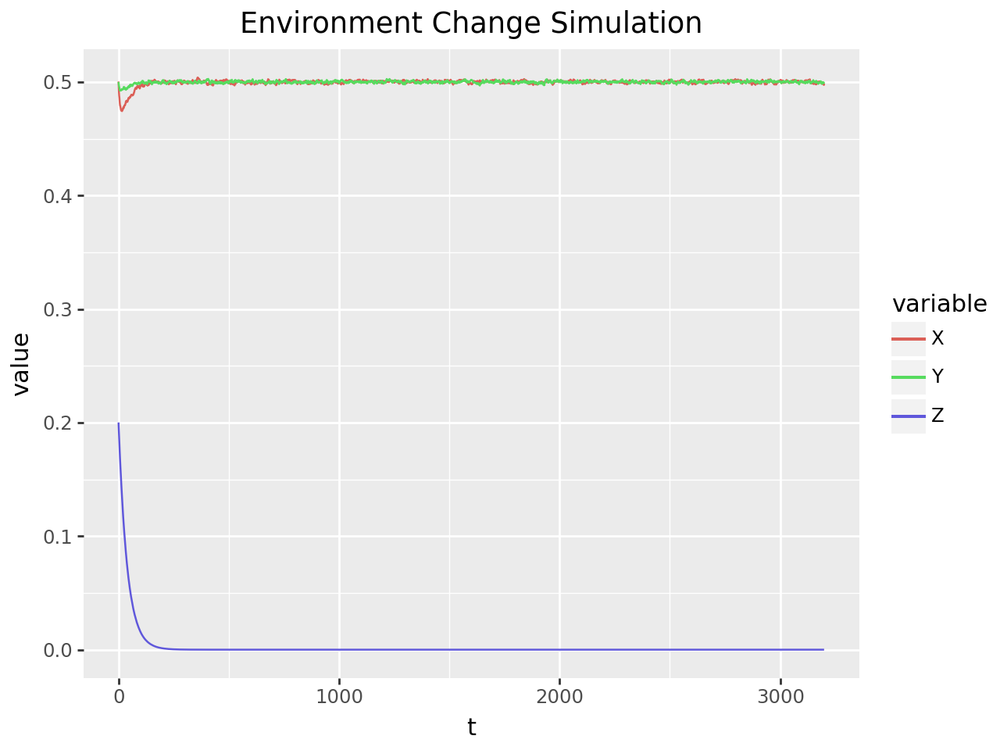

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.47
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.5999999999999999, Lamprey Velocity: 0.09999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


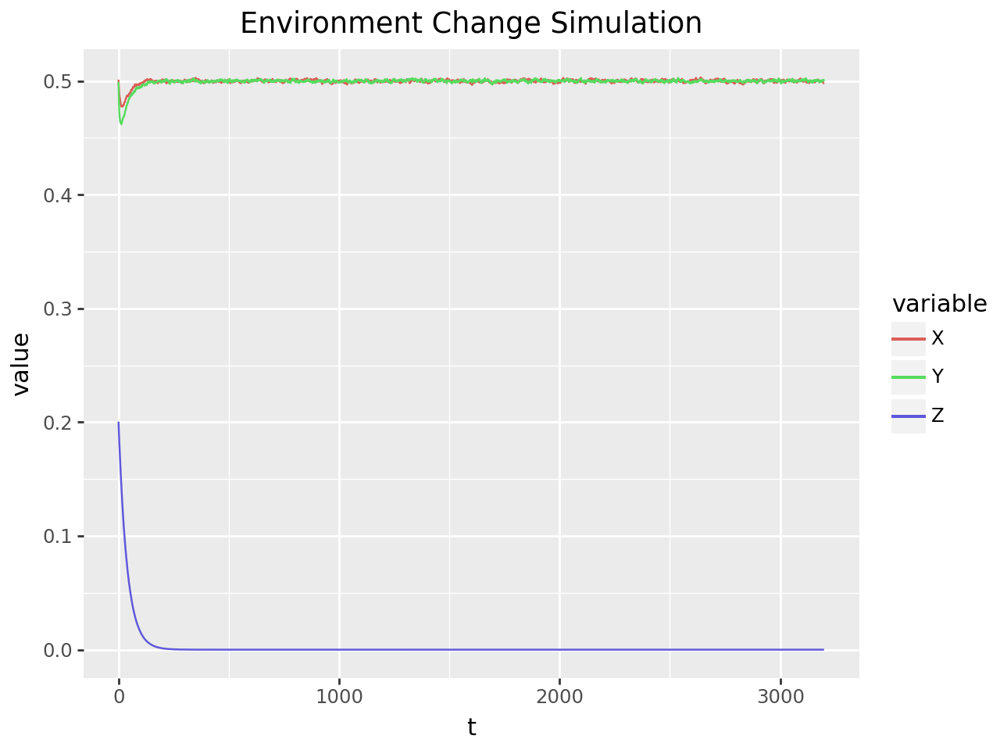

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.46
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.5999999999999999, Lamprey Velocity: 0.19999999999999996


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


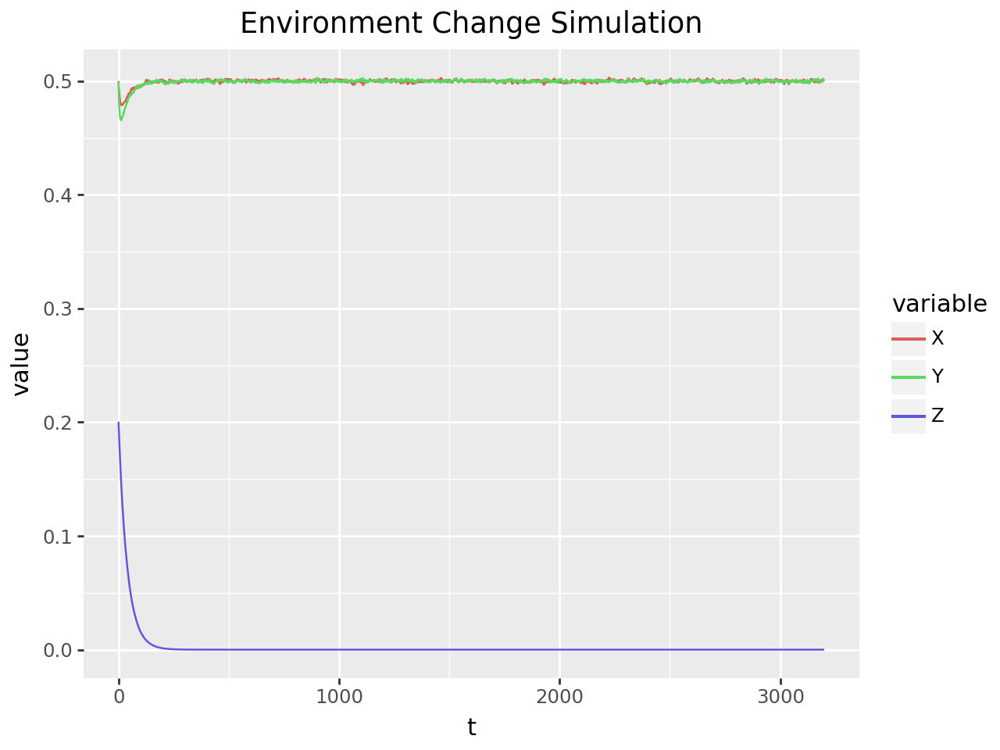

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.47
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.5999999999999999, Lamprey Velocity: 0.29999999999999993


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


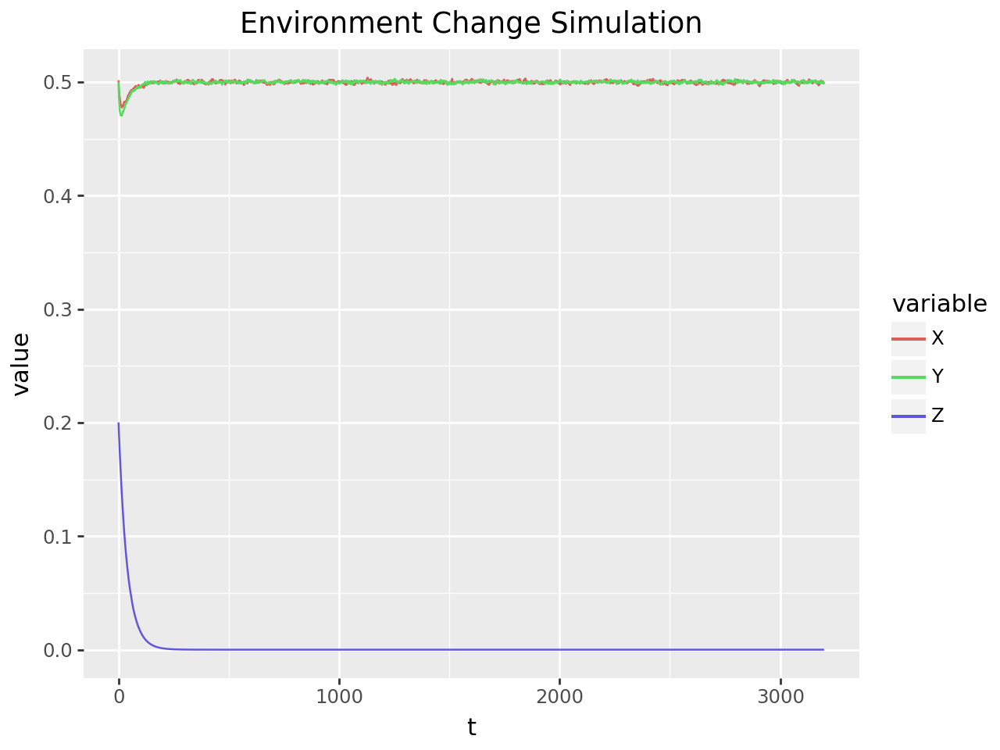

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.47
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.5999999999999999, Lamprey Velocity: 0.3999999999999999


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


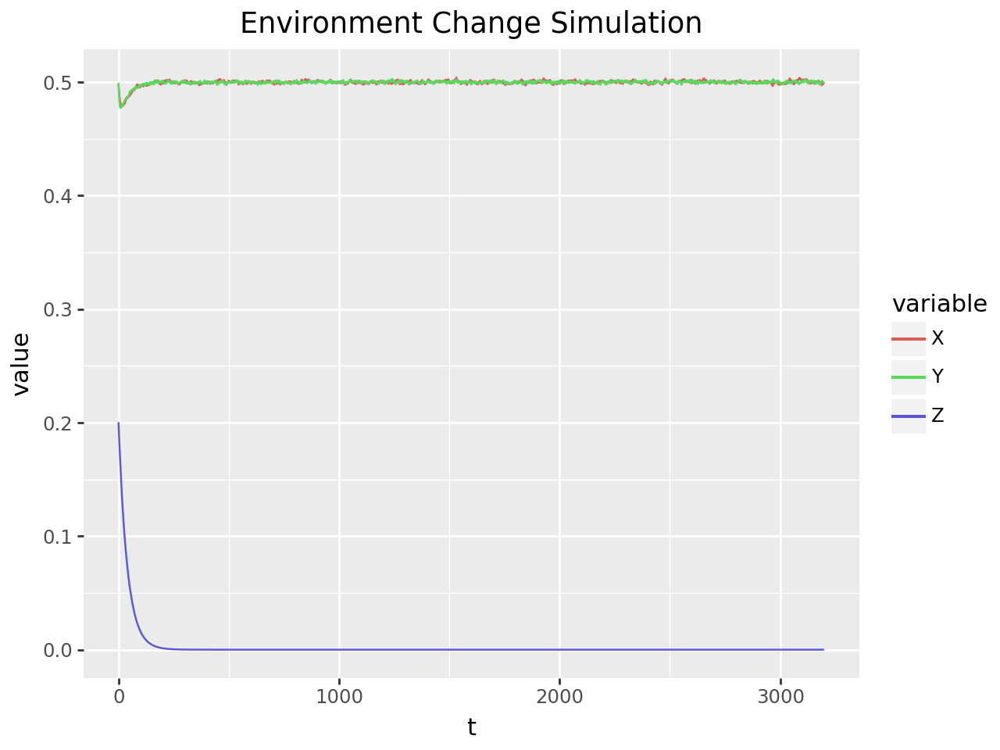

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.5999999999999999, Lamprey Velocity: 0.4999999999999999


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


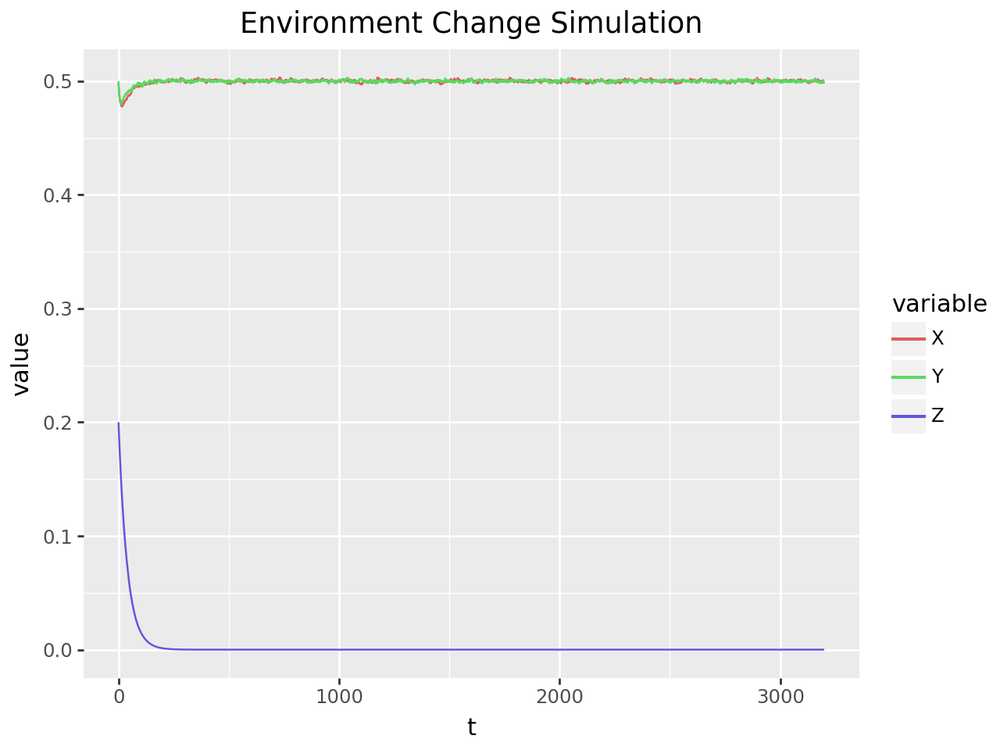

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.5999999999999999, Lamprey Velocity: 0.5999999999999999


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


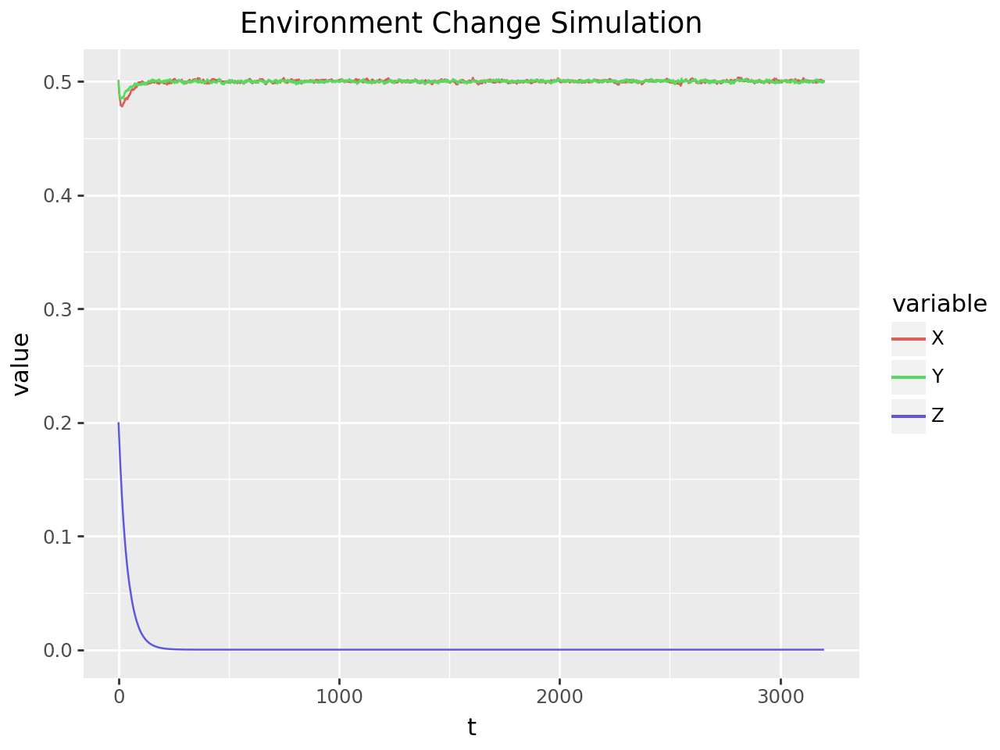

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.5999999999999999, Lamprey Velocity: 0.6999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


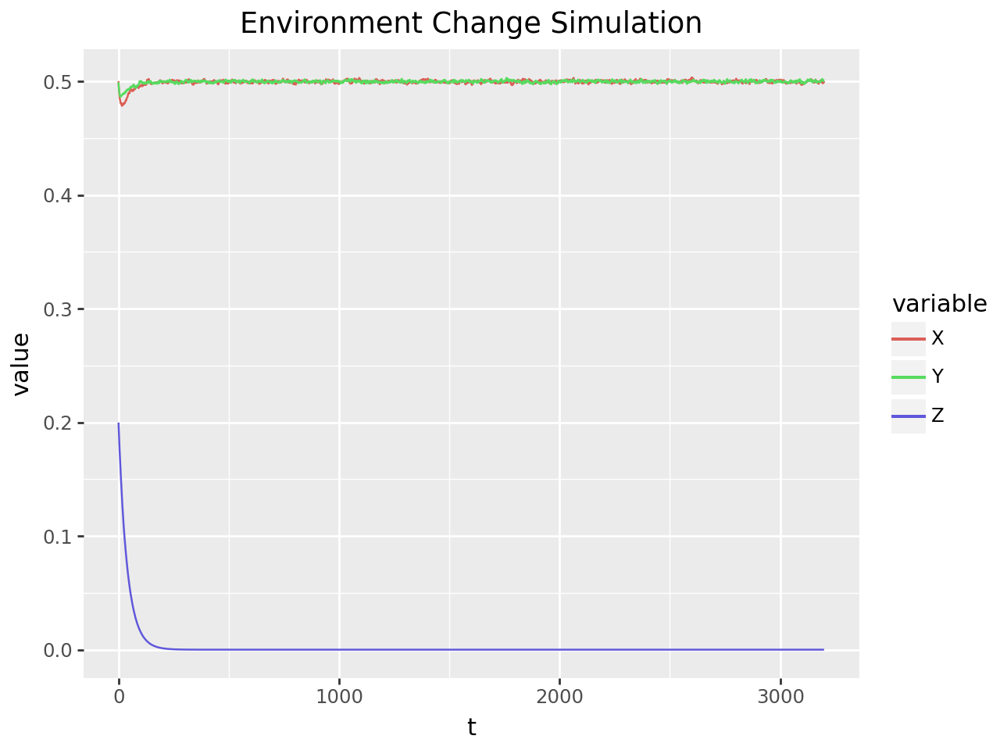

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.5999999999999999, Lamprey Velocity: 0.7999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


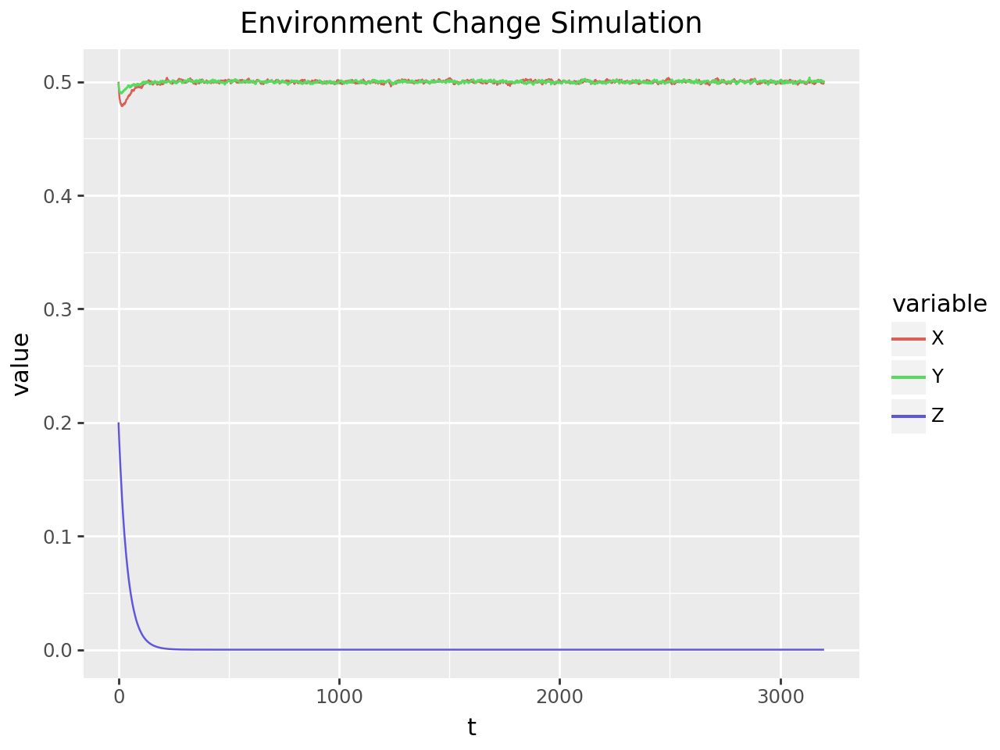

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.5999999999999999, Lamprey Velocity: 0.8999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


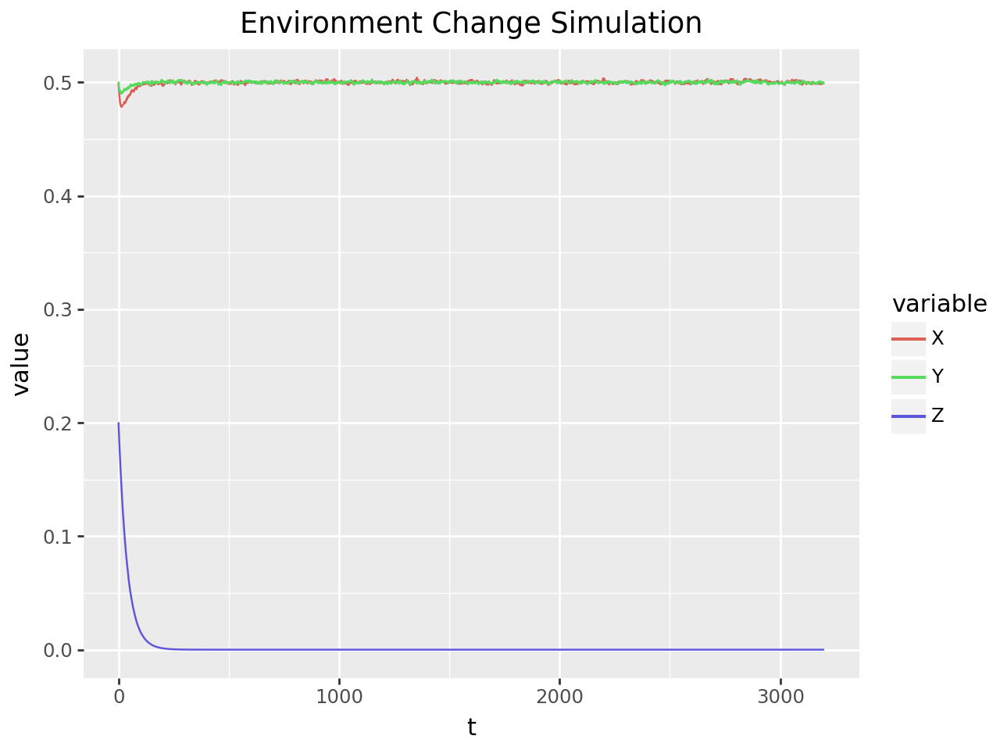

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.5999999999999999, Lamprey Velocity: 0.9999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


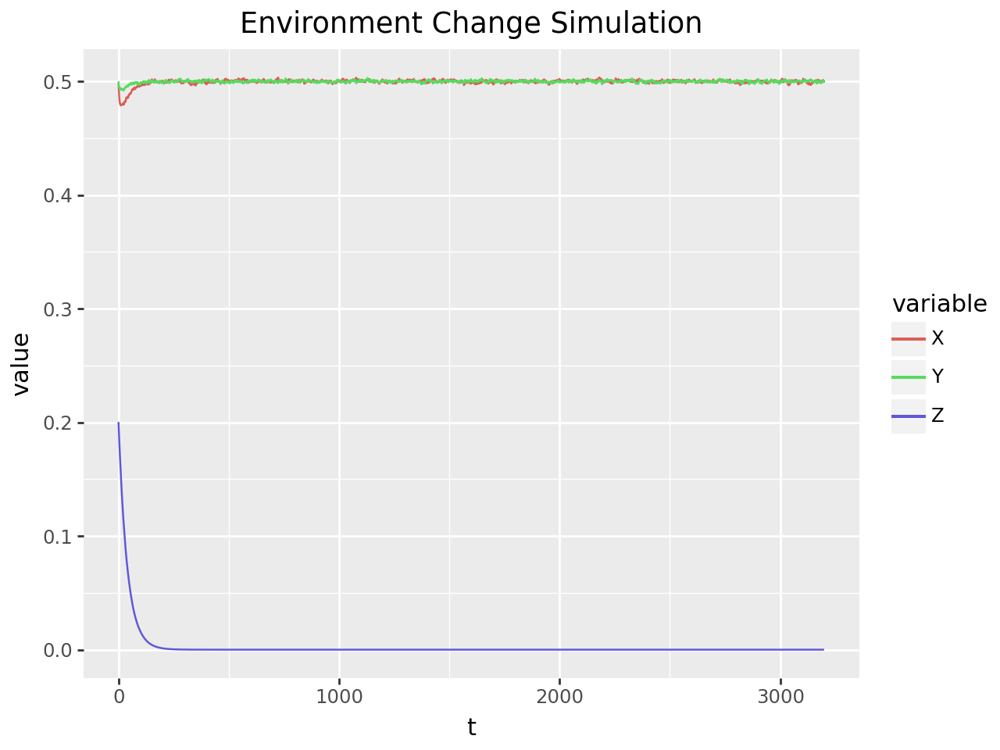

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.6999999999999998, Lamprey Velocity: 0.09999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


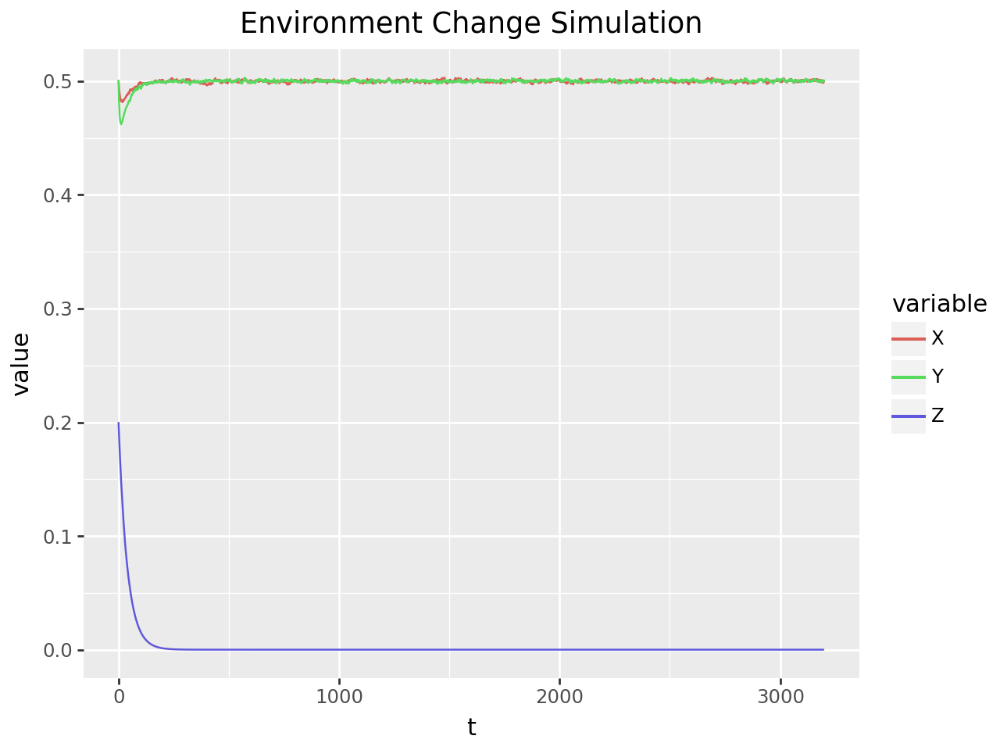

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.46
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.6999999999999998, Lamprey Velocity: 0.19999999999999996


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


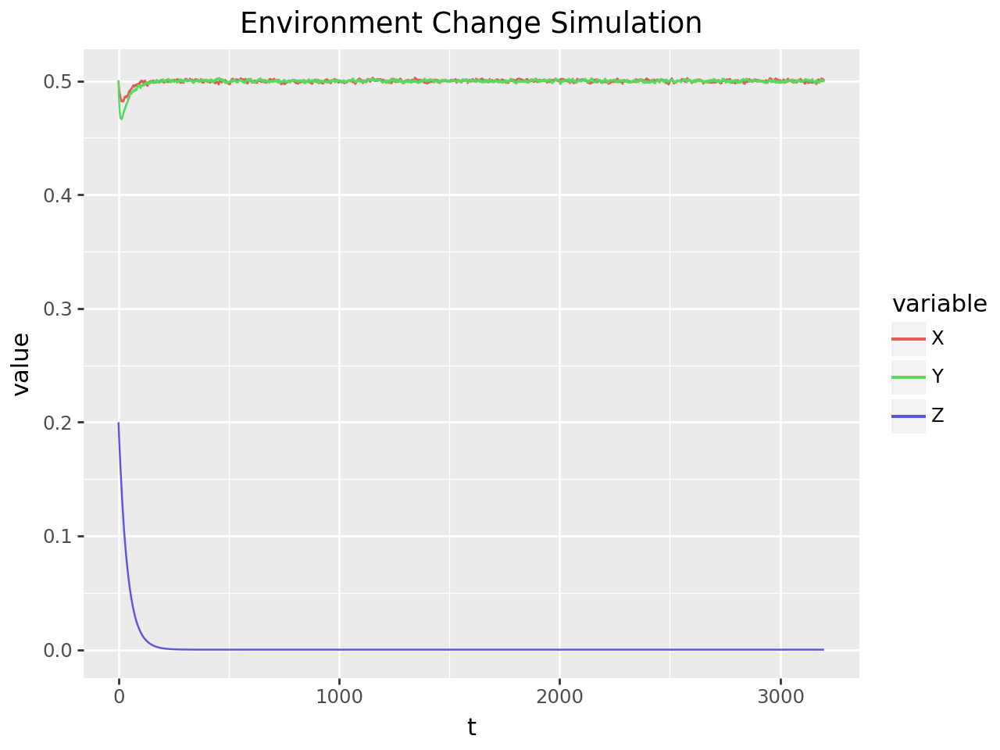

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.47
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.6999999999999998, Lamprey Velocity: 0.29999999999999993


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


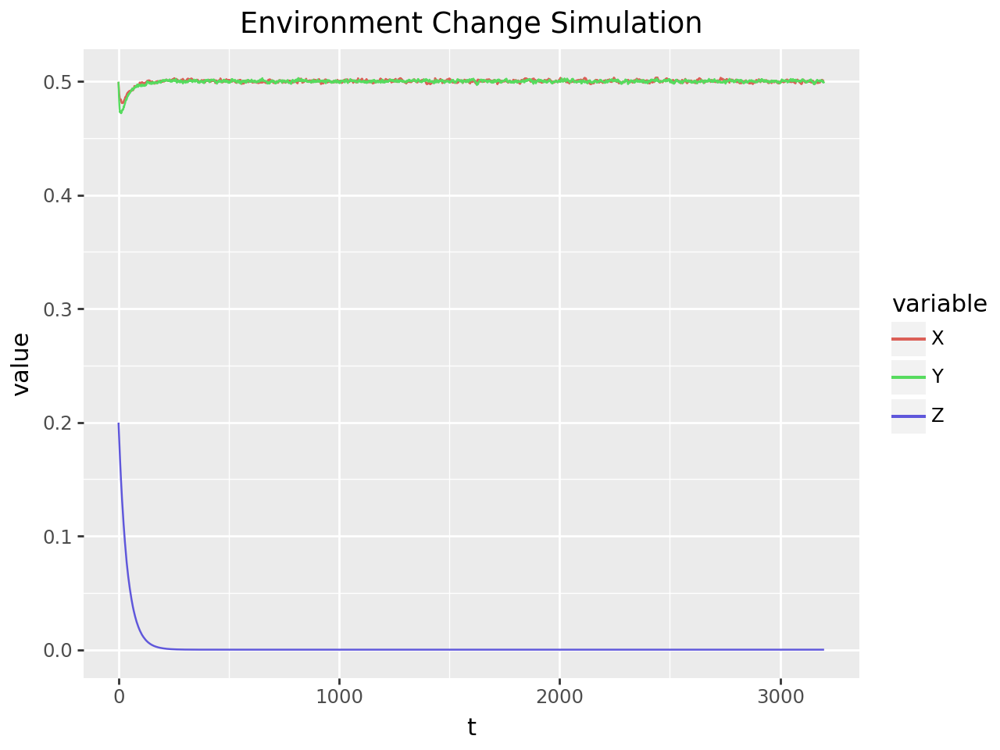

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.47
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.6999999999999998, Lamprey Velocity: 0.3999999999999999


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


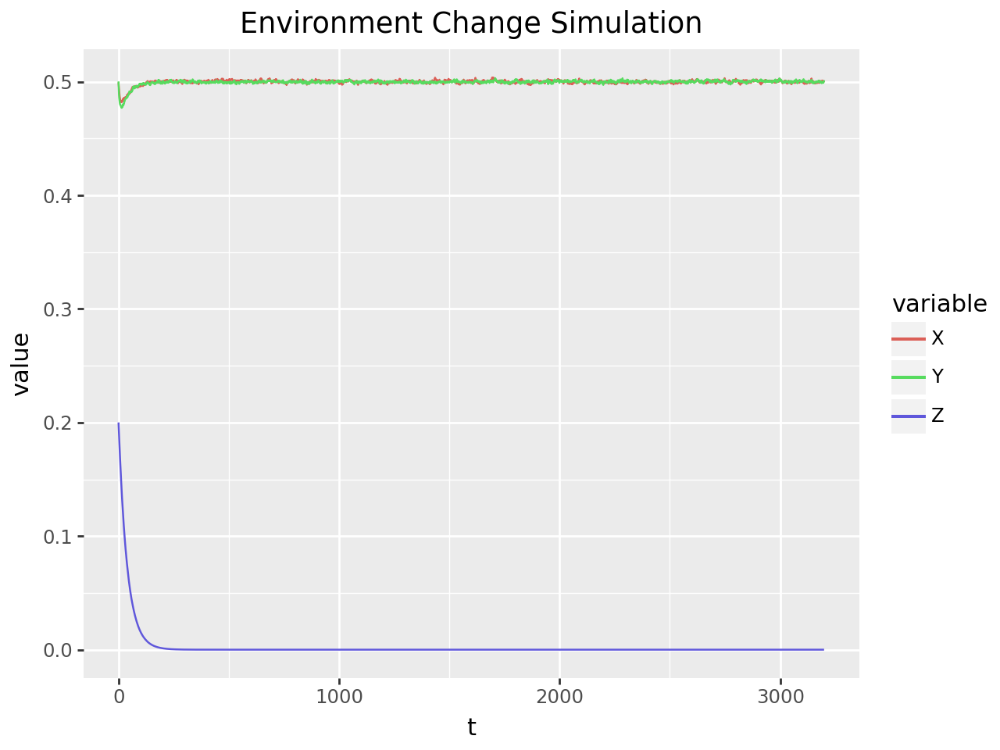

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.6999999999999998, Lamprey Velocity: 0.4999999999999999


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


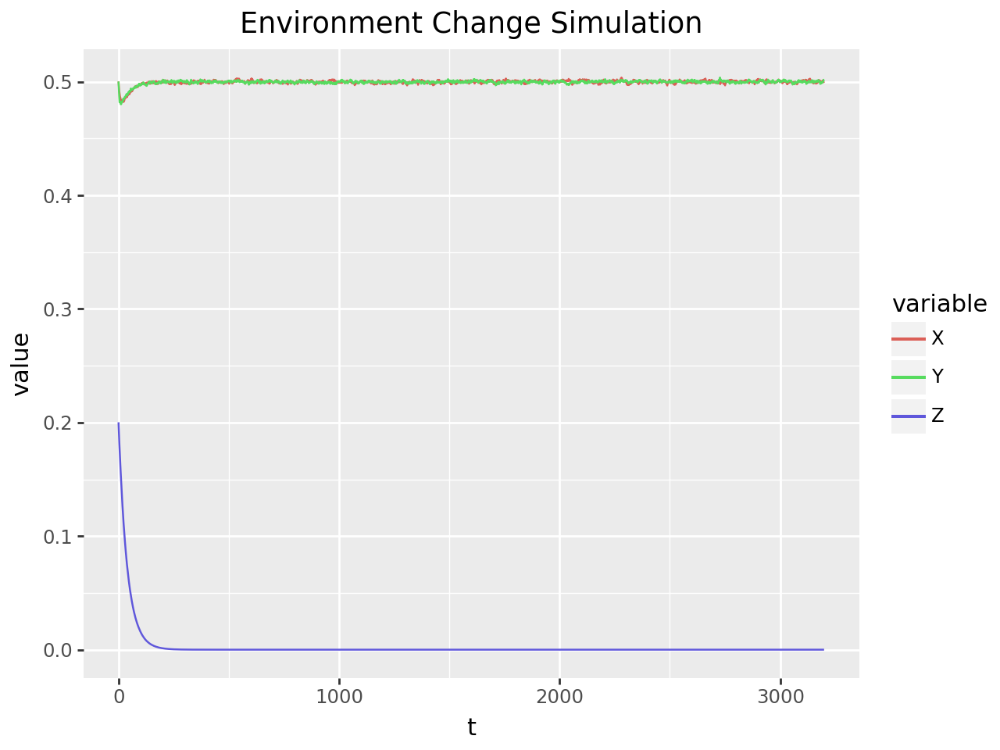

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.6999999999999998, Lamprey Velocity: 0.5999999999999999


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


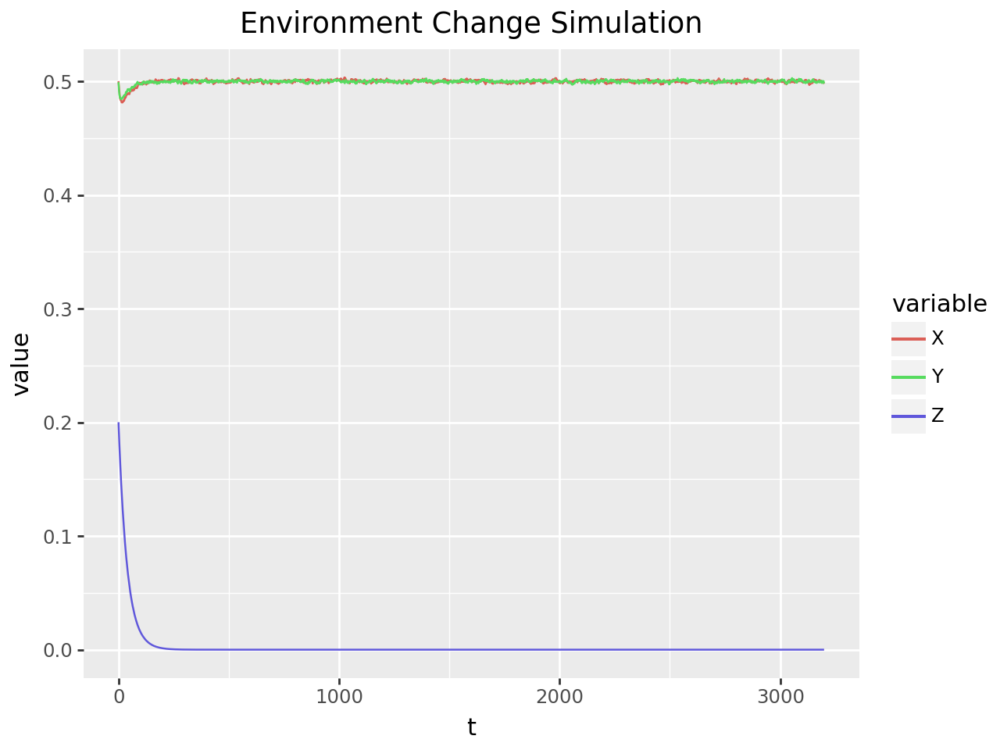

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.6999999999999998, Lamprey Velocity: 0.6999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


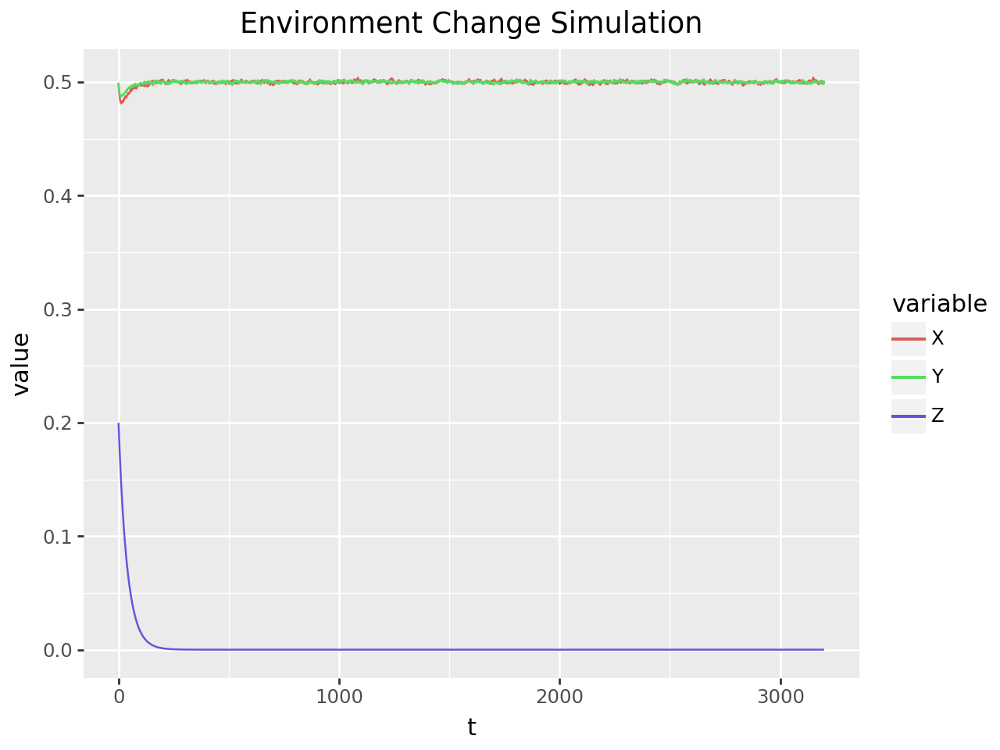

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.6999999999999998, Lamprey Velocity: 0.7999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


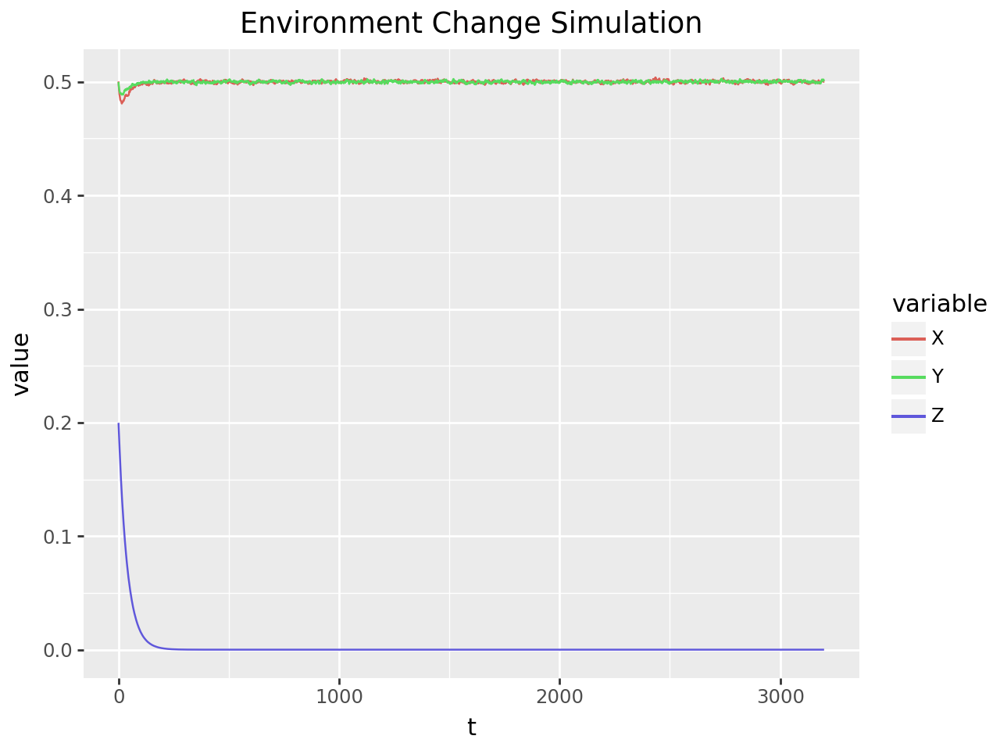

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.6999999999999998, Lamprey Velocity: 0.8999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


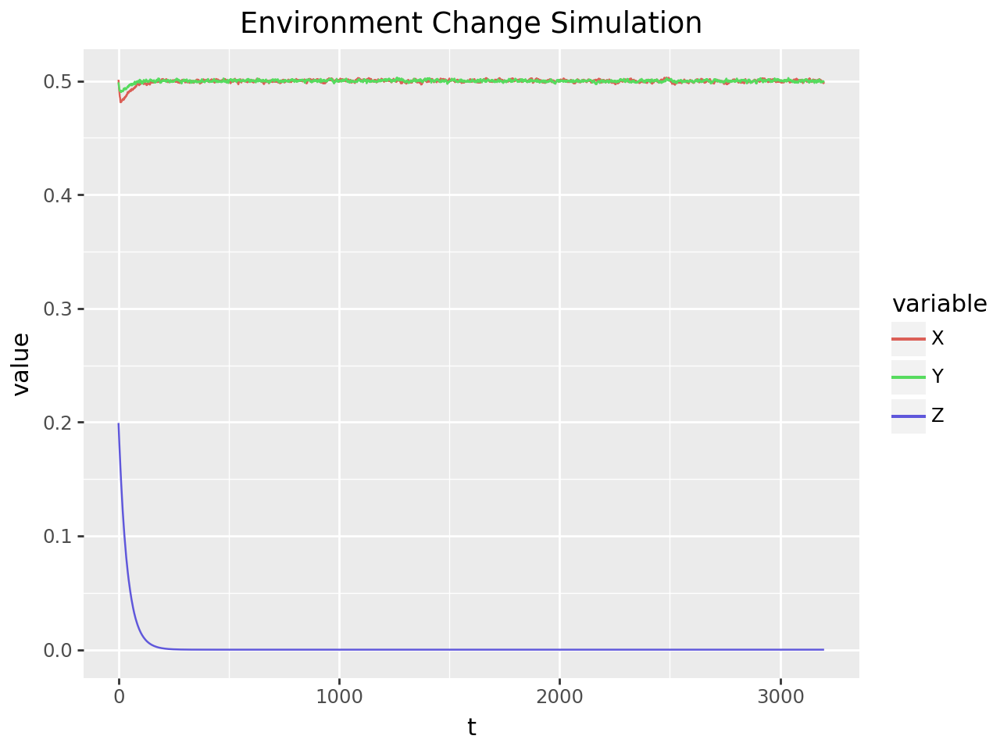

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.6999999999999998, Lamprey Velocity: 0.9999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


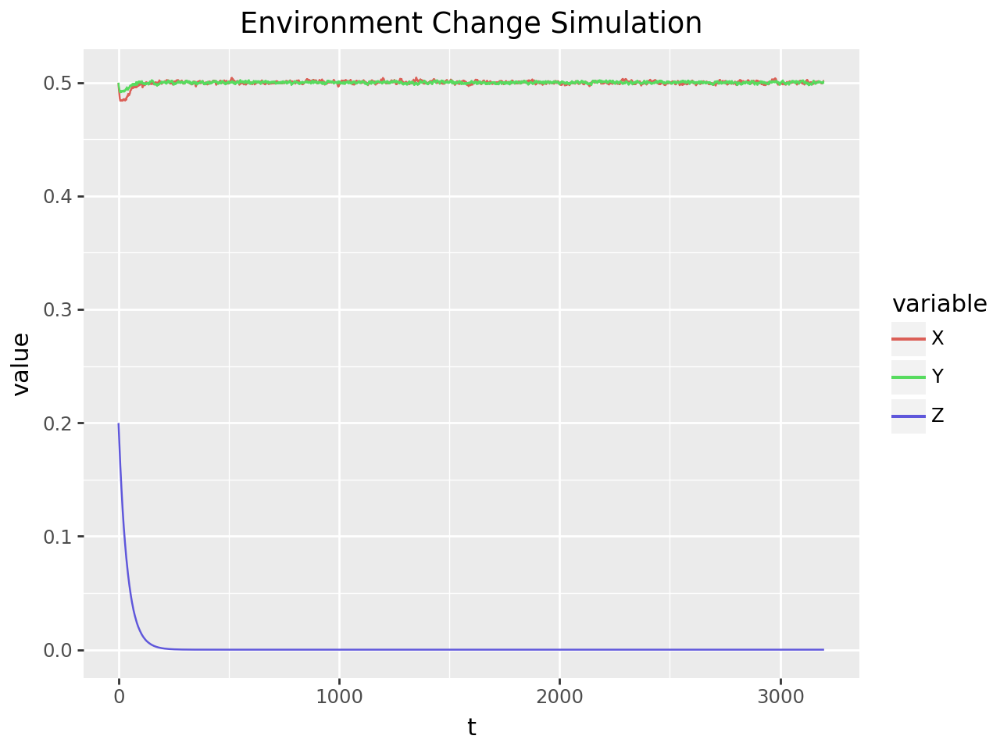

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.7999999999999998, Lamprey Velocity: 0.09999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


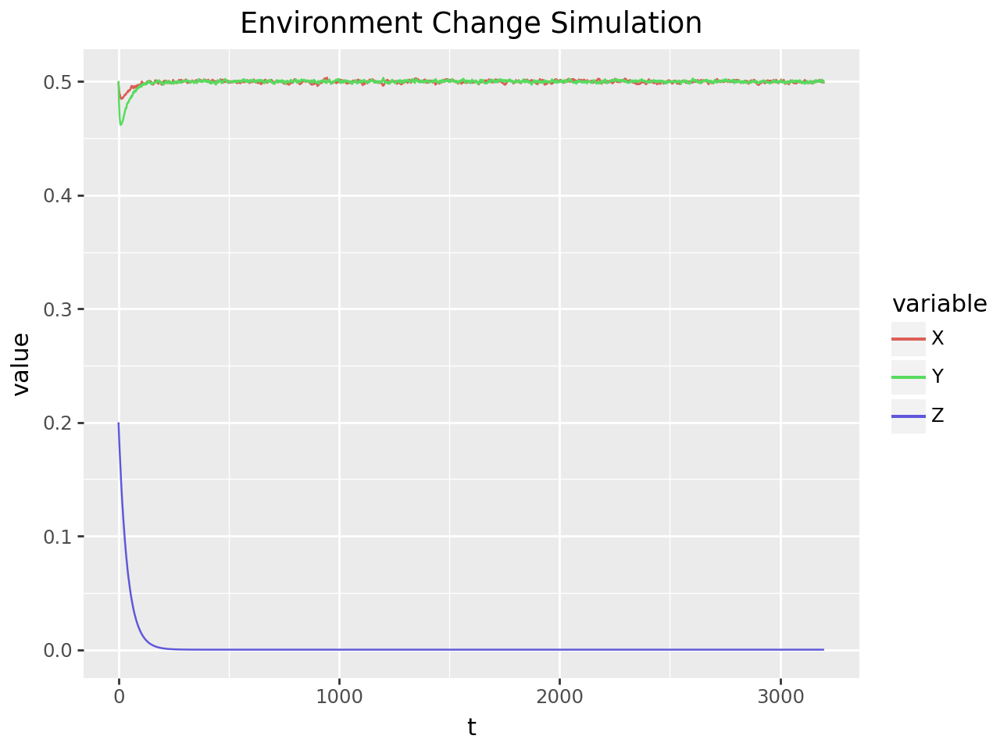

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.46
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.7999999999999998, Lamprey Velocity: 0.19999999999999996


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


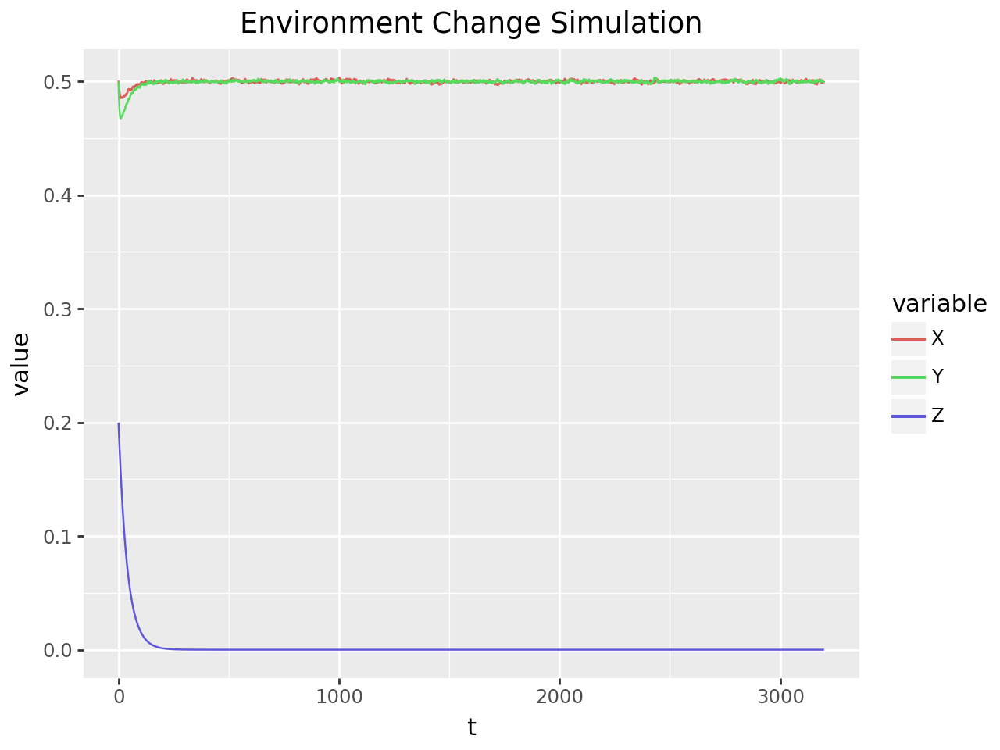

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.49
Lamprey Min Population: 0.47
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.7999999999999998, Lamprey Velocity: 0.29999999999999993


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


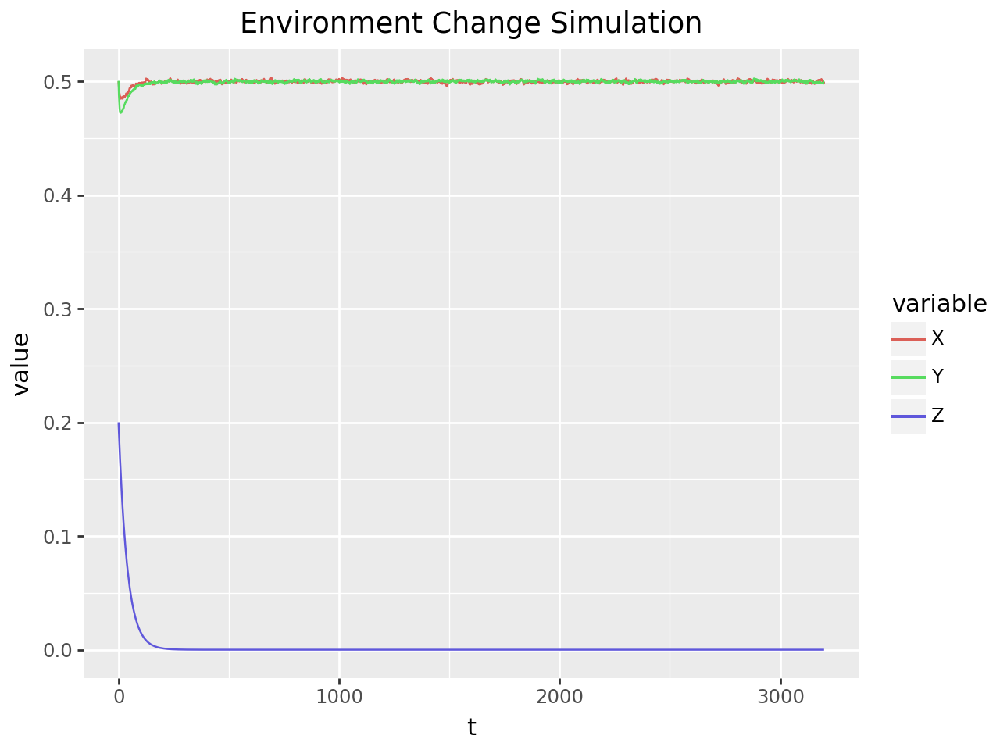

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.47
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.7999999999999998, Lamprey Velocity: 0.3999999999999999


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


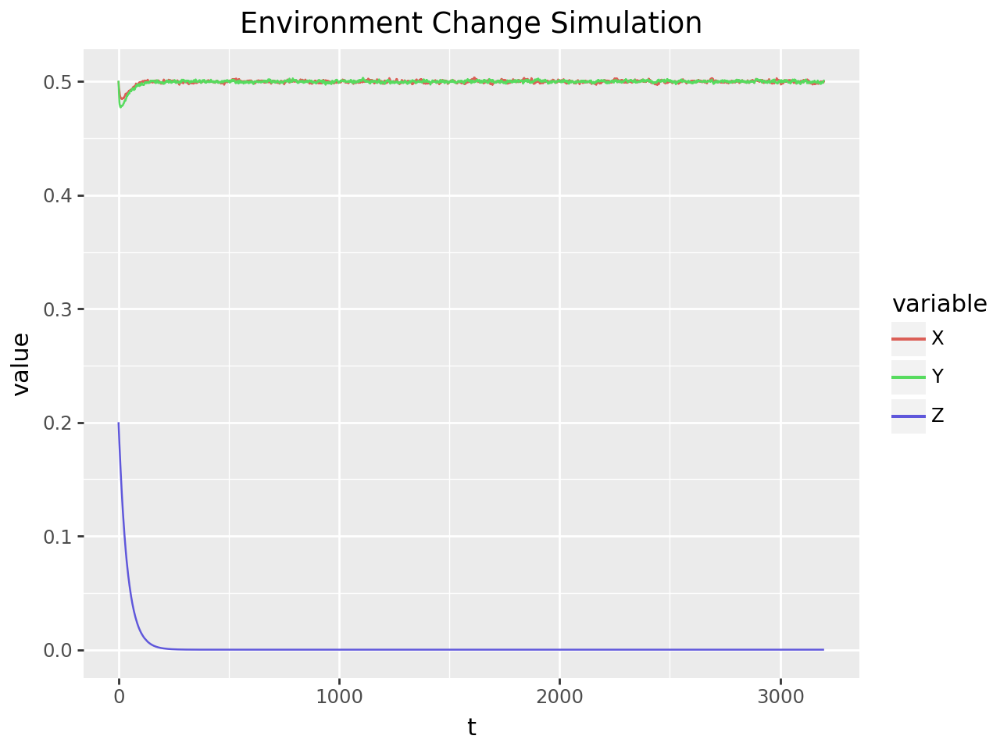

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.7999999999999998, Lamprey Velocity: 0.4999999999999999


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


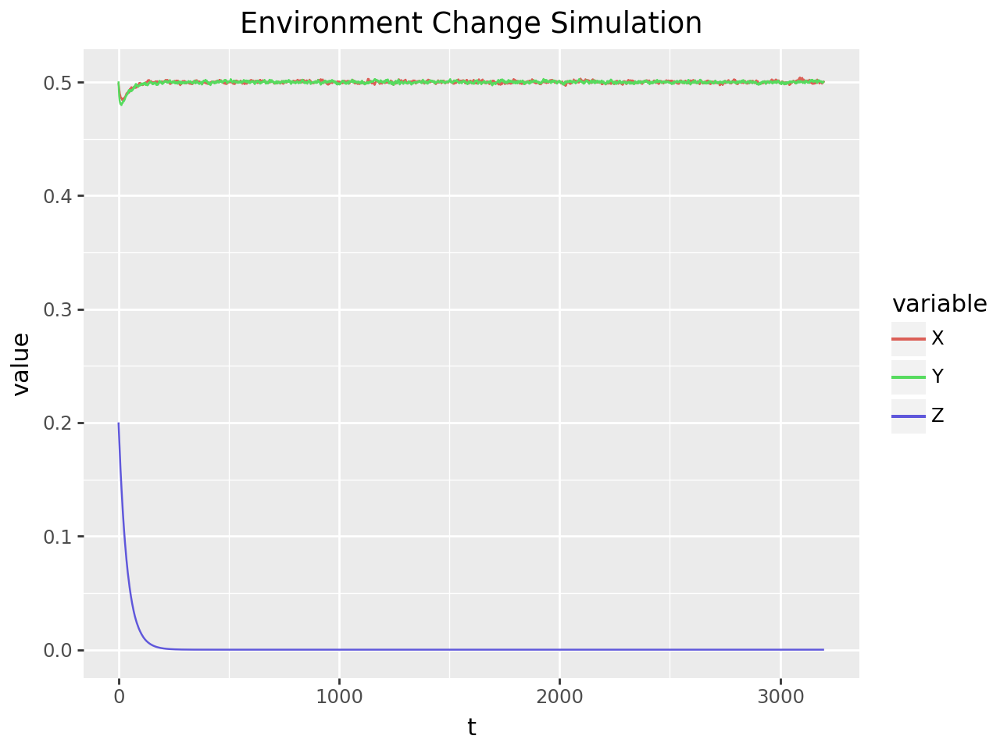

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.7999999999999998, Lamprey Velocity: 0.5999999999999999


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


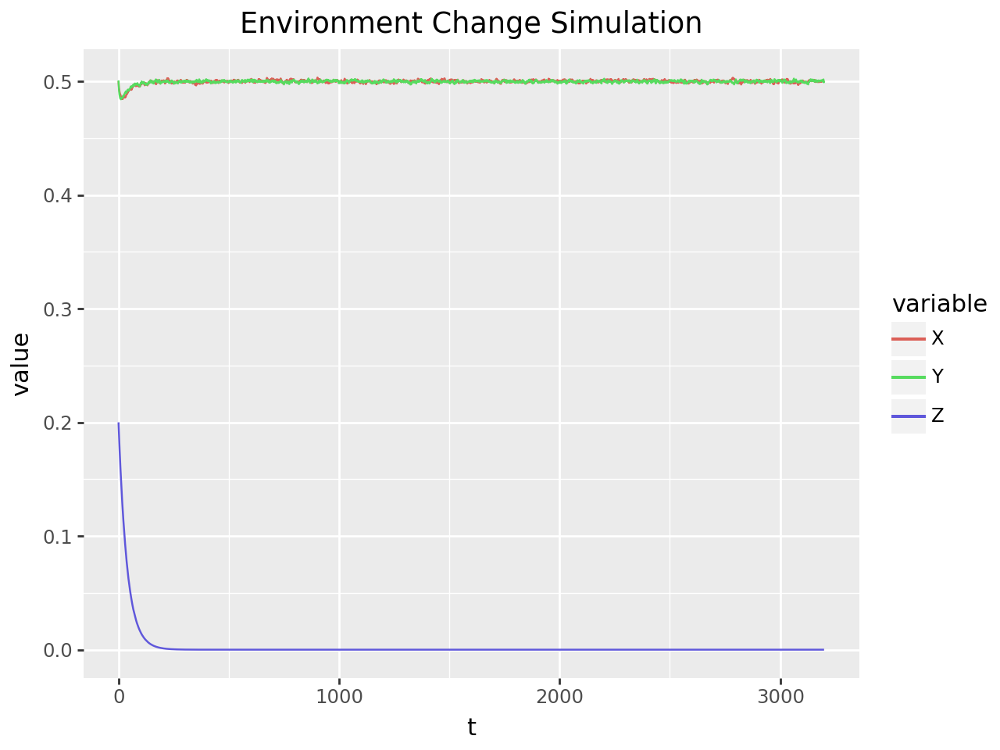

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.7999999999999998, Lamprey Velocity: 0.6999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


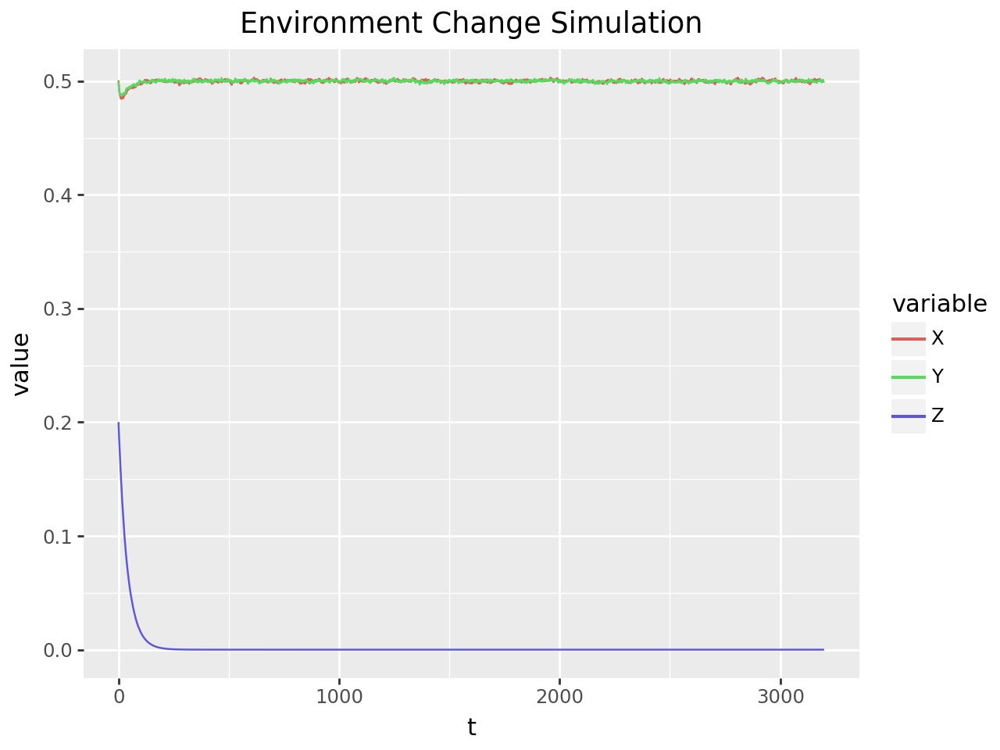

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.7999999999999998, Lamprey Velocity: 0.7999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


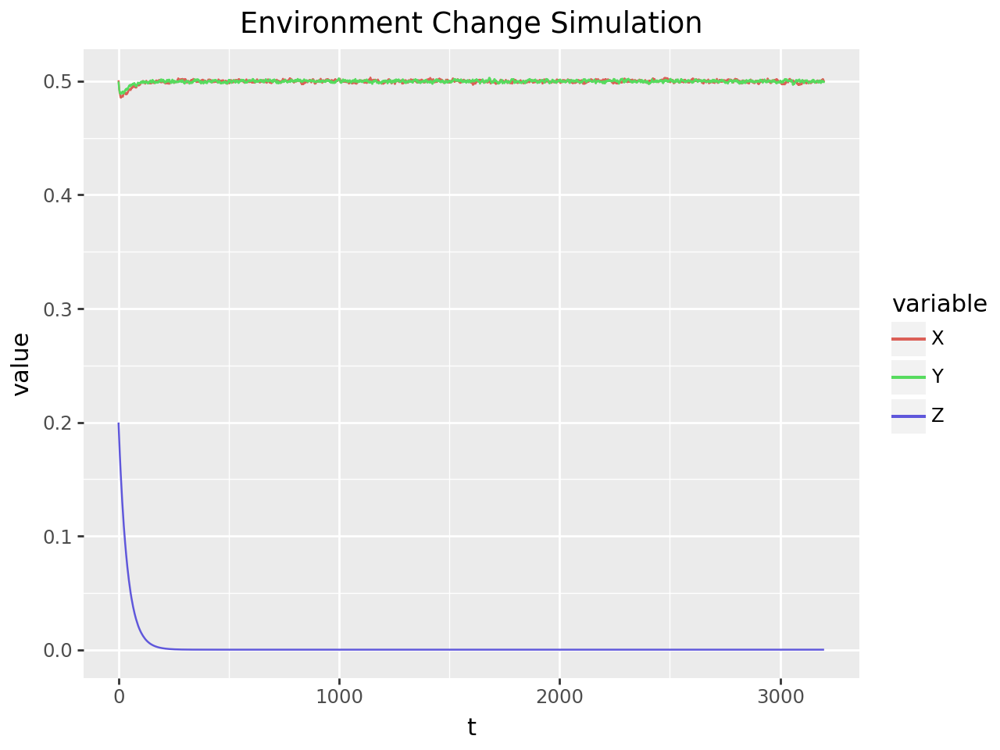

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.49
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.7999999999999998, Lamprey Velocity: 0.8999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


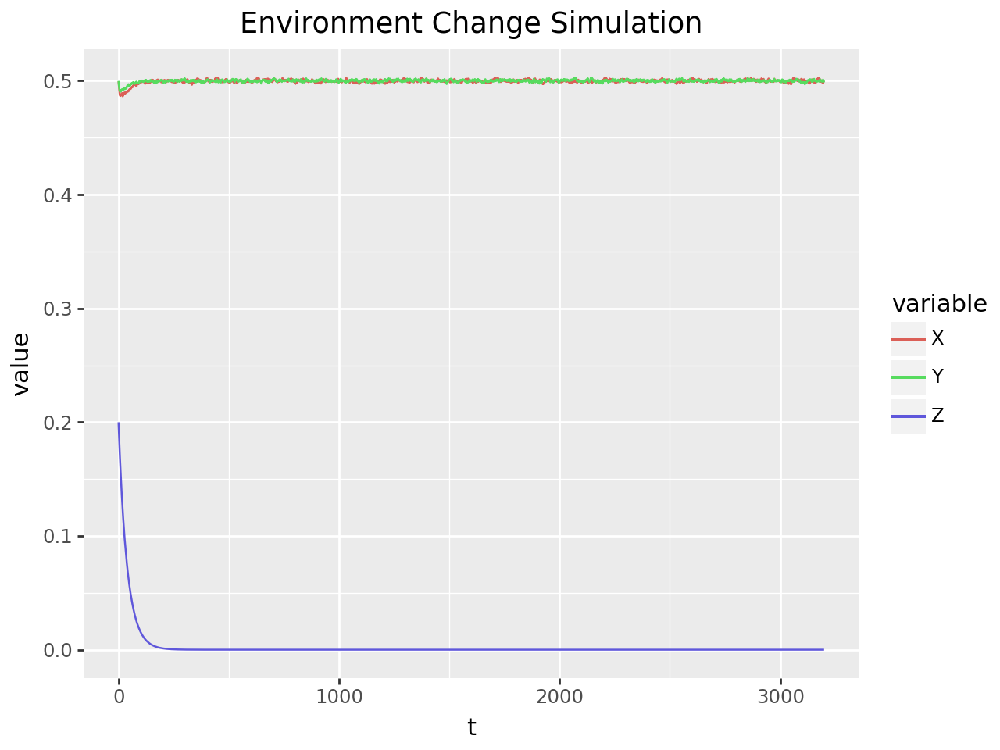

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.49
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.7999999999999998, Lamprey Velocity: 0.9999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


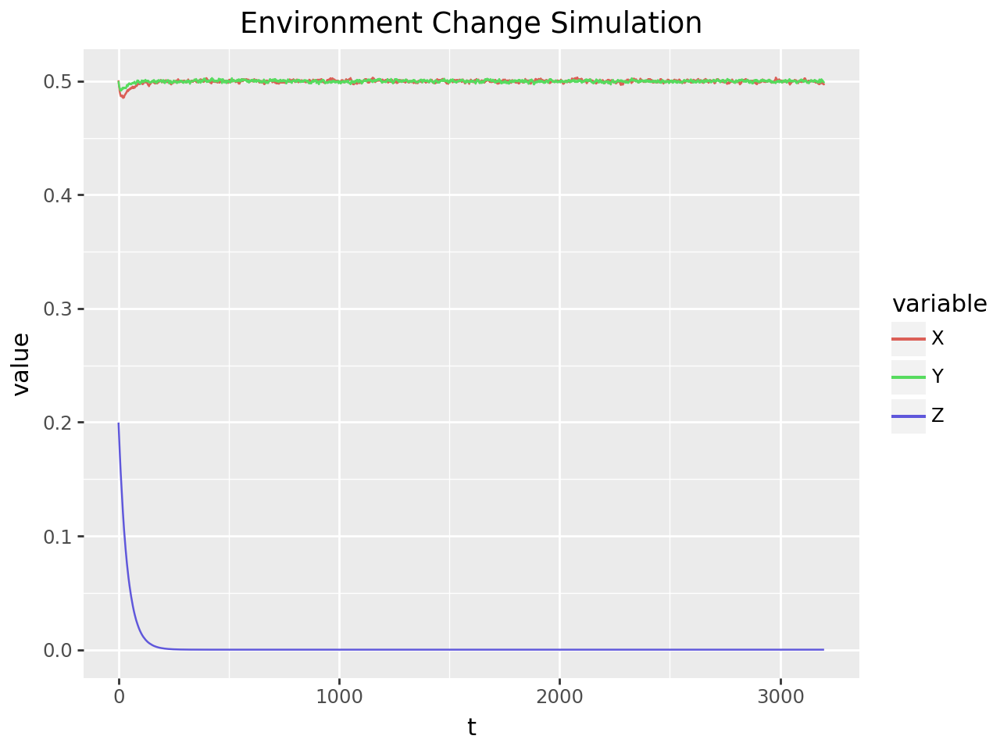

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.49
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.8999999999999998, Lamprey Velocity: 0.09999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


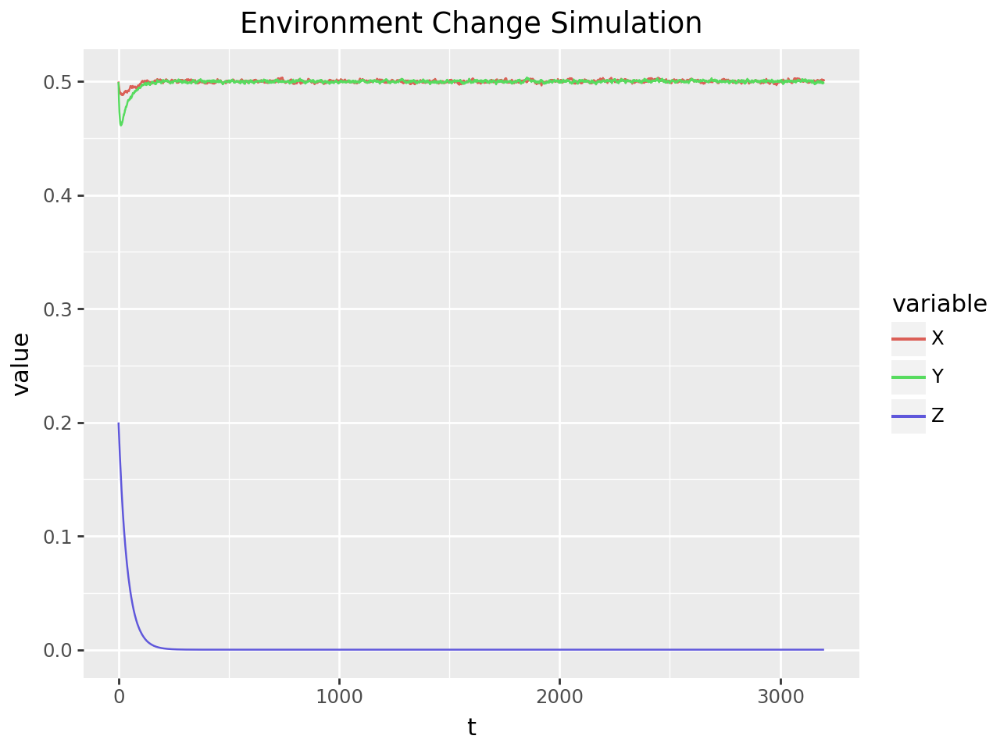

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.49
Lamprey Min Population: 0.46
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.8999999999999998, Lamprey Velocity: 0.19999999999999996


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


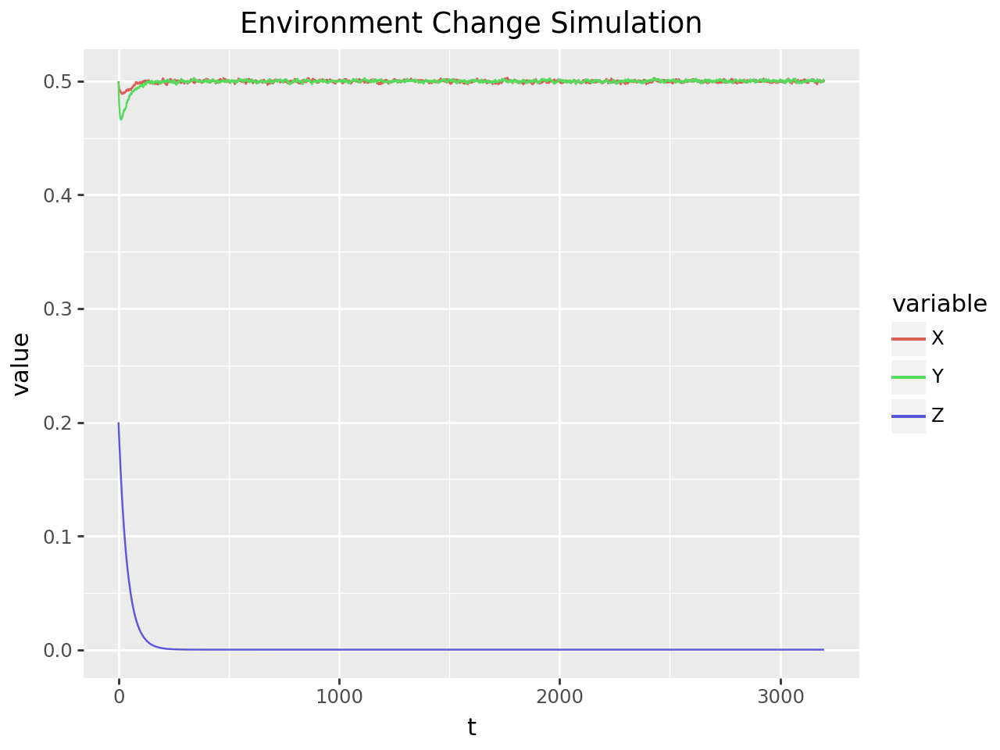

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.49
Lamprey Min Population: 0.47
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.8999999999999998, Lamprey Velocity: 0.29999999999999993


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


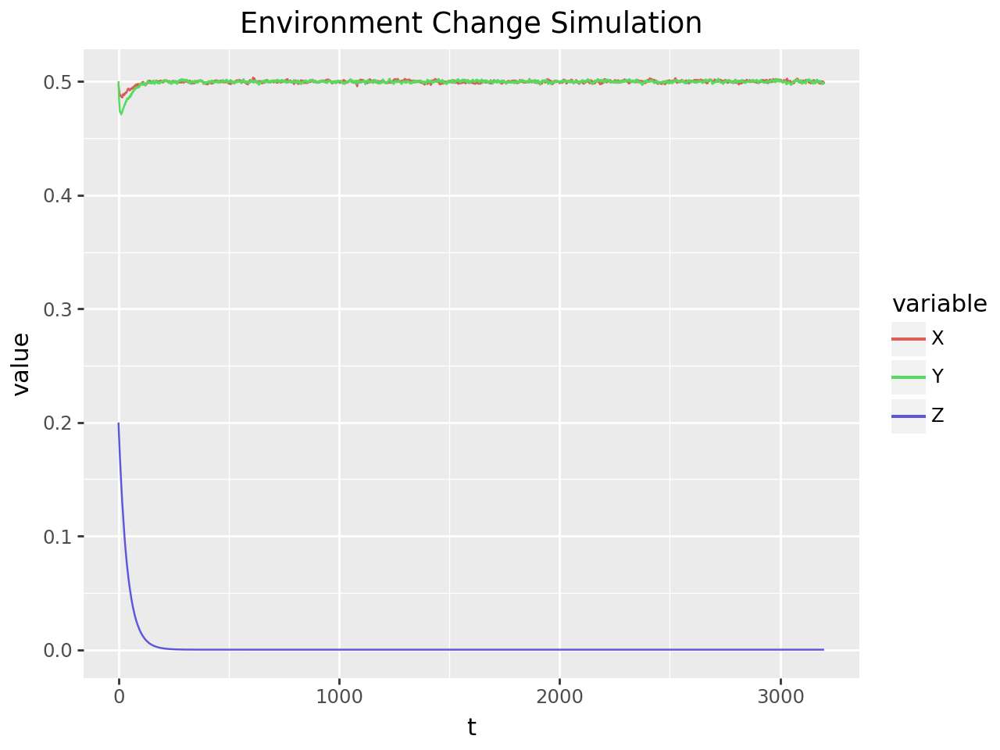

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.49
Lamprey Min Population: 0.47
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.8999999999999998, Lamprey Velocity: 0.3999999999999999


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


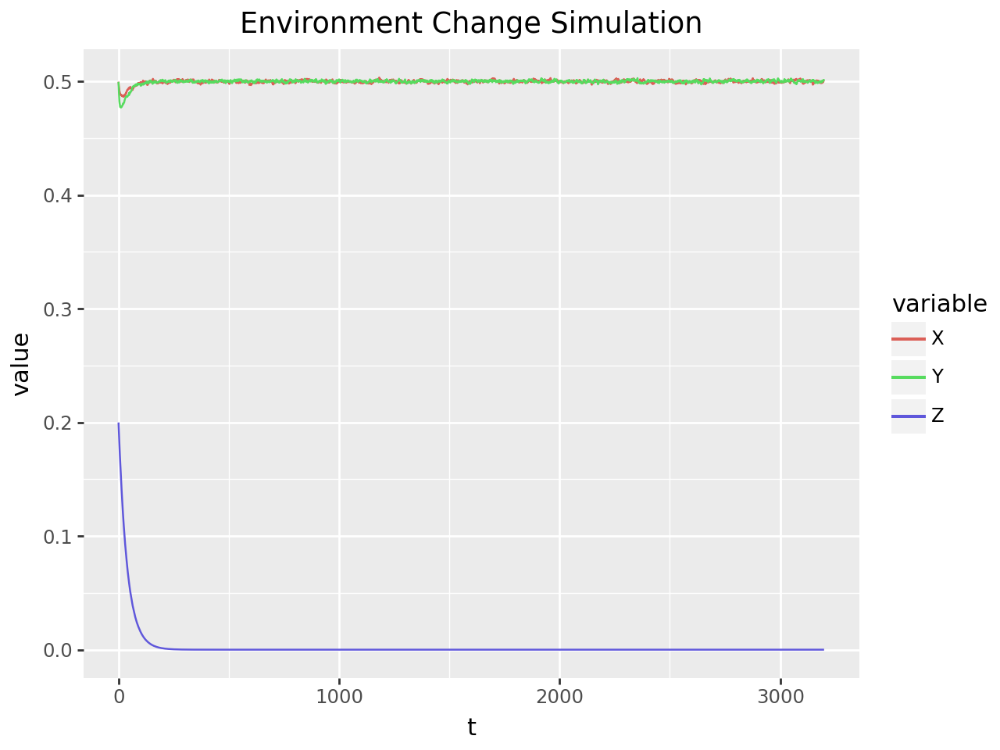

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.49
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.8999999999999998, Lamprey Velocity: 0.4999999999999999


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


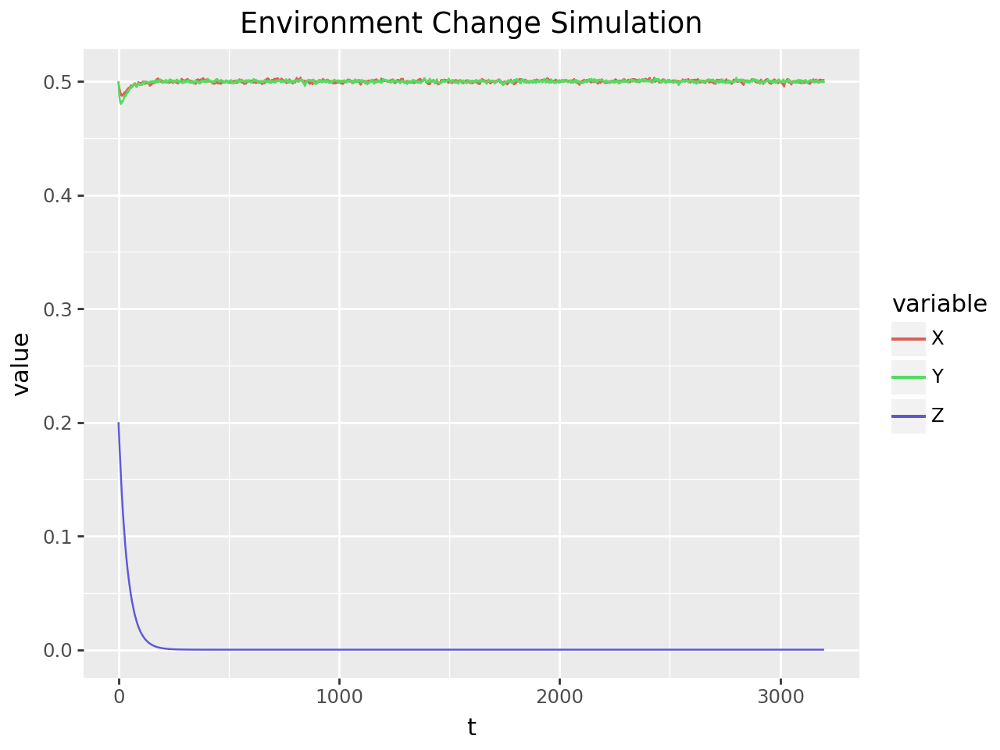

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.49
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.8999999999999998, Lamprey Velocity: 0.5999999999999999


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


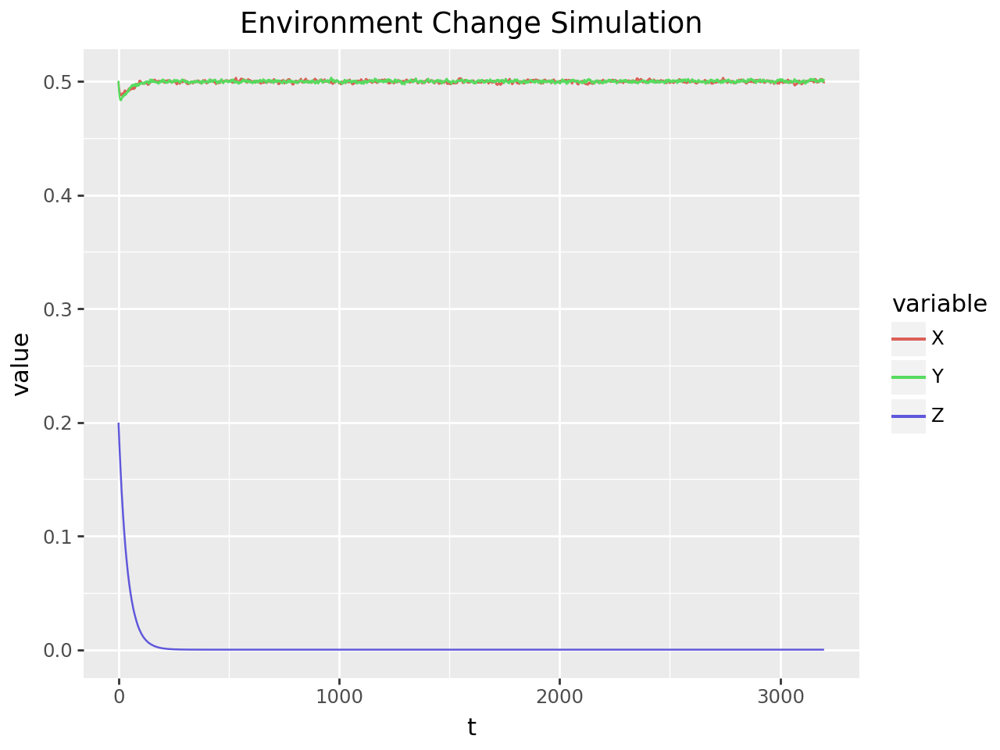

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.49
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.8999999999999998, Lamprey Velocity: 0.6999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


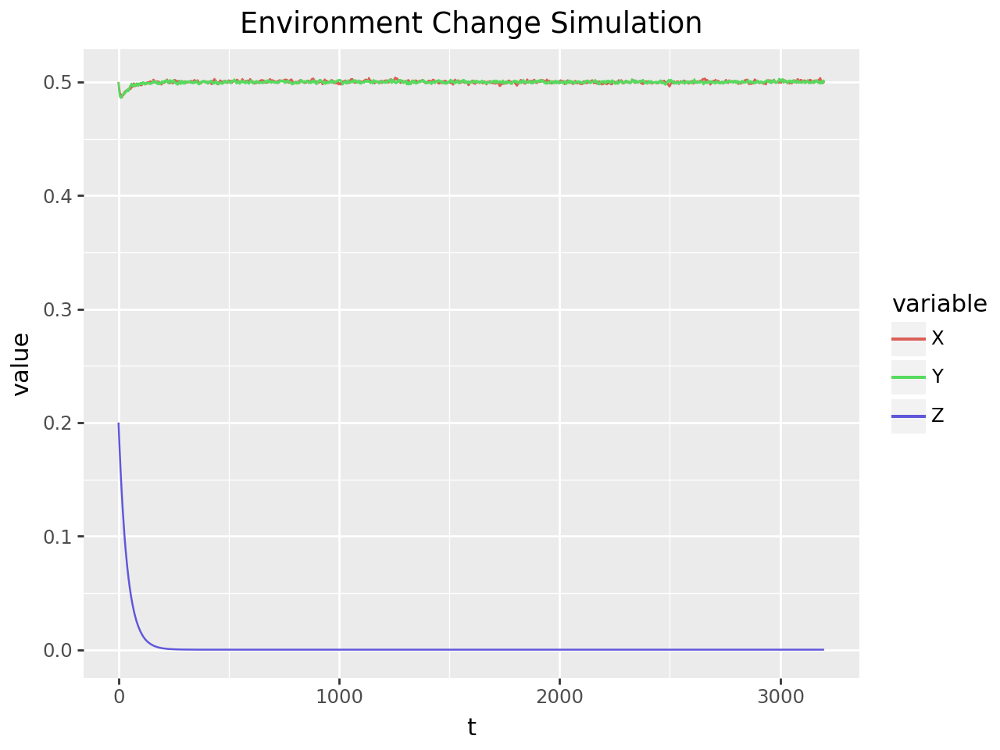

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.49
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.8999999999999998, Lamprey Velocity: 0.7999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


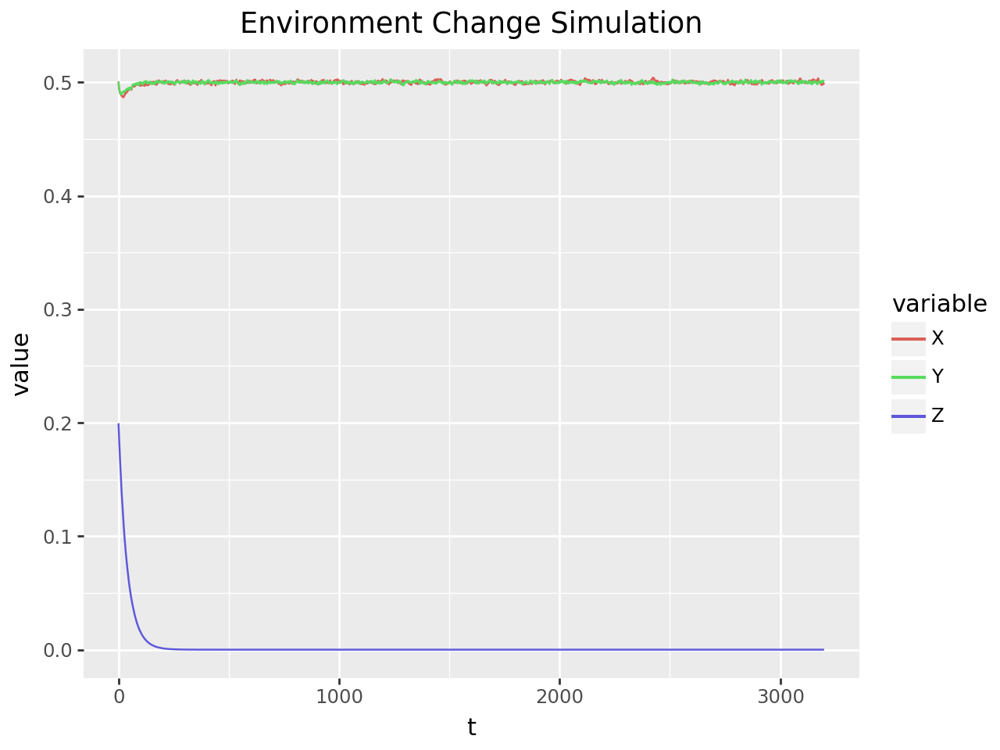

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.49
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.8999999999999998, Lamprey Velocity: 0.8999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


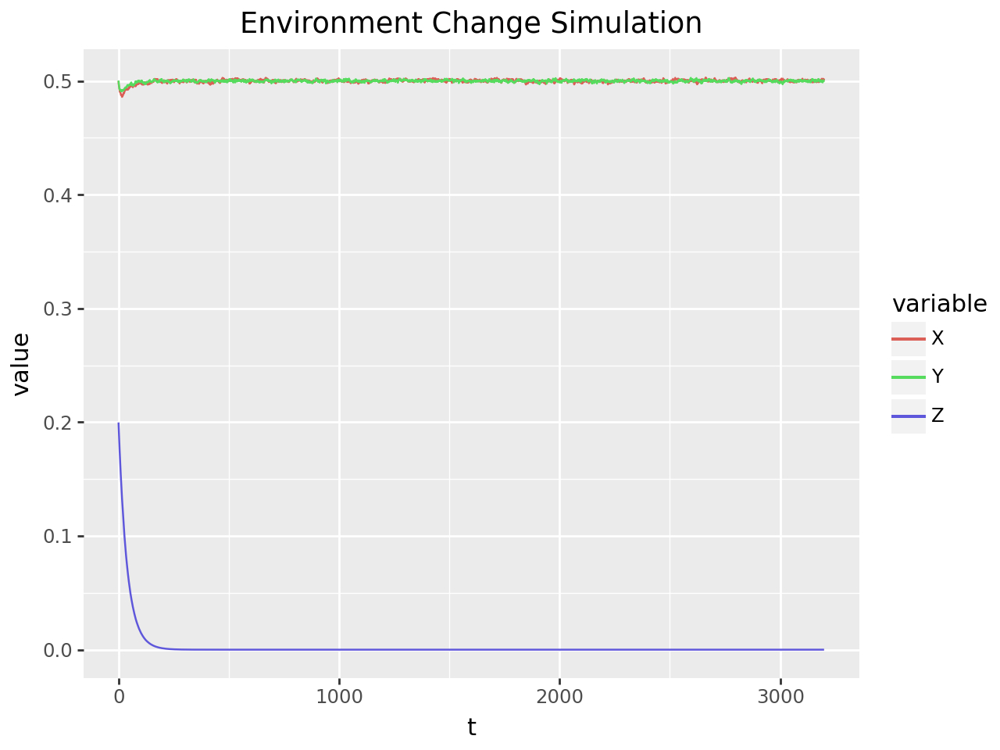

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.49
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.8999999999999998, Lamprey Velocity: 0.9999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


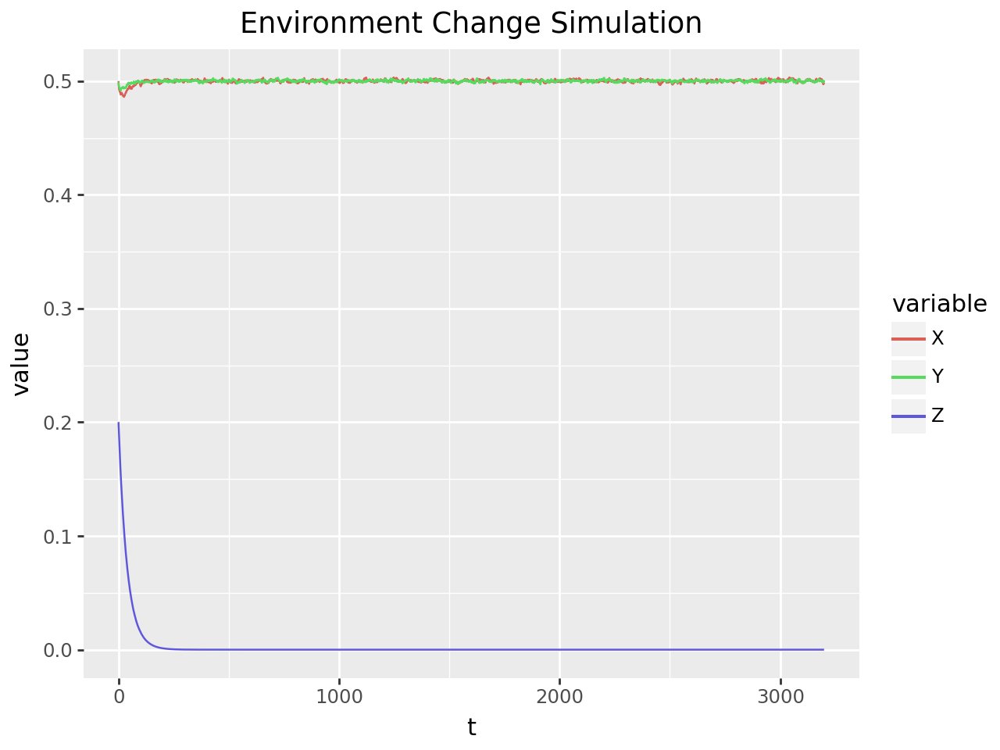

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.49
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.9999999999999998, Lamprey Velocity: 0.09999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


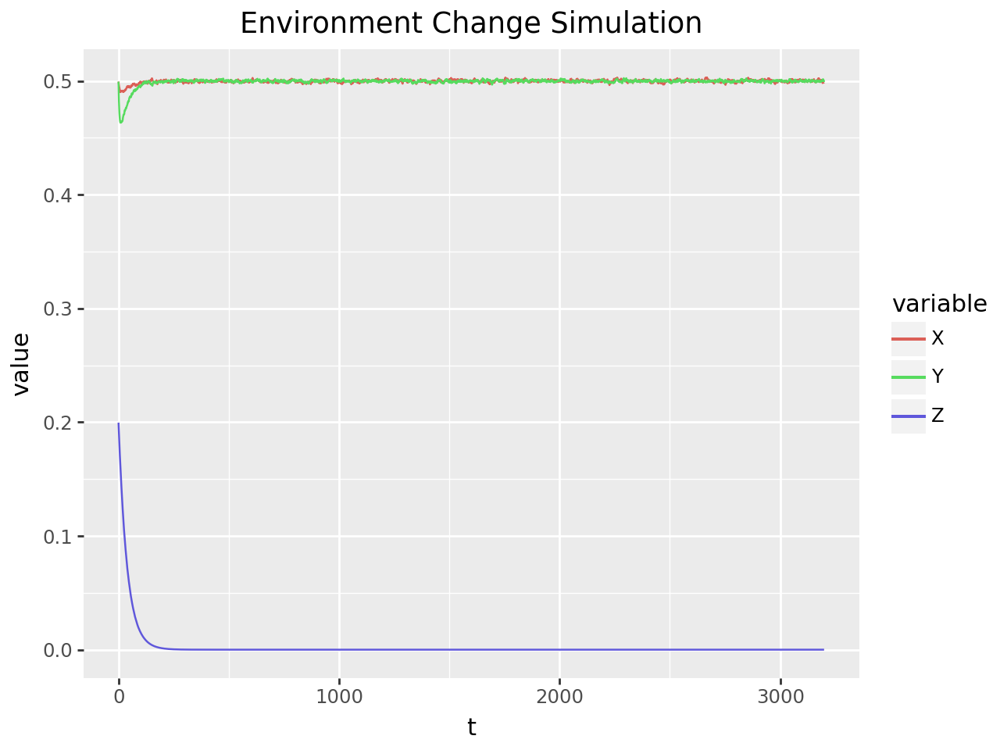

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.49
Lamprey Min Population: 0.46
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.9999999999999998, Lamprey Velocity: 0.19999999999999996


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


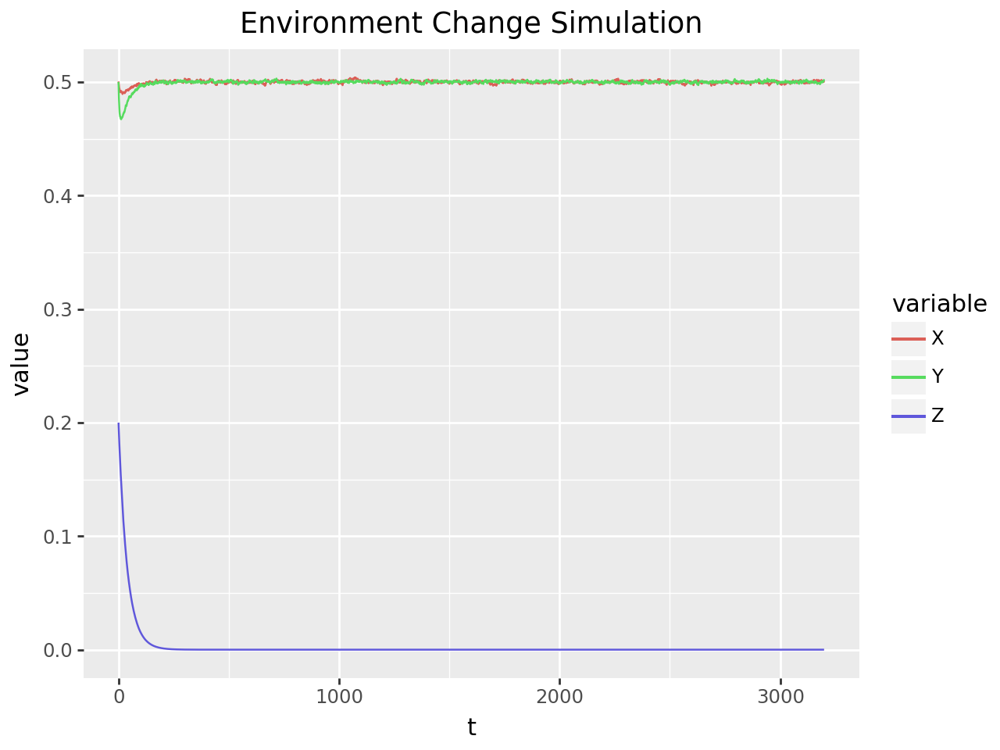

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.49
Lamprey Min Population: 0.47
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.9999999999999998, Lamprey Velocity: 0.29999999999999993


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


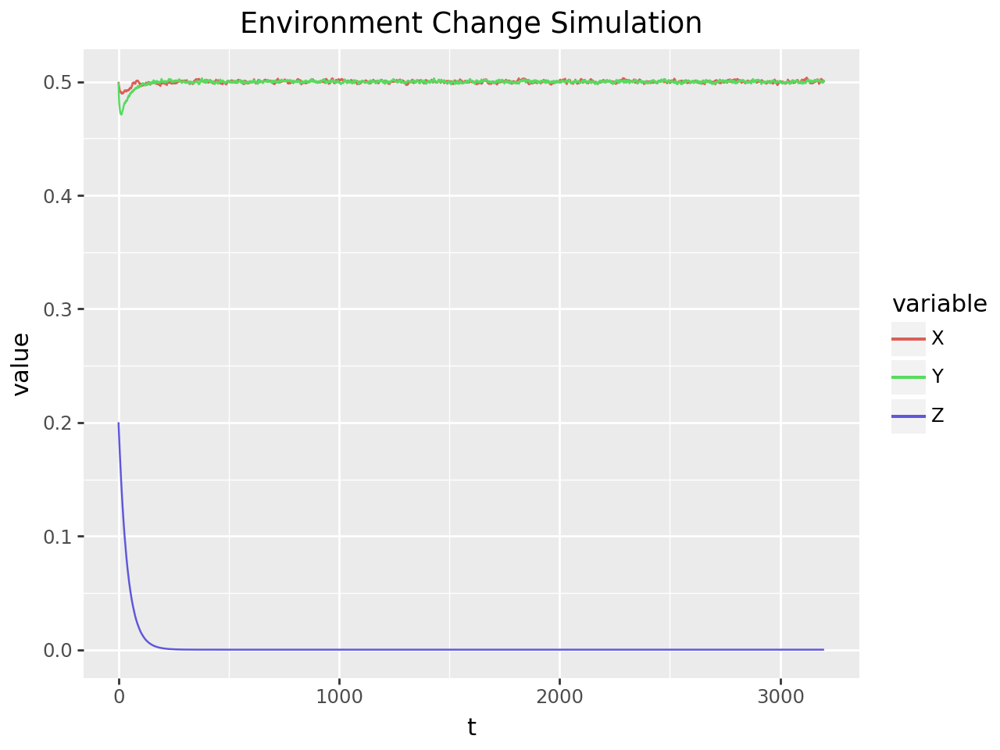

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.49
Lamprey Min Population: 0.47
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.9999999999999998, Lamprey Velocity: 0.3999999999999999


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


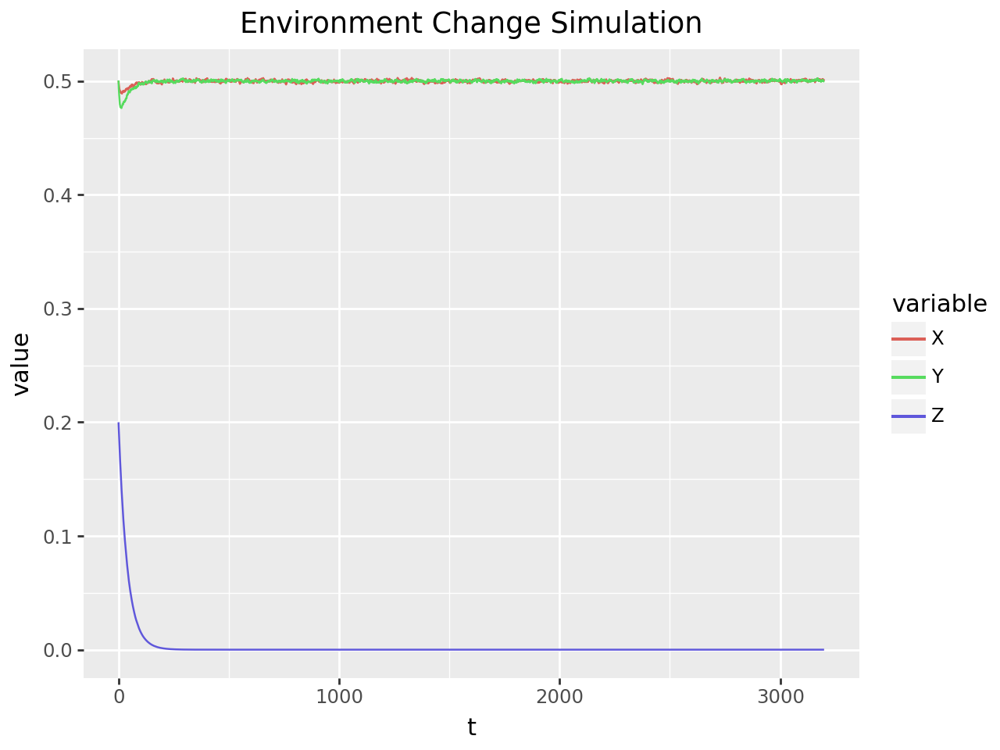

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.49
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.9999999999999998, Lamprey Velocity: 0.4999999999999999


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


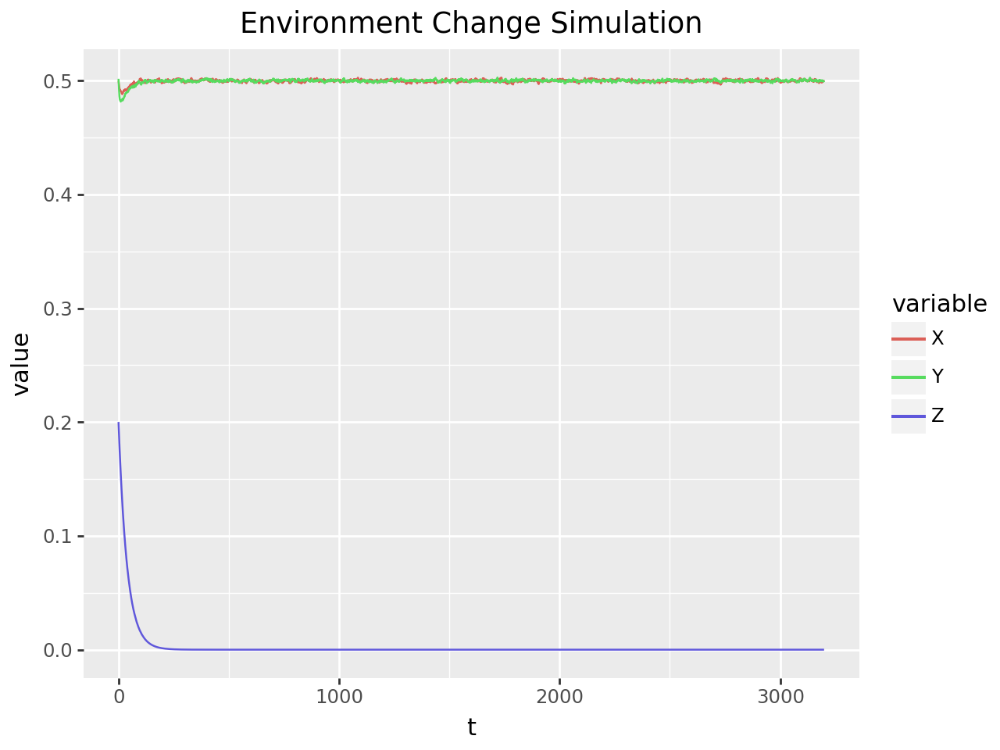

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.49
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.9999999999999998, Lamprey Velocity: 0.5999999999999999


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


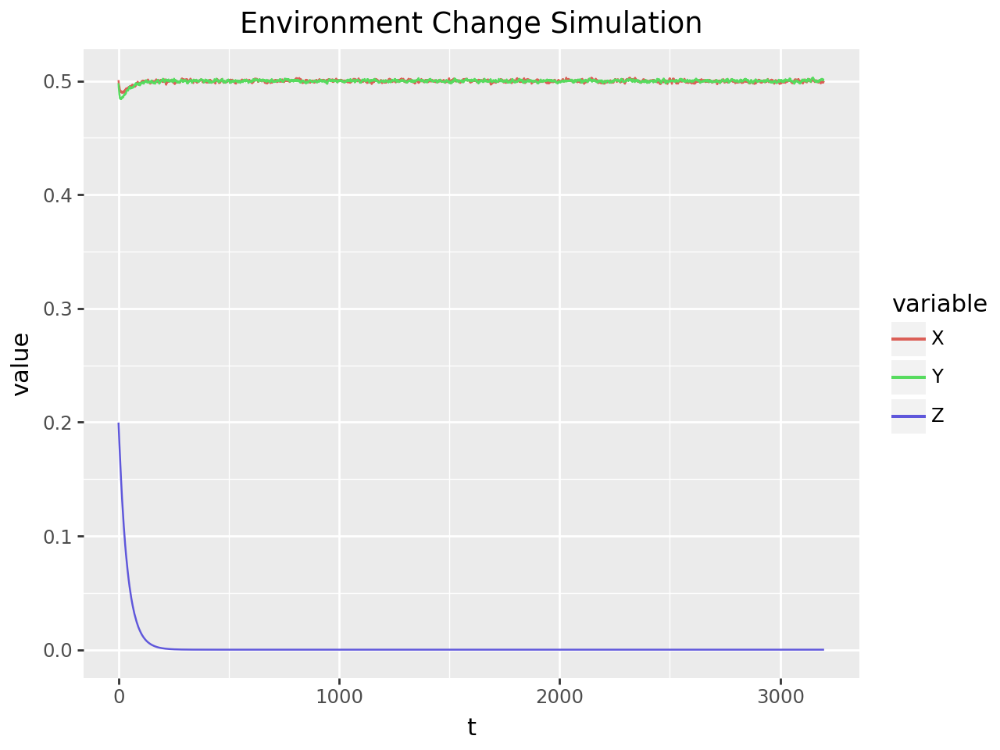

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.49
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.9999999999999998, Lamprey Velocity: 0.6999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


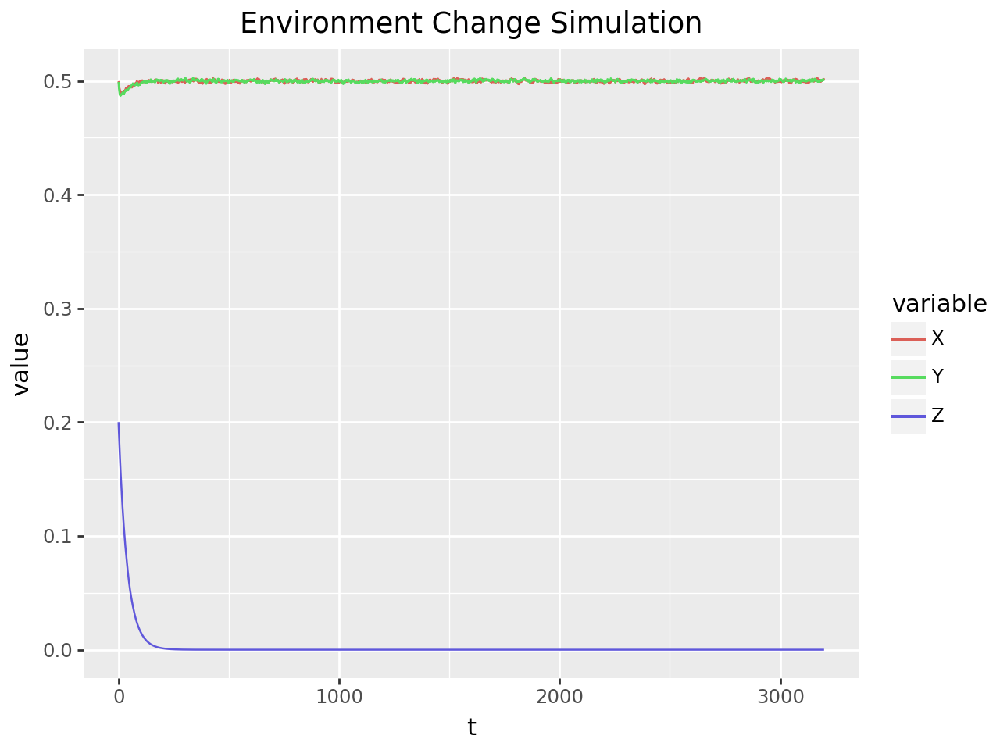

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.49
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.9999999999999998, Lamprey Velocity: 0.7999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


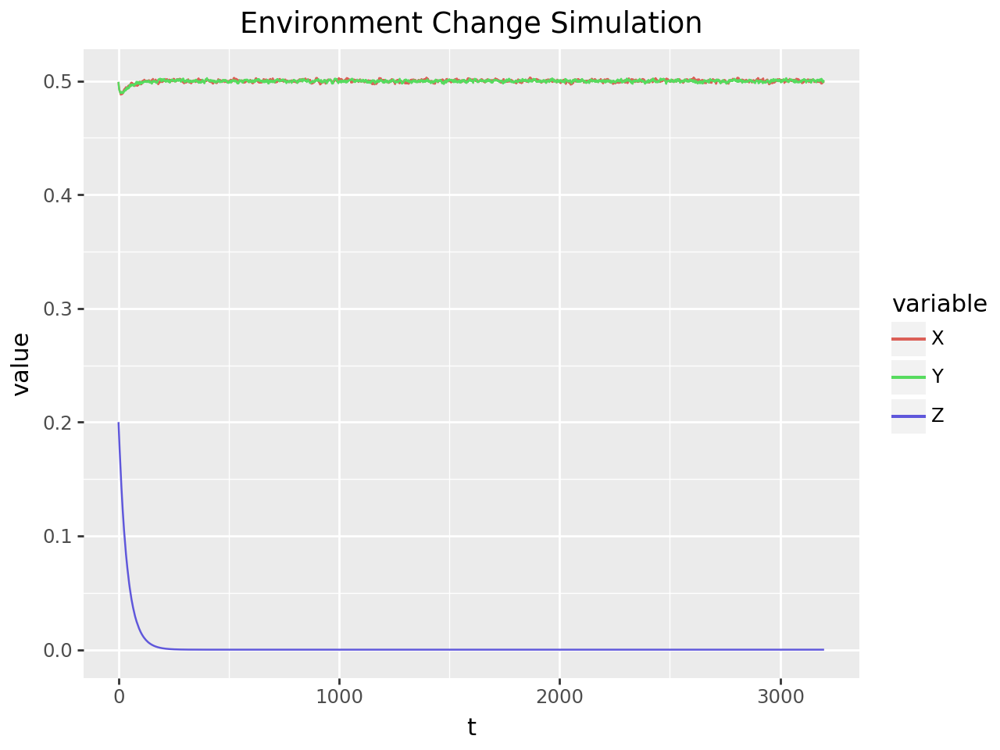

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.49
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.9999999999999998, Lamprey Velocity: 0.8999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


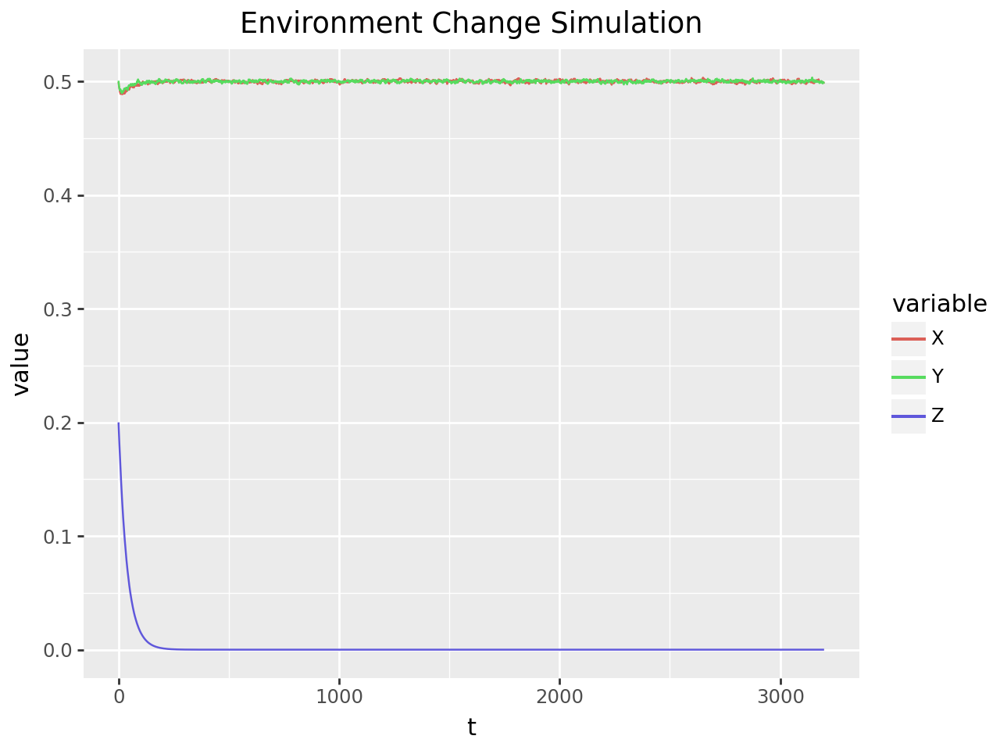

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.49
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.9999999999999998, Lamprey Velocity: 0.9999999999999998


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


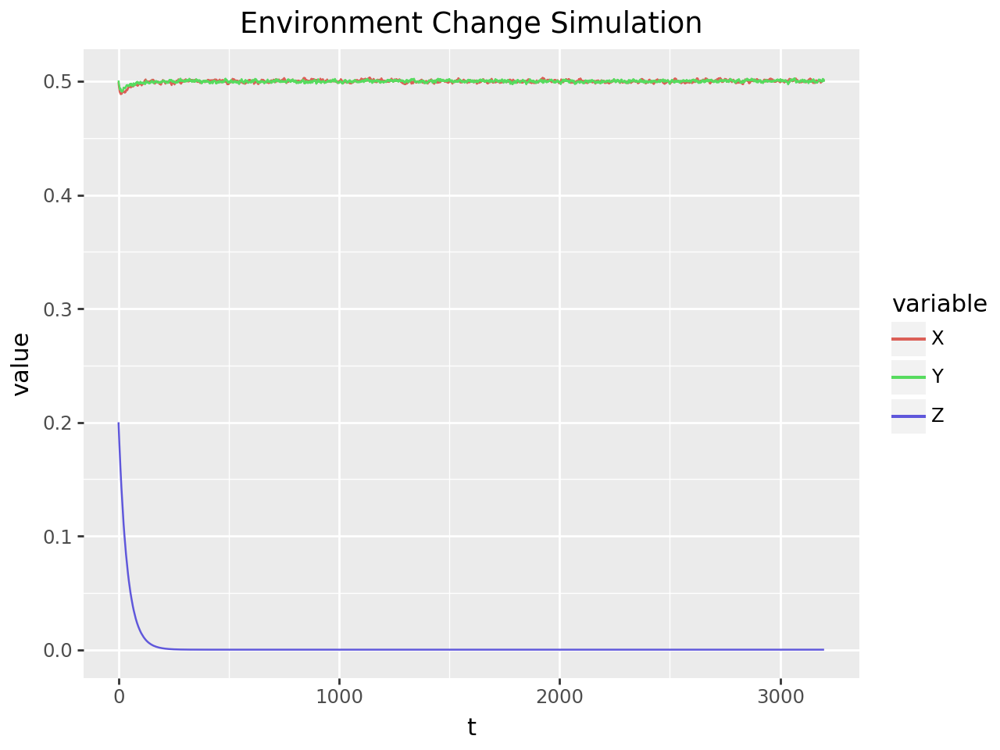

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.49
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02





In [ ]:
simulate_param_changes(n_timesteps, hv_increment_range, "v", plot_funcs=(True, False))

Now, we will examine the phase plane plots and limit cycles. We choose an alpha of 0.4 like in the previous two notebooks as otherwise the limit cycles are negligible.

We start by varying the carrying capacity and display the phase plot between all 3 possible combinations of 2 variables, totalling to 75 plots below. Again, to visualize changes at this level, such a large number unfortunately cannot be avoided.

A pattern is shown between all three combinations. The cycle starts at a single point, and as the lamprey carrying capacity is increased, the cycle expands and sometimes achieves homoclinic bifurcation by clashing with an axis. This is prevalent in the X vs Y and Y vs Z plots, and not as much in the X vs Z plots (again, X is salmon, Y is lamprey, Z is pinnipeds).

All in all, it seems that high lamprey carrying capacities are the keys to achieving a large limit cycle and thus homoclinic bifurcation, while altering the salmon carrying capacity simply changes the location of the limit cycle itself.

Salmon Handling Time: 0.010000000000000009, Lamprey Handling Time: 0.010000000000000009


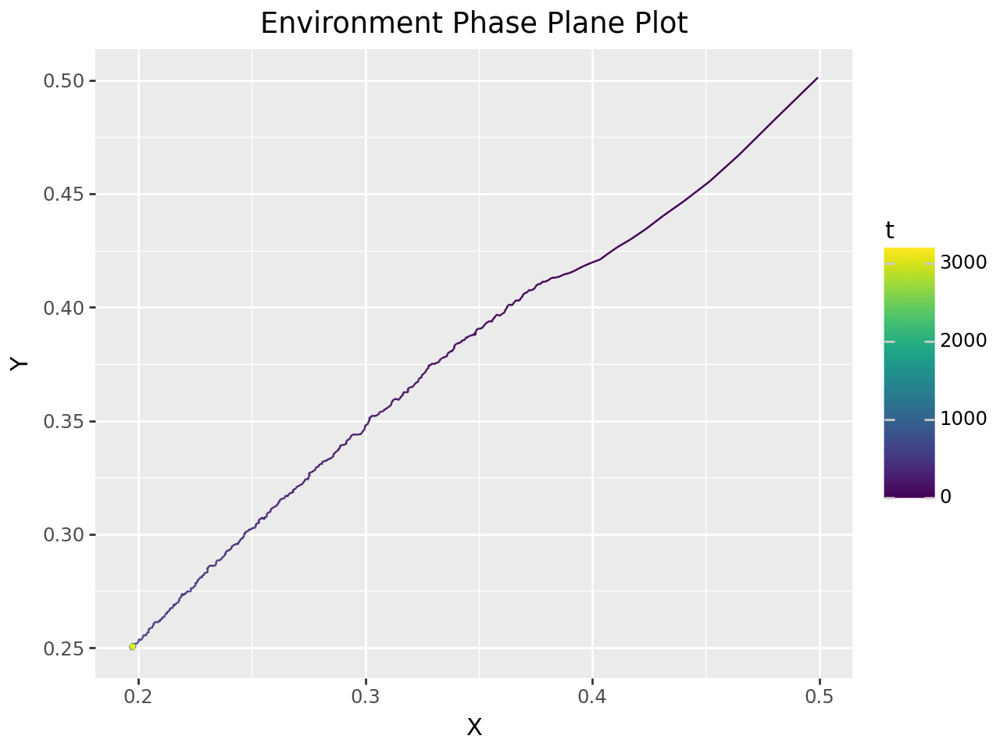

Salmon Final Population: 0.20
Lamprey Final Population: 0.25
Pinniped Final Population: 1.00

Salmon Mean Population: 0.21
Lamprey Mean Population: 0.26
Pinniped Mean Population: 0.92

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.20
Lamprey Min Population: 0.25
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.03

Salmon Population SD: 0.04
Lamprey Population SD: 0.04
Pinniped Population SD: 0.19



Salmon Handling Time: 0.010000000000000009, Lamprey Handling Time: 0.26


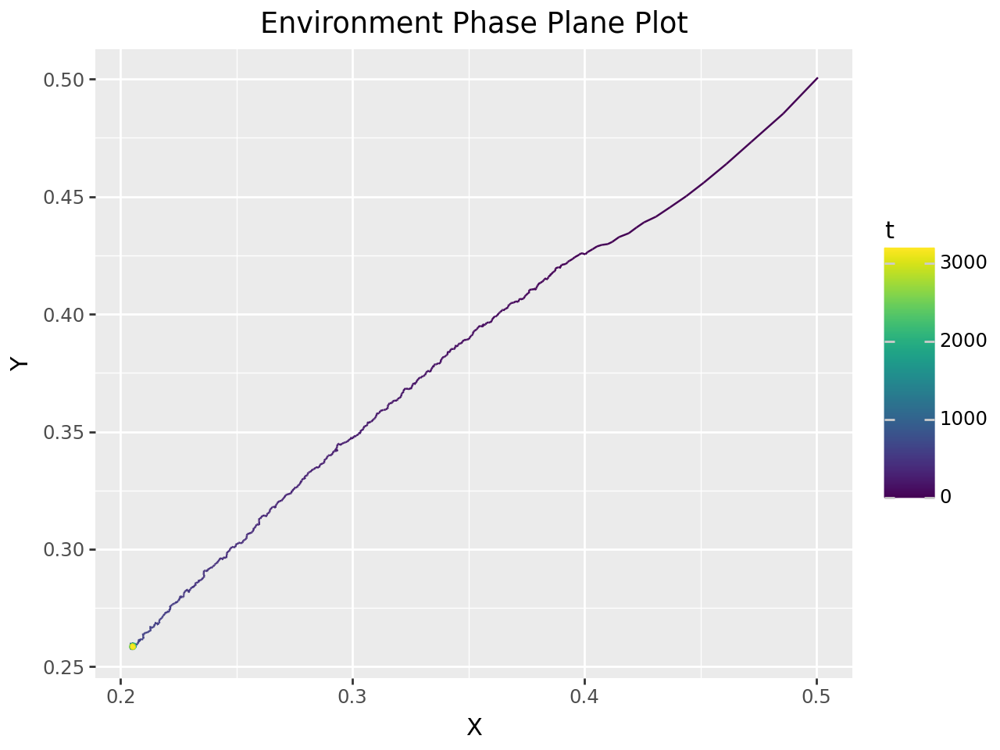

Salmon Final Population: 0.21
Lamprey Final Population: 0.26
Pinniped Final Population: 1.00

Salmon Mean Population: 0.22
Lamprey Mean Population: 0.27
Pinniped Mean Population: 0.92

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.20
Lamprey Min Population: 0.26
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.04
Lamprey Population SD: 0.04
Pinniped Population SD: 0.19



Salmon Handling Time: 0.010000000000000009, Lamprey Handling Time: 0.51


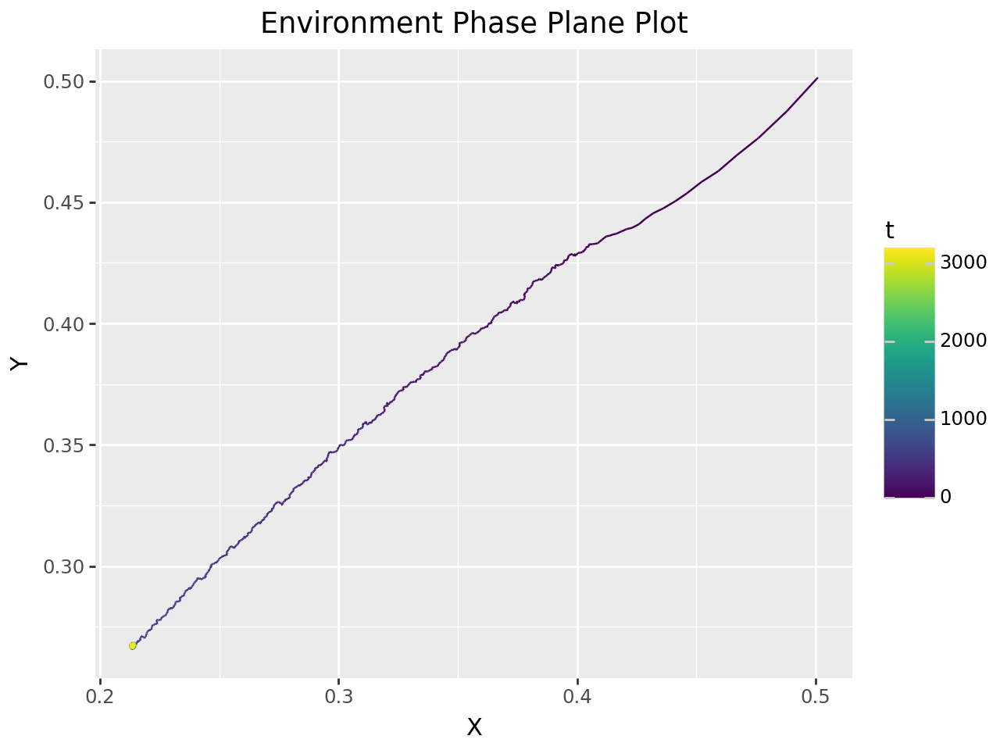

Salmon Final Population: 0.21
Lamprey Final Population: 0.27
Pinniped Final Population: 1.00

Salmon Mean Population: 0.23
Lamprey Mean Population: 0.28
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.21
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.20



Salmon Handling Time: 0.010000000000000009, Lamprey Handling Time: 0.76


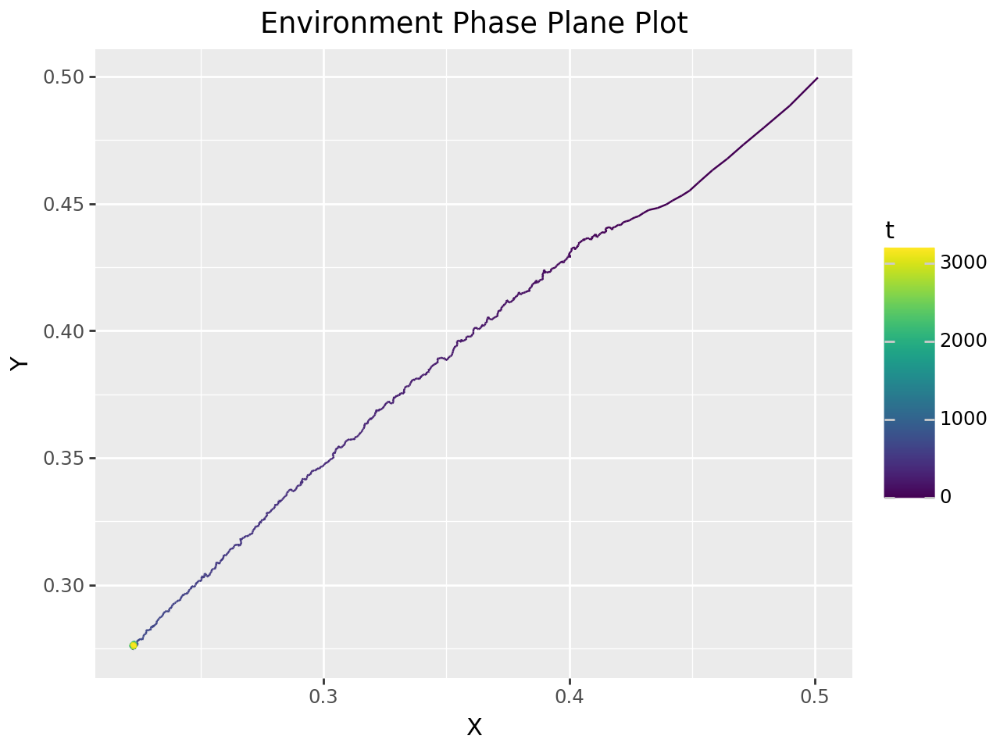

Salmon Final Population: 0.22
Lamprey Final Population: 0.28
Pinniped Final Population: 1.00

Salmon Mean Population: 0.24
Lamprey Mean Population: 0.29
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.22
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.21



Salmon Handling Time: 0.26, Lamprey Handling Time: 0.010000000000000009


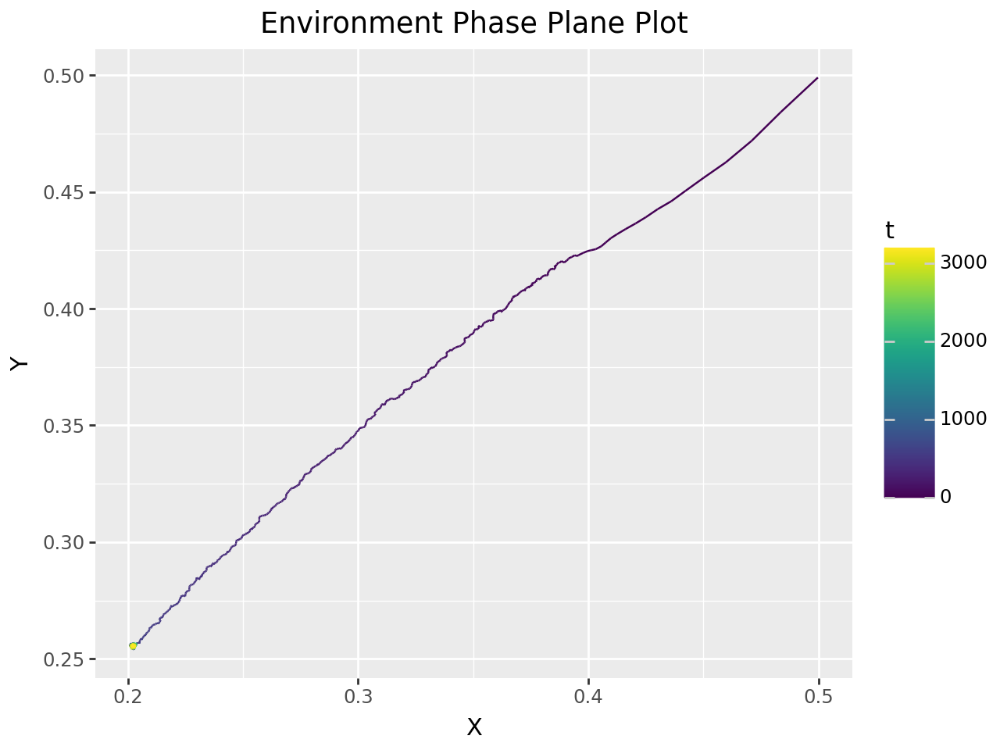

Salmon Final Population: 0.20
Lamprey Final Population: 0.26
Pinniped Final Population: 1.00

Salmon Mean Population: 0.22
Lamprey Mean Population: 0.27
Pinniped Mean Population: 0.92

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.20
Lamprey Min Population: 0.25
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.04
Lamprey Population SD: 0.04
Pinniped Population SD: 0.19



Salmon Handling Time: 0.26, Lamprey Handling Time: 0.26


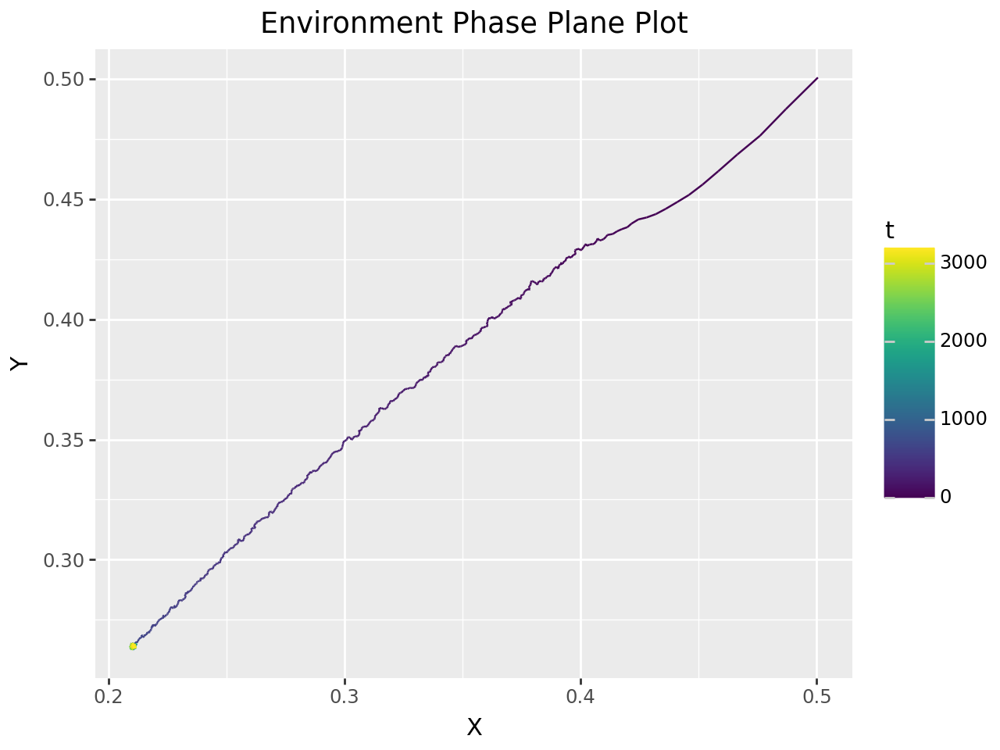

Salmon Final Population: 0.21
Lamprey Final Population: 0.26
Pinniped Final Population: 1.00

Salmon Mean Population: 0.23
Lamprey Mean Population: 0.28
Pinniped Mean Population: 0.92

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.21
Lamprey Min Population: 0.26
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.20



Salmon Handling Time: 0.26, Lamprey Handling Time: 0.51


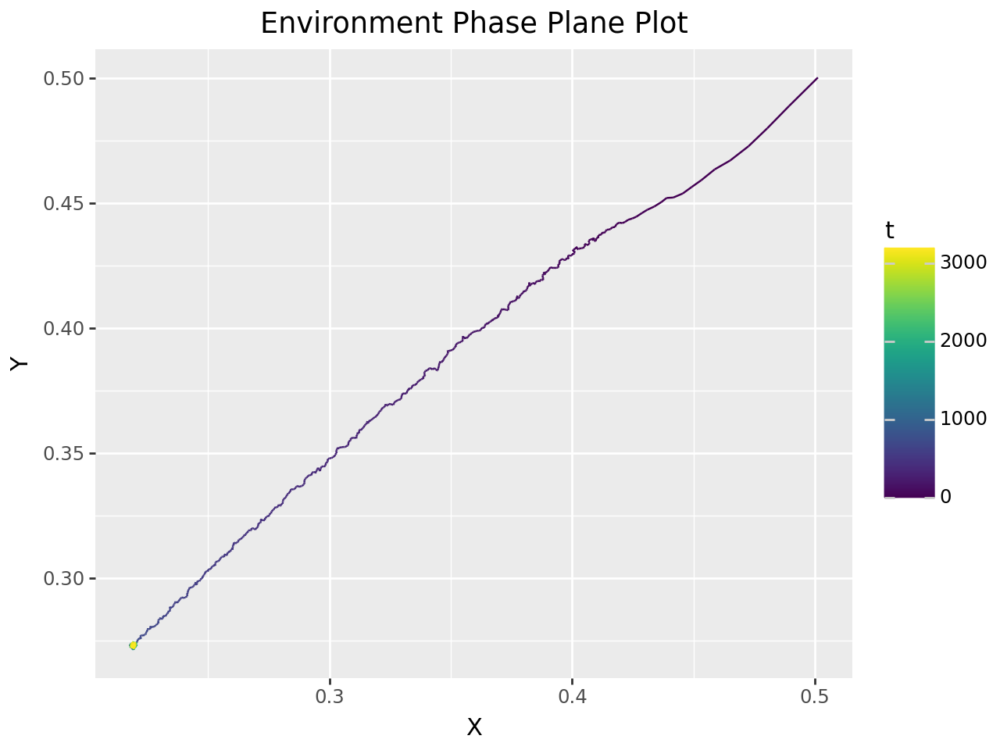

Salmon Final Population: 0.22
Lamprey Final Population: 0.27
Pinniped Final Population: 1.00

Salmon Mean Population: 0.24
Lamprey Mean Population: 0.29
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.22
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.20



Salmon Handling Time: 0.26, Lamprey Handling Time: 0.76


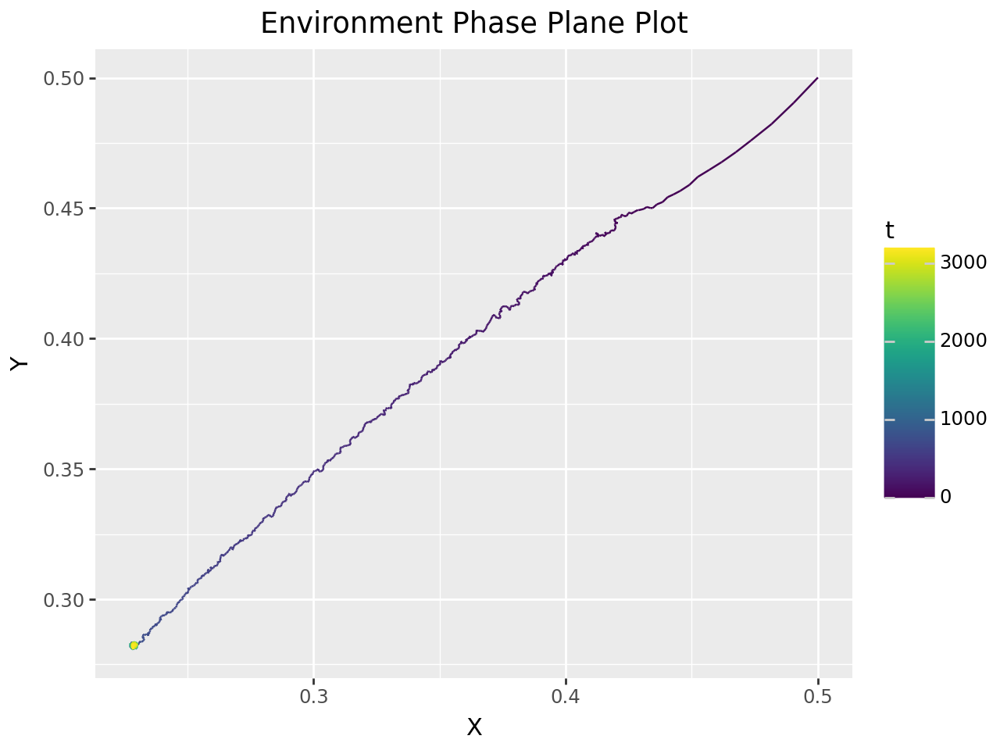

Salmon Final Population: 0.23
Lamprey Final Population: 0.28
Pinniped Final Population: 1.00

Salmon Mean Population: 0.25
Lamprey Mean Population: 0.30
Pinniped Mean Population: 0.90

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.23
Lamprey Min Population: 0.28
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.21



Salmon Handling Time: 0.51, Lamprey Handling Time: 0.010000000000000009


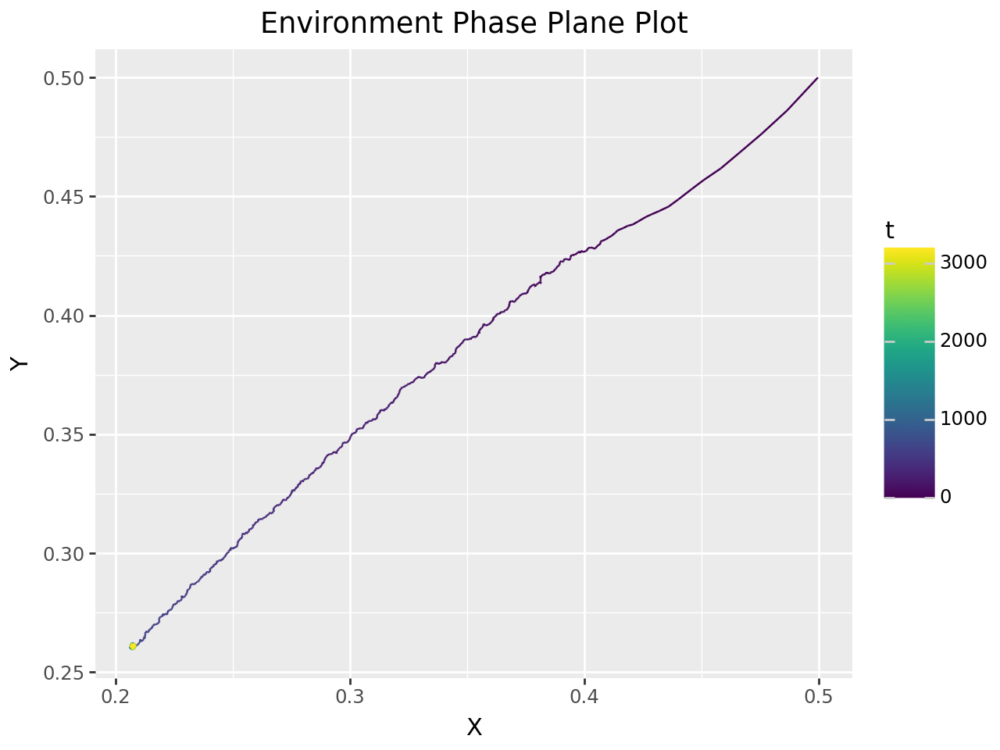

Salmon Final Population: 0.21
Lamprey Final Population: 0.26
Pinniped Final Population: 1.00

Salmon Mean Population: 0.23
Lamprey Mean Population: 0.28
Pinniped Mean Population: 0.92

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.21
Lamprey Min Population: 0.26
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.20



Salmon Handling Time: 0.51, Lamprey Handling Time: 0.26


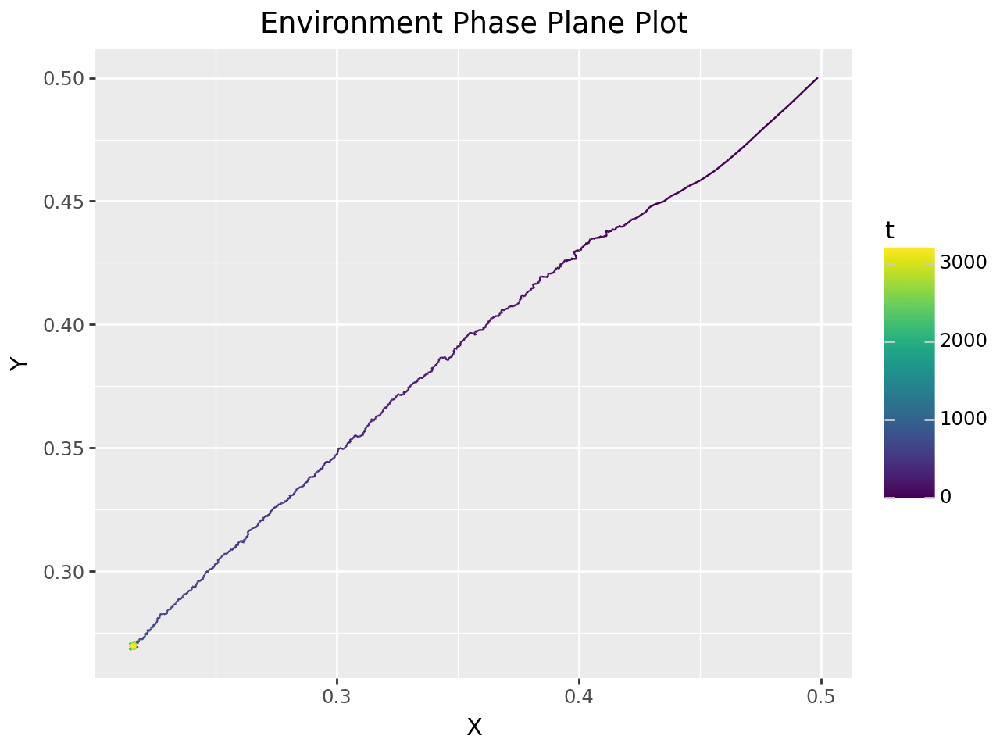

Salmon Final Population: 0.22
Lamprey Final Population: 0.27
Pinniped Final Population: 1.00

Salmon Mean Population: 0.24
Lamprey Mean Population: 0.29
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.21
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.21



Salmon Handling Time: 0.51, Lamprey Handling Time: 0.51


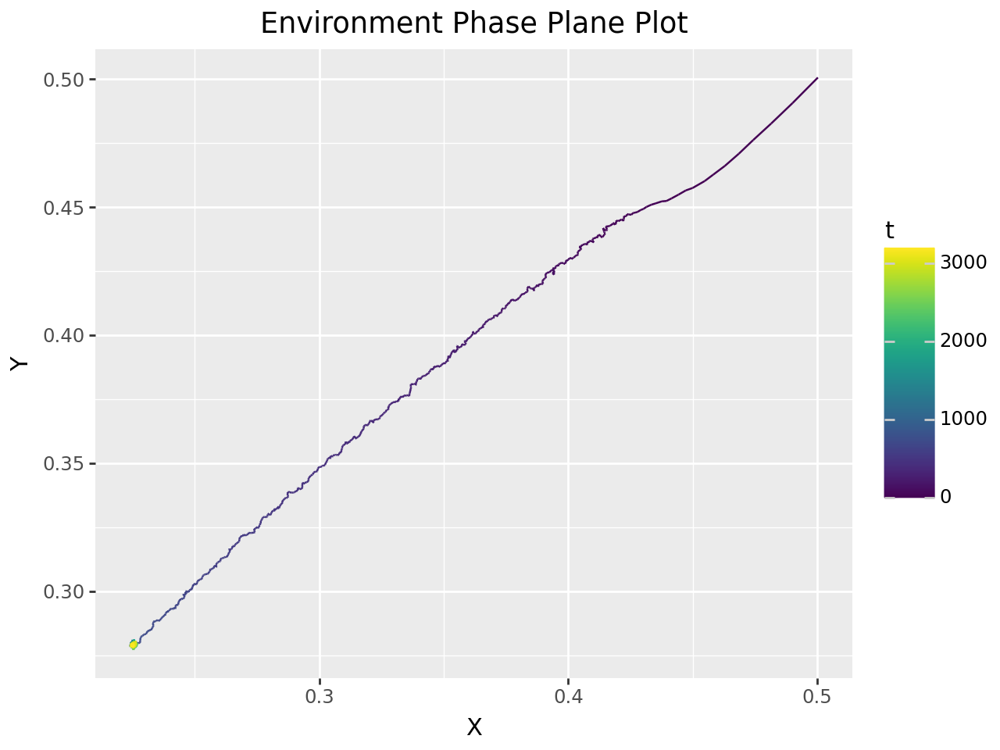

Salmon Final Population: 0.22
Lamprey Final Population: 0.28
Pinniped Final Population: 1.00

Salmon Mean Population: 0.25
Lamprey Mean Population: 0.30
Pinniped Mean Population: 0.90

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.22
Lamprey Min Population: 0.28
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.21



Salmon Handling Time: 0.51, Lamprey Handling Time: 0.76


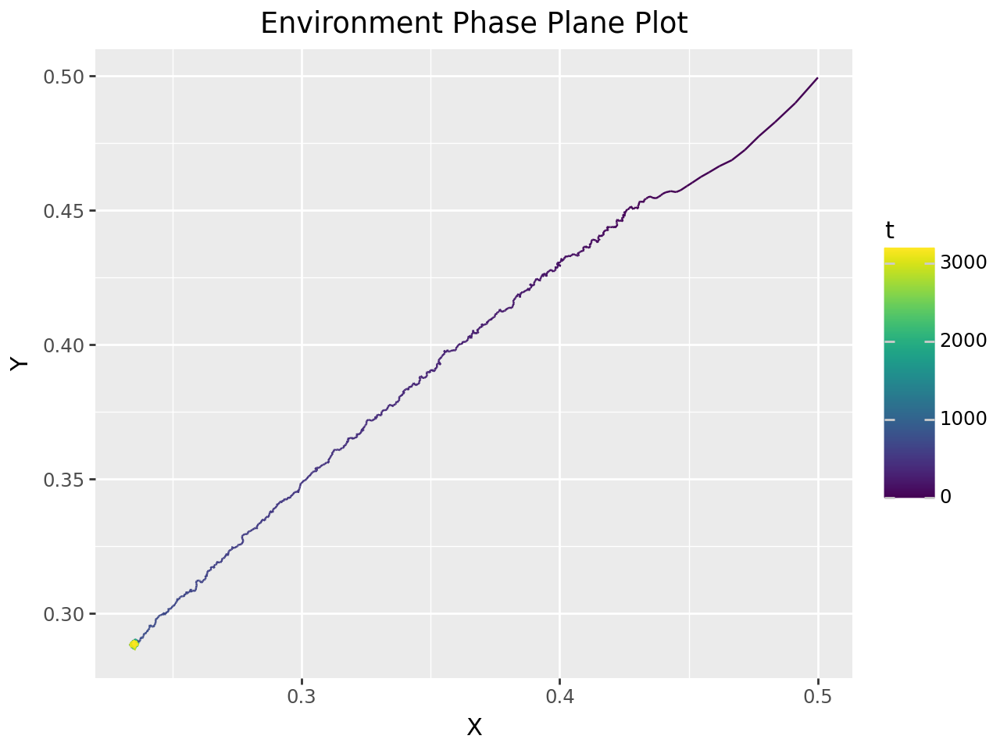

Salmon Final Population: 0.24
Lamprey Final Population: 0.29
Pinniped Final Population: 1.00

Salmon Mean Population: 0.26
Lamprey Mean Population: 0.31
Pinniped Mean Population: 0.90

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.23
Lamprey Min Population: 0.29
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.05
Lamprey Population SD: 0.05
Pinniped Population SD: 0.22



Salmon Handling Time: 0.76, Lamprey Handling Time: 0.010000000000000009


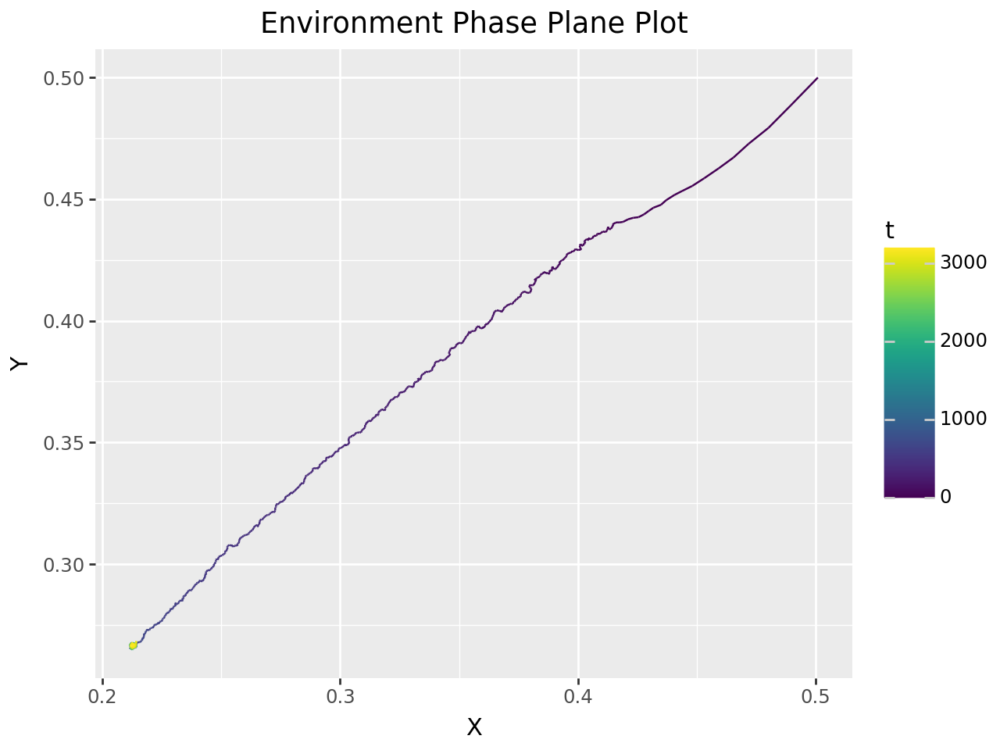

Salmon Final Population: 0.21
Lamprey Final Population: 0.27
Pinniped Final Population: 1.00

Salmon Mean Population: 0.23
Lamprey Mean Population: 0.28
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.21
Lamprey Min Population: 0.26
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.20



Salmon Handling Time: 0.76, Lamprey Handling Time: 0.26


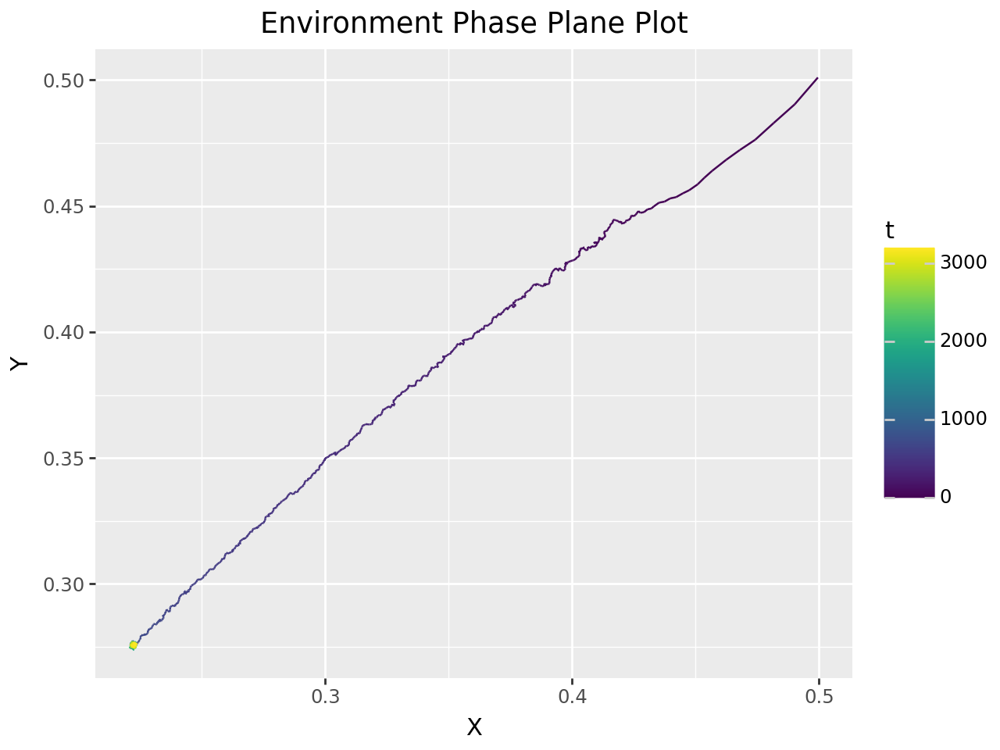

Salmon Final Population: 0.22
Lamprey Final Population: 0.28
Pinniped Final Population: 1.00

Salmon Mean Population: 0.24
Lamprey Mean Population: 0.30
Pinniped Mean Population: 0.90

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.22
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.21



Salmon Handling Time: 0.76, Lamprey Handling Time: 0.51


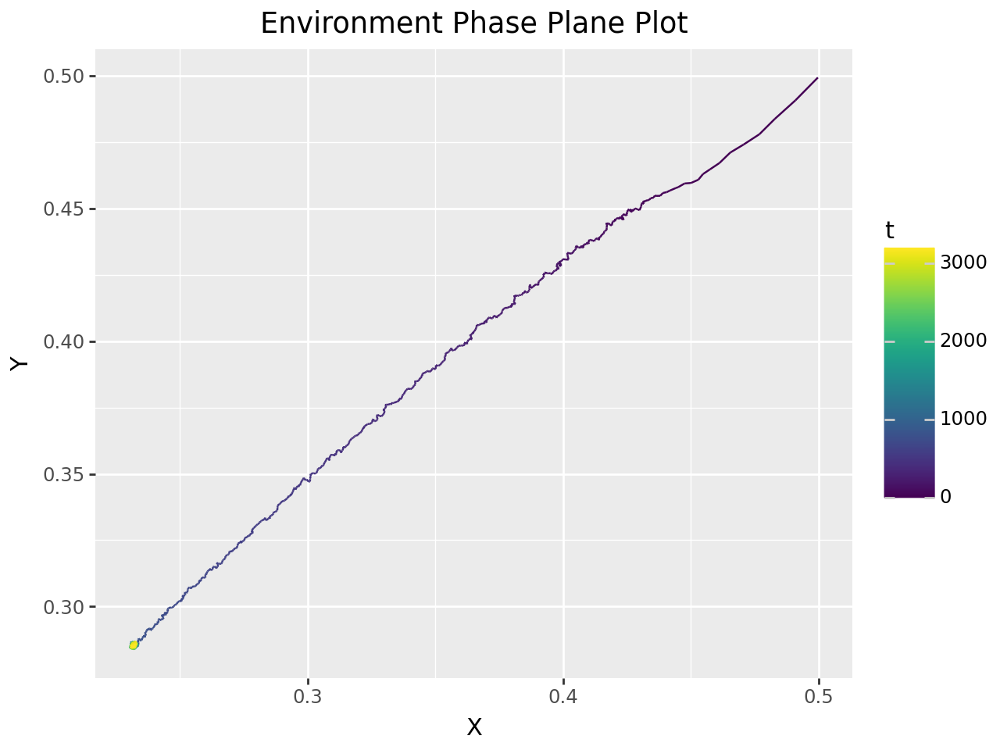

Salmon Final Population: 0.23
Lamprey Final Population: 0.29
Pinniped Final Population: 1.00

Salmon Mean Population: 0.26
Lamprey Mean Population: 0.31
Pinniped Mean Population: 0.89

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.23
Lamprey Min Population: 0.28
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.05
Lamprey Population SD: 0.05
Pinniped Population SD: 0.22



Salmon Handling Time: 0.76, Lamprey Handling Time: 0.76


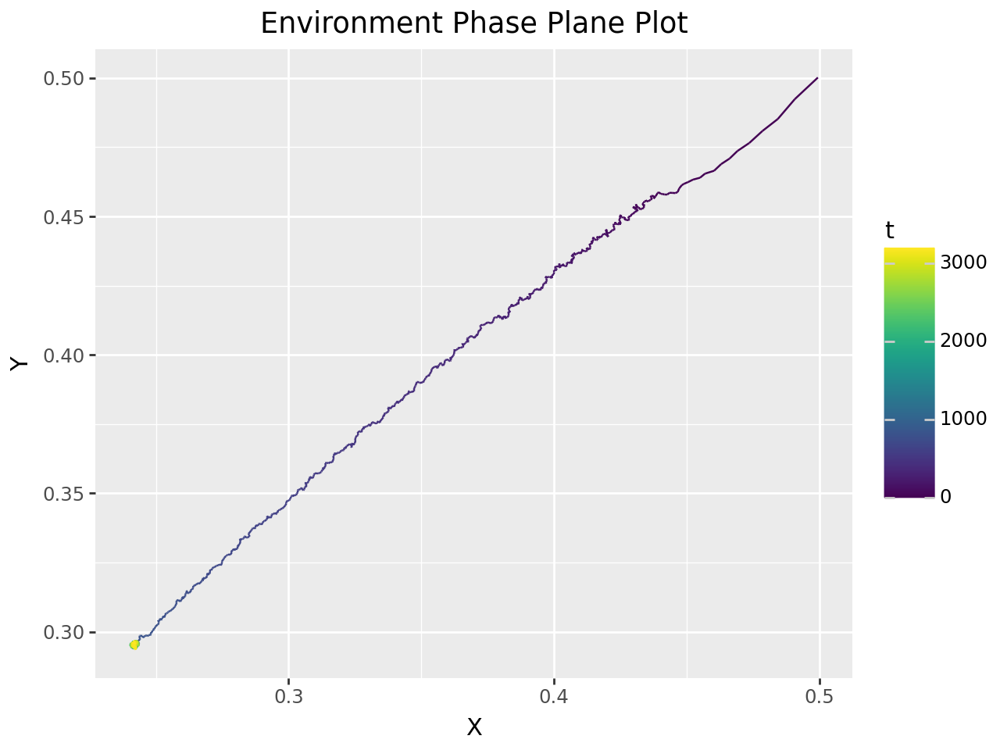

Salmon Final Population: 0.24
Lamprey Final Population: 0.30
Pinniped Final Population: 1.00

Salmon Mean Population: 0.27
Lamprey Mean Population: 0.32
Pinniped Mean Population: 0.88

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.24
Lamprey Min Population: 0.29
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.06
Lamprey Population SD: 0.05
Pinniped Population SD: 0.23



Salmon Handling Time: 0.010000000000000009, Lamprey Handling Time: 0.010000000000000009


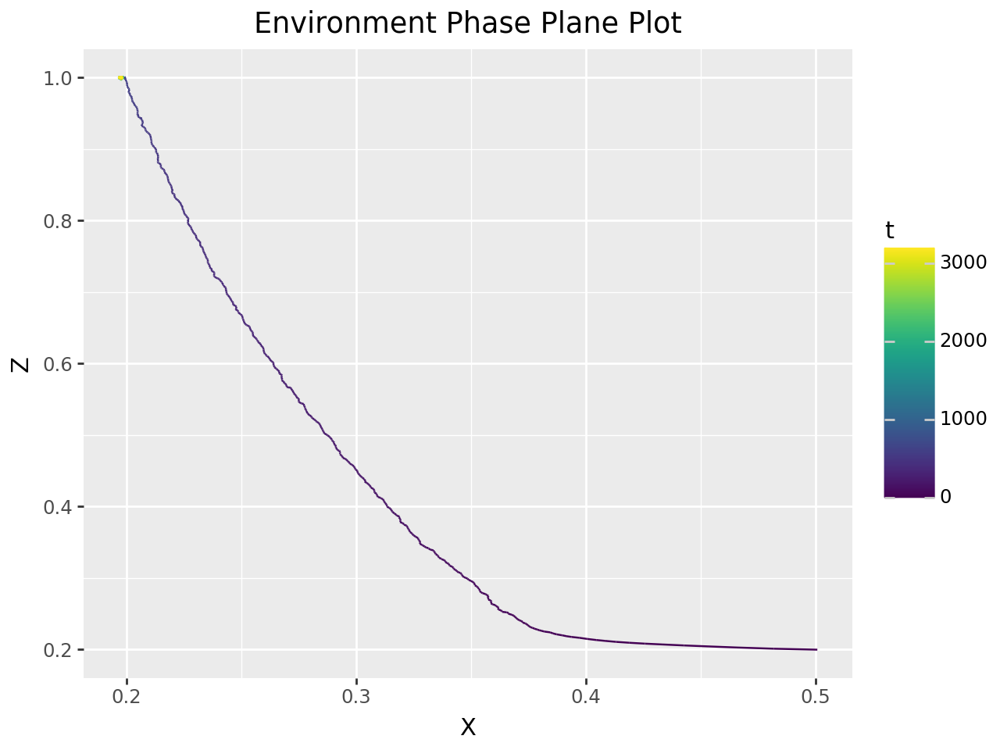

Salmon Final Population: 0.20
Lamprey Final Population: 0.25
Pinniped Final Population: 1.00

Salmon Mean Population: 0.21
Lamprey Mean Population: 0.26
Pinniped Mean Population: 0.93

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.20
Lamprey Min Population: 0.25
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.03

Salmon Population SD: 0.04
Lamprey Population SD: 0.04
Pinniped Population SD: 0.18



Salmon Handling Time: 0.010000000000000009, Lamprey Handling Time: 0.26


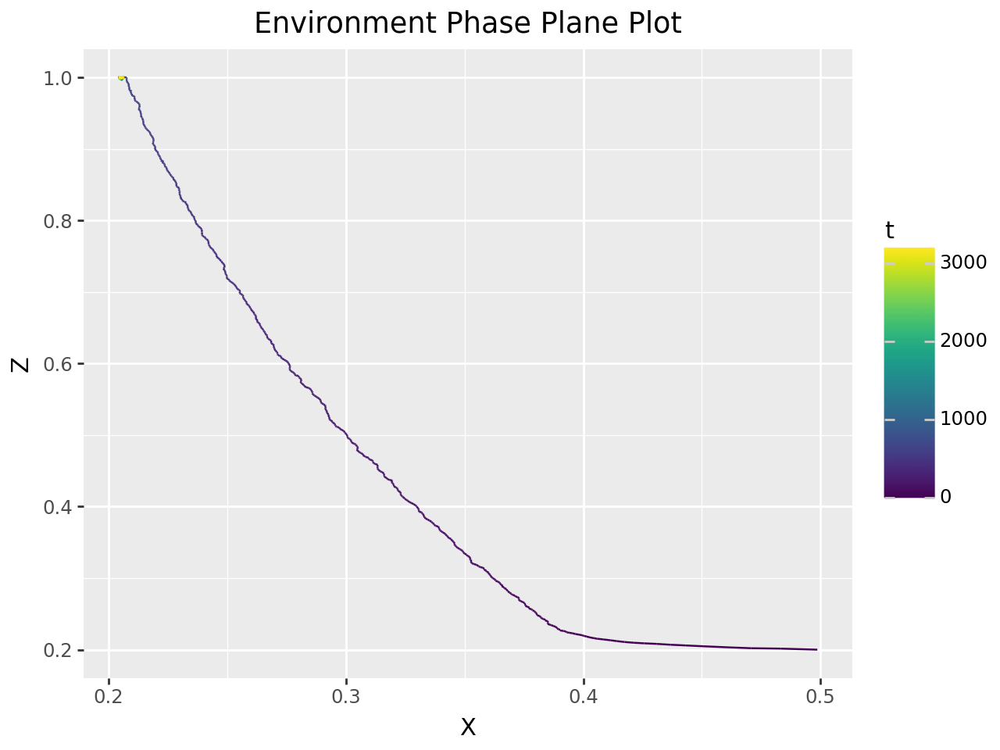

Salmon Final Population: 0.20
Lamprey Final Population: 0.26
Pinniped Final Population: 1.00

Salmon Mean Population: 0.22
Lamprey Mean Population: 0.27
Pinniped Mean Population: 0.92

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.20
Lamprey Min Population: 0.26
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.04
Lamprey Population SD: 0.04
Pinniped Population SD: 0.19



Salmon Handling Time: 0.010000000000000009, Lamprey Handling Time: 0.51


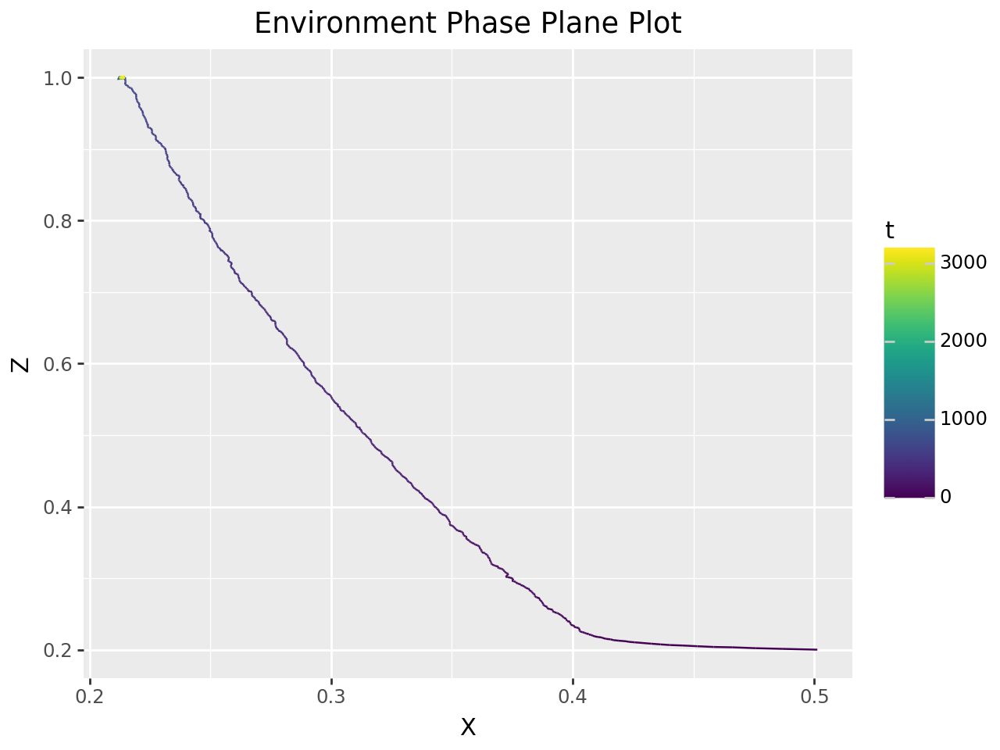

Salmon Final Population: 0.21
Lamprey Final Population: 0.27
Pinniped Final Population: 1.00

Salmon Mean Population: 0.23
Lamprey Mean Population: 0.28
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.21
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.20



Salmon Handling Time: 0.010000000000000009, Lamprey Handling Time: 0.76


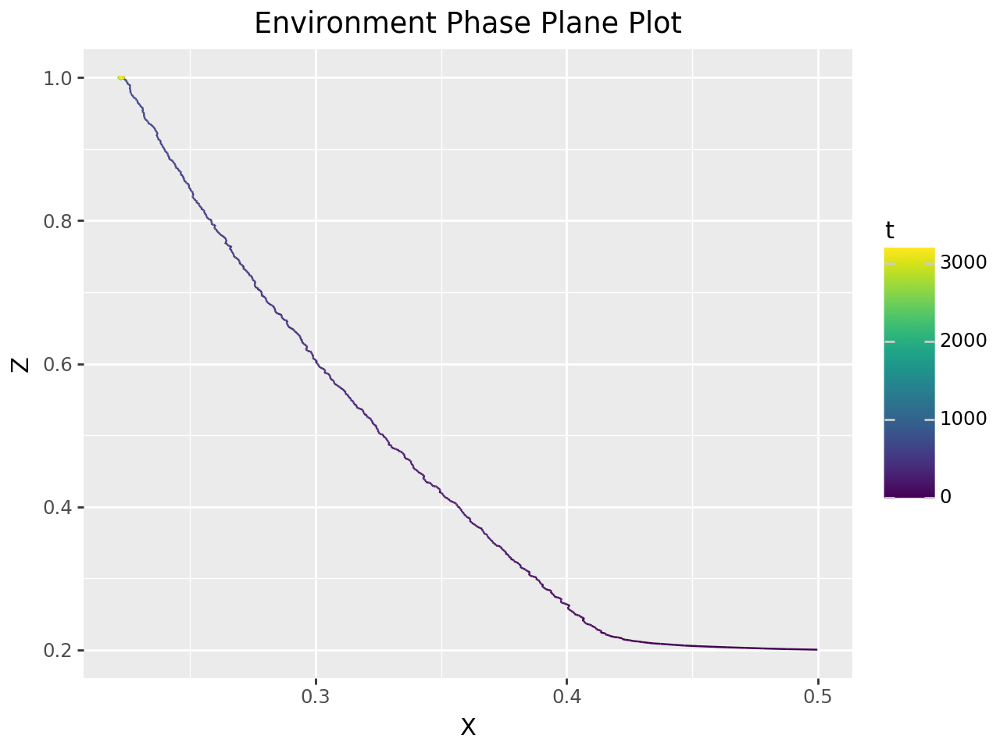

Salmon Final Population: 0.22
Lamprey Final Population: 0.28
Pinniped Final Population: 1.00

Salmon Mean Population: 0.24
Lamprey Mean Population: 0.29
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.22
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.21



Salmon Handling Time: 0.26, Lamprey Handling Time: 0.010000000000000009


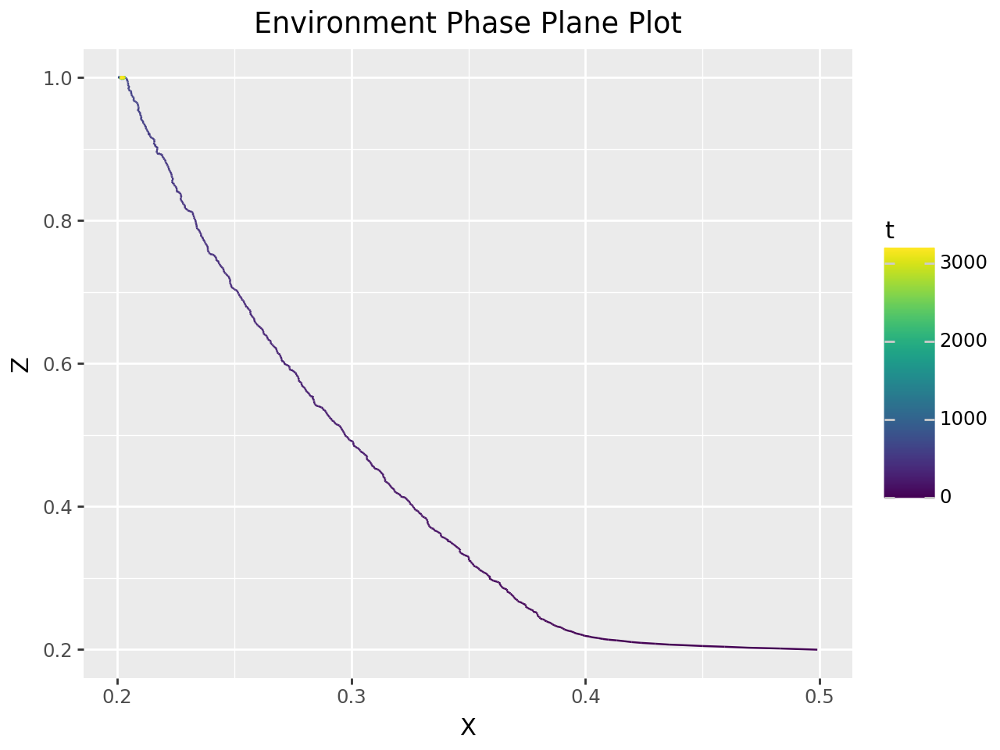

Salmon Final Population: 0.20
Lamprey Final Population: 0.26
Pinniped Final Population: 1.00

Salmon Mean Population: 0.22
Lamprey Mean Population: 0.27
Pinniped Mean Population: 0.92

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.20
Lamprey Min Population: 0.25
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.04
Lamprey Population SD: 0.04
Pinniped Population SD: 0.19



Salmon Handling Time: 0.26, Lamprey Handling Time: 0.26


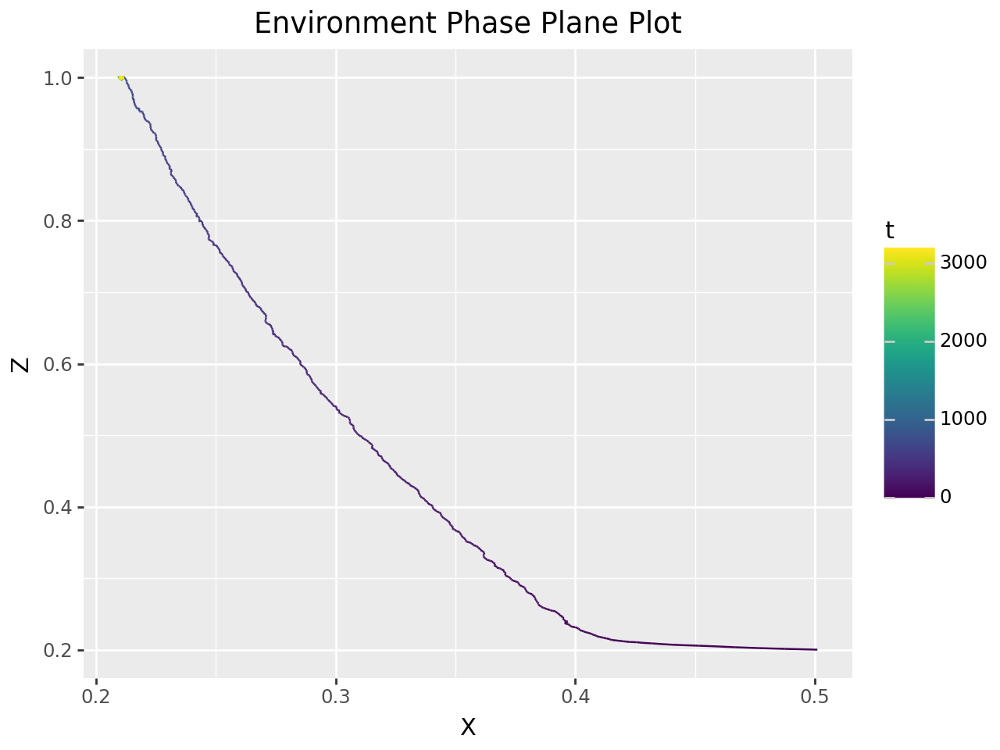

Salmon Final Population: 0.21
Lamprey Final Population: 0.26
Pinniped Final Population: 1.00

Salmon Mean Population: 0.23
Lamprey Mean Population: 0.28
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.21
Lamprey Min Population: 0.26
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.20



Salmon Handling Time: 0.26, Lamprey Handling Time: 0.51


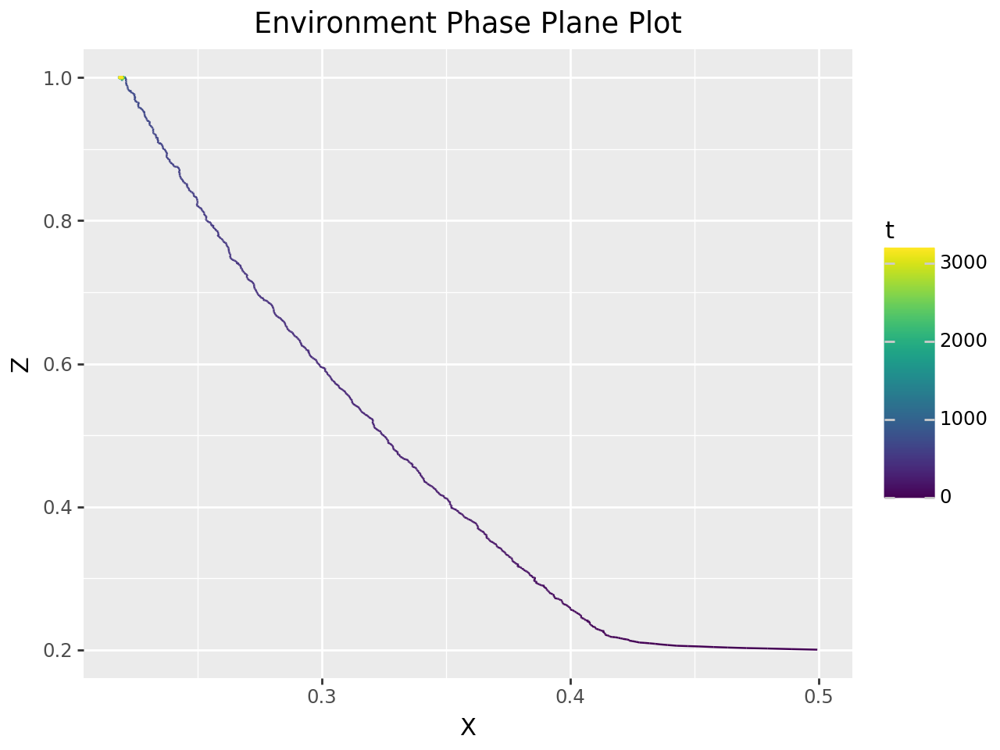

Salmon Final Population: 0.22
Lamprey Final Population: 0.27
Pinniped Final Population: 1.00

Salmon Mean Population: 0.24
Lamprey Mean Population: 0.29
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.22
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.21



Salmon Handling Time: 0.26, Lamprey Handling Time: 0.76


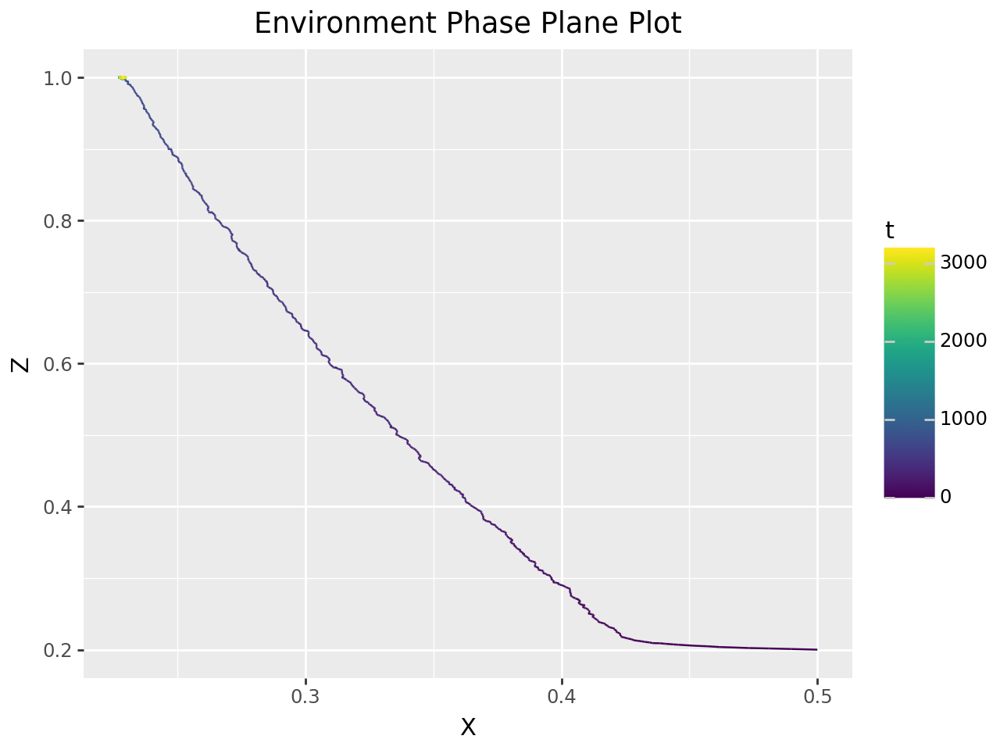

Salmon Final Population: 0.23
Lamprey Final Population: 0.28
Pinniped Final Population: 1.00

Salmon Mean Population: 0.25
Lamprey Mean Population: 0.30
Pinniped Mean Population: 0.90

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.23
Lamprey Min Population: 0.28
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.21



Salmon Handling Time: 0.51, Lamprey Handling Time: 0.010000000000000009


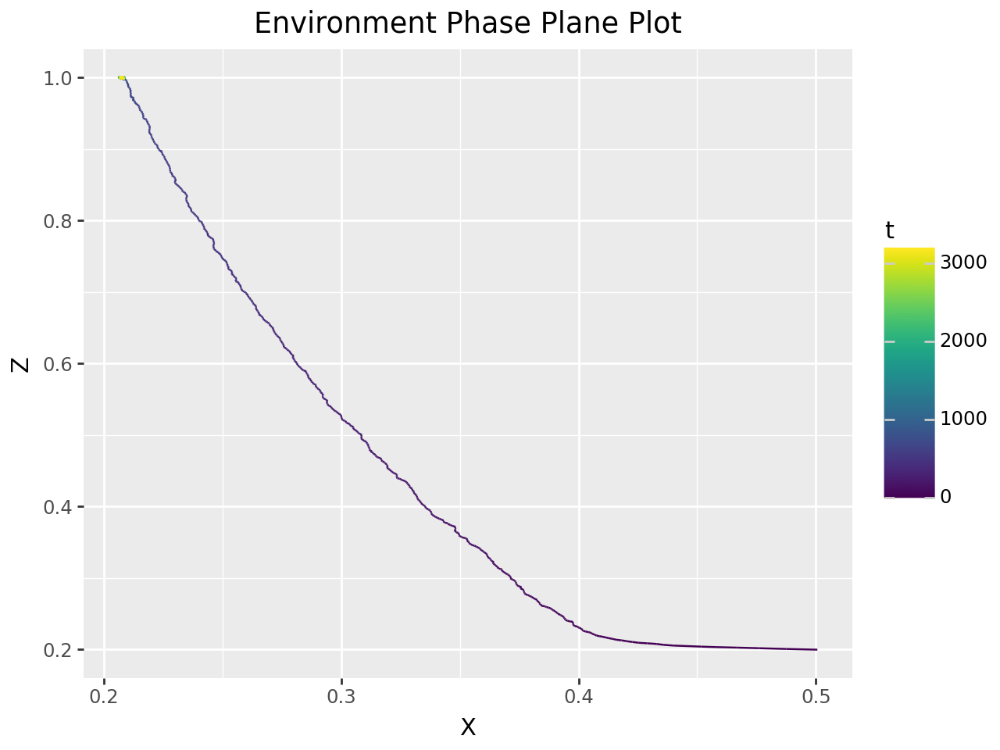

Salmon Final Population: 0.21
Lamprey Final Population: 0.26
Pinniped Final Population: 1.00

Salmon Mean Population: 0.23
Lamprey Mean Population: 0.28
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.21
Lamprey Min Population: 0.26
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.20



Salmon Handling Time: 0.51, Lamprey Handling Time: 0.26


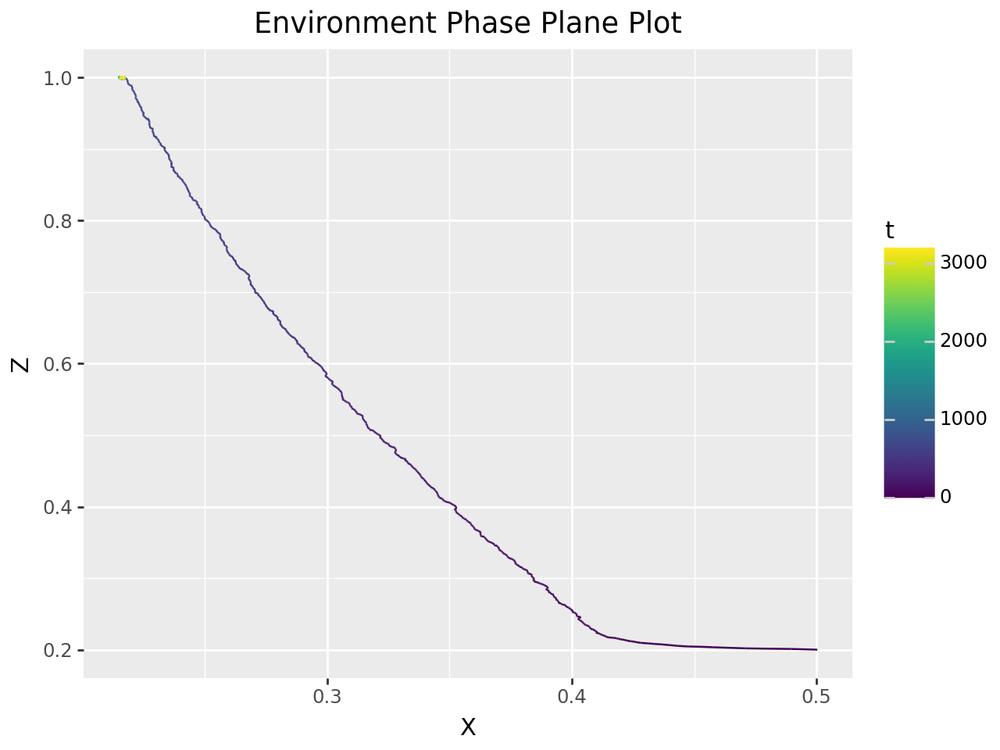

Salmon Final Population: 0.22
Lamprey Final Population: 0.27
Pinniped Final Population: 1.00

Salmon Mean Population: 0.24
Lamprey Mean Population: 0.29
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.21
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.21



Salmon Handling Time: 0.51, Lamprey Handling Time: 0.51


KeyboardInterrupt: 

In [ ]:
simulate_param_changes(n_timesteps, hv_increment_range, "h", high_alpha=False, plot_funcs=(False, True), focus=("X", "Y"))
simulate_param_changes(n_timesteps, hv_increment_range, "h", high_alpha=False, plot_funcs=(False, True), focus=("X", "Z"))
simulate_param_changes(n_timesteps, hv_increment_range, "h", high_alpha=False, plot_funcs=(False, True), focus=("Y", "Z"))

Next, we vary the growth rates and display 75 similar plots.

The X vs Y plots displayed parallel behavior to those in the previous plots (change in r_x changes position of cycle, change in r_y changes size of cycle). However, once the lamprey growth rate (r_y) went past 0.6, the limit cycle completely blew up and shrunk to a single point.

For the X vs Z plots, increasing r_x tended to reduce the "width" of the limit cycle such that the cycle became much more elliptical with the major axis being more vertical than horizontal (this behavior can also be attributed to the X vs Y plots). Similarly to the other plots, increasing r_y increased the size of the cycle, until it went past 0.6 to the point where the cycle blew up and shrunk to a single point.

For the Y vs Z plots, a change in r_x barely affected the plot, with some slight width and positional changes but nothing significant. Furthermore, increasing r_y increases the size of the cycle, blowing up and shrinking past 0.6. Although many plots reach homoclinic bifurcation, the Y vs Z plots reached it more times.

Salmon Velocity: 0.010000000000000009, Lamprey Velocity: 0.010000000000000009


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


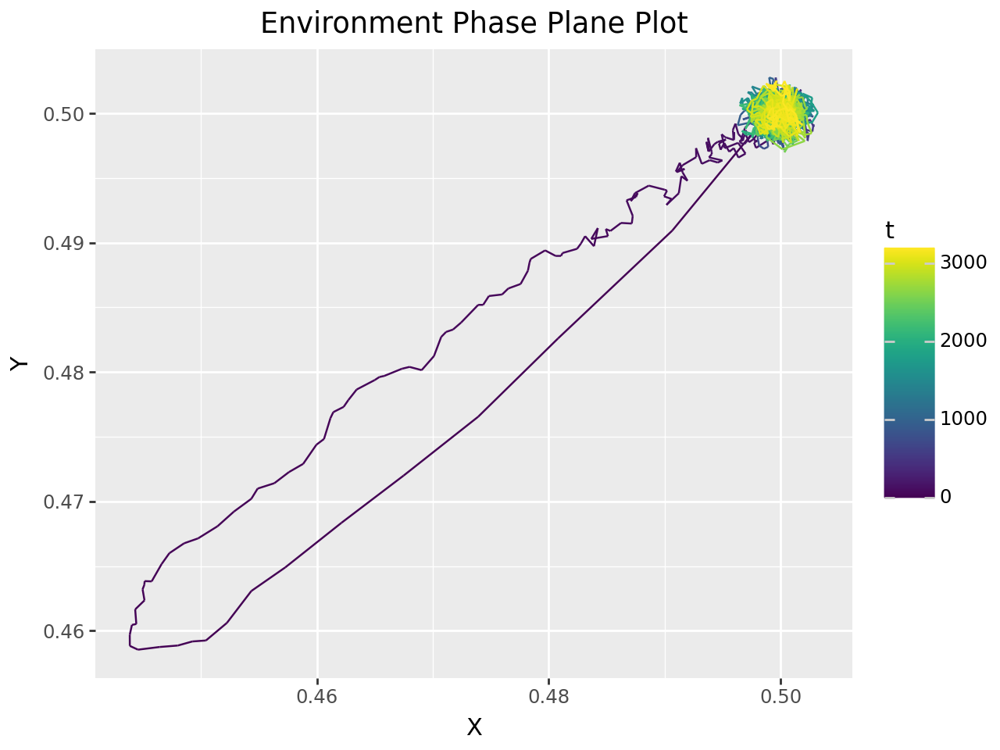

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.44
Lamprey Min Population: 0.46
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.01
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.010000000000000009, Lamprey Velocity: 0.26


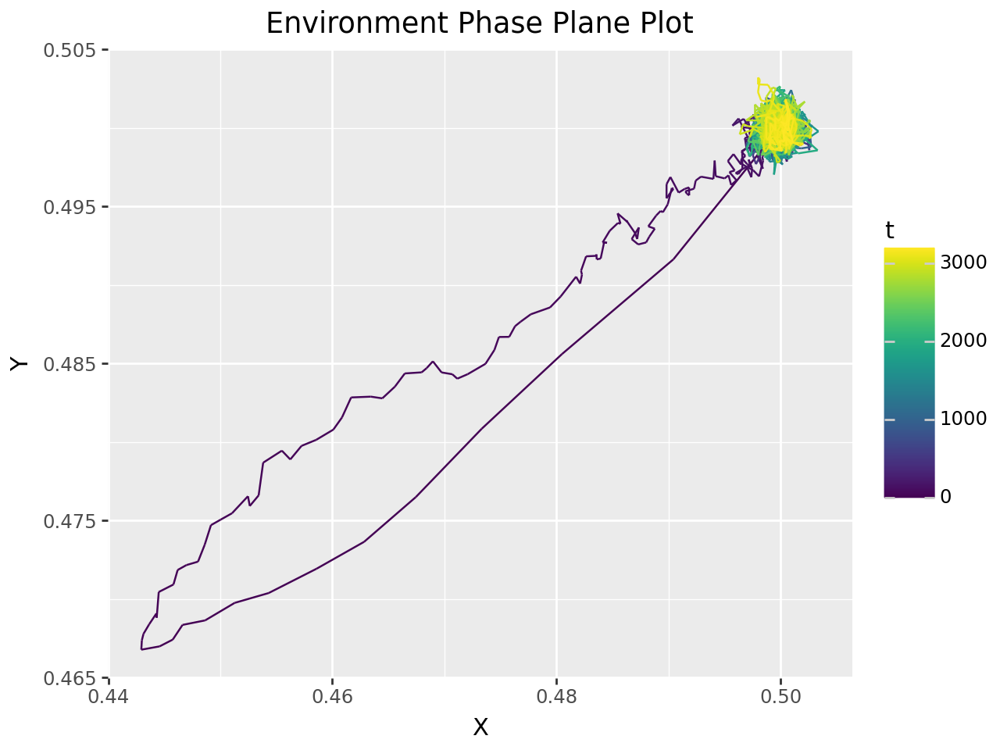

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.44
Lamprey Min Population: 0.47
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.01
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.010000000000000009, Lamprey Velocity: 0.51


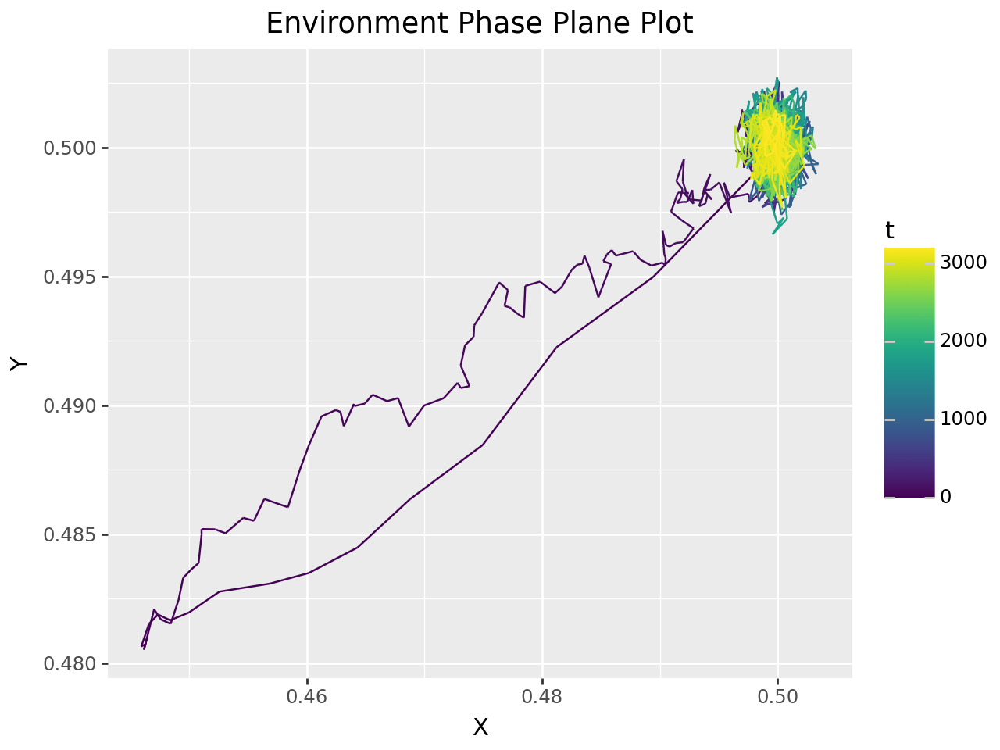

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.45
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.01
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.010000000000000009, Lamprey Velocity: 0.76


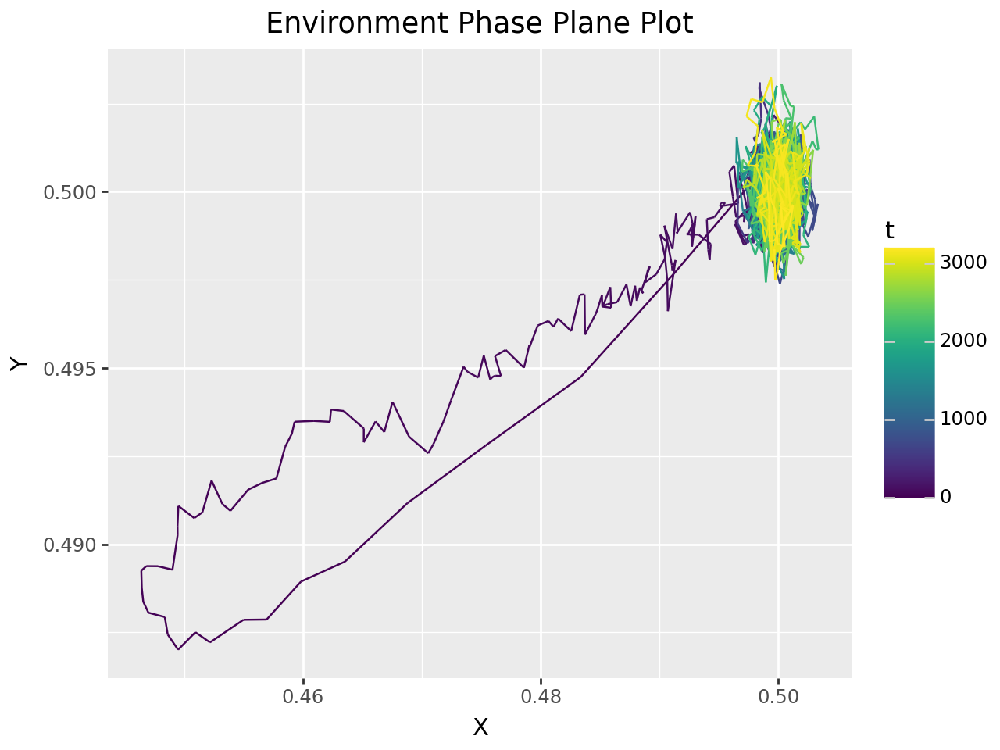

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.45
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.01
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.26, Lamprey Velocity: 0.010000000000000009


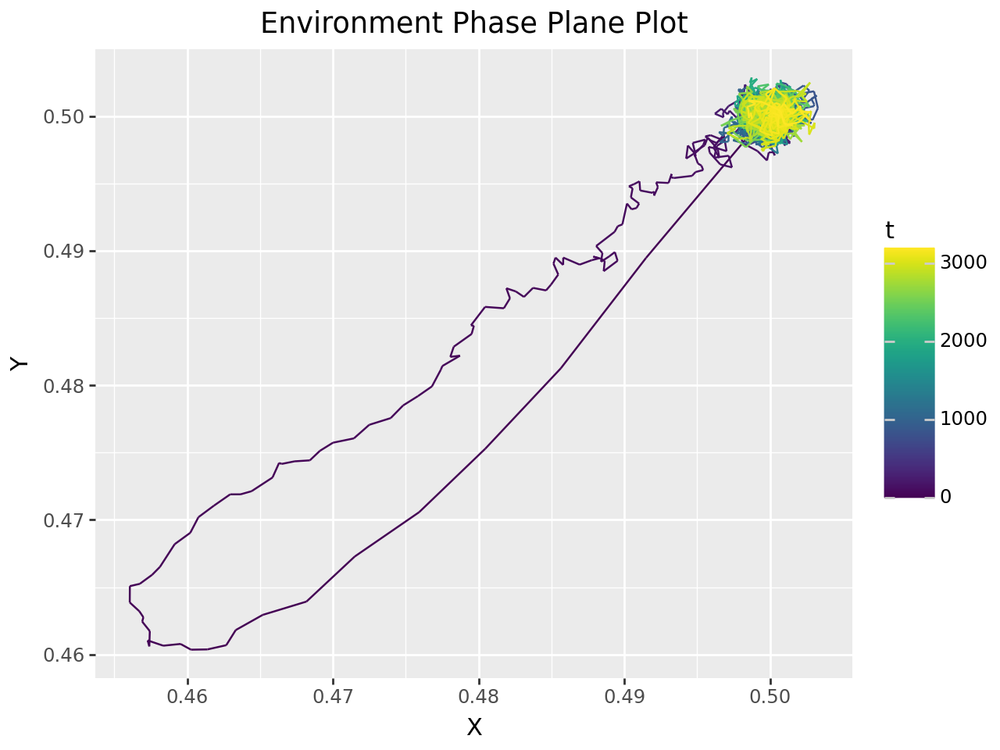

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.46
Lamprey Min Population: 0.46
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.26, Lamprey Velocity: 0.26


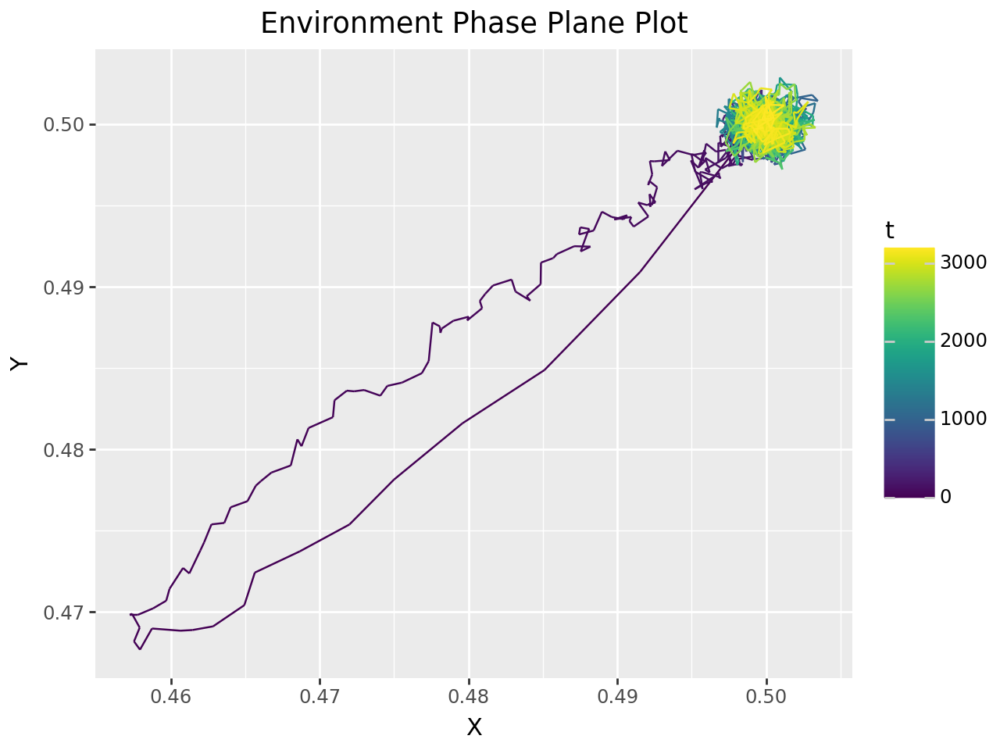

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.46
Lamprey Min Population: 0.47
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.26, Lamprey Velocity: 0.51


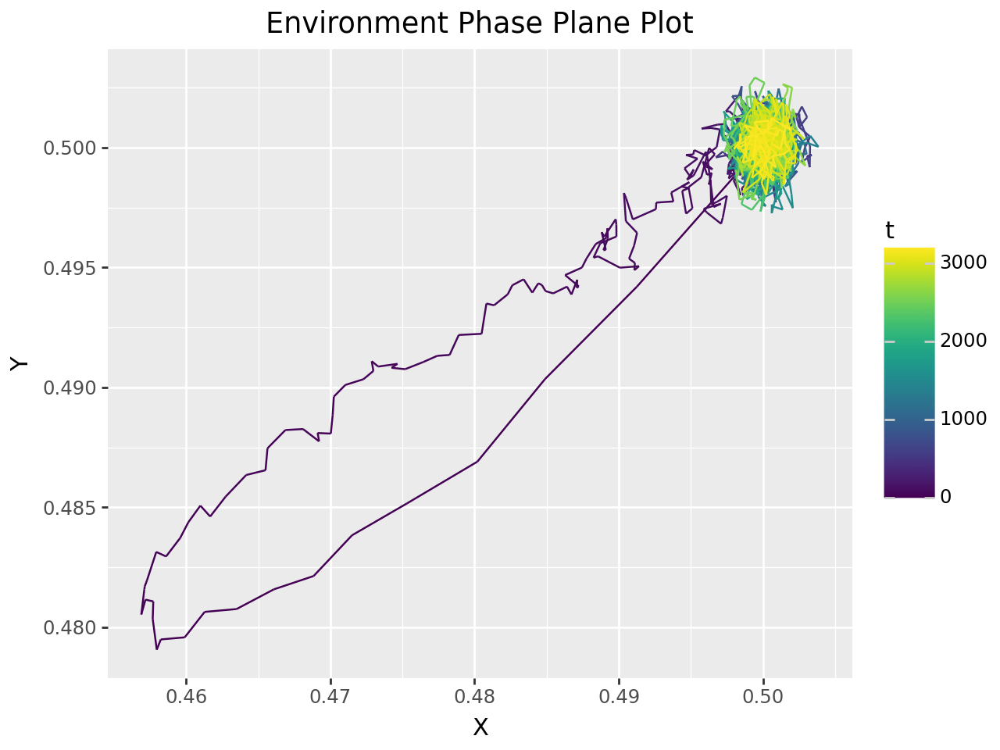

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.46
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.26, Lamprey Velocity: 0.76


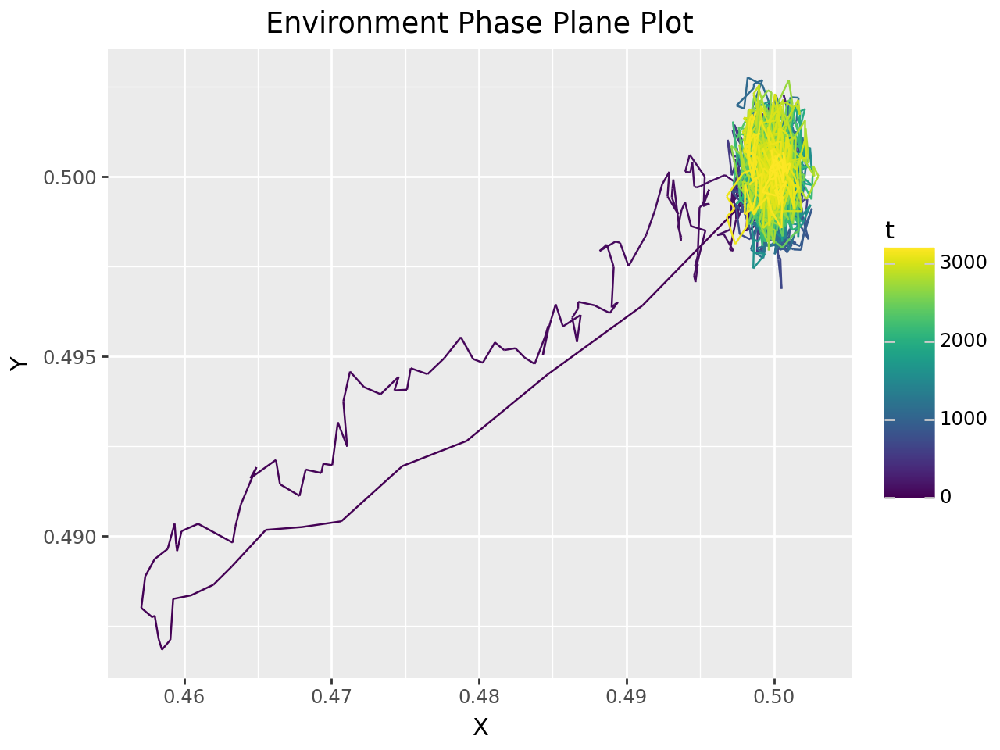

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.46
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.51, Lamprey Velocity: 0.010000000000000009


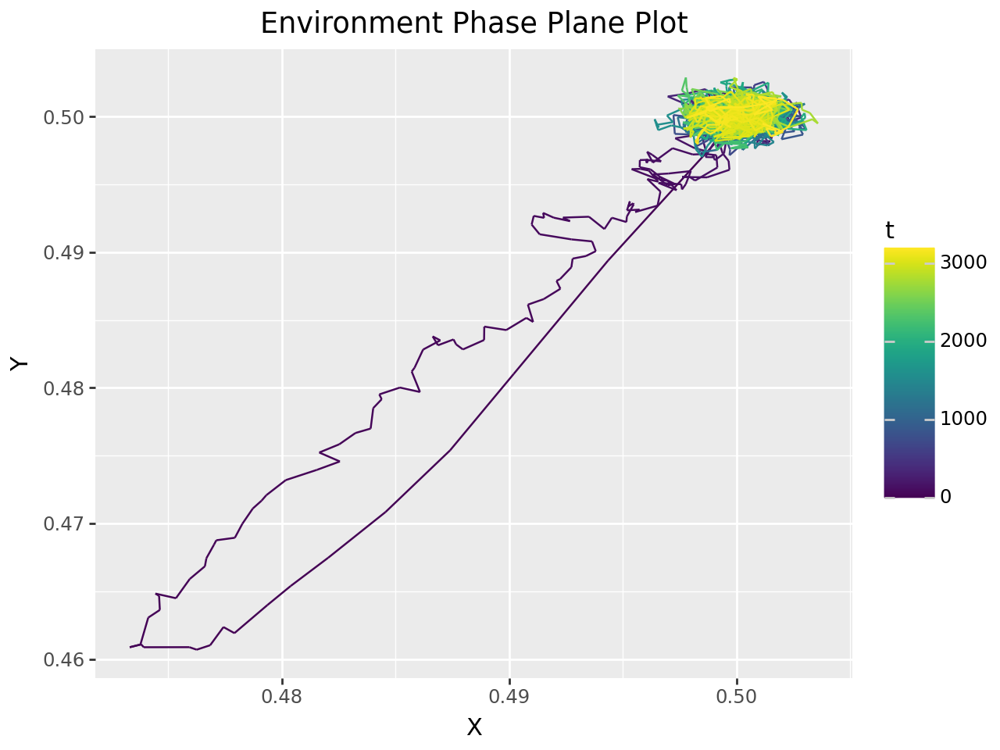

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.47
Lamprey Min Population: 0.46
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.51, Lamprey Velocity: 0.26


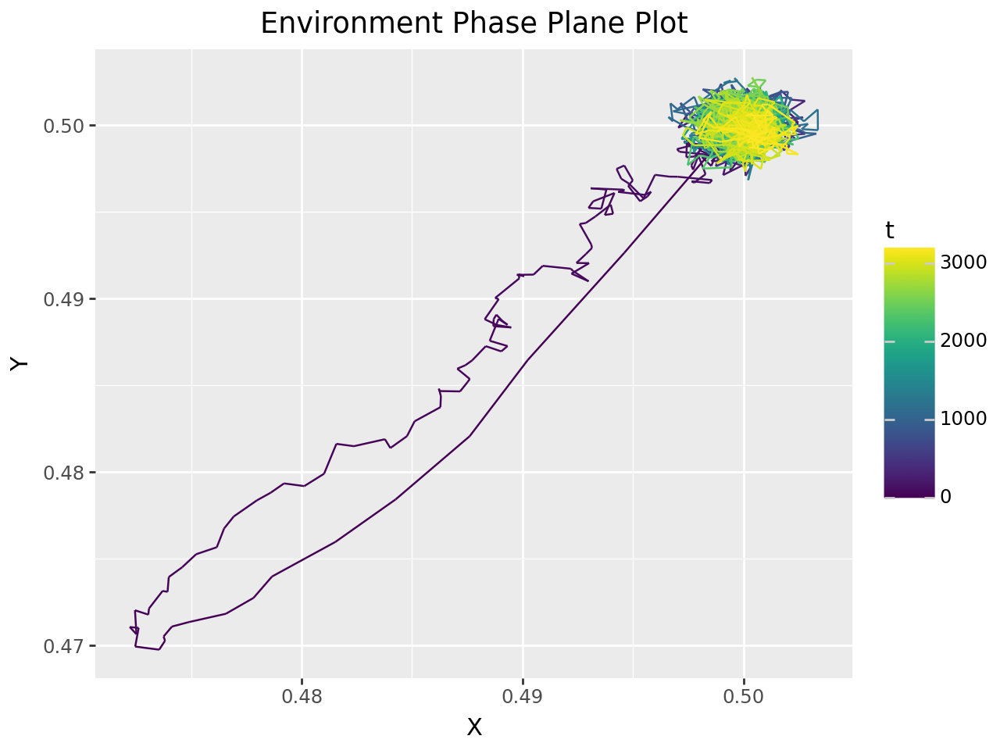

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.47
Lamprey Min Population: 0.47
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.51, Lamprey Velocity: 0.51


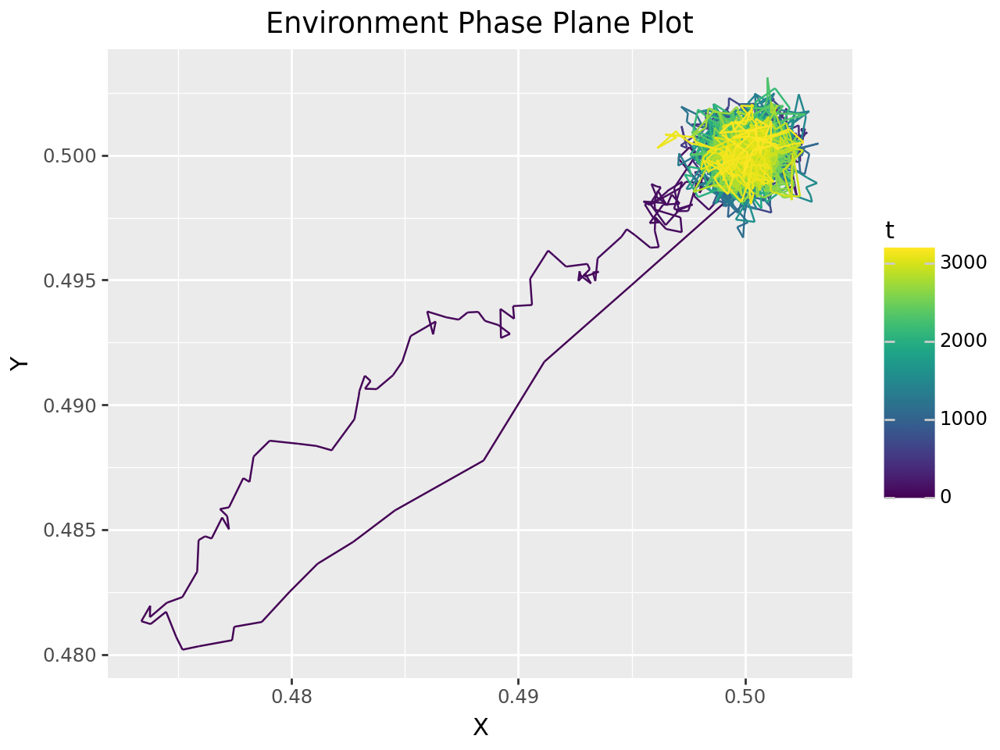

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.47
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.51, Lamprey Velocity: 0.76


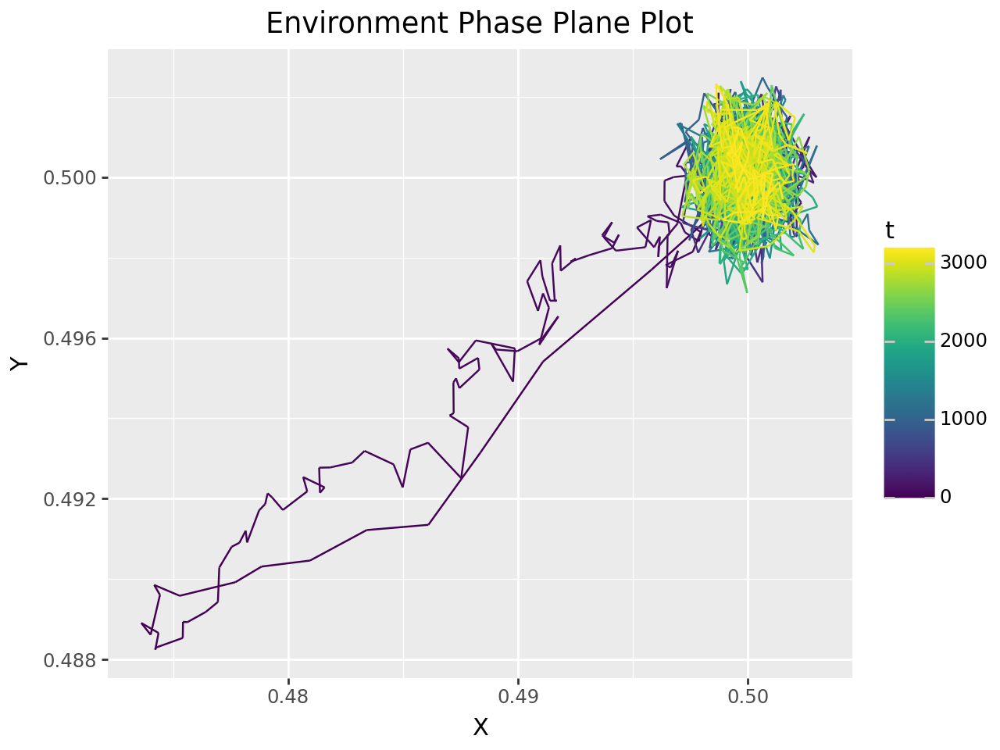

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.47
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.76, Lamprey Velocity: 0.010000000000000009


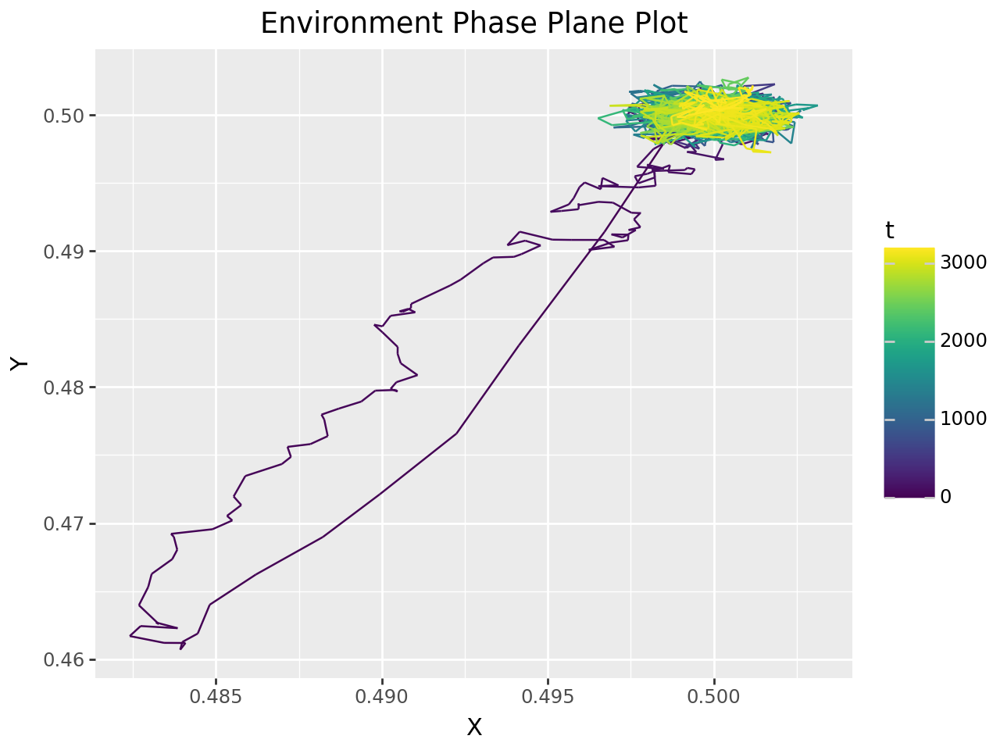

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.46
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.76, Lamprey Velocity: 0.26


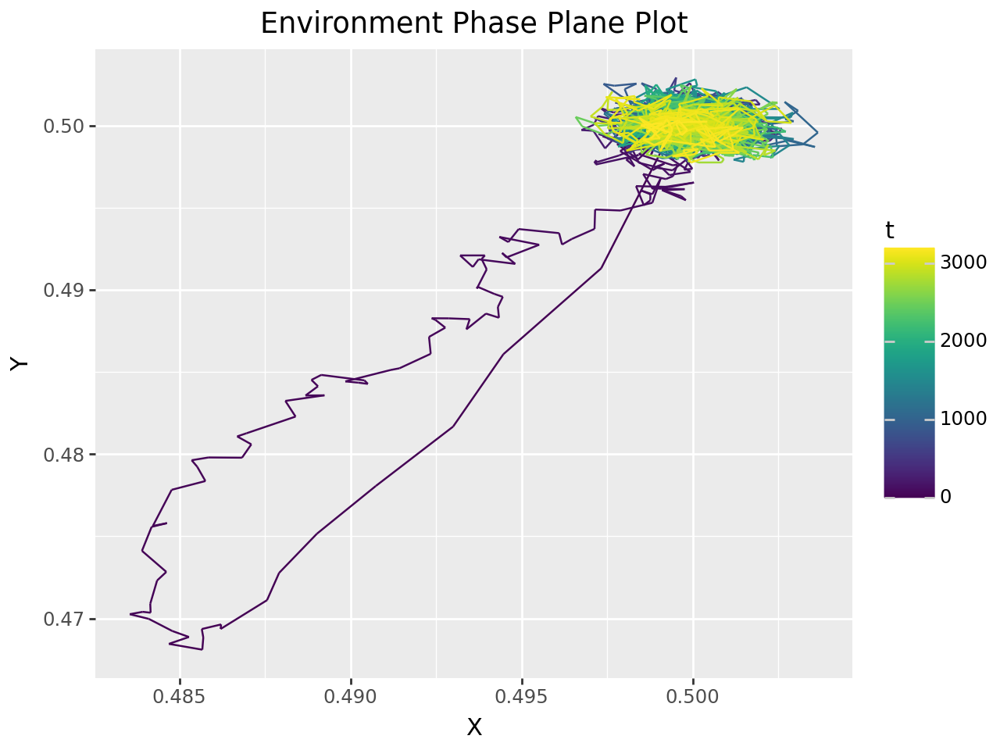

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.47
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.76, Lamprey Velocity: 0.51


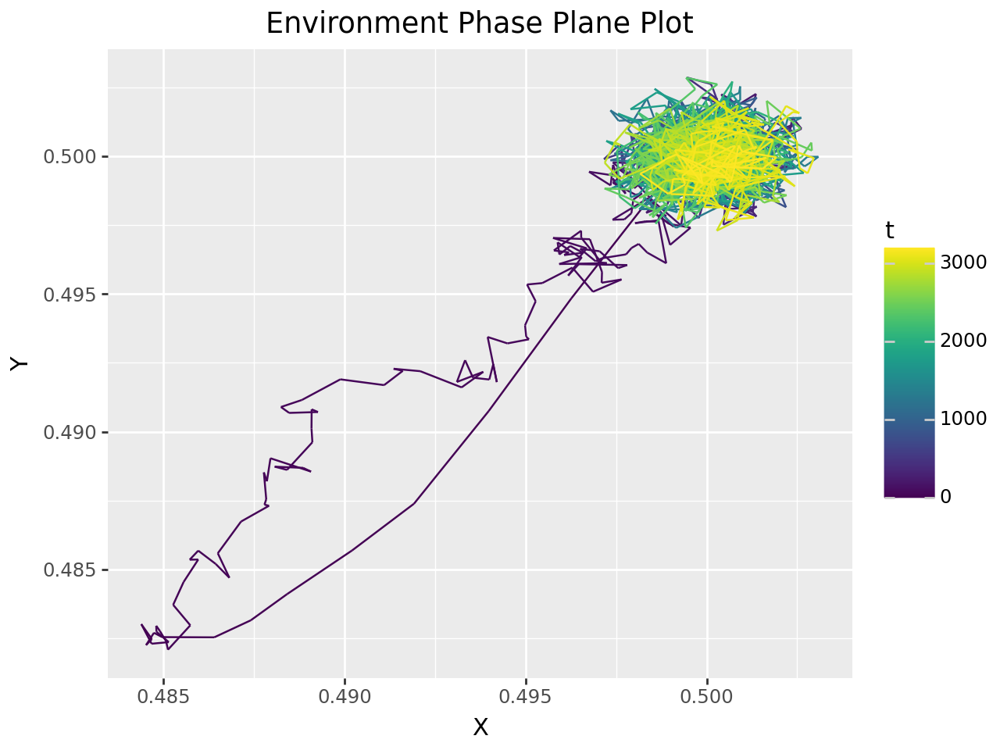

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.76, Lamprey Velocity: 0.76


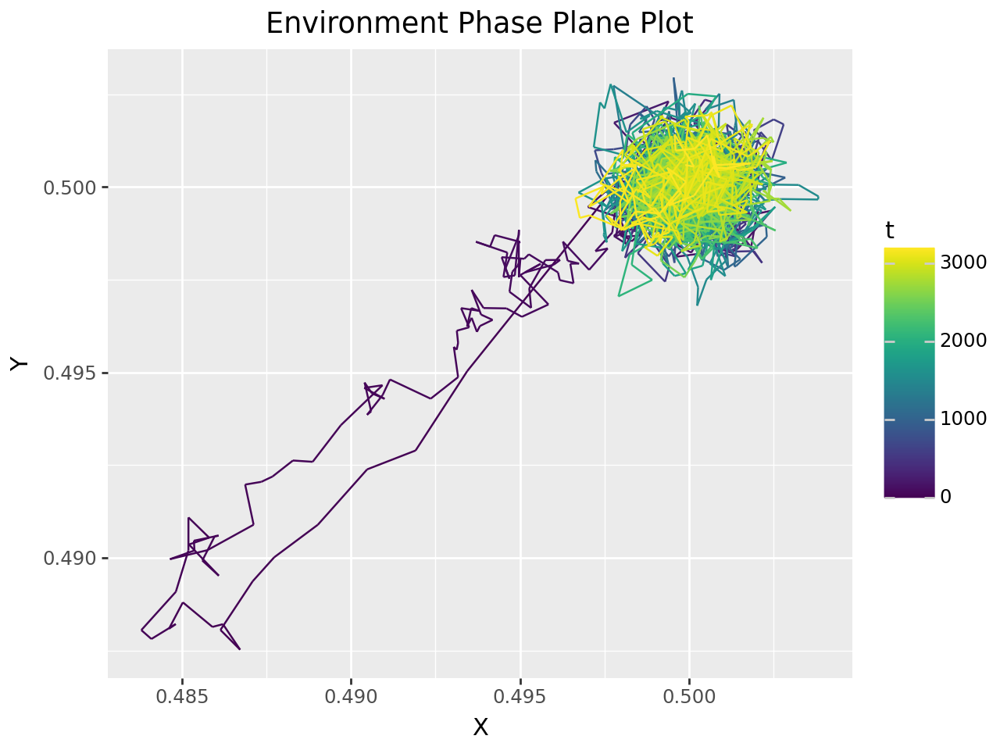

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.010000000000000009, Lamprey Velocity: 0.010000000000000009


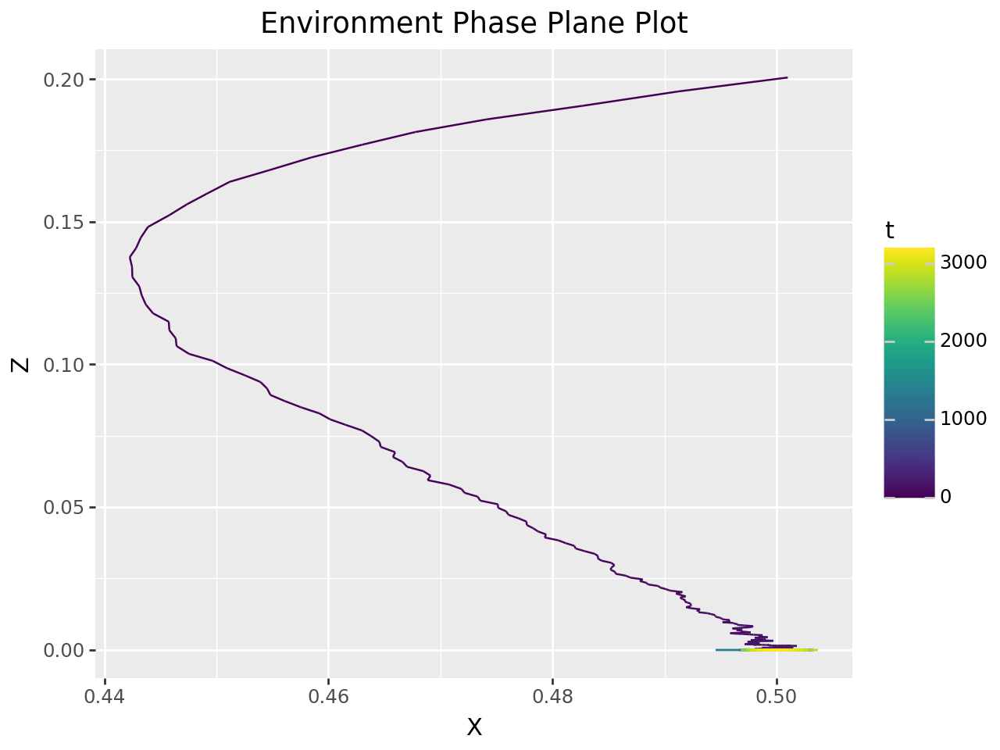

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.44
Lamprey Min Population: 0.46
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.01
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.010000000000000009, Lamprey Velocity: 0.26


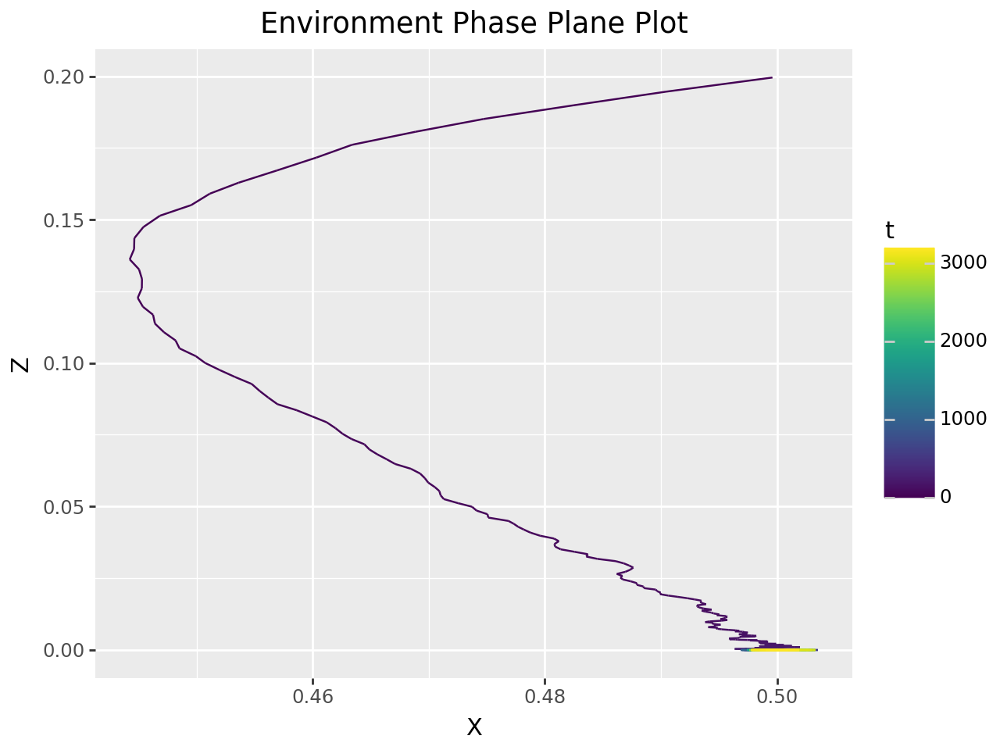

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.44
Lamprey Min Population: 0.47
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.01
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.010000000000000009, Lamprey Velocity: 0.51


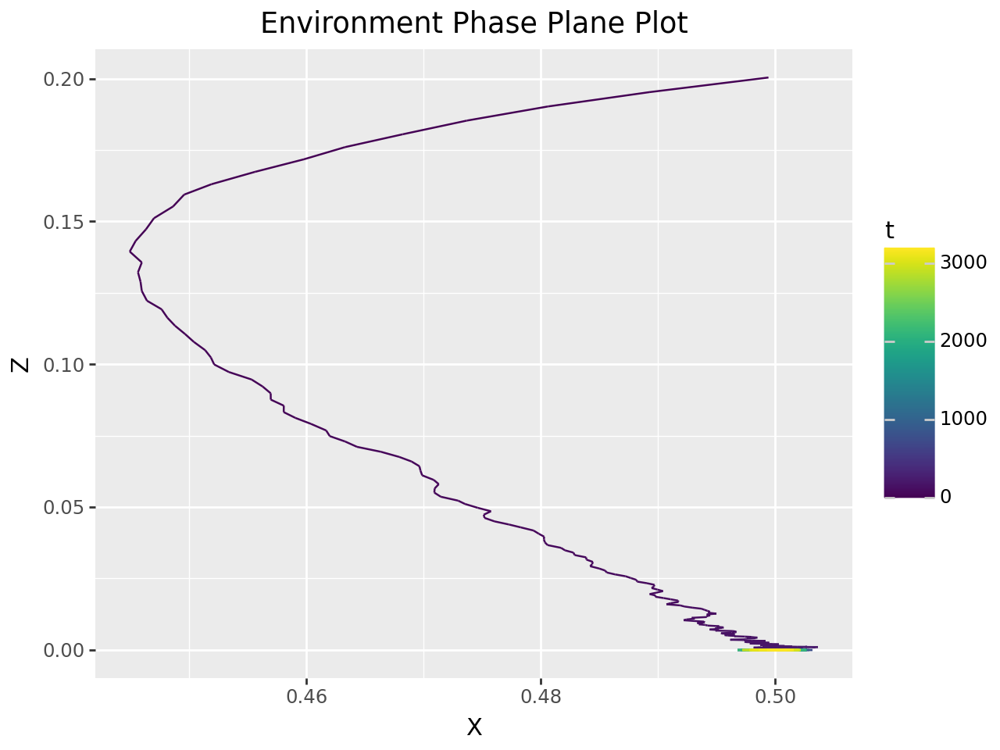

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.44
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.01
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.010000000000000009, Lamprey Velocity: 0.76


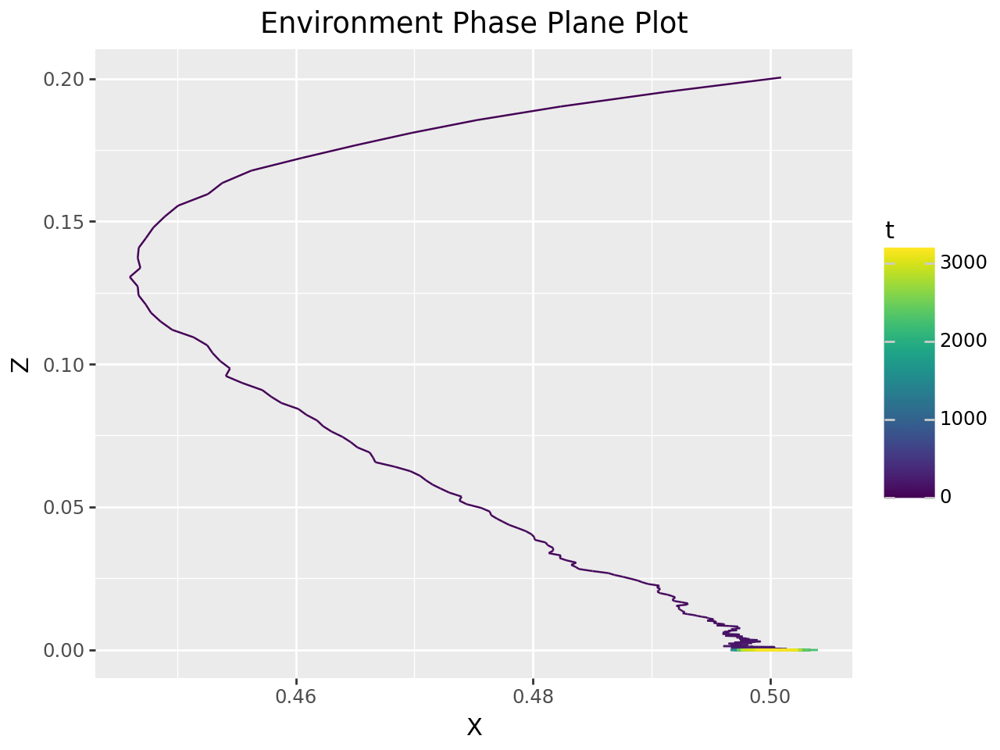

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.45
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.01
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.26, Lamprey Velocity: 0.010000000000000009


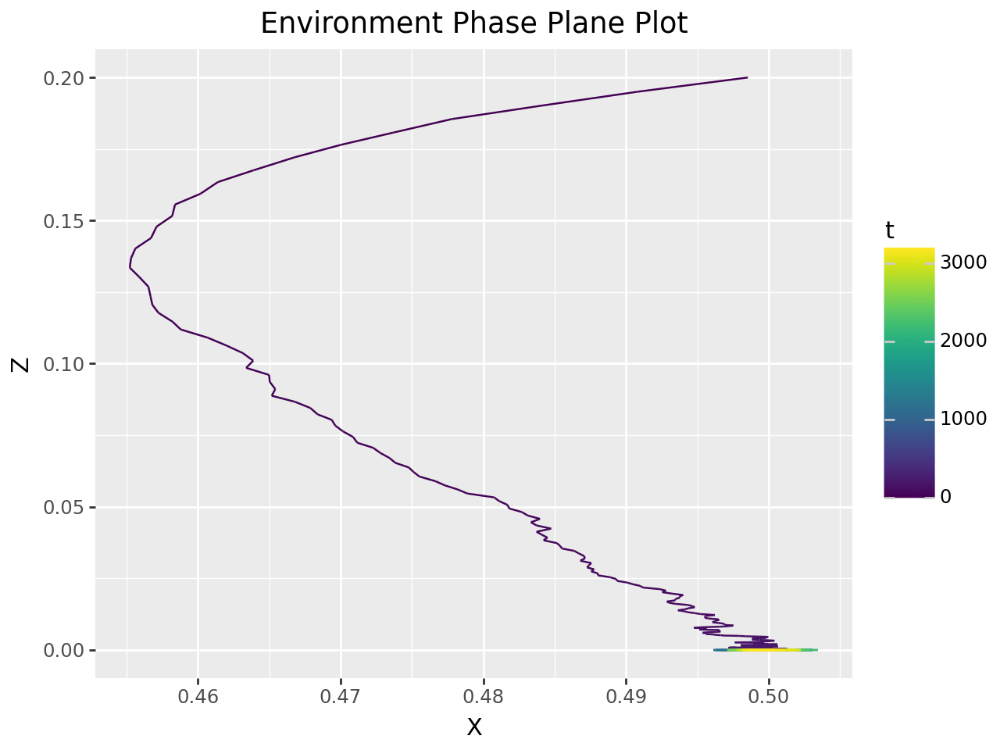

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.46
Lamprey Min Population: 0.46
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.26, Lamprey Velocity: 0.26


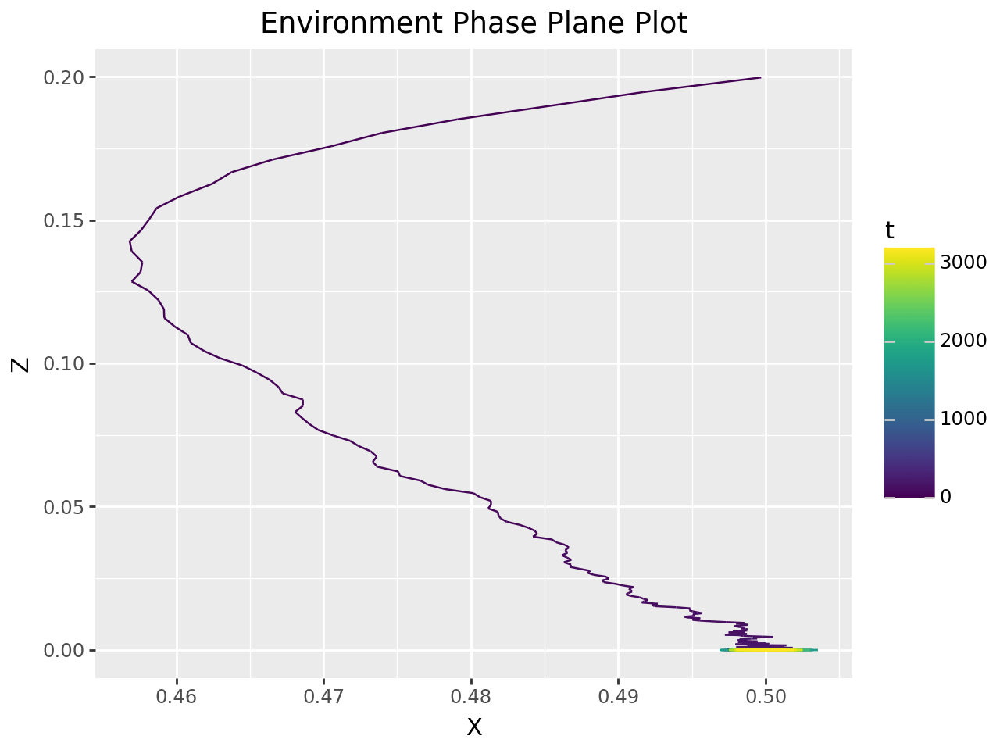

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.46
Lamprey Min Population: 0.47
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.26, Lamprey Velocity: 0.51


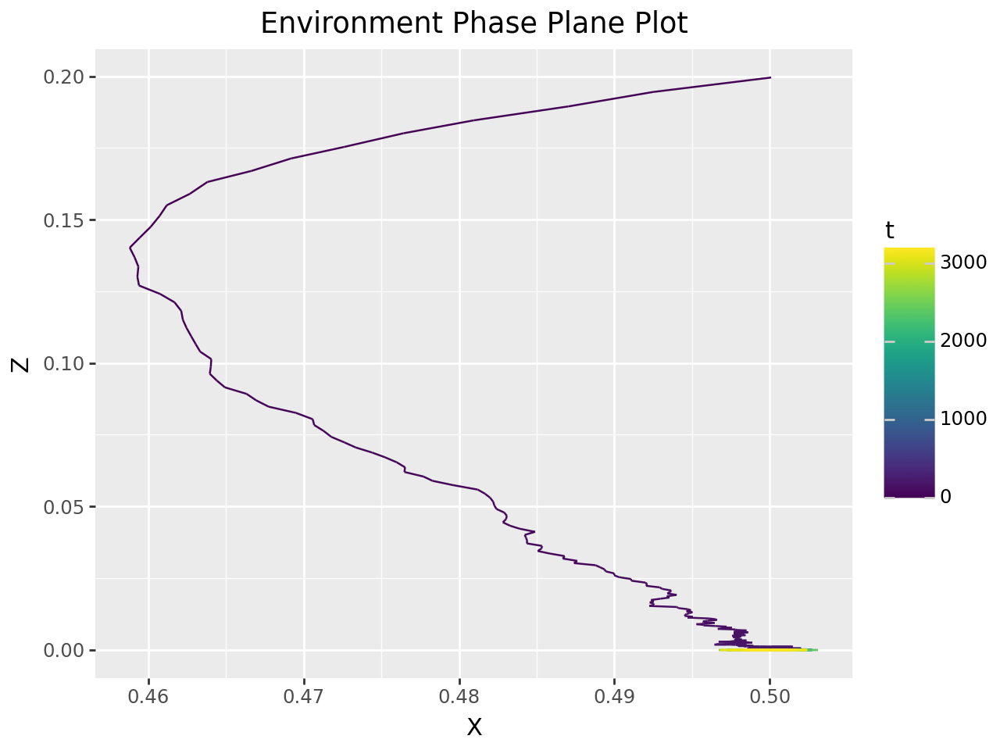

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.46
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.26, Lamprey Velocity: 0.76


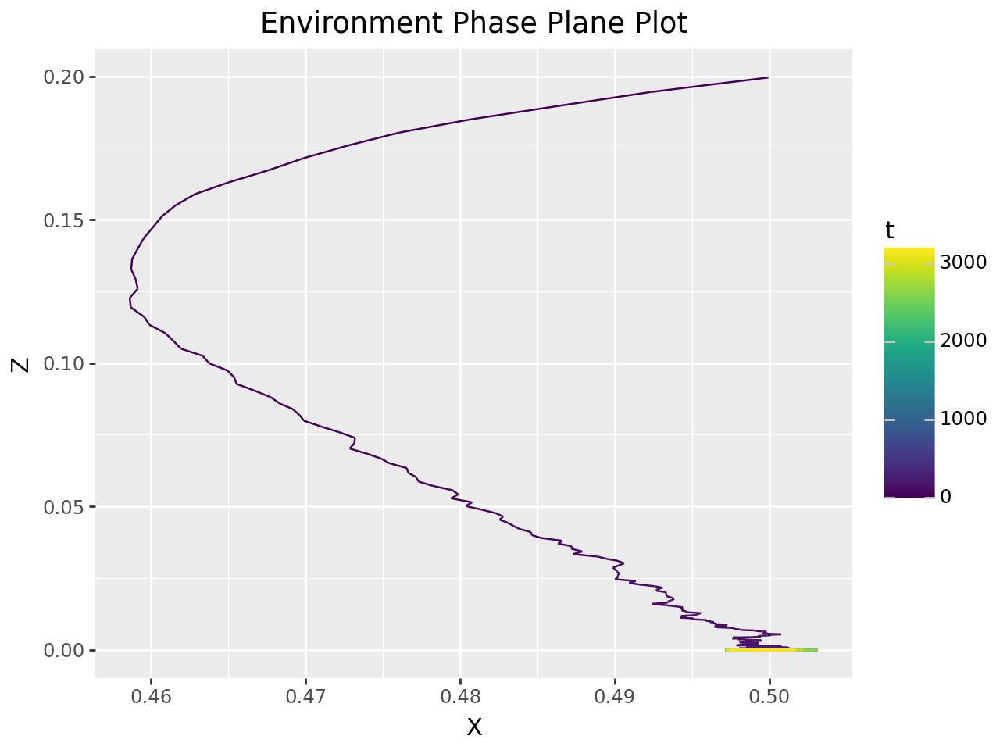

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.46
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.51, Lamprey Velocity: 0.010000000000000009


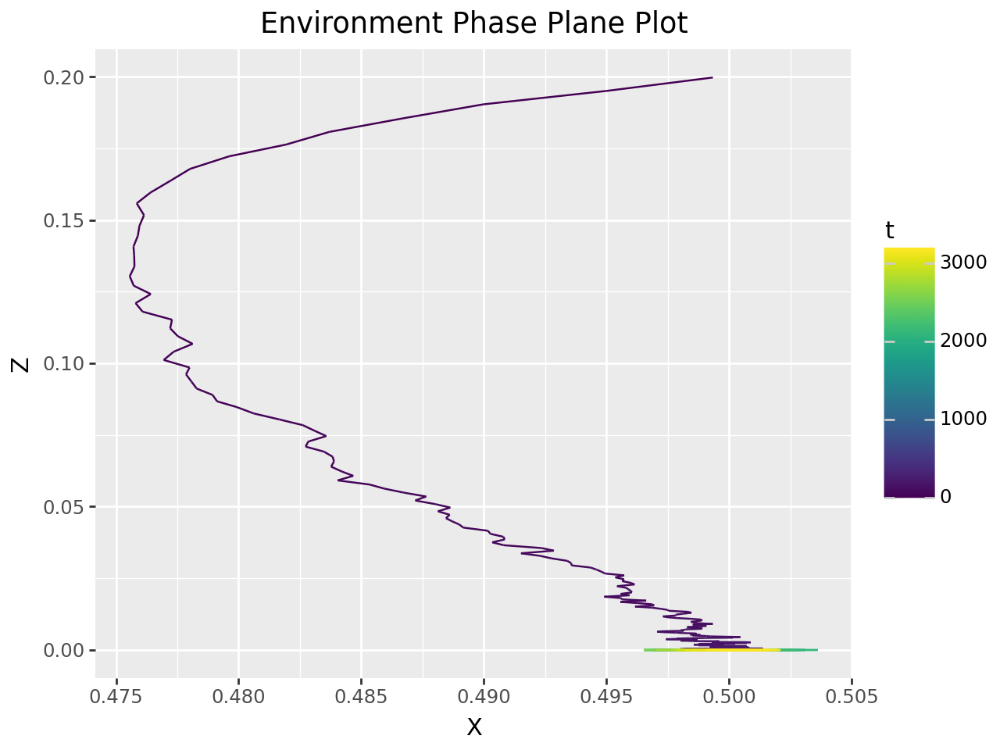

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.46
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.51, Lamprey Velocity: 0.26


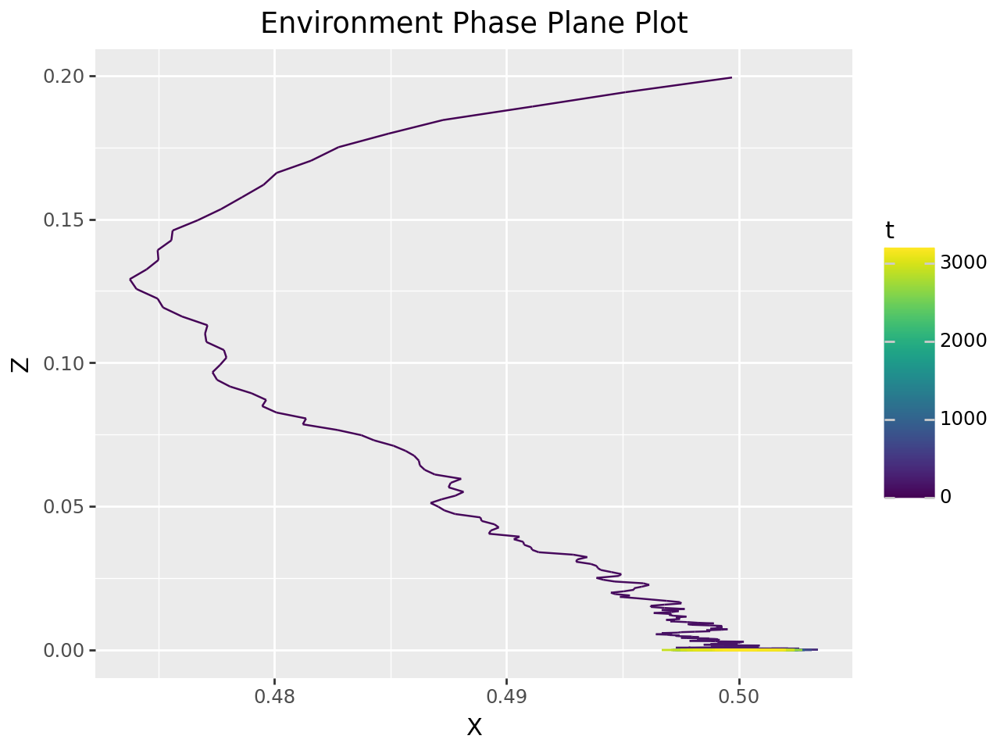

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.47
Lamprey Min Population: 0.47
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.51, Lamprey Velocity: 0.51


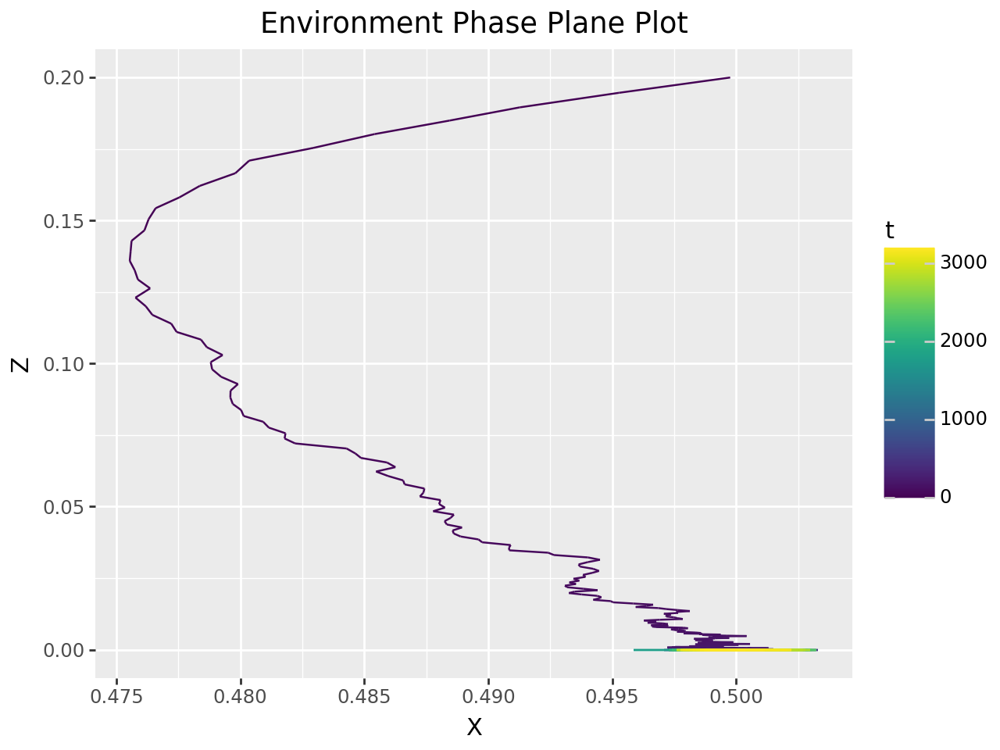

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.51, Lamprey Velocity: 0.76


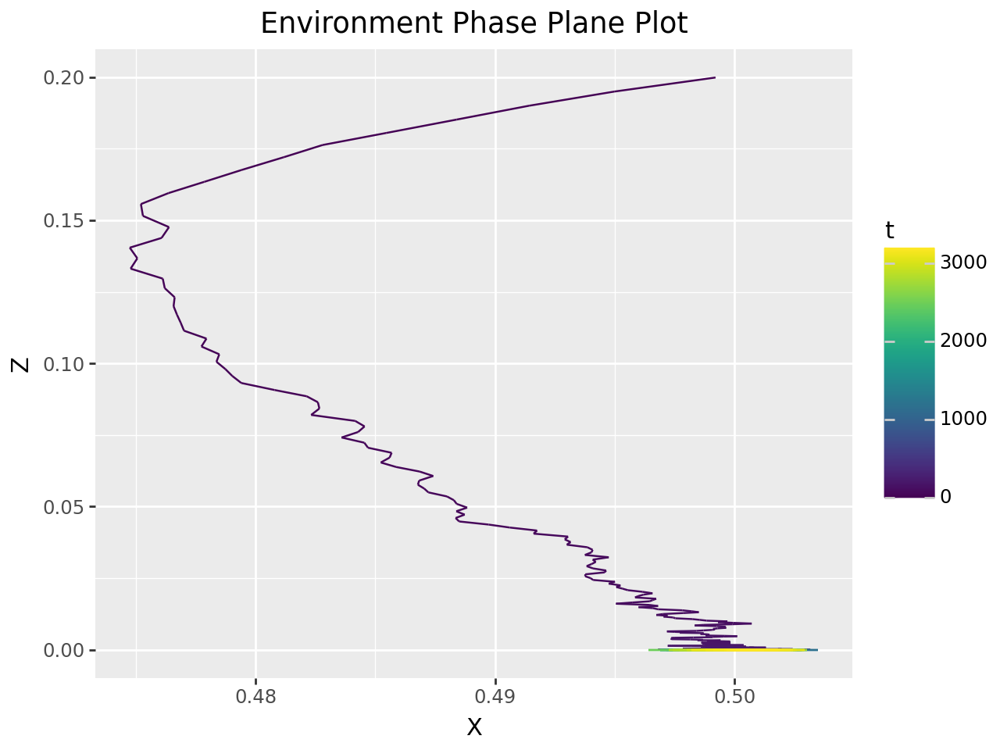

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.47
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.76, Lamprey Velocity: 0.010000000000000009


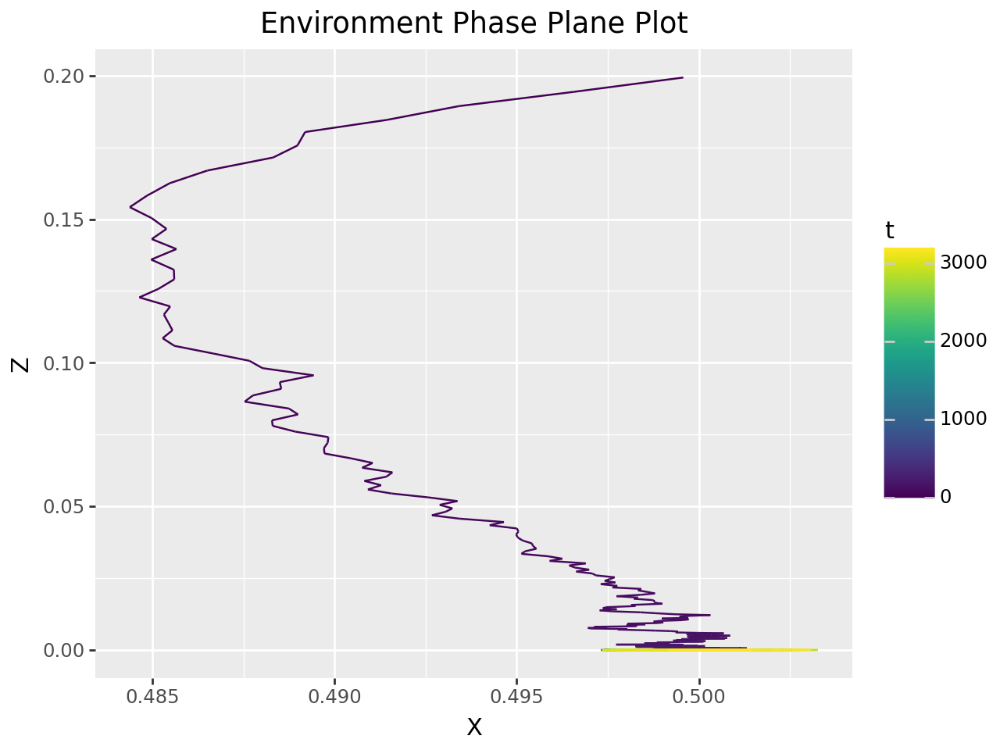

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.46
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.76, Lamprey Velocity: 0.26


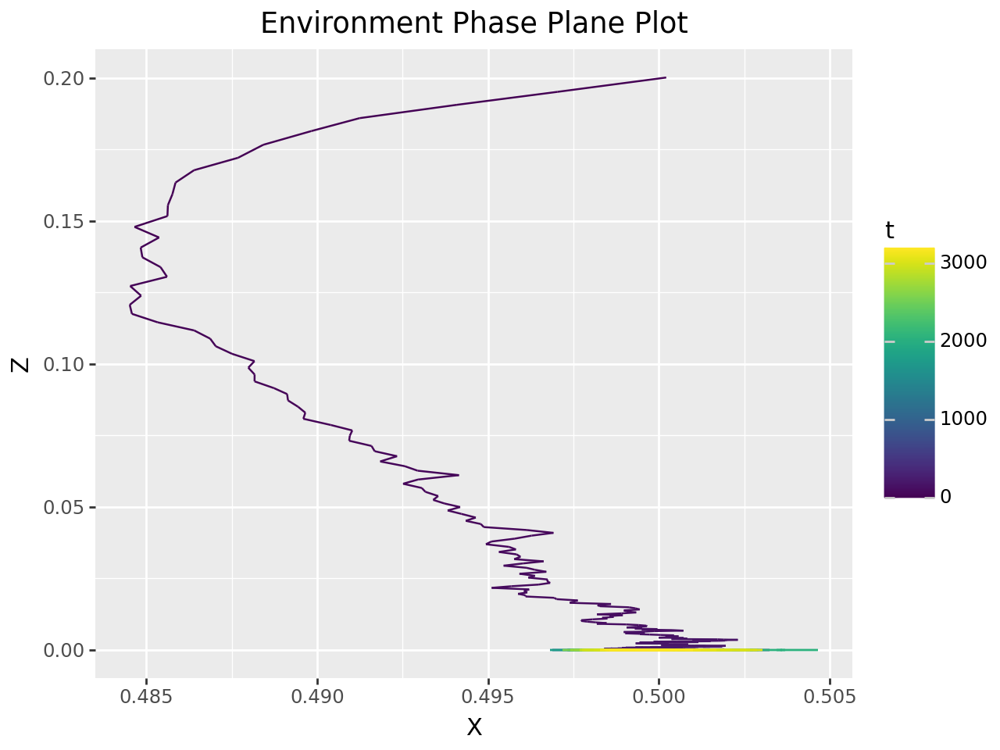

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.47
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.76, Lamprey Velocity: 0.51


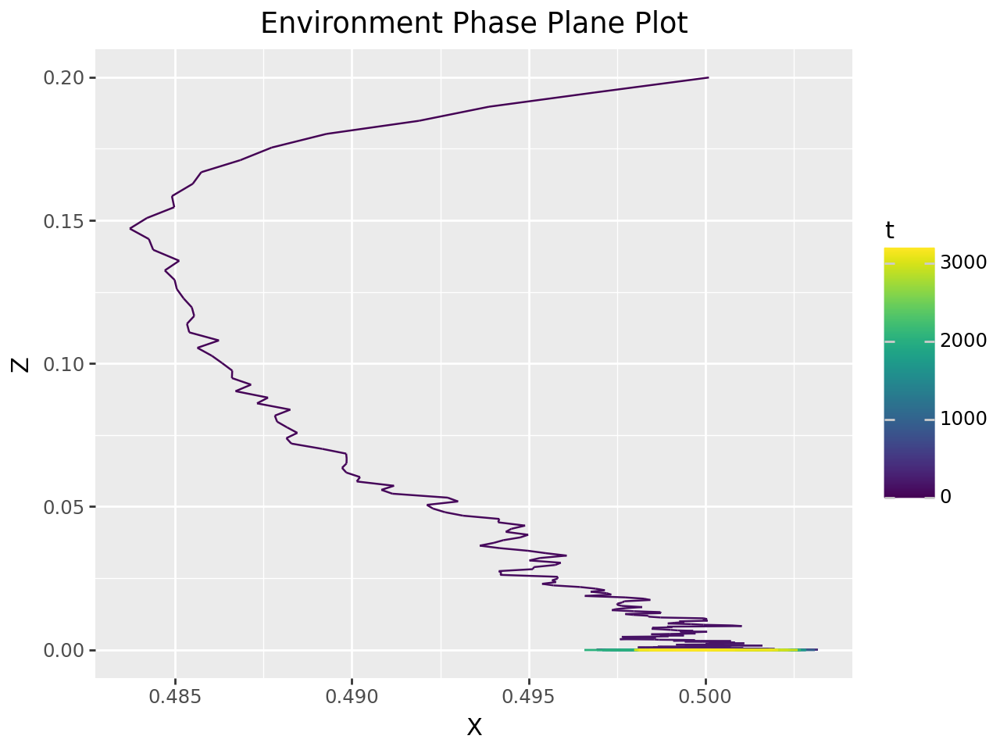

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.76, Lamprey Velocity: 0.76


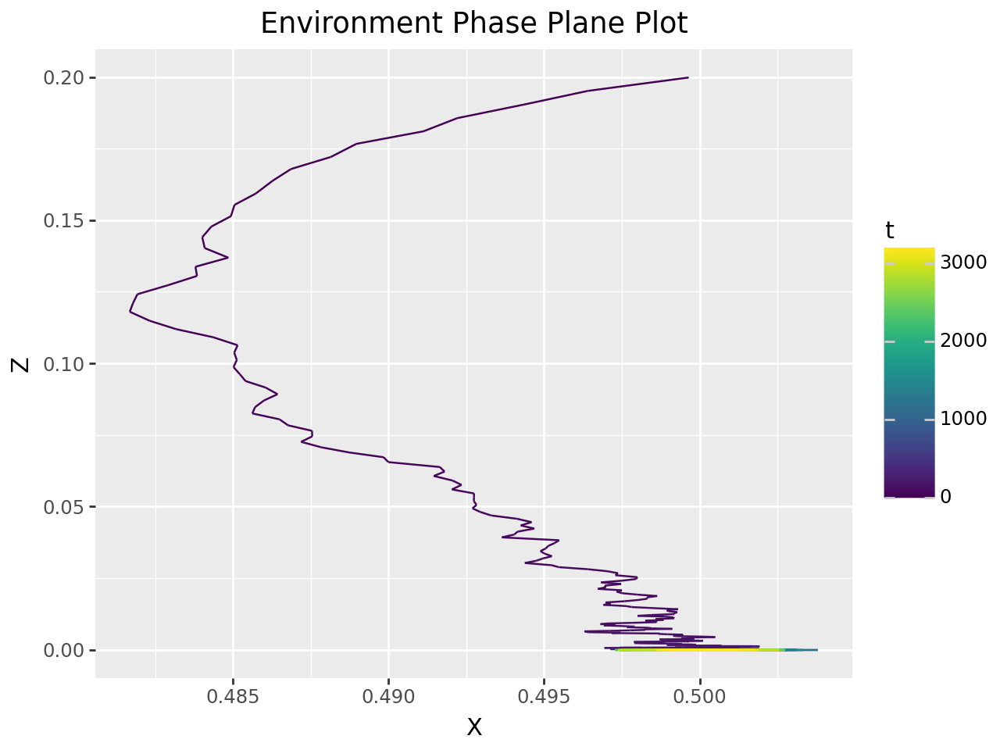

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.010000000000000009, Lamprey Velocity: 0.010000000000000009


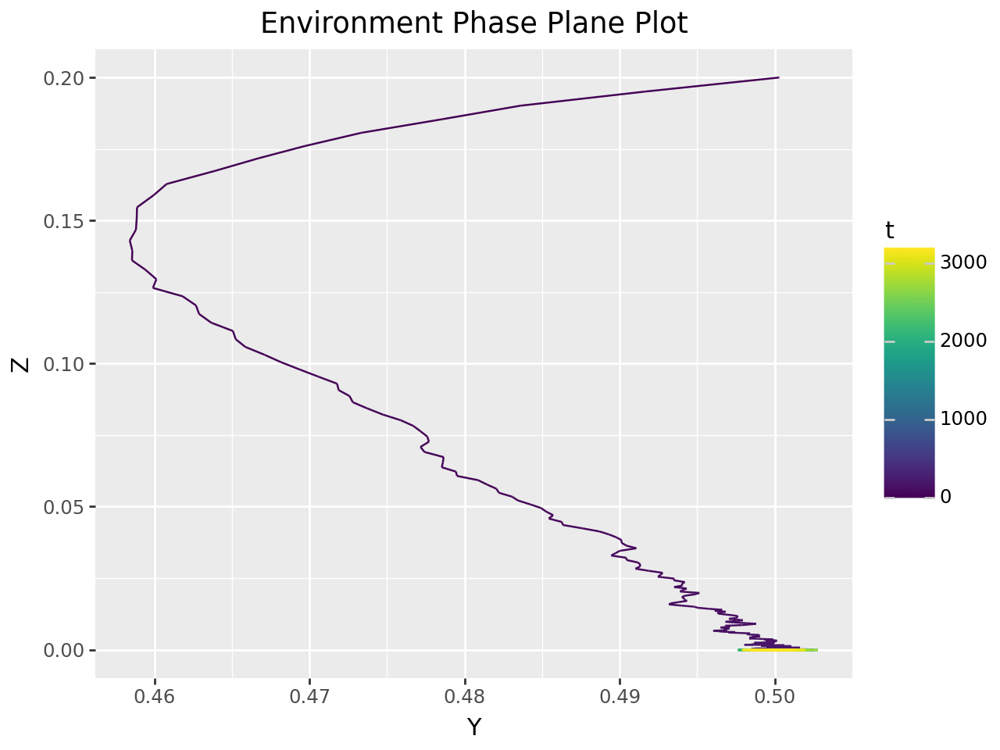

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.44
Lamprey Min Population: 0.46
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.01
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.010000000000000009, Lamprey Velocity: 0.26


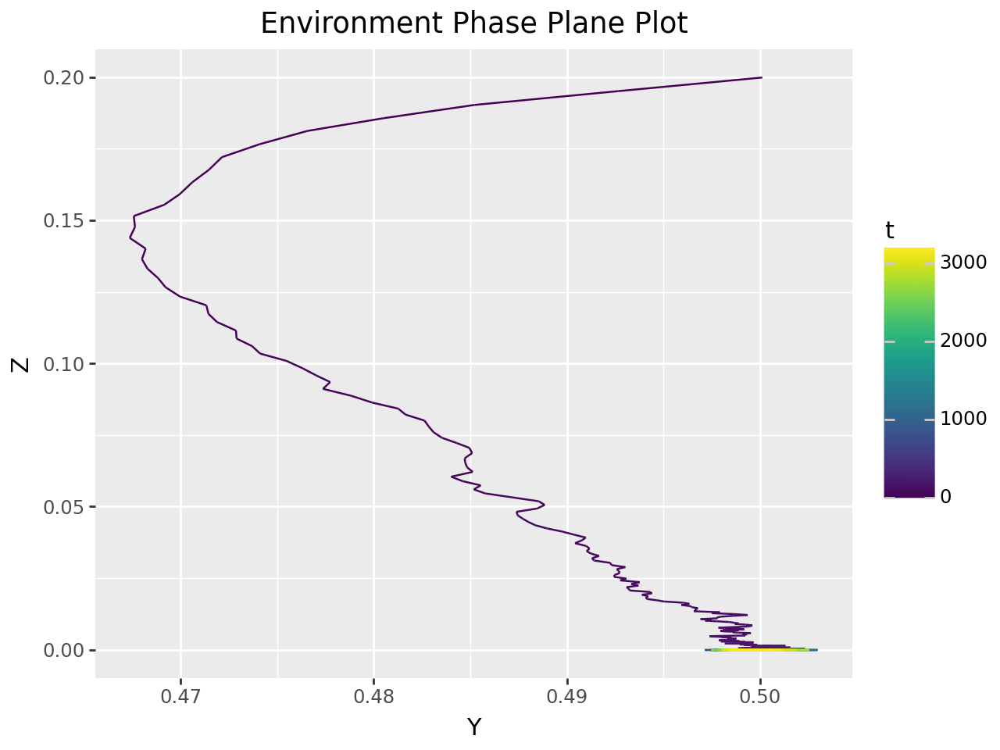

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.44
Lamprey Min Population: 0.47
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.01
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.010000000000000009, Lamprey Velocity: 0.51


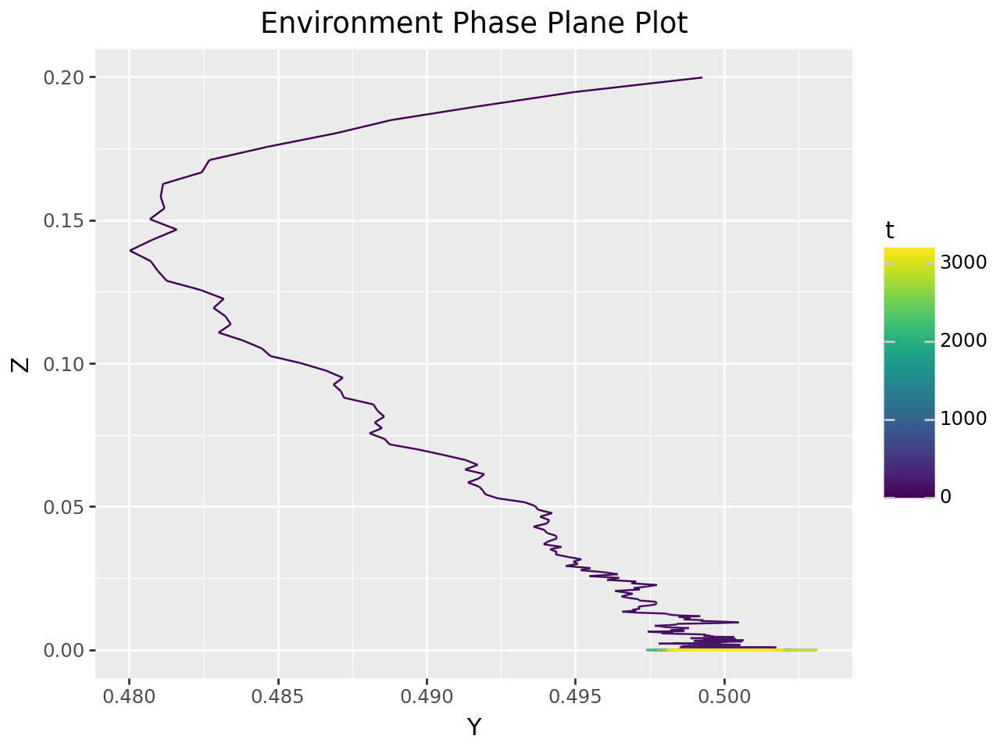

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.45
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.01
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.010000000000000009, Lamprey Velocity: 0.76


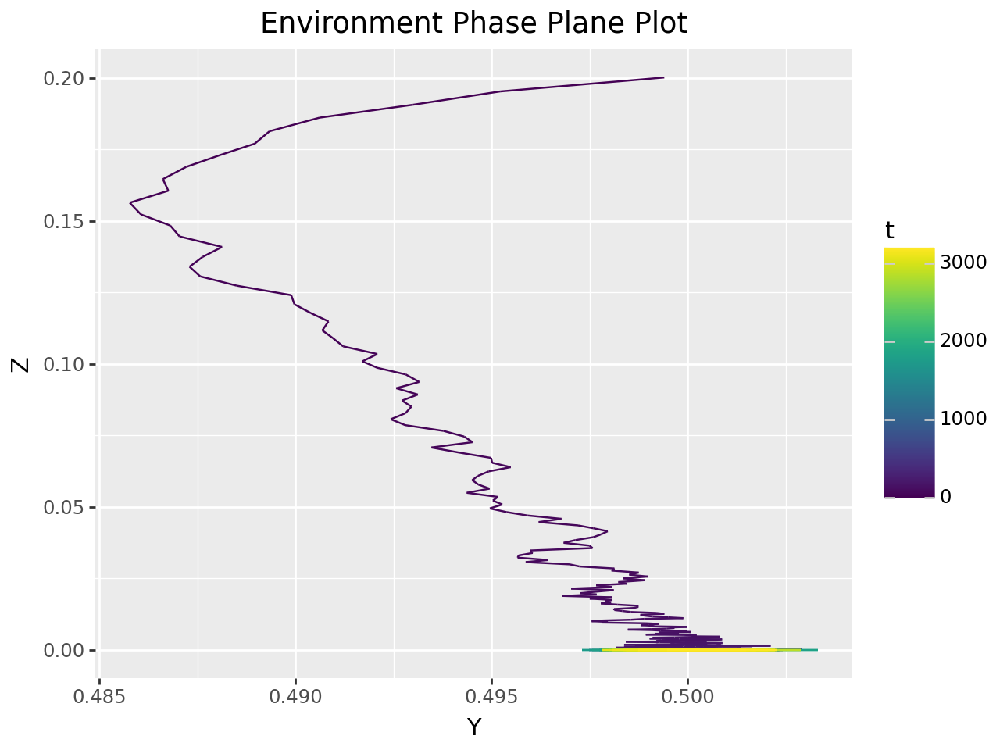

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.45
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.01
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.26, Lamprey Velocity: 0.010000000000000009


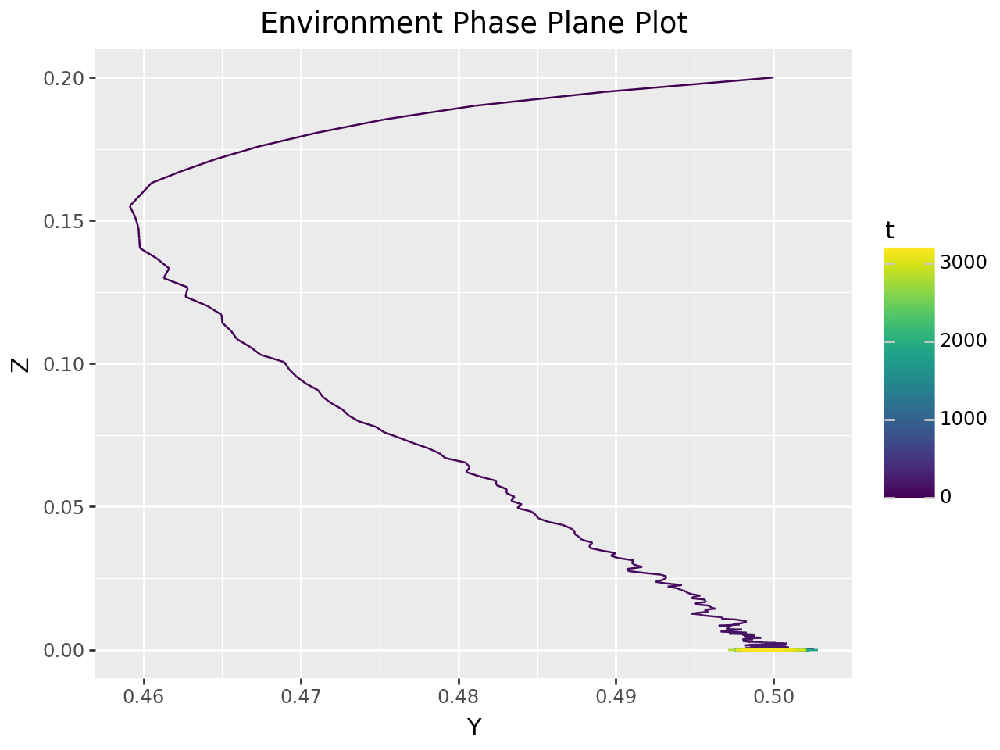

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.46
Lamprey Min Population: 0.46
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.26, Lamprey Velocity: 0.26


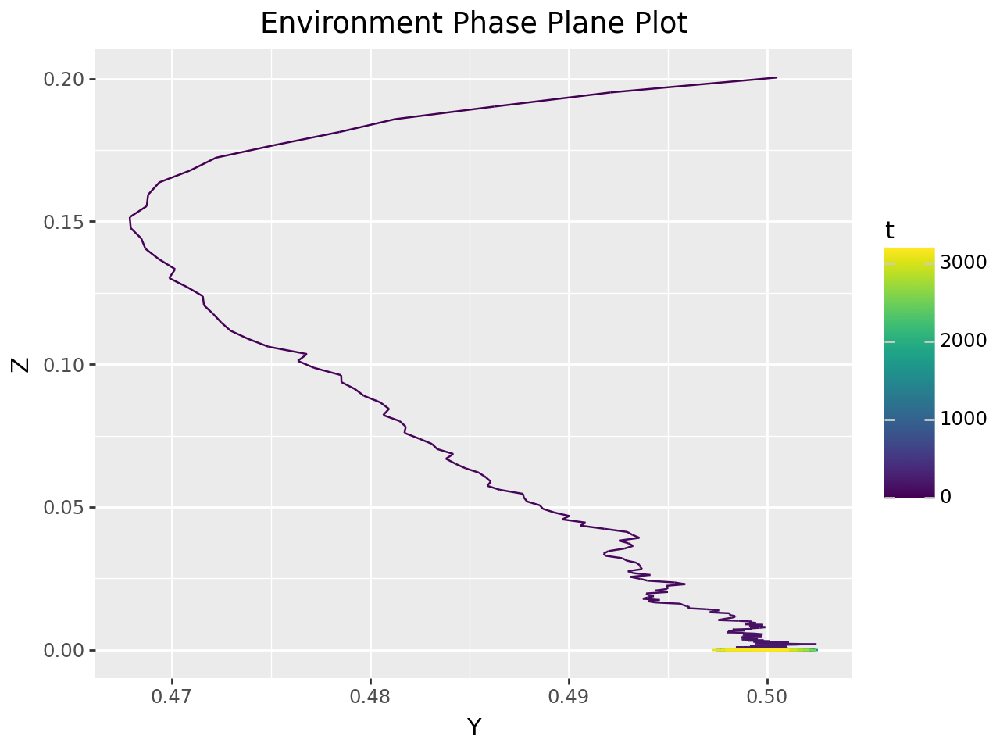

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.46
Lamprey Min Population: 0.47
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.26, Lamprey Velocity: 0.51


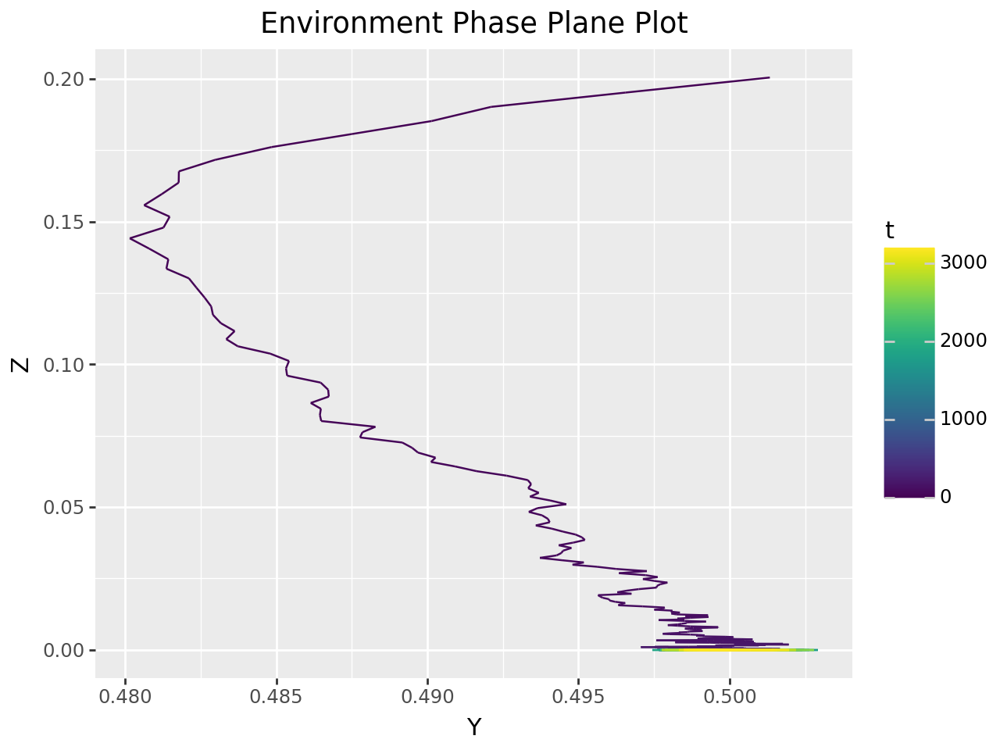

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.46
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.26, Lamprey Velocity: 0.76


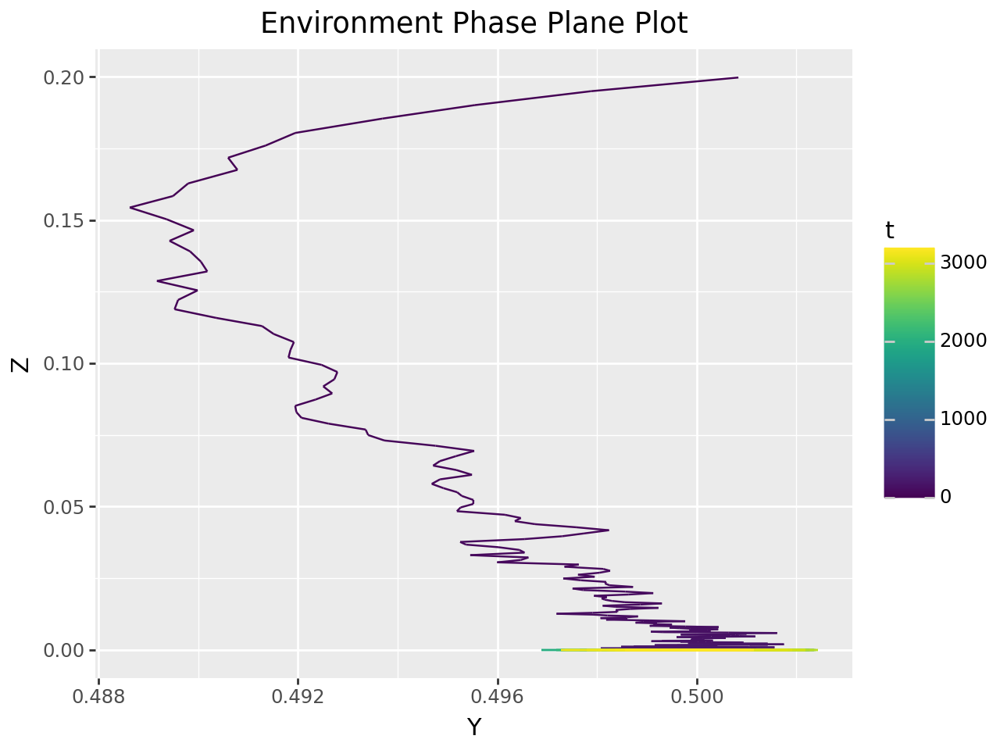

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.46
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.51, Lamprey Velocity: 0.010000000000000009


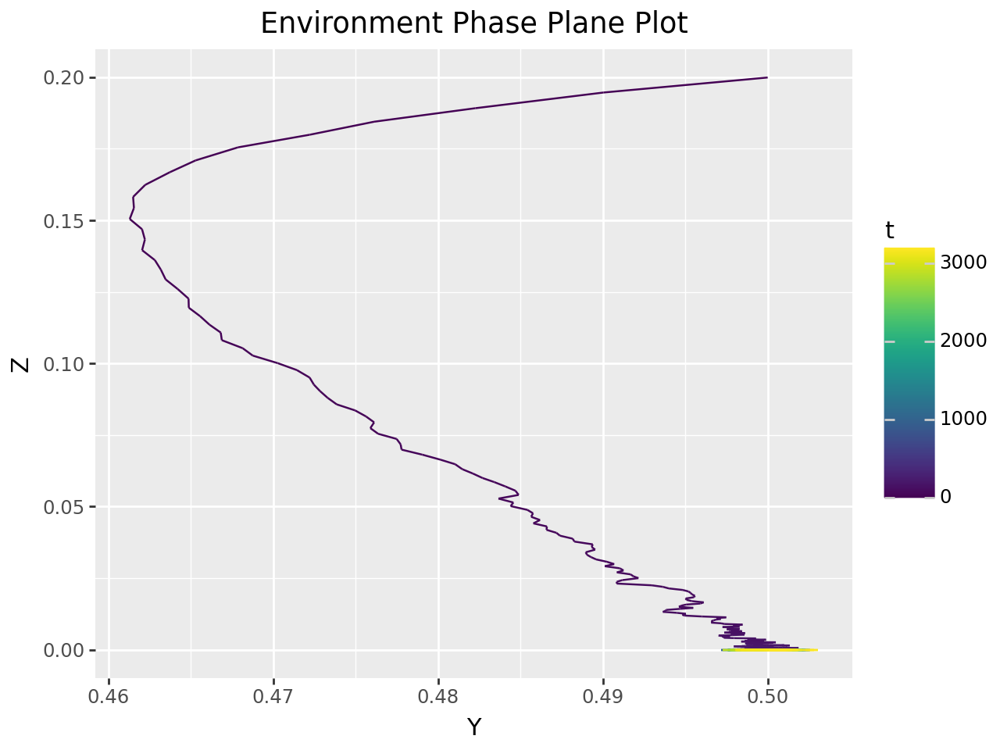

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.47
Lamprey Min Population: 0.46
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.51, Lamprey Velocity: 0.26


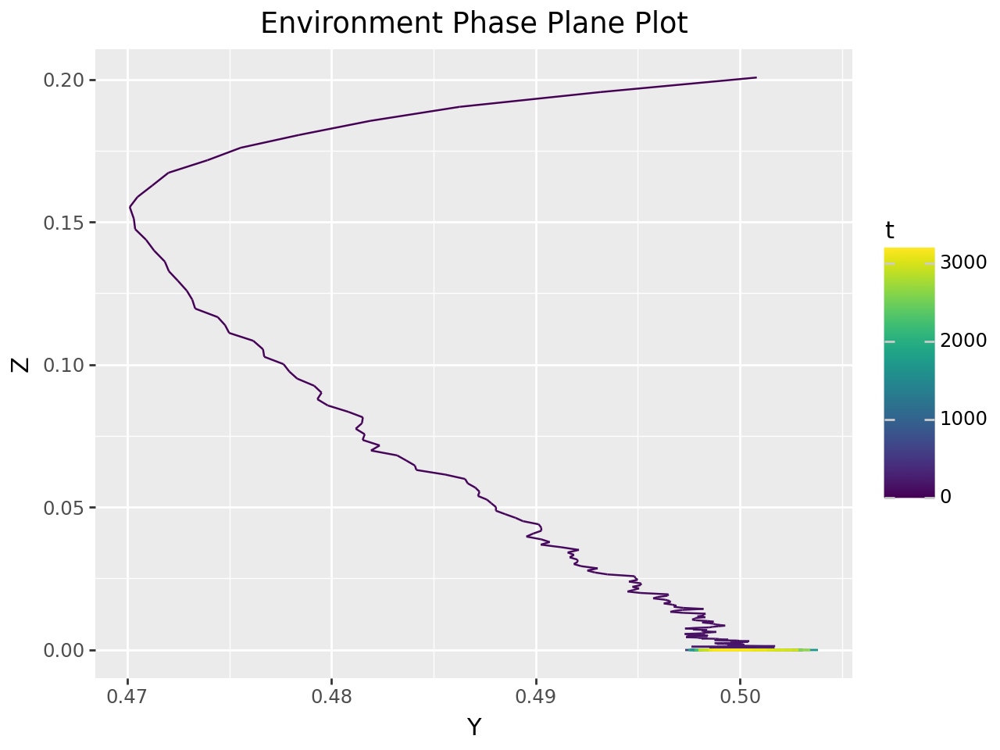

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.47
Lamprey Min Population: 0.47
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.51, Lamprey Velocity: 0.51


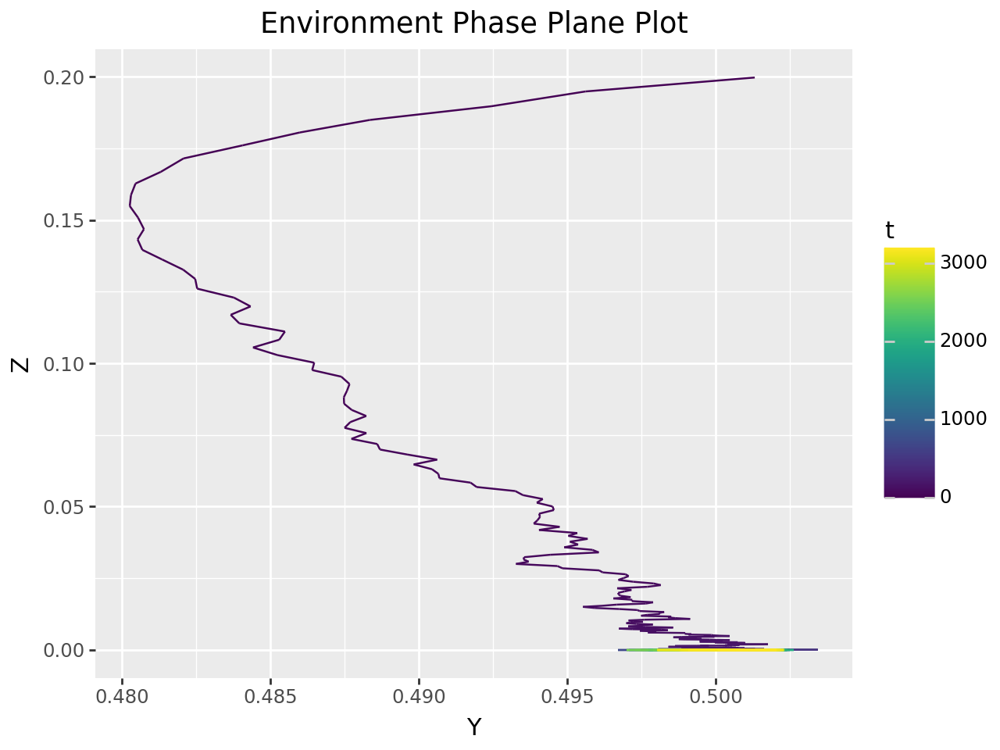

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.47
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.51, Lamprey Velocity: 0.76


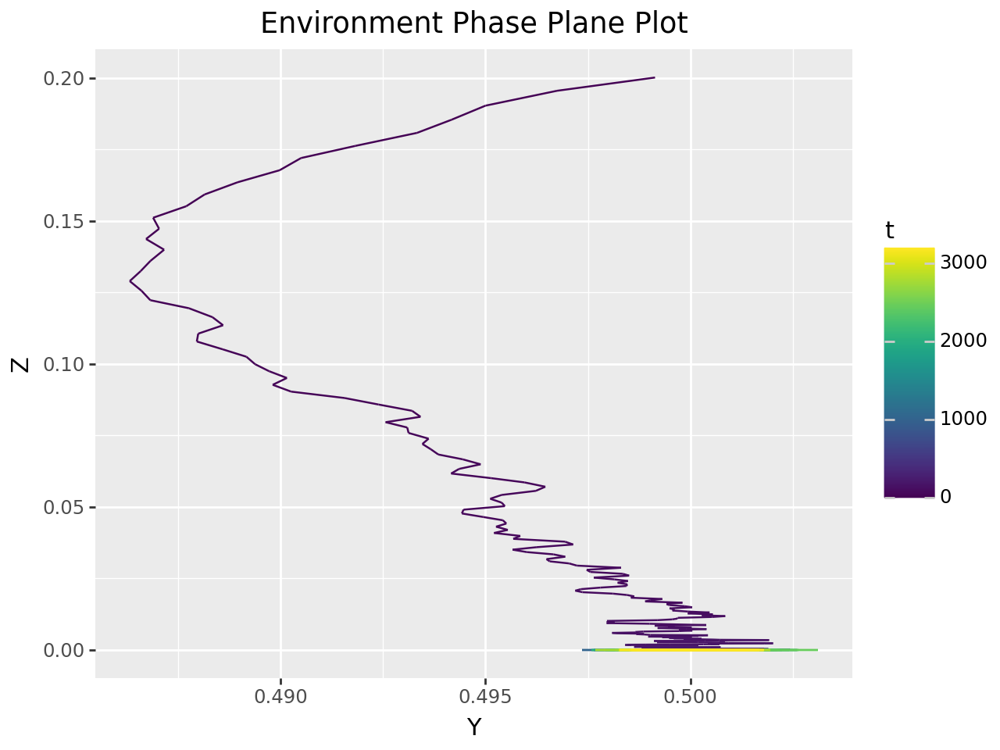

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.76, Lamprey Velocity: 0.010000000000000009


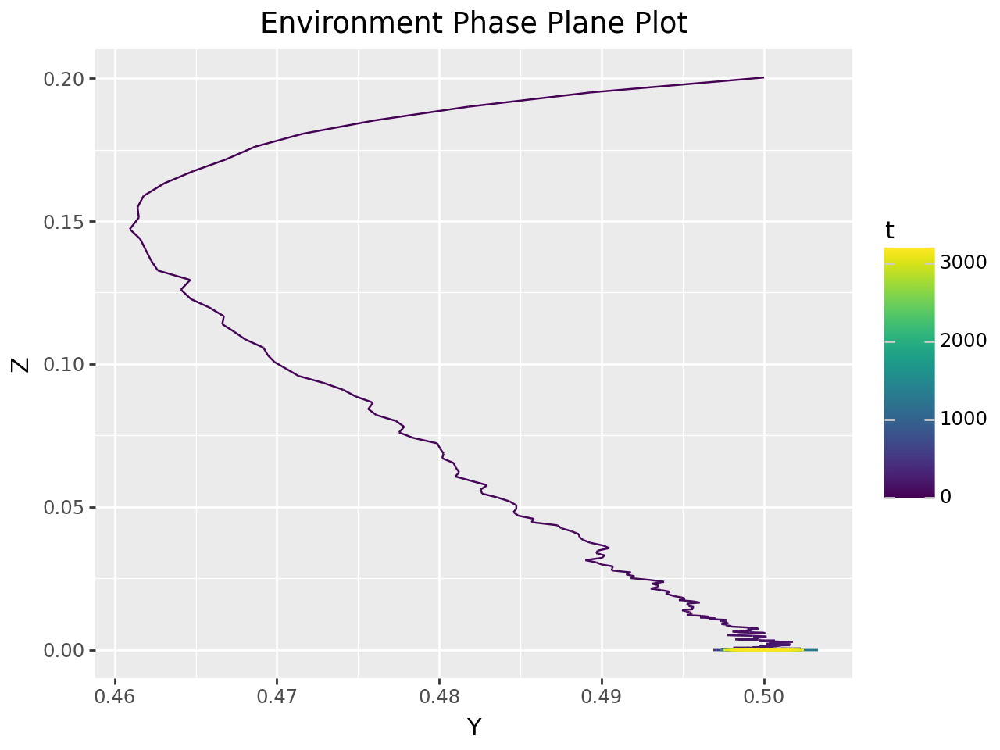

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.46
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.76, Lamprey Velocity: 0.26


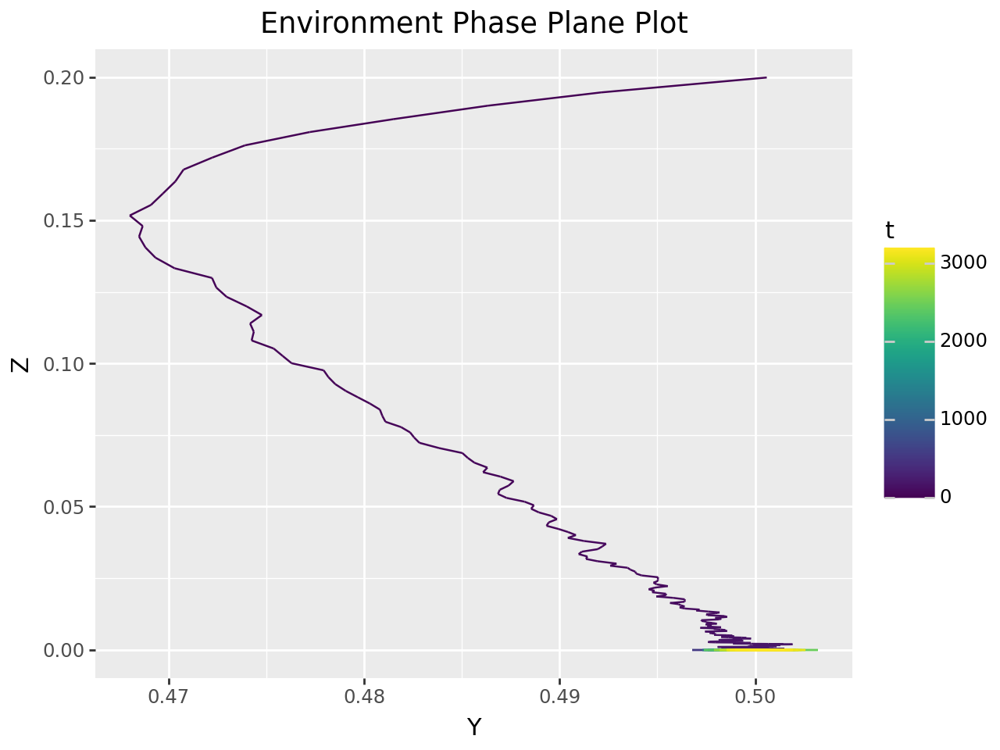

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.47
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.76, Lamprey Velocity: 0.51


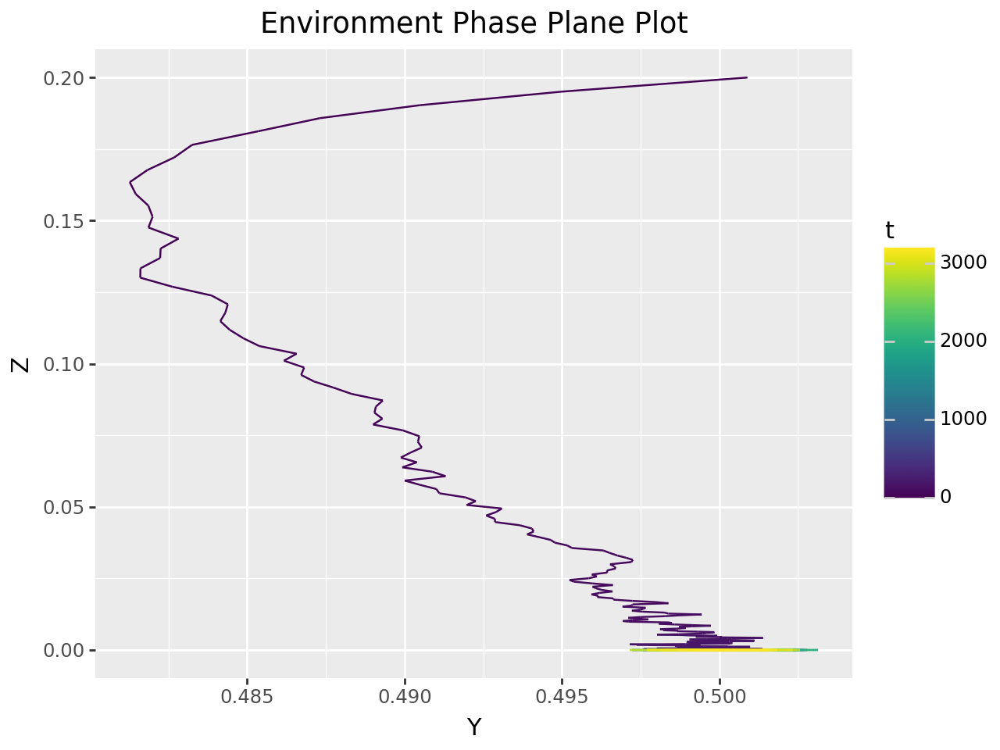

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.49
Lamprey Min Population: 0.48
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02



Salmon Velocity: 0.76, Lamprey Velocity: 0.76


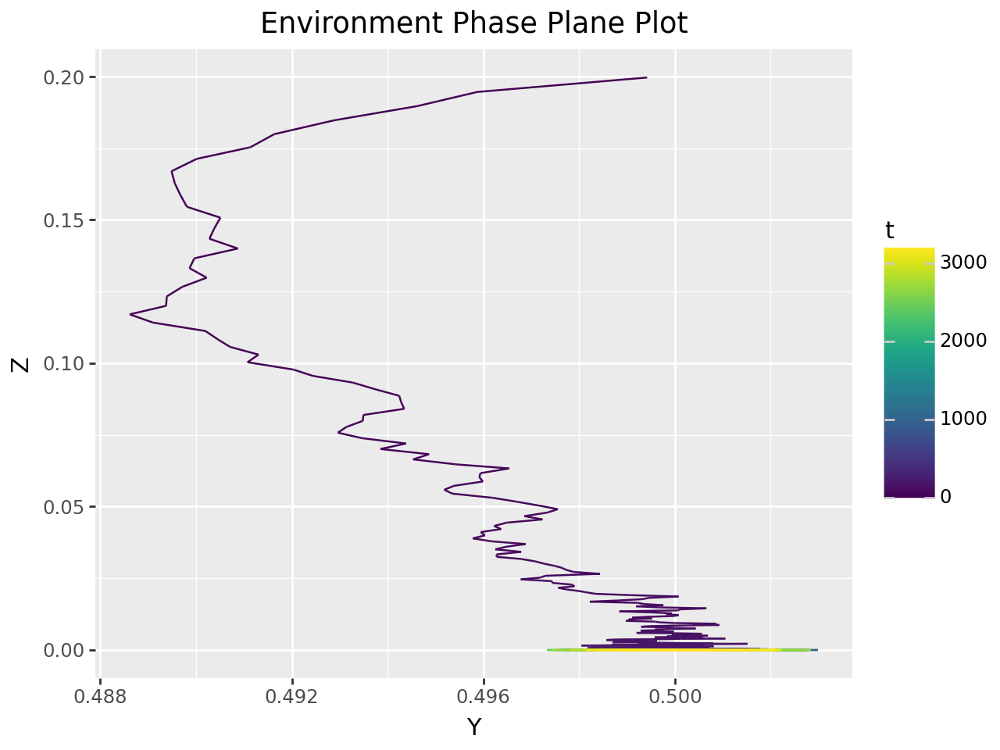

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.00

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.00

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.49
Pinniped Min Population: 0.00

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.02





In [ ]:
simulate_param_changes(n_timesteps, hv_increment_range, "v", high_alpha=False, plot_funcs=(False, True), focus=("X", "Y"))
simulate_param_changes(n_timesteps, hv_increment_range, "v", high_alpha=False, plot_funcs=(False, True), focus=("X", "Z"))
simulate_param_changes(n_timesteps, hv_increment_range, "v", high_alpha=False, plot_funcs=(False, True), focus=("Y", "Z"))